In [ ]:
!pip install dask-ml optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 148.7/148.7 kB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 404.2/404.2 kB 18.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.0/226.0 kB 22.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.0/81.0 kB 6.0 MB/s eta 0:00:00


In [ ]:
# pip install optuna
!pip install dask-ml
!pip install optuna
!pip install onnx

import sys
sys.path.append('/content/sample_data/ANN Regression/')



from Utilities import categorical_encoding

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 148.7/148.7 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.0/81.0 kB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 404.2/404.2 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.0/226.0 kB 30.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.6/14.6 MB 96.8 MB/s eta 0:00:00


In [ ]:
# import pandas as pd
from scipy.io import arff
import numpy as np

# Provide the full path to the file
file_path = "/content/sample_data/ANN Regression/pcs.npy"
inputs = file_path

# Load the file using np.load
# inputs = np.load(file_path)

inputs = np.load(file_path)

import scipy.io as sio


# Provide the full paths to the .mat files
file_path_k11 = "/content/sample_data/ANN Regression/k11.mat"
file_path_k22 = "/content/sample_data/ANN Regression/k22.mat"
file_path_k33 = "/content/sample_data/ANN Regression/k33.mat"

# Load the .mat files using sio.loadmat
k11 = sio.loadmat(file_path_k11)["k11"].reshape(3125, 1)
k22 = sio.loadmat(file_path_k22)["k22"].reshape(3125, 1)
k33 = sio.loadmat(file_path_k33)["k33"].reshape(3125, 1)

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
%cd /content/drive/My Drive/nas

/content/drive/My Drive/nas


In [ ]:

from Utilities import categorical_encoding
from Visualizations import parity_plot
from scipy.stats import shapiro, skew
from sklearn.metrics import r2_score, mean_absolute_percentage_error, mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import RobustScaler
from torch import nn
from torch.optim import Adam
from torch.optim.lr_scheduler import StepLR
from torch.utils.data import TensorDataset, DataLoader
from torch.utils.data.distributed import DistributedSampler
import inspect
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pickle
import psutil
import scipy.io as sio
import time
import torch.distributed as dist
import torch.multiprocessing as mp
import torch.nn.parallel
import torch
import logging
import datetime
import seaborn
from optuna import create_study
from optuna.samplers import TPESampler
import optuna
import dask.dataframe as dd

In [ ]:

class RegressionANN(nn.Module):
    def __init__(self, X, y, hidden_layers=None, dropout=None, activation_fn = nn.ReLU(), loss = "mse", epochs=2000, split_ratio=0.2,
                    split_random_state = None, batch_size=256, learning_rate=0.01, dr_basis = None,
                    large_dataset = False, steps_per_epoch = None,
                    load_filepath=None, cat_encoding='ohe', auto_optimize=[False, 10, 3600], use_batch_normalization=False,
                    use_early_stopping=True,
                    early_stopping = True, patience=500, use_lr_scheduler = True, hidden_activation = 'relu', weight_decay = 0.0001,
                    lr_step_size = 10, lr_gamma = 0.5,
                    use_scheduler = False, use_mlflow=False, use_gpu = False, num_workers = 8):
        super(RegressionANN, self).__init__()

        # Load model from file
        if load_filepath is not None:
            try:
                self.load_model(load_filepath)

                # Loading the dictionary for model results
                with open(load_filepath + '.pkl', 'rb') as filehandle:
                    model_results = pickle.load(filehandle)

                # Writing the attributes to the RegressionANN instance
                for i in model_results.keys():
                    setattr(self, i, model_results[i])
            except Exception as  e:
                logging.error("Failed to load the model from {}. Error: {}".format(load_filepath, e))
            return

        activation_mapping = {
                            'relu': nn.ReLU(),
                            'leaky_relu': nn.LeakyReLU(negative_slope=0.01),  # You can adjust the negative_slope as needed
                            'tanh': nn.Tanh()
                        }
        self.X = X
        self.y = y
        self.epochs = epochs
        # self.regularization = regularization
        self.weight_decay = weight_decay
        self.early_stopping = early_stopping
        self.patience = patience
        # self.min_delta = min_delta
        self.use_lr_scheduler = use_lr_scheduler
        self.lr_step_size = lr_step_size
        self.lr_gamma = lr_gamma
        self.learning_rate = learning_rate
        self.batch_size = batch_size
        self.large_dataset = X.shape[0] > 100000
        self.ml_method = 'ANN'
        self.split_ratio = split_ratio
        self.dropout = dropout
        self.dr_basis = dr_basis
        self.auto_optimize = auto_optimize
        self.use_batch_normalization = use_batch_normalization
        self.use_early_stopping = use_early_stopping
        self.use_scheduler = use_scheduler

        self.use_mlflow = use_mlflow
        self.use_gpu = use_gpu
        self.num_workers = num_workers
        self.activation_fn = activation_fn
        # Determine the activation function for hidden layers
        self.hidden_activation_fn = activation_mapping.get(hidden_activation, nn.ReLU())

        self.world_size = torch.cuda.device_count()
        self.scaler = RobustScaler()
        self.num_workers = num_workers
        self.patience = 50 if self.large_dataset else 500
        self.initialize_device()


        # Placeholder attributes for predicted values and residuals
        self.yh_train = None
        self.yh_test = None
        self.yh_cv = None
        self.Res_train = None
        self.Res_test = None
        self.Res_CV = None


        #placeholder attributes for model performance metrics
        self.R2_train = 0
        self.SSE_train = 0
        self.MAE_train = 0
        self.MSE_train = 0
        self.RMSE_train = 0
        self.PE_train = 0

        self.R2_test = 0
        self.SSE_test = 0
        self.MAE_test = 0
        self.MSE_test = 0
        self.RMSE_test = 0
        self.PE_test = 0

        # Adding feature names to the model instance
        if isinstance(X, (pd.DataFrame, dd.DataFrame)):
            self.feature_names = X.columns
        else:
            self.feature_names = ['Feature ' + str(i) for i in np.arange(X.shape[1]) + 1]

        from Utilities import categorical_encoding
        # Encoding for categorical variables
        if isinstance(X, pd.DataFrame):

            # Extracting categorical variables
            cat_var_names = X.select_dtypes(['object', 'category']).columns.to_list()

            if cat_var_names.__len__() > 0:

                # Writing categorical encoding variables as attributes
                self.cat_var_names = cat_var_names
                self.cat_encoding = cat_encoding

                # One-hot encoding case
                if cat_encoding == 'ohe':

                    X, self.cat_encoding_info = categorical_encoding(X.copy(), self.cat_var_names, None,                                                                      cat_encoding = self.cat_encoding)
                    self.encoded_feature_names = X.columns

                # Mean encoding case
                elif cat_encoding == 'me':
                    X, self.cat_encoding_info = categorical_encoding(X.copy().assign(**{y.name: y.values}),                                                                      self.cat_var_names, y.name,                                                                      cat_encoding = self.cat_encoding)
                    y = X[y.name]
                    X = X.drop(y.name, axis = 1)

                # Raising error if an invalid option for cat_encoding is entered
                else:
                    raise ValueError('cat_encoding parameter must be either "ohe" or "me".')

        # Adding output name to the model instance
        if isinstance(y, (pd.Series, dd.Series)):
            self.output_name = y.name
        else:
            self.output_name = 'Output'

        # Updating the X array to appropriate type of dataframe
        if self.large_dataset and isinstance(X, dd.DataFrame):
            X = X.to_dask_array(lengths = True)
            y = y.to_dask_array(lengths = True)
        elif not self.large_dataset and isinstance(X, np.ndarray):
            X = pd.DataFrame(X, columns = self.feature_names)
            y = pd.Series(y, name = self.output_name)


        #Determine the output dimension
        output_dim = 1 if len(y.shape) == 1 else self.y.shape[1]
        self.output_dim = output_dim

        # Determine the activation function
        #logging.info("Determining activation function...")
        #if activation_fn is None:
        #    if cat_encoding == 'ohe':
         #       if output_dim == 1:
          #          self.activation_fn = nn.Sigmoid()
           #     else:
            #        self.activation_fn = nn.Softmax(dim=1)
            #else:
             #   self.activation_fn = nn.ReLU()
        #else:
         #   self.activation_fn = activation_fn

        #normalize input data
        logging.info("Normalizing input data...")
        if self.dr_basis is not None:
             X = self.dr_basis.transform(X)
        else:
            X = self.scaler.fit_transform(X)
        self.X = torch.tensor(X, dtype=torch.float32)
        self.y = torch.tensor(y.values, dtype=torch.float32)
        self.train_loss_history = []
        self.val_loss_history = []

        # Determine the activation function
        logging.info("Determining activation function...")
        if activation_fn is None:
            if cat_encoding == 'ohe':
                if output_dim == 1:
                    self.activation_fn = nn.Sigmoid()
                else:
                    self.activation_fn = nn.Softmax(dim=1)
            else:
                self.activation_fn = nn.ReLU()
        else:
            self.activation_fn = activation_fn

        logging.info("Creating hidden layers...")

        #Case for user not defining hidden layers
        if hidden_layers is None:
            Ni = X.shape[1]  # Number of input neurons
            No = output_dim  # Number of output neurons
            Nh = int((Ni + No) / 2)  # Number of hidden neurons
            min_layer_size = 2  # Minimum number of neurons in a hidden layer

            hidden_layers = []
            layer_size = Nh
            while layer_size > min_layer_size and len(hidden_layers) < 5:
                hidden_layers.append(layer_size)
                layer_size = max(layer_size // 2, min_layer_size)

        #Defining the model architecture
        if use_batch_normalization:
            self.hidden_layers = nn.Sequential()
            input_dim = X.shape[1]
            for i, hidden_layer in enumerate(hidden_layers):
                self.hidden_layers.add_module(f'layer_{i}', nn.Linear(input_dim, hidden_layer))
                self.hidden_layers.add_module(f'batchnorm_{i}', nn.BatchNorm1d(hidden_layer))  # Add Batch Normalization
                self.hidden_layers.add_module(f'relu_{i}', self.hidden_activation_fn)
                if dropout is not None:
                    self.hidden_layers.add_module(f'dropout_{i}', nn.Dropout(dropout))
                input_dim = hidden_layer

            # Removed batch normalization from the output layer
            if output_dim == 1:
                self.out_layers = nn.Linear(input_dim, 1)  # Single output layer without Batch Normalization
            else:
                self.out_layers = nn.ModuleList([nn.Linear(input_dim, 1) for _ in range(output_dim)])  # Multi-output layers without Batch Normalization
        else:
            self.hidden_layers = nn.Sequential()
            input_dim = X.shape[1]

            for i, hidden_layer in enumerate(hidden_layers):
                self.hidden_layers.add_module(f'layer_{i}', nn.Linear(input_dim, hidden_layer))
                self.hidden_layers.add_module(f'relu_{i}', self.hidden_activation_fn)
                if dropout is not None:
                    self.hidden_layers.add_module(f'dropout_{i}', nn.Dropout(dropout))
                input_dim = hidden_layer
            if output_dim == 1:
                self.out_layers = nn.Linear(input_dim, 1)  # Single output layer without Batch Normalization
            else:
                self.out_layers = nn.ModuleList([nn.Linear(input_dim, 1) for _ in range(output_dim)])  # Multi-output layers without Batch Normalization

        self.out_layers = nn.ModuleList([nn.Linear(input_dim, 1) for _ in range(output_dim)])

        # Split dataset into train/test
        self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(self.X, self.y, test_size=split_ratio)


        self.train_loader = DataLoader(TensorDataset(self.X_train, self.y_train), batch_size=batch_size)
        self.test_loader = DataLoader(TensorDataset(self.X_test, self.y_test), batch_size=batch_size)

        self.optimizer = Adam(self.parameters(), learning_rate, weight_decay = self.weight_decay)
        self.scheduler = StepLR(self.optimizer, step_size=self.lr_step_size, gamma=self.lr_gamma)
        self.loss_fn = nn.L1Loss()

        # Determine the loss function based on user input
        if loss == "mae":
            self.loss_fn = nn.L1Loss()
        elif loss == "mse":
            self.loss_fn = nn.MSELoss()
        elif loss == "cross_entropy":
            self.loss_fn = nn.CrossEntropyLoss()
        else:
            raise ValueError(f"Unknown loss function: {loss}. Please choose either 'mae', 'mse', or 'cross_entropy'.")


    def tensor_to_dataframe(self, tensor_data):
        # Check if the data is a tensor
        if isinstance(tensor_data, torch.Tensor):
            return pd.DataFrame(tensor_data.cpu().numpy())
        else:
            # If it's already a DataFrame, return as-is
            return tensor_data

    # Determine if we should use GPU
    def should_use_gpu(self):
        # Check dataset size
        large_dataset = self.X.shape[0] > 10000  # This is a simple threshold and can be adjusted

        # Check model complexity (here we use number of layers as a proxy)
        num_layers = len(self.hidden_layers)
        complex_model = num_layers > 3  # Adjust this threshold as needed

        # Check batch size
        large_batch = self.batch_size > 128  # Adjust this threshold as needed

        # Combine checks
        if large_dataset and (complex_model or large_batch):
            return True
        else:
            return False

    def initialize_device(self):
        """Initialize the device (CPU or GPU)."""
        if self.use_gpu and torch.cuda.is_available():
            self.device = torch.device("cuda")
            logging.info(f"Using GPU: {torch.cuda.get_device_name(0)}")
        else:
            self.device = torch.device("cpu")
        self.to(self.device)

    def distributed_training_setup(self):
        """Set up distributed training if multiple GPUs are available."""
        if torch.cuda.device_count() > 1 and self.use_gpu:
            logging.info(f"Using {torch.cuda.device_count()} GPUs.")
            self = nn.DataParallel(self)
            # Distributed Training Initialization
            torch.cuda.set_device(self.local_rank)
            torch.distributed.init_process_group(backend="nccl")
            # Modify DataLoaders for distributed training
            self.train_sampler = DistributedSampler(self.train_loader.dataset)
            self.train_loader = DataLoader(TensorDataset(self.X_train, self.y_train), batch_size=self.batch_size, sampler=self.train_sampler, num_workers=self.num_workers)
            self.test_sampler = DistributedSampler(self.val_loader.dataset)
            self.val_loader = DataLoader(TensorDataset(self.x_val_fold, self.y_val_fold), batch_size=self.batch_size, sampler=self.test_sampler, num_workers=self.num_workers)
            self.model = nn.parallel.DistributedDataParallel(self)

    def train_step(self, data):

        x, y = data

        self.optimizer.zero_grad()
        y_pred = self(x)  # Forward pass

        # Compute the loss value
        if self.output_dim > 1:  # If multiple outputs, split y
            loss = sum([self.loss_fn(y_true_single, y_pred_single.view(-1, 1)) for y_pred_single, y_true_single in zip(y_pred, torch.split(y, split_size_or_sections=1, dim=1))])
        else:  # If single output, no need to split
            loss = self.loss_fn(y, y_pred.view(-1, 1))

        # Compute gradients
        loss.backward()
        # Update weights

        self.optimizer.step()



        # Compute our own metrics
        return {"loss": loss.item()}


    def forward(self, x):
        x = self.hidden_layers(x)
        outputs = [out_layer(x) for out_layer in self.out_layers]

        # If single output, return tensor directly instead of a list
        if len(outputs) == 1:
            return outputs[0]
        else:
            return outputs



    def fit_model(self, early_stopping=True, test_performance = True, patience=500):
        self.train()
        self.start_time = time.time()
        self.initial_cpu = psutil.cpu_percent(interval=None)
        global_min_val_loss = np.inf
        self.cuda = torch.cuda.is_available()
        self.patience = patience
        self.early_stopping = early_stopping
        self.patience = 50 if self.large_dataset else 500

        if self.cuda:
            self.initial_gpu = torch.cuda.memory_allocated()

        # Create a KFold object
        # kfold = KFold(np.abs(-X.shape[0] // self.batch_size))
        kfold =  KFold(n_splits=5, shuffle=True, random_state=42)

        min_val_loss = np.inf
        patience_counter = 0


        for fold, (train_indices, val_indices) in enumerate(kfold.split(self.X)):
            min_val_loss = np.inf
            patience_counter = 0
            # Generate batches from indices
            x_train_fold = self.X[train_indices]
            y_train_fold = self.y[train_indices]
            x_val_fold = self.X[val_indices]
            y_val_fold = self.y[val_indices]

            # Convert the data to DataLoader
            train_loader = DataLoader(TensorDataset(x_train_fold, y_train_fold), batch_size=self.batch_size)
            val_loader = DataLoader(TensorDataset(x_val_fold, y_val_fold), batch_size=self.batch_size)

            logging.info(f'Starting training for Fold {fold+1}/5')
            print(f'Starting training for Fold {fold+1}/5')


        self.train_losses = []  # List to store training losses for each epoch
        self.val_losses = []   # List to store validation losses for each epoch
        for epoch in range(self.epochs):

                total_loss = 0
                for x_batch, y_batch in train_loader:
                    result = self.train_step((x_batch, y_batch))
                    total_loss += result["loss"]
                if self.use_lr_scheduler:
                    self.scheduler.step()
                avg_train_loss = total_loss / len(train_loader)
                # validation
                total_val_loss = 0
                # Validation loop
                for x_val, y_val in val_loader:
                    y_val_pred = self.forward(x_val)
                    if isinstance(y_val_pred, list):  # Multiple outputs
                        y_val_batch_split = torch.split(y_val, 1, dim=1)
                        val_loss = sum([self.loss_fn(y_pred_single, y_true_single.view(-1, 1)) for y_pred_single, y_true_single in zip(y_val_pred, y_val_batch_split)])
                    else:  # Single output
                        val_loss = self.loss_fn(y_val_pred, y_val.squeeze().view(-1, 1))
                    total_val_loss += val_loss.item()


                avg_val_loss = total_val_loss / len(val_loader)

                # Save the average losses for each epoch
                if epoch >=100:  # Ignore the first loss value
                    self.train_loss_history.append(avg_train_loss)
                    self.val_loss_history.append(avg_val_loss)

                # Log every 100 epochs
                if epoch % 100 == 0:
                    print(f'Epoch {epoch+1}/{self.epochs}, Train Loss: {avg_train_loss}, Validation Loss: {avg_val_loss}')

                if self.early_stopping:
                    # check if validation loss has improved
                    if avg_val_loss < min_val_loss:
                        min_val_loss = avg_val_loss
                        patience_counter = 0
                        # save the best model
                        self.save_model("best_model")
                    else:
                        patience_counter += 1
                        # print(f'Validation loss has not improved, patience counter: {patience_counter}')

                    if patience_counter >= self.patience:
                        print("Early stopping triggered.")
                        break

        if min_val_loss < global_min_val_loss:
            global_min_val_loss = min_val_loss
            timestamp = datetime.datetime.now().strftime('%Y%m%d%H%M%S')
            self.save_model(f"./best_model_{timestamp}")

        metrics = self.evaluate()
        if test_performance:
            self.end_time = time.time()
            self.training_time = self.end_time - self.start_time
            self.average_cpu_usage = (psutil.cpu_percent(interval=None) - self.initial_cpu) / self.epochs


            fig, axs = plt.subplots(1, 2, figsize=(10, 5))  # Create a figure with two subplots

            # Plot the training loss
            axs[0].plot(self.train_loss_history)
            axs[0].set_title('Training Loss history')
            axs[0].set_xlabel('Epoch')
            axs[0].set_ylabel('Loss')

            # Plot the validation loss
            axs[1].plot(self.val_loss_history)
            axs[1].set_title('Validation Loss history')
            axs[1].set_xlabel('Epoch')
            axs[1].set_ylabel('Loss')

            plt.tight_layout()  # Ensure adequate spacing between subplots
            plt.show()

        return metrics

    #obj function for hyperparameter tuning
    # @staticmethod
    # def objective(trial, X, y):
    #     # Define the hyperparameters to tune
    #     hidden_layers = trial.suggest_int("hidden_layers", 1, 5)
    #     epochs = trial.suggest_int("epochs", 10, 20)
    #     batch_size = trial.suggest_int("batch_size", 500, 2000)
    #     learning_rate = trial.suggest_float("learning_rate", 1e-5, 1e-1, log=True)

    #     # Create and train the model
    #     model = RegressionANN(X, y, hidden_layers=[hidden_layers], epochs=epochs, batch_size=batch_size, learning_rate=learning_rate)
    #     model.fit_model()

    #     # Compute the objective we want to minimize
    #     metrics = model.evaluate(X, y)
    #     total_mse = 0
    #     for metric in metrics:
    #         mse, _, _, _ = metric
    #         total_mse += mse
    #     return total_mse

    def tensor_to_numpy(self, tensor):
        # Convert tensor to numpy array
        if isinstance(tensor, torch.Tensor):
            return tensor.detach().cpu().numpy()
        else:
            return tensor


    def compute_metrics(self, y_true, y_pred):
        # Convert PyTorch tensors to numpy arrays
        if isinstance(y_true, torch.Tensor):
            y_true = y_true.cpu().numpy()
        if isinstance(y_pred, torch.Tensor):
            y_pred = y_pred.cpu().numpy()

        residuals = y_true - y_pred
        SSE = np.sum(residuals ** 2)

        num_outputs = y_true.shape[1]

        # Compute average metrics
        average_metrics = {
            "R2": r2_score(y_true, y_pred, multioutput='uniform_average'),
            "RMSE": np.sqrt(mean_squared_error(y_true, y_pred, multioutput='uniform_average')),
            "MAE": mean_absolute_error(y_true, y_pred, multioutput='uniform_average'),
            "PE": mean_absolute_error(y_true, y_pred, multioutput='uniform_average') * 100 / np.abs(y_true).mean(),
            "Residuals": residuals,
            "SSE": SSE
        }

        # Compute individual metrics
        individual_metrics = []
        for output_idx in range(num_outputs):
            y_true_single = y_true[:, output_idx]
            y_pred_single = y_pred[:, output_idx]
            residuals_single = y_true_single - y_pred_single
            SSE_single = np.sum(residuals_single ** 2)
            metrics = {
                "R2": r2_score(y_true_single, y_pred_single),
                "RMSE": np.sqrt(mean_squared_error(y_true_single, y_pred_single)),
                "MAE": mean_absolute_error(y_true_single, y_pred_single),
                "PE": mean_absolute_error(y_true_single, y_pred_single) * 100 / np.abs(y_true_single).mean(),
                "Residuals": residuals_single,
                "SSE": SSE_single
            }
            individual_metrics.append(metrics)

        return average_metrics, individual_metrics


    def evaluate(self):
        # Get predictions for training and testing datasets
        y_train_pred = self.predict(self.X_train)
        y_test_pred = self.predict(self.X_test)

        # Compute average and individual metrics for training data
        train_metrics, train_metrics_individual = self.compute_metrics(self.y_train, y_train_pred)

        # Compute average and individual metrics for testing data
        test_metrics, test_metrics_individual = self.compute_metrics(self.y_test, y_test_pred)

        # Update the attributes for training performance metrics
        self.R2_train = train_metrics["R2"]
        self.RMSE_train = train_metrics["RMSE"]
        self.MAE_train = train_metrics["MAE"]
        self.PE_train = train_metrics["PE"]
        self.Res_train = train_metrics["Residuals"]
        self.SSE_train = train_metrics["SSE"]

        # Update the attributes for testing performance metrics
        self.R2_test = test_metrics["R2"]
        self.RMSE_test = test_metrics["RMSE"]
        self.MAE_test = test_metrics["MAE"]
        self.PE_test = test_metrics["PE"]
        self.Res_test = test_metrics["Residuals"]
        self.SSE_test = test_metrics["SSE"]

        return {
            "train": train_metrics,
            "train_individual": train_metrics_individual,
            "test": test_metrics,
            "test_individual": test_metrics_individual
        }


    def predict(self, X):
        if not isinstance(X, torch.Tensor):
            X = torch.tensor(X, dtype=torch.float32).to(self.device)
        self.eval()  # Set the model to eval mode
        with torch.no_grad():
            y_pred = self(X)
        if isinstance(y_pred, list):
            return np.hstack([pred.cpu().numpy() for pred in y_pred])
        else:
            return y_pred.cpu().numpy()



    def save_model(self, savepath):
        try:
            # Save model state
            torch.save({
                'model_state_dict': self.state_dict(),
                'hidden_layers': self.hidden_layers.state_dict(),
                'out_layers': [layer.state_dict() for layer in self.out_layers],
            }, savepath + '.pth')

            # Save scheduler state if it's used
            # if self.use_scheduler:
            #     torch.save(self.scheduler.state_dict(), savepath + '_scheduler.pt')
            user_gen_attr = [i for i in dir(self) if not callable(i) and not i.startswith('_') and                         not inspect.ismethod(getattr(self, i)) and i != 'ANN']

            model_results = {}
            for attr_name in ['epochs', 'learning_rate', 'batch_size', 'large_dataset', 'ml_method']:
                model_results[attr_name] = getattr(self, attr_name)
            with open(savepath +'.pkl', 'wb') as ann_model_file:
                pickle.dump(model_results, ann_model_file, protocol=pickle.HIGHEST_PROTOCOL)
        except Exception as e:
            logging.error("Failed to save the model to {}. Error: {}".format(savepath, e))
            raise e

    def load_model(self, load_filepath):
        with open(load_filepath + '.pkl', 'rb') as filehandle:
            model_results = pickle.load(filehandle)
        for i in model_results.keys():
            setattr(self, i, model_results[i])

    # Method for visualizing parity plot
    def parity_plot(self, split_type = 'cv', ax = None, interactive = True, fig_height = 5, dpi = 80,                     imageloc = None, fig = None, return_fig = False, thumbnail = False):

        params = {'ax': ax, 'fig': fig, 'interactive': interactive, 'fig_height': fig_height,                   'imageloc': imageloc, 'split_type': split_type, 'dpi': dpi, 'return_fig': return_fig,                   'thumbnail': thumbnail}

        if split_type == 'test':
            fig_out = parity_plot(self.Res_test + self.yh_test, self.yh_test, **params)
        elif split_type == 'training':
            fig_out = parity_plot(self.Res_train + self.yh_train, self.yh_train, **params)
        elif split_type == 'cv':
            fig_out = parity_plot(self.Res_CV + self.yh_CV, self.yh_CV, **params)

        # Return figure (for platform purposes)
        if return_fig:
            return fig_out

def plot_learning_curves(self):
    import matplotlib.pyplot as plt
    plt.figure(figsize=(10, 6))
    plt.plot(self.train_losses, label='Training Loss')
    plt.plot(self.val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Learning Curves')
    plt.legend()
    plt.grid(True)
    plt.show()



In [ ]:
from scipy.io import arff

# inputs = np.load("pcs.npy")

import scipy.io as sio

# load the .mat file
# k11 = sio.loadmat('k11.mat')["k11"].reshape(3125,1)
# k22 = sio.loadmat('k22.mat')["k22"].reshape(3125,1)
# k33 = sio.loadmat('k33.mat')["k33"].reshape(3125,1)

y1 = k11.flatten()
y2 = k22.flatten()
y3 = k33.flatten()

# Combine y1, y2, y3 into a single DataFrame
y = pd.DataFrame(data = np.array([y1, y2, y3]).T, columns=['y1', 'y2', 'y3'])

# Convert inputs to DataFrame
X = pd.DataFrame(data = inputs)

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2000, Train Loss: 2194.84599609375, Validation Loss: 2299.8095703125
Epoch 101/2000, Train Loss: 422.7408020019531, Validation Loss: 530.5736236572266
Epoch 201/2000, Train Loss: 422.09218139648436, Validation Loss: 529.94580078125
Epoch 301/2000, Train Loss: 422.0920715332031, Validation Loss: 529.9457397460938
Epoch 401/2000, Train Loss: 422.0920715332031, Validation Loss: 529.9457397460938
Epoch 501/2000, Train Loss: 422.0920715332031, Validation Loss: 529.9457397460938
Epoch 601/2000, Train Loss: 422.0920715332031, Validation Loss: 529.9457397460938
Epoch 701/2000, Train Loss: 422.0920715332031, Validation Loss: 529.9457397460938
Early stopping triggered.


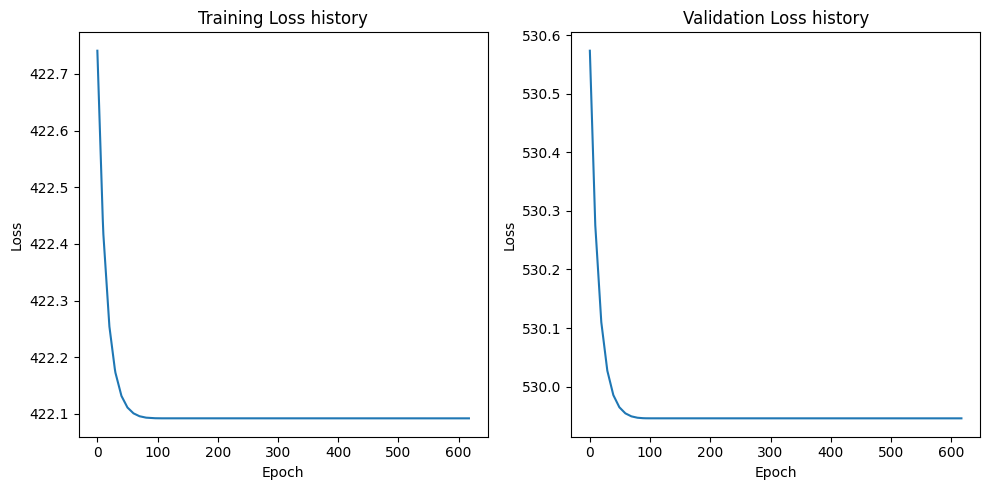

{'train': {'R2': -16.09568584534399, 'RMSE': 12.025696, 'MAE': 9.354205, 'PE': 37.31873470987281, 'Residuals': array([[ 22.021828  ,  18.490755  ,  11.013323  ],
       [  4.6170807 ,   6.43087   ,   1.4063101 ],
       [-10.62112   ,  -4.7975693 ,  -3.6768408 ],
       ...,
       [  5.97056   ,  -0.18974113,   1.0703125 ],
       [ -9.63789   ,  -5.325573  ,  -4.560033  ],
       [  0.7783737 ,   3.3840961 ,   0.4424572 ]], dtype=float32), 'SSE': 1084630.4}, 'train_individual': [{'R2': -21.539666910287494, 'RMSE': 14.220208, 'MAE': 11.777719, 'PE': 37.125805152361856, 'Residuals': array([ 22.021828 ,   4.6170807, -10.62112  , ...,   5.97056  ,
        -9.63789  ,   0.7783737], dtype=float32), 'SSE': 505535.8}, {'R2': -21.434291334034274, 'RMSE': 14.13386, 'MAE': 11.72458, 'PE': 37.00977104365752, 'Residuals': array([18.490755  ,  6.43087   , -4.7975693 , ..., -0.18974113,
       -5.325573  ,  3.3840961 ], dtype=float32), 'SSE': 499414.94}, {'R2': -5.313099250187069, 'RMSE': 5.64552, 

In [ ]:
model = RegressionANN(X, y, hidden_layers = [3, 3], epochs = 2000, batch_size = 500, learning_rate = 0.01)

metrics = model.fit_model()

# model.load_model("best_model")

# model.predict(X)
# metrics = model.evaluate()

print(metrics)

# model.fit_model()

# predictions = model.predict(X)

# metrics = model.evaluate(X, y)

# print(metrics)
# # Metrics for y1
# MSE_y1, MAPE_y1, PE_y1, R2_y1 = metrics[0]
# print(f"Metrics for y1: MSE={MSE_y1}, MAPE={MAPE_y1}, PE={PE_y1}, R2={R2_y1}")

# # Metrics for y2
# MSE_y2, MAPE_y2, PE_y2, R2_y2 = metrics[1]
# print(f"Metrics for y2: MSE={MSE_y2}, MAPE={MAPE_y2}, PE={PE_y2}, R2={R2_y2}")
# 3
# # Metrics for y3
# MSE_y3, MAPE_y3, PE_y3, R2_y3 = metrics[2]
# print(f"Metrics for y3: MSE={MSE_y3}, MAPE={MAPE_y3}, PE={PE_y3}, R2={R2_y3}")


In [ ]:
model.evaluate()

display('MAE of training set is {}'.format(model.MAE_train))
display('MAE of test set is {}'.format(model.MAE_test))
display('R2 of training set is {}'.format(model.R2_test))

'MAE of training set is 9.354205131530762'

'MAE of test set is 9.497200012207031'

'R2 of training set is -19.00026424705126'

[I 2023-10-11 07:08:54,457] A new study created in memory with name: no-name-821c21ea-91a3-4827-a460-720a22109c8b
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1927, Train Loss: 1017.7217681884765, Validation Loss: 1018.4380737304688
Epoch 101/1927, Train Loss: 889.5579055786133, Validation Loss: 907.66123046875
Epoch 201/1927, Train Loss: 889.4282791137696, Validation Loss: 907.5433837890625
Epoch 301/1927, Train Loss: 889.4282760620117, Validation Loss: 907.5433837890625
Epoch 401/1927, Train Loss: 889.4282760620117, Validation Loss: 907.5433837890625
Epoch 501/1927, Train Loss: 889.4282760620117, Validation Loss: 907.5433837890625
Epoch 601/1927, Train Loss: 889.4282760620117, Validation Loss: 907.5433837890625
Early stopping triggered.


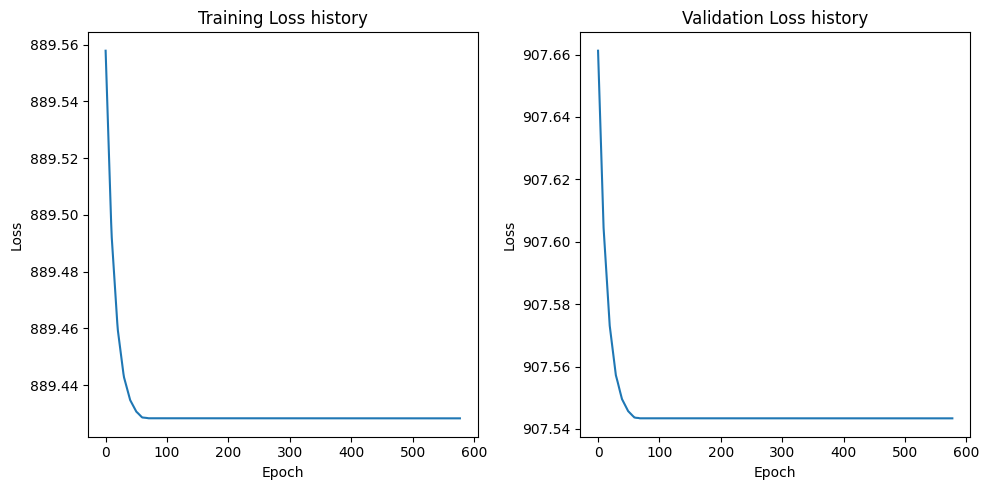

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1927, Train Loss: 1004.2408752441406, Validation Loss: 1006.0260620117188
Epoch 101/1927, Train Loss: 817.0008682250976, Validation Loss: 838.5610473632812
Epoch 201/1927, Train Loss: 816.8081436157227, Validation Loss: 838.3847534179688
Epoch 301/1927, Train Loss: 816.808137512207, Validation Loss: 838.3847534179688
Epoch 401/1927, Train Loss: 816.808137512207, Validation Loss: 838.3847534179688
Epoch 501/1927, Train Loss: 816.808137512207, Validation Loss: 838.3847534179688
Epoch 601/1927, Train Loss: 816.808137512207, Validation Loss: 838.3847534179688
Early stopping triggered.


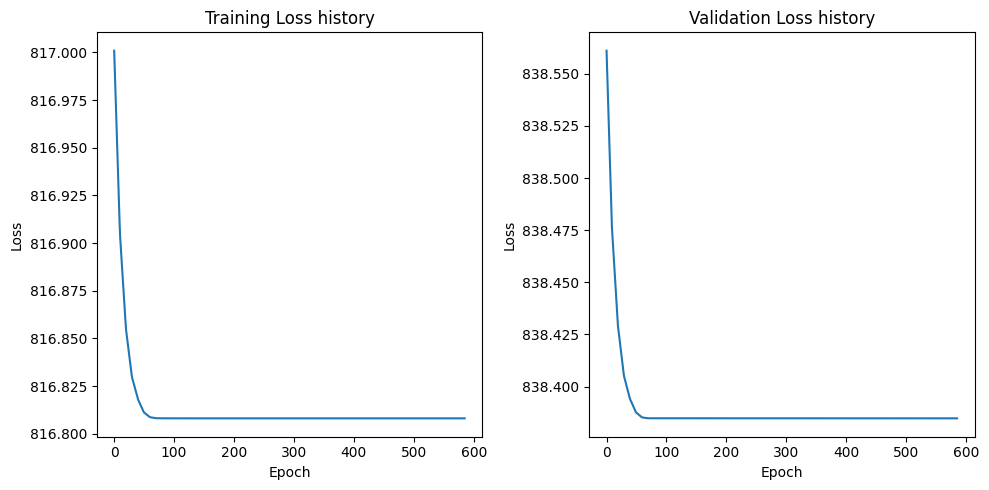

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1927, Train Loss: 156.52311820983886, Validation Loss: 157.79102478027343
Epoch 101/1927, Train Loss: 111.73027210235595, Validation Loss: 115.78379592895507
Epoch 201/1927, Train Loss: 111.68778018951416, Validation Loss: 115.74286804199218
Epoch 301/1927, Train Loss: 111.68778038024902, Validation Loss: 115.74286422729492
Epoch 401/1927, Train Loss: 111.68778038024902, Validation Loss: 115.74286422729492
Epoch 501/1927, Train Loss: 111.68778038024902, Validation Loss: 115.74286422729492
Epoch 601/1927, Train Loss: 111.68778038024902, Validation Loss: 115.74286422729492
Epoch 701/1927, Train Loss: 111.68778038024902, Validation Loss: 115.74286422729492
Early stopping triggered.


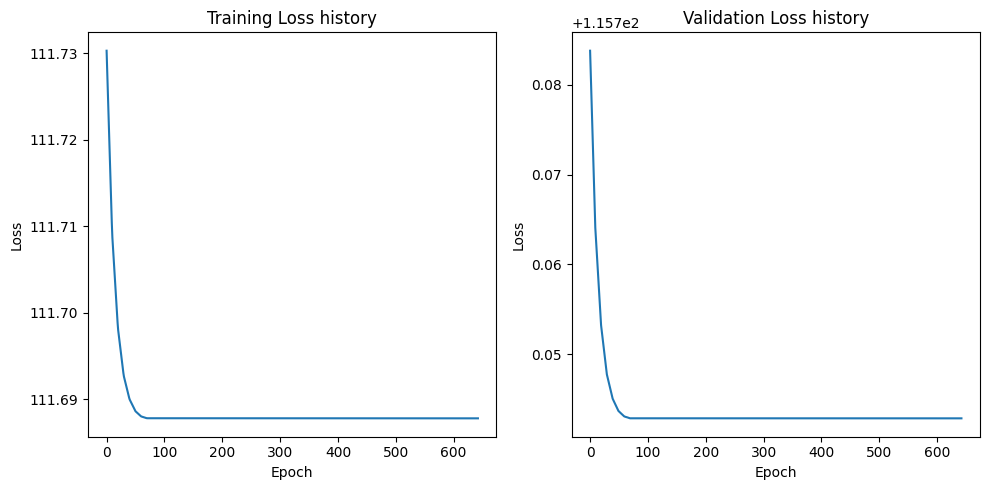

[I 2023-10-11 07:10:20,224] Trial 0 finished with value: 22.8510799407959 and parameters: {'hidden_layers': 5, 'epochs': 1927, 'batch_size': 129, 'learning_rate': 0.0006630551675136938}. Best is trial 0 with value: 22.8510799407959.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2658, Train Loss: 1004.5566345214844, Validation Loss: 1019.8446655273438
Epoch 101/2658, Train Loss: 988.9135314941407, Validation Loss: 1006.8663533528646
Epoch 201/2658, Train Loss: 988.8970336914062, Validation Loss: 1006.8526611328125
Epoch 301/2658, Train Loss: 988.8970336914062, Validation Loss: 1006.8526611328125
Epoch 401/2658, Train Loss: 988.8970336914062, Validation Loss: 1006.8526611328125
Epoch 501/2658, Train Loss: 988.8970336914062, Validation Loss: 1006.8526611328125
Epoch 601/2658, Train Loss: 988.8970336914062, Validation Loss: 1006.8526611328125
Early stopping triggered.


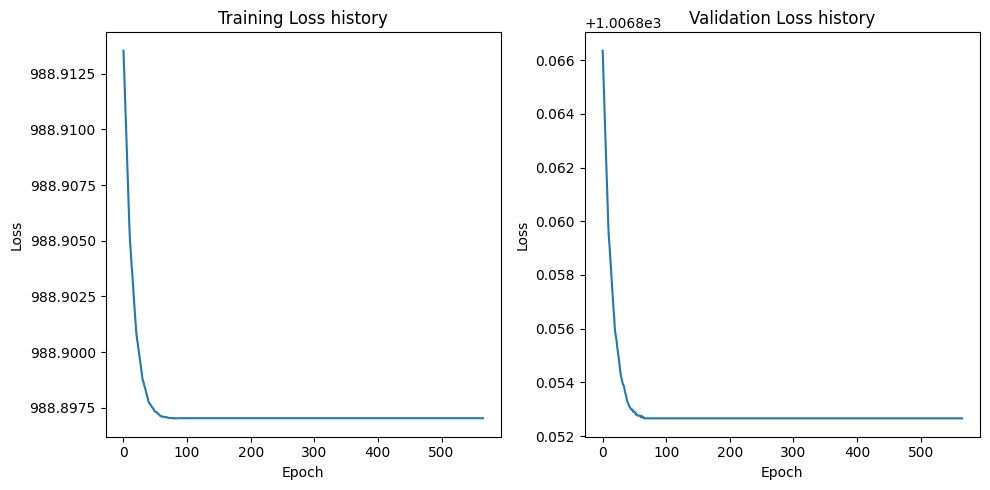

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2658, Train Loss: 1027.9307495117187, Validation Loss: 1042.7262573242188
Epoch 101/2658, Train Loss: 1007.24638671875, Validation Loss: 1025.3399454752605
Epoch 201/2658, Train Loss: 1007.2258911132812, Validation Loss: 1025.3225504557292
Epoch 301/2658, Train Loss: 1007.2258911132812, Validation Loss: 1025.3225504557292
Epoch 401/2658, Train Loss: 1007.2258911132812, Validation Loss: 1025.3225504557292
Epoch 501/2658, Train Loss: 1007.2258911132812, Validation Loss: 1025.3225504557292
Epoch 601/2658, Train Loss: 1007.2258911132812, Validation Loss: 1025.3225504557292
Early stopping triggered.


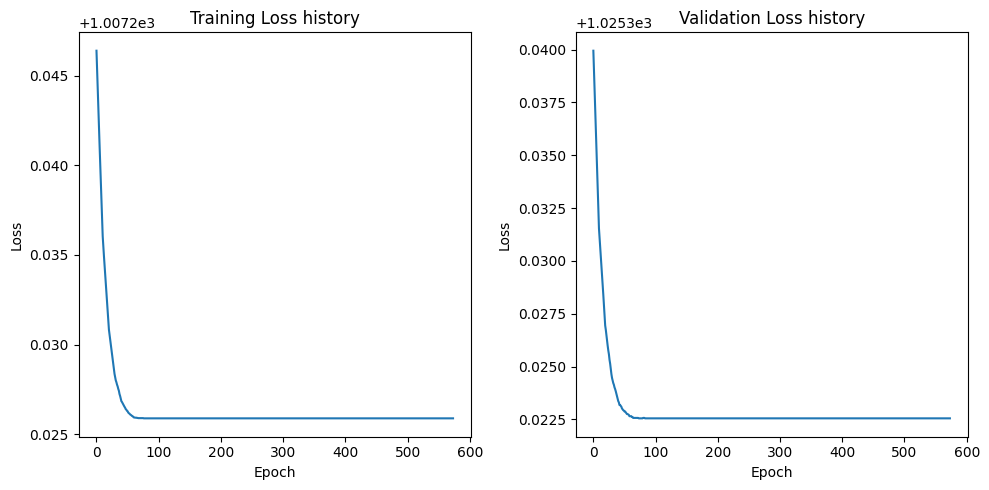

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2658, Train Loss: 142.48538818359376, Validation Loss: 144.81004587809244
Epoch 101/2658, Train Loss: 136.83607902526856, Validation Loss: 139.94508616129556
Epoch 201/2658, Train Loss: 136.8305934906006, Validation Loss: 139.94027709960938
Epoch 301/2658, Train Loss: 136.83059310913086, Validation Loss: 139.94027709960938
Epoch 401/2658, Train Loss: 136.83059310913086, Validation Loss: 139.94027709960938
Epoch 501/2658, Train Loss: 136.83059310913086, Validation Loss: 139.94027709960938
Epoch 601/2658, Train Loss: 136.83059310913086, Validation Loss: 139.94027709960938
Early stopping triggered.


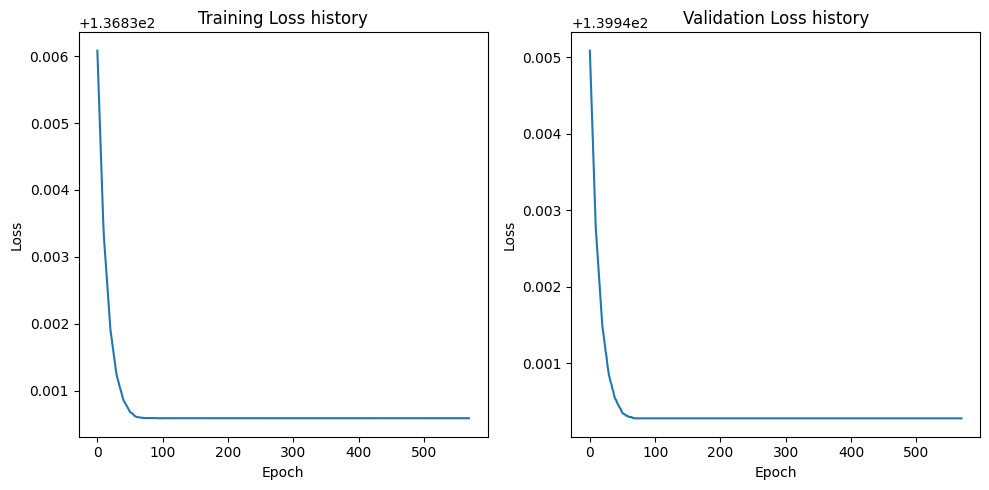

[I 2023-10-11 07:11:21,693] Trial 1 finished with value: 24.799623489379883 and parameters: {'hidden_layers': 5, 'epochs': 2658, 'batch_size': 275, 'learning_rate': 0.00024249397628145548}. Best is trial 0 with value: 22.8510799407959.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2729, Train Loss: 1059.6647216796875, Validation Loss: 1076.226318359375
Epoch 101/2729, Train Loss: 988.1764038085937, Validation Loss: 1018.9139404296875
Epoch 201/2729, Train Loss: 988.1149658203125, Validation Loss: 1018.8588256835938
Epoch 301/2729, Train Loss: 988.1149658203125, Validation Loss: 1018.8588256835938
Epoch 401/2729, Train Loss: 988.1149658203125, Validation Loss: 1018.8588256835938
Epoch 501/2729, Train Loss: 988.1149658203125, Validation Loss: 1018.8588256835938
Epoch 601/2729, Train Loss: 988.1149658203125, Validation Loss: 1018.8588256835938
Early stopping triggered.


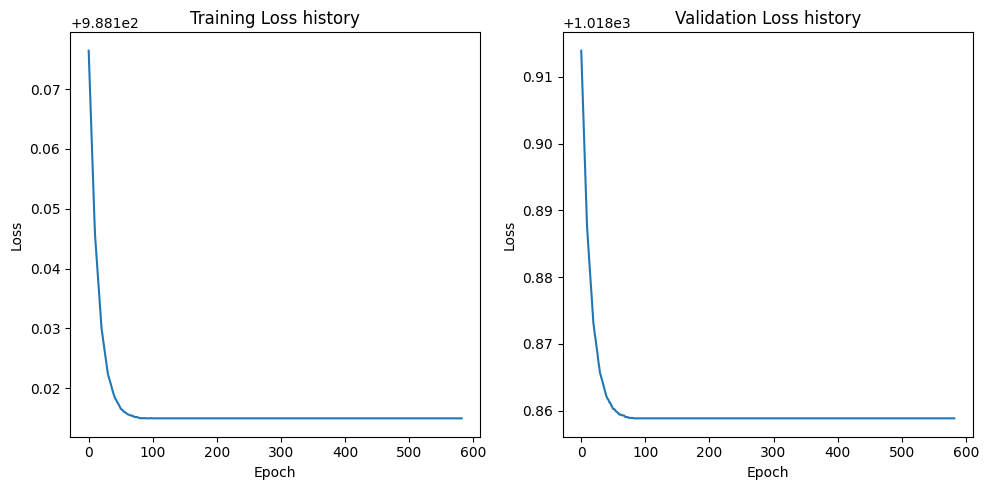

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2729, Train Loss: 1013.4477905273437, Validation Loss: 1036.7638549804688
Epoch 101/2729, Train Loss: 926.1028442382812, Validation Loss: 965.6098937988281
Epoch 201/2729, Train Loss: 925.9933715820313, Validation Loss: 965.519775390625
Epoch 301/2729, Train Loss: 925.9933715820313, Validation Loss: 965.519775390625
Epoch 401/2729, Train Loss: 925.9933715820313, Validation Loss: 965.519775390625
Epoch 501/2729, Train Loss: 925.9933715820313, Validation Loss: 965.519775390625
Epoch 601/2729, Train Loss: 925.9933715820313, Validation Loss: 965.519775390625
Early stopping triggered.


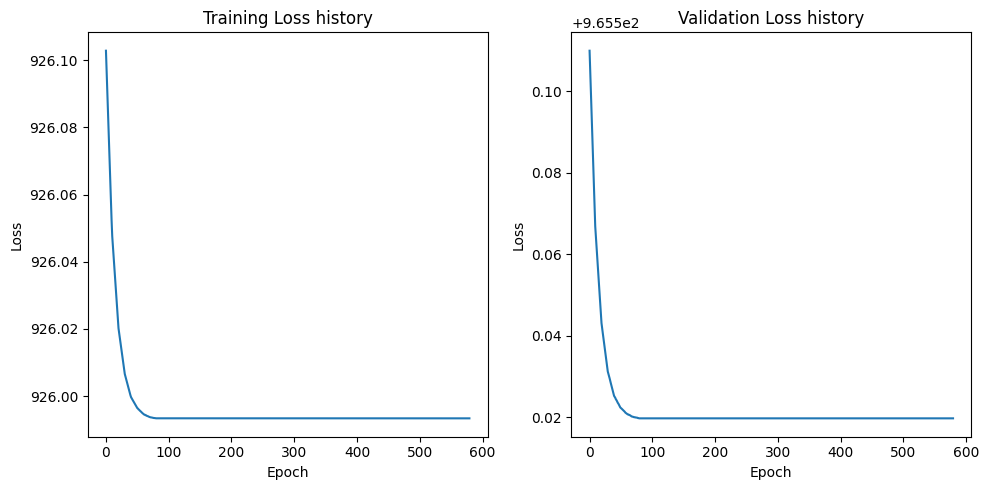

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2729, Train Loss: 144.18910369873046, Validation Loss: 144.2161407470703
Epoch 101/2729, Train Loss: 113.30139465332032, Validation Loss: 116.09871673583984
Epoch 201/2729, Train Loss: 113.26985397338868, Validation Loss: 116.06798934936523
Epoch 301/2729, Train Loss: 113.26985549926758, Validation Loss: 116.0679931640625
Epoch 401/2729, Train Loss: 113.26985549926758, Validation Loss: 116.0679931640625
Epoch 501/2729, Train Loss: 113.26985549926758, Validation Loss: 116.0679931640625
Epoch 601/2729, Train Loss: 113.26985549926758, Validation Loss: 116.0679931640625
Epoch 701/2729, Train Loss: 113.26985549926758, Validation Loss: 116.0679931640625
Early stopping triggered.


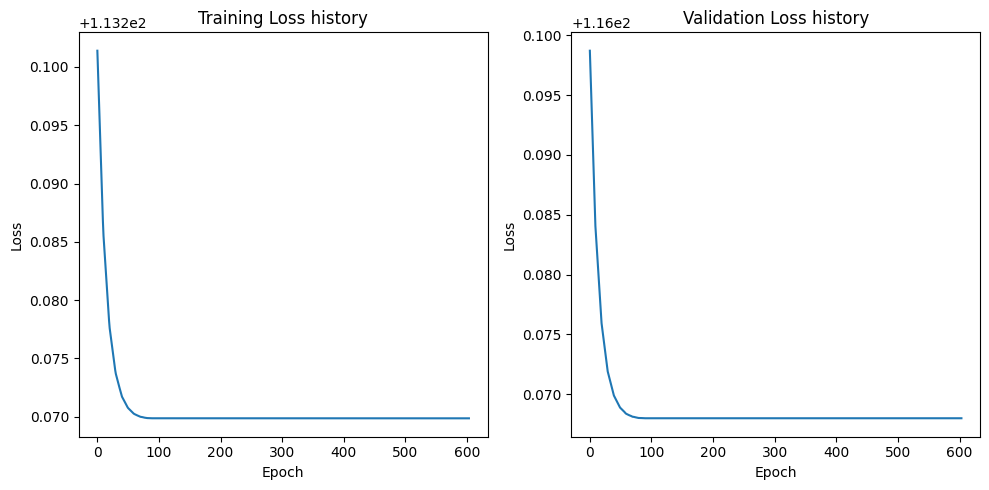

[I 2023-10-11 07:12:21,162] Trial 2 finished with value: 24.073007583618164 and parameters: {'hidden_layers': 4, 'epochs': 2729, 'batch_size': 559, 'learning_rate': 0.0015724157325942613}. Best is trial 0 with value: 22.8510799407959.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3015, Train Loss: 962.0954081217448, Validation Loss: 856.8139038085938
Epoch 101/3015, Train Loss: 17.389482975006104, Validation Loss: 49.3062162399292
Epoch 201/3015, Train Loss: 17.33166726430257, Validation Loss: 49.2150297164917
Epoch 301/3015, Train Loss: 17.33165740966797, Validation Loss: 49.21501064300537
Epoch 401/3015, Train Loss: 17.33165740966797, Validation Loss: 49.21501064300537
Epoch 501/3015, Train Loss: 17.33165740966797, Validation Loss: 49.21501064300537
Epoch 601/3015, Train Loss: 17.33165740966797, Validation Loss: 49.21501064300537
Epoch 701/3015, Train Loss: 17.33165740966797, Validation Loss: 49.21501064300537
Early stopping triggered.


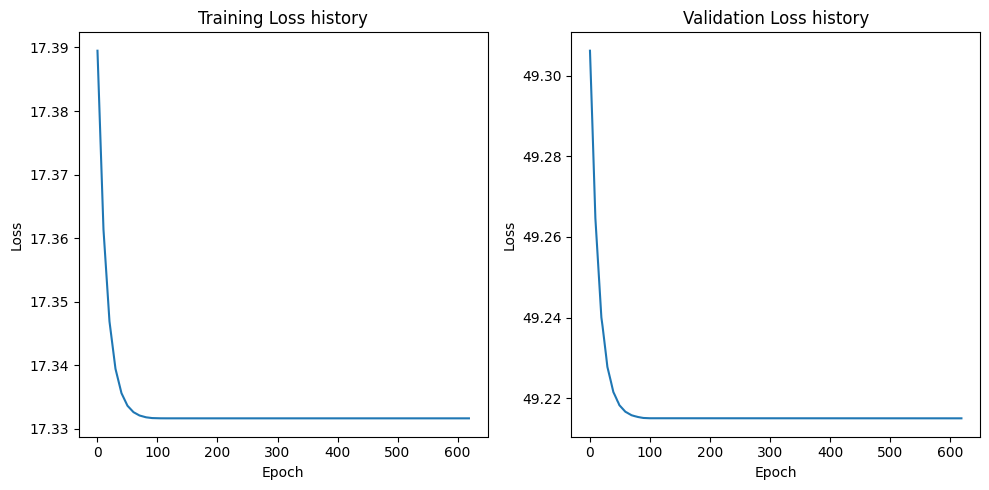

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3015, Train Loss: 997.843739827474, Validation Loss: 926.4264831542969
Epoch 101/3015, Train Loss: 19.87301762898763, Validation Loss: 50.54138660430908
Epoch 201/3015, Train Loss: 19.823114077250164, Validation Loss: 50.46520709991455
Epoch 301/3015, Train Loss: 19.82310422261556, Validation Loss: 50.46519470214844
Epoch 401/3015, Train Loss: 19.82310422261556, Validation Loss: 50.46519470214844
Epoch 501/3015, Train Loss: 19.82310422261556, Validation Loss: 50.46519470214844
Epoch 601/3015, Train Loss: 19.82310422261556, Validation Loss: 50.46519470214844
Epoch 701/3015, Train Loss: 19.82310422261556, Validation Loss: 50.46519470214844
Early stopping triggered.


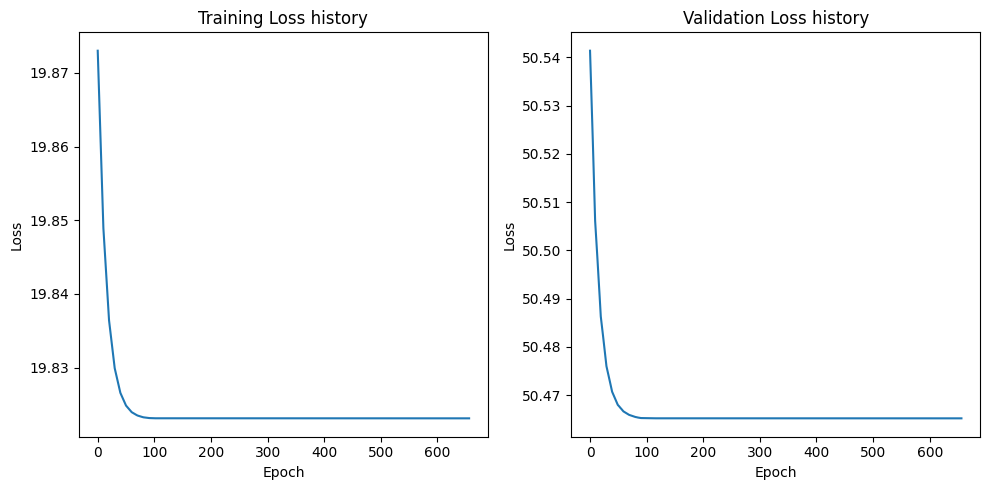

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3015, Train Loss: 144.14029947916666, Validation Loss: 115.46158218383789
Epoch 101/3015, Train Loss: 1.7181857625643413, Validation Loss: 5.047696471214294
Epoch 201/3015, Train Loss: 1.7124618490537007, Validation Loss: 5.037251591682434
Epoch 301/3015, Train Loss: 1.7124600609143574, Validation Loss: 5.037248373031616
Epoch 401/3015, Train Loss: 1.7124600609143574, Validation Loss: 5.037248373031616
Epoch 501/3015, Train Loss: 1.7124600609143574, Validation Loss: 5.037248373031616
Epoch 601/3015, Train Loss: 1.7124600609143574, Validation Loss: 5.037248373031616
Epoch 701/3015, Train Loss: 1.7124600609143574, Validation Loss: 5.037248373031616
Early stopping triggered.


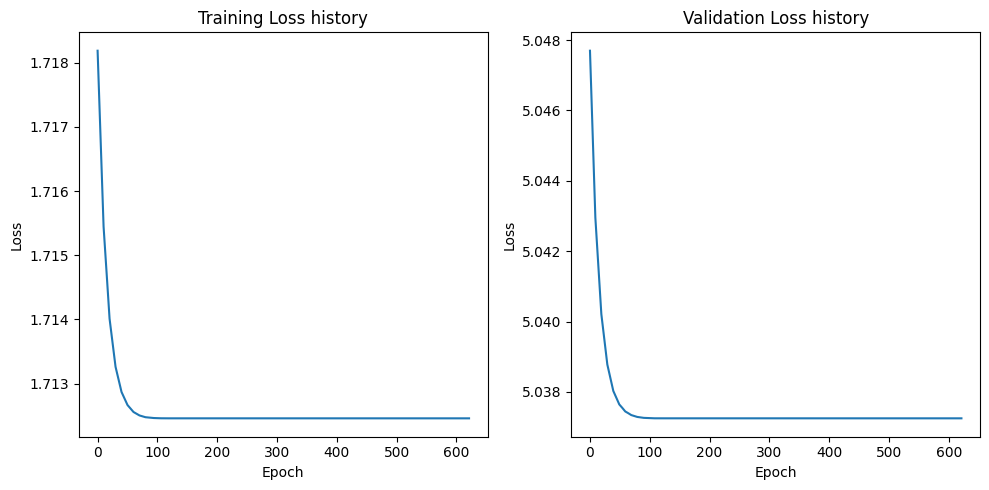

[I 2023-10-11 07:13:21,331] Trial 3 finished with value: 4.1183552742004395 and parameters: {'hidden_layers': 4, 'epochs': 3015, 'batch_size': 449, 'learning_rate': 0.07383815549566139}. Best is trial 3 with value: 4.1183552742004395.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1809, Train Loss: 948.5022390265214, Validation Loss: 850.9704223632813
Epoch 101/1809, Train Loss: 14.042808080974378, Validation Loss: 43.00680351257324
Epoch 201/1809, Train Loss: 14.001645038002415, Validation Loss: 42.95114307403564
Epoch 301/1809, Train Loss: 14.001642252269544, Validation Loss: 42.95113906860352
Epoch 401/1809, Train Loss: 14.001642252269544, Validation Loss: 42.95113906860352
Epoch 501/1809, Train Loss: 14.001642252269544, Validation Loss: 42.95113906860352
Epoch 601/1809, Train Loss: 14.001642252269544, Validation Loss: 42.95113906860352
Epoch 701/1809, Train Loss: 14.001642252269544, Validation Loss: 42.95113906860352
Early stopping triggered.


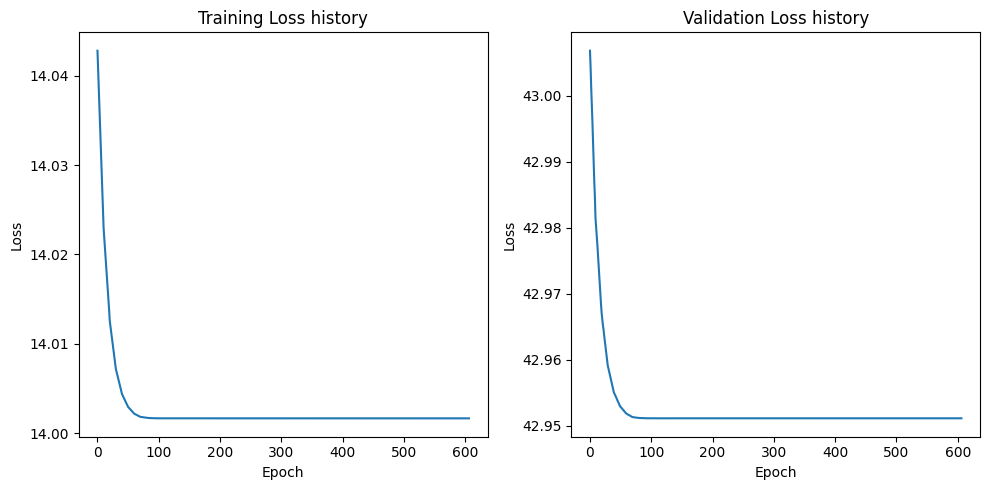

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1809, Train Loss: 979.2465884560033, Validation Loss: 907.0676879882812
Epoch 101/1809, Train Loss: 12.89098370702643, Validation Loss: 37.565328216552736
Epoch 201/1809, Train Loss: 12.848721077567653, Validation Loss: 37.49378852844238
Epoch 301/1809, Train Loss: 12.848717463643927, Validation Loss: 37.49377212524414
Epoch 401/1809, Train Loss: 12.848717463643927, Validation Loss: 37.49377212524414
Epoch 501/1809, Train Loss: 12.848717463643927, Validation Loss: 37.49377212524414
Epoch 601/1809, Train Loss: 12.848717463643927, Validation Loss: 37.49377212524414
Epoch 701/1809, Train Loss: 12.848717463643927, Validation Loss: 37.49377212524414
Early stopping triggered.


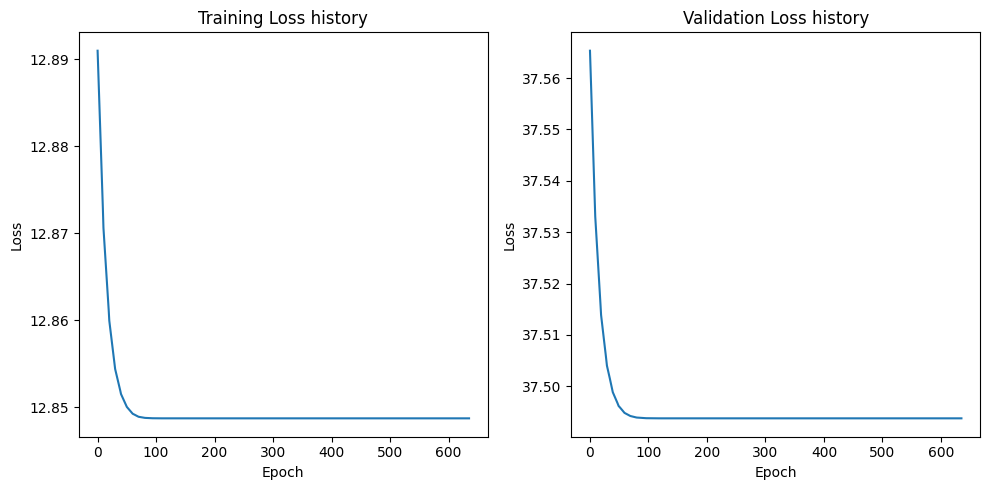

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1809, Train Loss: 134.45528050472862, Validation Loss: 112.77842788696289
Epoch 101/1809, Train Loss: 1.2345607641496157, Validation Loss: 4.606325078010559
Epoch 201/1809, Train Loss: 1.226616947274459, Validation Loss: 4.588087487220764
Epoch 301/1809, Train Loss: 1.2266160092855756, Validation Loss: 4.588085603713989
Epoch 401/1809, Train Loss: 1.2266160092855756, Validation Loss: 4.588085603713989
Epoch 501/1809, Train Loss: 1.2266160092855756, Validation Loss: 4.588085603713989
Epoch 601/1809, Train Loss: 1.2266160092855756, Validation Loss: 4.588085603713989
Epoch 701/1809, Train Loss: 1.2266160092855756, Validation Loss: 4.588085603713989
Early stopping triggered.


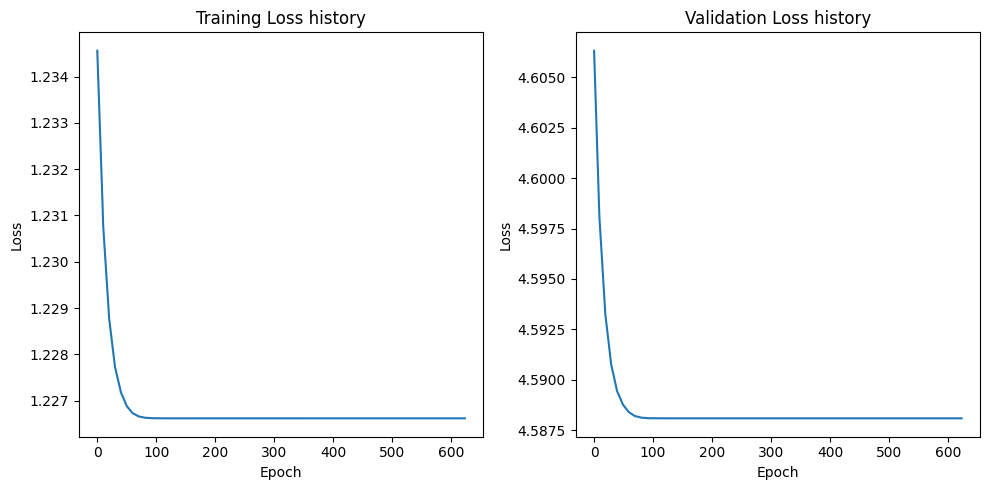

[I 2023-10-11 07:14:50,520] Trial 4 finished with value: 3.7518374919891357 and parameters: {'hidden_layers': 5, 'epochs': 1809, 'batch_size': 136, 'learning_rate': 0.014290088634343346}. Best is trial 4 with value: 3.7518374919891357.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3416, Train Loss: 992.0837158203125, Validation Loss: 1044.0705871582031
Epoch 101/3416, Train Loss: 967.3107543945313, Validation Loss: 1022.2133178710938
Epoch 201/3416, Train Loss: 967.2838745117188, Validation Loss: 1022.1897583007812
Epoch 301/3416, Train Loss: 967.2838745117188, Validation Loss: 1022.1897583007812
Epoch 401/3416, Train Loss: 967.2838745117188, Validation Loss: 1022.1897583007812
Epoch 501/3416, Train Loss: 967.2838745117188, Validation Loss: 1022.1897583007812
Epoch 601/3416, Train Loss: 967.2838745117188, Validation Loss: 1022.1897583007812
Early stopping triggered.


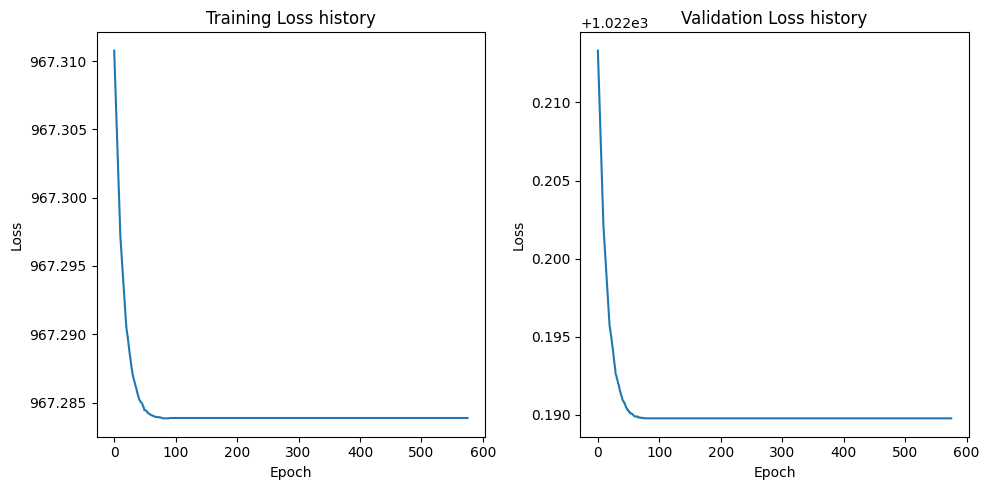

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3416, Train Loss: 967.7452392578125, Validation Loss: 1016.8975830078125
Epoch 101/3416, Train Loss: 954.7672485351562, Validation Loss: 1005.6286010742188
Epoch 201/3416, Train Loss: 954.7522583007812, Validation Loss: 1005.6158752441406
Epoch 301/3416, Train Loss: 954.7522583007812, Validation Loss: 1005.6158752441406
Epoch 401/3416, Train Loss: 954.7522583007812, Validation Loss: 1005.6158752441406
Epoch 501/3416, Train Loss: 954.7522583007812, Validation Loss: 1005.6158752441406
Epoch 601/3416, Train Loss: 954.7522583007812, Validation Loss: 1005.6158752441406
Early stopping triggered.


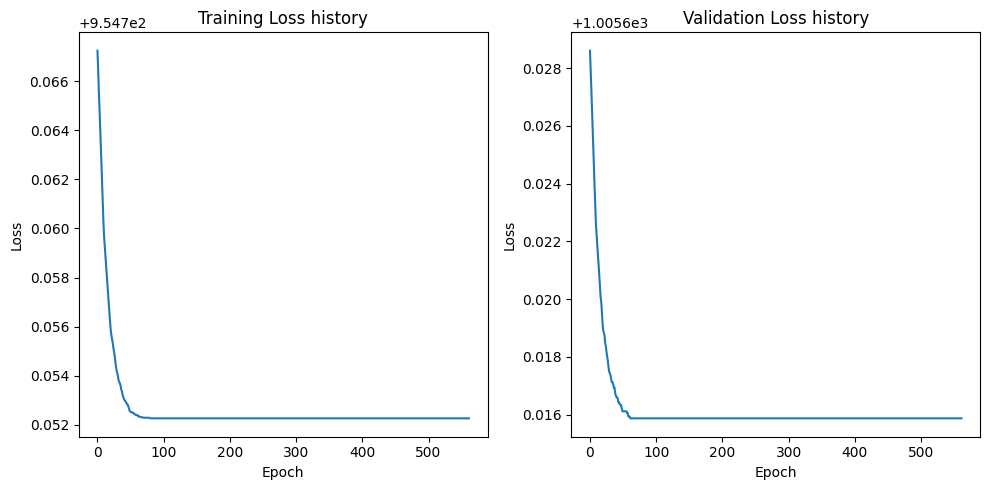

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3416, Train Loss: 132.80362701416016, Validation Loss: 144.70367813110352
Epoch 101/3416, Train Loss: 130.58517456054688, Validation Loss: 142.5401153564453
Epoch 201/3416, Train Loss: 130.58331222534179, Validation Loss: 142.53823852539062
Epoch 301/3416, Train Loss: 130.58331222534179, Validation Loss: 142.53823852539062
Epoch 401/3416, Train Loss: 130.58331222534179, Validation Loss: 142.53823852539062
Epoch 501/3416, Train Loss: 130.58331222534179, Validation Loss: 142.53823852539062
Epoch 601/3416, Train Loss: 130.58331222534179, Validation Loss: 142.53823852539062
Early stopping triggered.


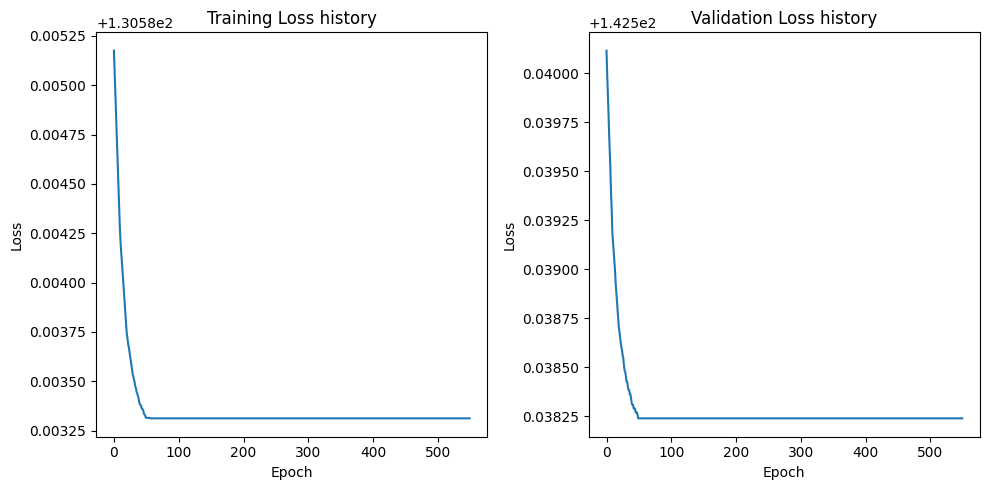

[I 2023-10-11 07:15:42,906] Trial 5 finished with value: 24.564687728881836 and parameters: {'hidden_layers': 1, 'epochs': 3416, 'batch_size': 501, 'learning_rate': 0.0008594160202496029}. Best is trial 4 with value: 3.7518374919891357.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2330, Train Loss: 1065.487284342448, Validation Loss: 1046.823974609375
Epoch 101/2330, Train Loss: 856.0877075195312, Validation Loss: 846.2147827148438
Epoch 201/2330, Train Loss: 855.7958780924479, Validation Loss: 845.942626953125
Epoch 301/2330, Train Loss: 855.7958577473959, Validation Loss: 845.942626953125
Epoch 401/2330, Train Loss: 855.7958577473959, Validation Loss: 845.942626953125
Epoch 501/2330, Train Loss: 855.7958577473959, Validation Loss: 845.942626953125
Epoch 601/2330, Train Loss: 855.7958577473959, Validation Loss: 845.942626953125
Early stopping triggered.


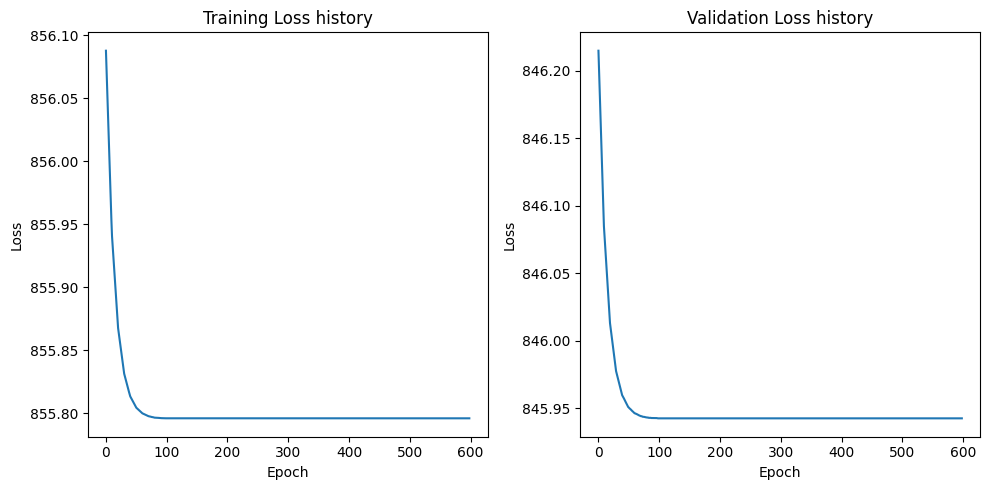

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2330, Train Loss: 1012.4135945638021, Validation Loss: 991.1632080078125
Epoch 101/2330, Train Loss: 813.8757934570312, Validation Loss: 811.1452026367188
Epoch 201/2330, Train Loss: 813.6633911132812, Validation Loss: 810.9625854492188
Epoch 301/2330, Train Loss: 813.6633911132812, Validation Loss: 810.9625854492188
Epoch 401/2330, Train Loss: 813.6633911132812, Validation Loss: 810.9625854492188
Epoch 501/2330, Train Loss: 813.6633911132812, Validation Loss: 810.9625854492188
Epoch 601/2330, Train Loss: 813.6633911132812, Validation Loss: 810.9625854492188
Early stopping triggered.


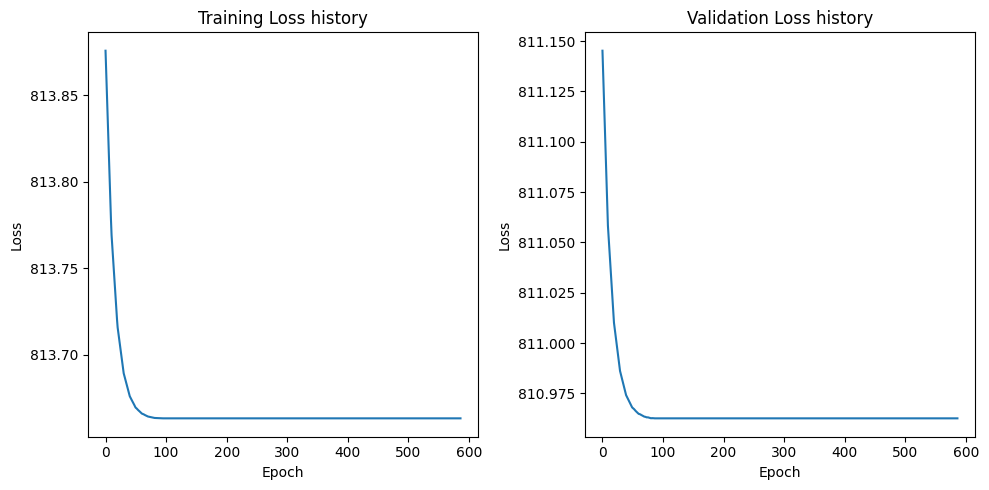

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2330, Train Loss: 141.6171849568685, Validation Loss: 136.10450744628906
Epoch 101/2330, Train Loss: 91.2829958597819, Validation Loss: 93.37966918945312
Epoch 201/2330, Train Loss: 91.25195185343425, Validation Loss: 93.35369110107422
Epoch 301/2330, Train Loss: 91.25194803873698, Validation Loss: 93.35369110107422
Epoch 401/2330, Train Loss: 91.25194803873698, Validation Loss: 93.35369110107422
Epoch 501/2330, Train Loss: 91.25194803873698, Validation Loss: 93.35369110107422
Epoch 601/2330, Train Loss: 91.25194803873698, Validation Loss: 93.35369110107422
Early stopping triggered.


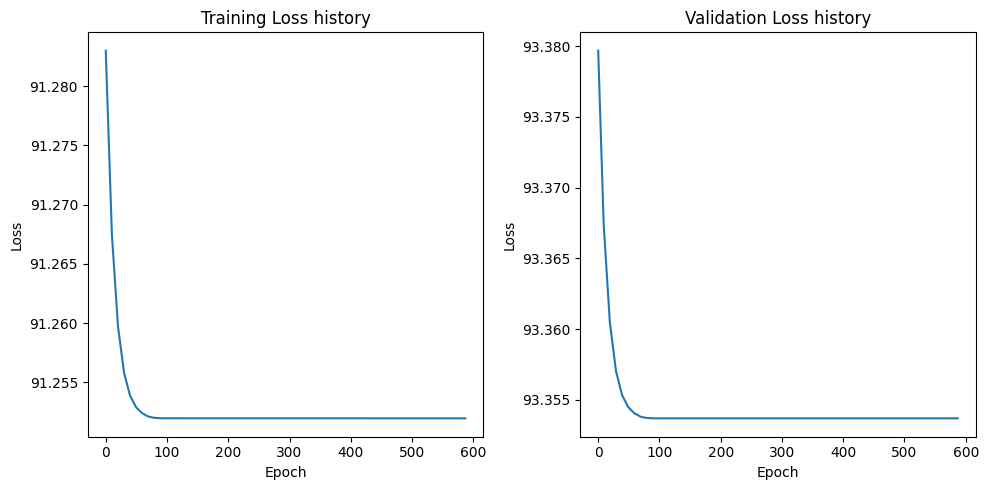

[I 2023-10-11 07:16:38,968] Trial 6 finished with value: 22.259572982788086 and parameters: {'hidden_layers': 2, 'epochs': 2330, 'batch_size': 979, 'learning_rate': 0.007490407578600094}. Best is trial 4 with value: 3.7518374919891357.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2033, Train Loss: 1018.705078125, Validation Loss: 1016.7745727539062
Epoch 101/2033, Train Loss: 1013.18017578125, Validation Loss: 1011.9823608398438
Epoch 201/2033, Train Loss: 1013.1751200358073, Validation Loss: 1011.9780029296875
Epoch 301/2033, Train Loss: 1013.1751200358073, Validation Loss: 1011.9780029296875
Epoch 401/2033, Train Loss: 1013.1751200358073, Validation Loss: 1011.9780029296875
Epoch 501/2033, Train Loss: 1013.1751200358073, Validation Loss: 1011.9780029296875
Epoch 601/2033, Train Loss: 1013.1751200358073, Validation Loss: 1011.9780029296875
Early stopping triggered.


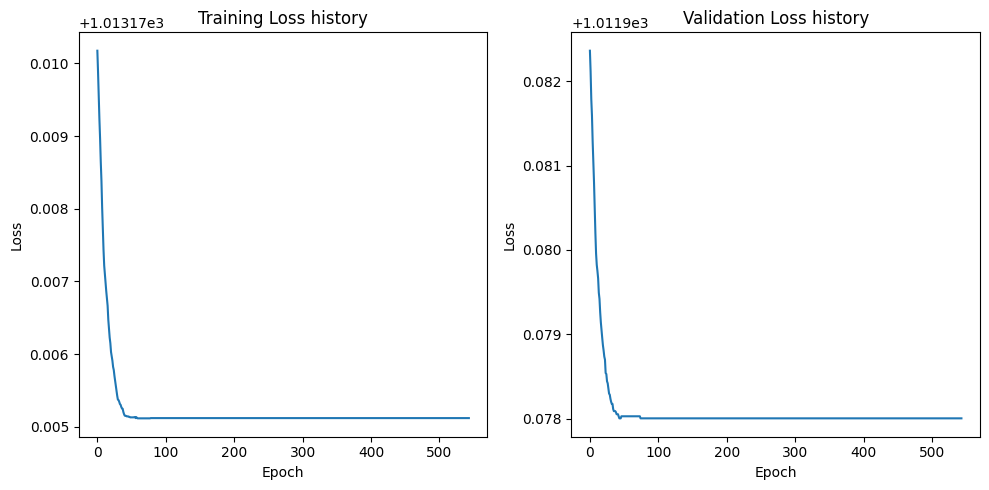

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2033, Train Loss: 1028.5592617458767, Validation Loss: 1026.2311767578126
Epoch 101/2033, Train Loss: 1023.2025383843315, Validation Loss: 1022.1398315429688
Epoch 201/2033, Train Loss: 1023.197757297092, Validation Loss: 1022.1362182617188
Epoch 301/2033, Train Loss: 1023.197757297092, Validation Loss: 1022.1362182617188
Epoch 401/2033, Train Loss: 1023.197757297092, Validation Loss: 1022.1362182617188
Epoch 501/2033, Train Loss: 1023.197757297092, Validation Loss: 1022.1362182617188
Epoch 601/2033, Train Loss: 1023.197757297092, Validation Loss: 1022.1362182617188
Early stopping triggered.


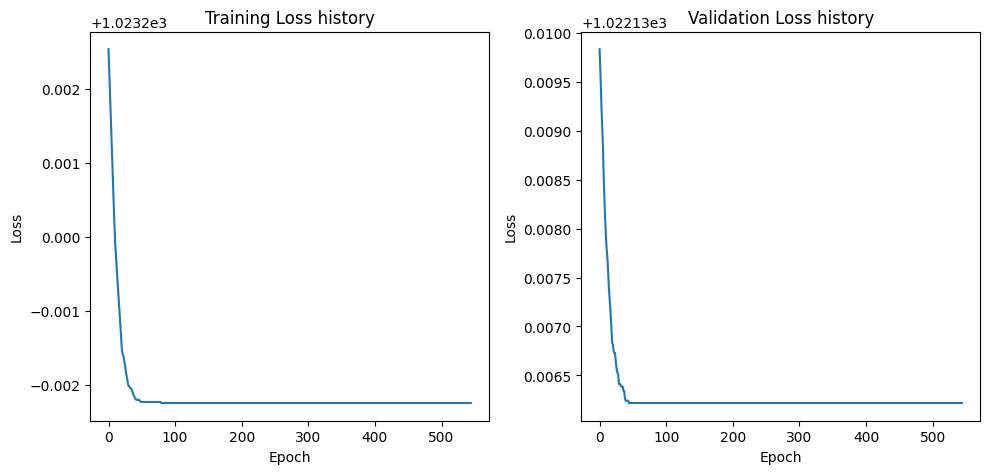

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2033, Train Loss: 158.38949627346463, Validation Loss: 156.13904418945313
Epoch 101/2033, Train Loss: 156.62596003214517, Validation Loss: 154.69422149658203
Epoch 201/2033, Train Loss: 156.62444941202799, Validation Loss: 154.69298248291017
Epoch 301/2033, Train Loss: 156.62444941202799, Validation Loss: 154.69298248291017
Epoch 401/2033, Train Loss: 156.62444941202799, Validation Loss: 154.69298248291017
Epoch 501/2033, Train Loss: 156.62444941202799, Validation Loss: 154.69298248291017
Epoch 601/2033, Train Loss: 156.62444941202799, Validation Loss: 154.69298248291017
Early stopping triggered.


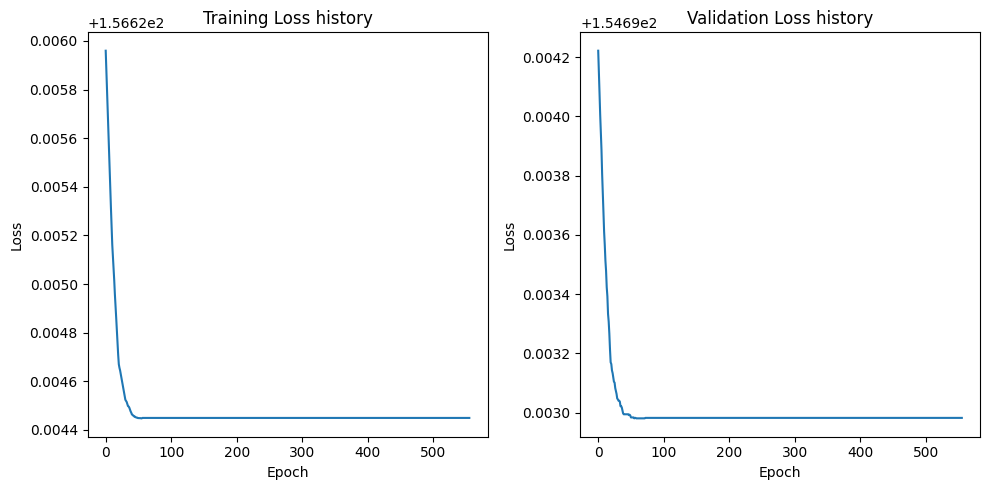

[I 2023-10-11 07:17:53,283] Trial 7 finished with value: 25.319067001342773 and parameters: {'hidden_layers': 2, 'epochs': 2033, 'batch_size': 147, 'learning_rate': 4.2547604322874285e-05}. Best is trial 4 with value: 3.7518374919891357.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4889, Train Loss: 955.3199157714844, Validation Loss: 831.7036743164062
Epoch 101/4889, Train Loss: 125.13502883911133, Validation Loss: 171.47720336914062
Epoch 201/4889, Train Loss: 124.01389503479004, Validation Loss: 170.45191955566406
Epoch 301/4889, Train Loss: 124.01354789733887, Validation Loss: 170.4515838623047
Epoch 401/4889, Train Loss: 124.01354789733887, Validation Loss: 170.4515838623047
Epoch 501/4889, Train Loss: 124.01354789733887, Validation Loss: 170.4515838623047
Epoch 601/4889, Train Loss: 124.01354789733887, Validation Loss: 170.4515838623047
Epoch 701/4889, Train Loss: 124.01354789733887, Validation Loss: 170.4515838623047
Early stopping triggered.


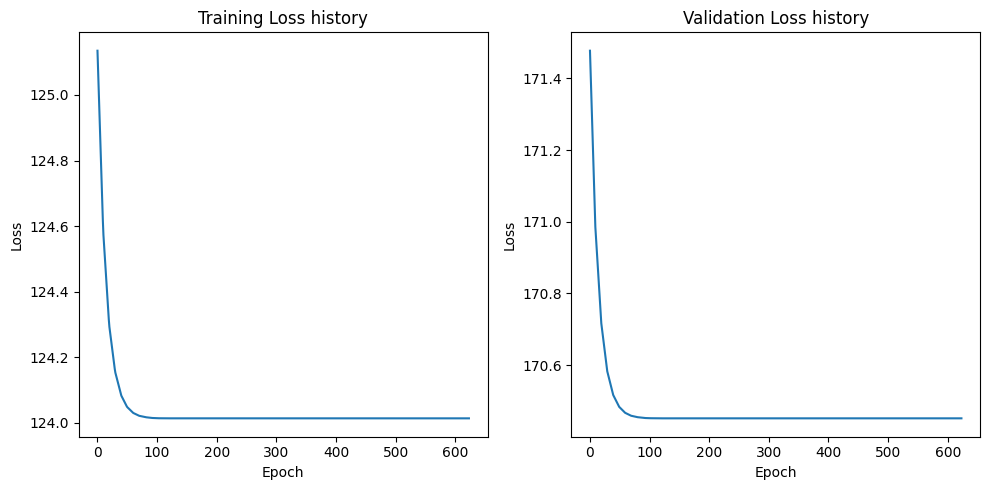

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4889, Train Loss: 1014.6660614013672, Validation Loss: 921.2493286132812
Epoch 101/4889, Train Loss: 201.9310073852539, Validation Loss: 264.3064270019531
Epoch 201/4889, Train Loss: 200.78228759765625, Validation Loss: 263.5332946777344
Epoch 301/4889, Train Loss: 200.7818374633789, Validation Loss: 263.532958984375
Epoch 401/4889, Train Loss: 200.7818374633789, Validation Loss: 263.532958984375
Epoch 501/4889, Train Loss: 200.7818374633789, Validation Loss: 263.532958984375
Epoch 601/4889, Train Loss: 200.7818374633789, Validation Loss: 263.532958984375
Epoch 701/4889, Train Loss: 200.7818374633789, Validation Loss: 263.532958984375
Early stopping triggered.


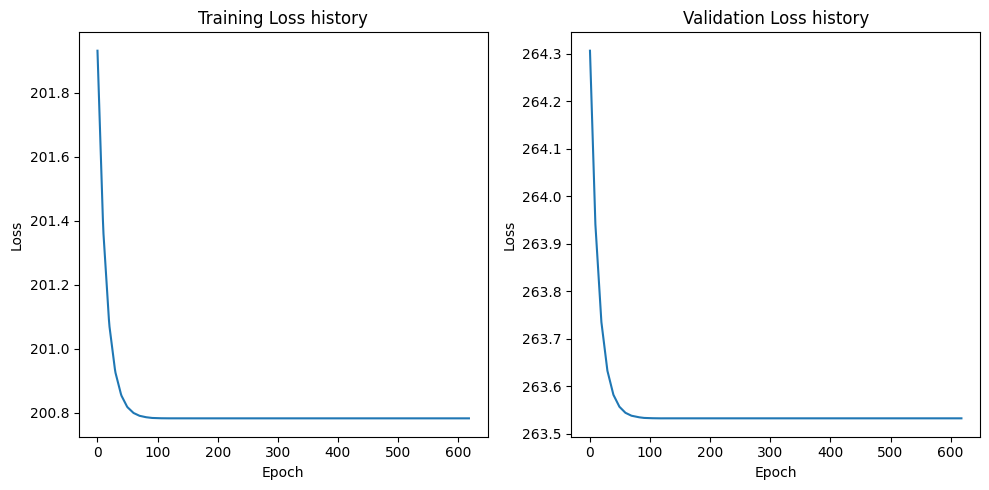

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4889, Train Loss: 162.6160488128662, Validation Loss: 154.51174926757812
Epoch 101/4889, Train Loss: 19.015604972839355, Validation Loss: 24.686294555664062
Epoch 201/4889, Train Loss: 18.93316650390625, Validation Loss: 24.625076293945312
Epoch 301/4889, Train Loss: 18.933128833770752, Validation Loss: 24.62506675720215
Epoch 401/4889, Train Loss: 18.933128833770752, Validation Loss: 24.62506675720215
Epoch 501/4889, Train Loss: 18.933128833770752, Validation Loss: 24.62506675720215
Epoch 601/4889, Train Loss: 18.933128833770752, Validation Loss: 24.62506675720215
Epoch 701/4889, Train Loss: 18.933128833770752, Validation Loss: 24.62506675720215
Early stopping triggered.


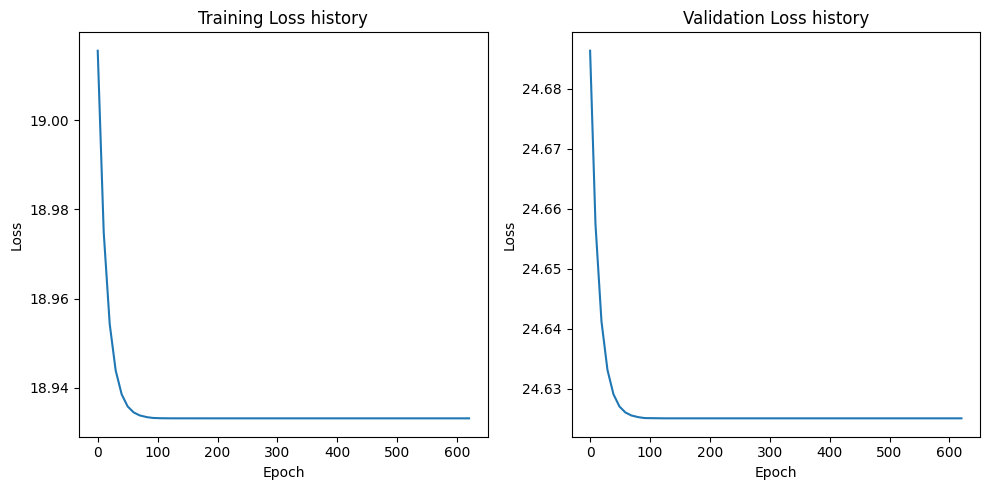

[I 2023-10-11 07:18:49,502] Trial 8 finished with value: 10.465519905090332 and parameters: {'hidden_layers': 1, 'epochs': 4889, 'batch_size': 720, 'learning_rate': 0.08955990859193749}. Best is trial 4 with value: 3.7518374919891357.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1223, Train Loss: 1017.6161422729492, Validation Loss: 1003.6810913085938
Epoch 101/1223, Train Loss: 318.2172031402588, Validation Loss: 335.5147247314453
Epoch 201/1223, Train Loss: 317.82594871520996, Validation Loss: 335.15594482421875
Epoch 301/1223, Train Loss: 317.8259334564209, Validation Loss: 335.15594482421875
Epoch 401/1223, Train Loss: 317.8259334564209, Validation Loss: 335.15594482421875
Epoch 501/1223, Train Loss: 317.8259334564209, Validation Loss: 335.15594482421875
Epoch 601/1223, Train Loss: 317.8259334564209, Validation Loss: 335.15594482421875
Early stopping triggered.


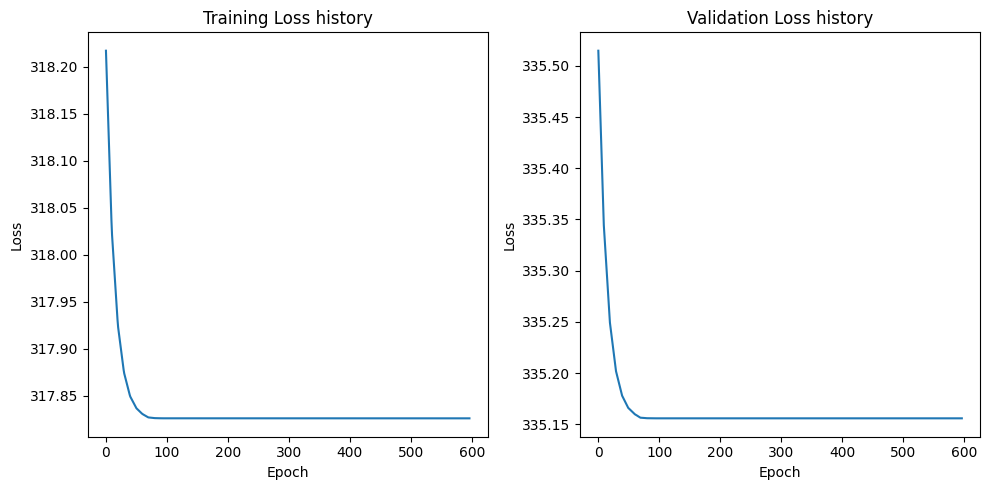

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1223, Train Loss: 1029.169822692871, Validation Loss: 1023.5849609375
Epoch 101/1223, Train Loss: 209.87130165100098, Validation Loss: 233.19176483154297
Epoch 201/1223, Train Loss: 209.51030158996582, Validation Loss: 232.87712860107422
Epoch 301/1223, Train Loss: 209.51029205322266, Validation Loss: 232.87711334228516
Epoch 401/1223, Train Loss: 209.51029205322266, Validation Loss: 232.87711334228516
Epoch 501/1223, Train Loss: 209.51029205322266, Validation Loss: 232.87711334228516
Epoch 601/1223, Train Loss: 209.51029205322266, Validation Loss: 232.87711334228516
Early stopping triggered.


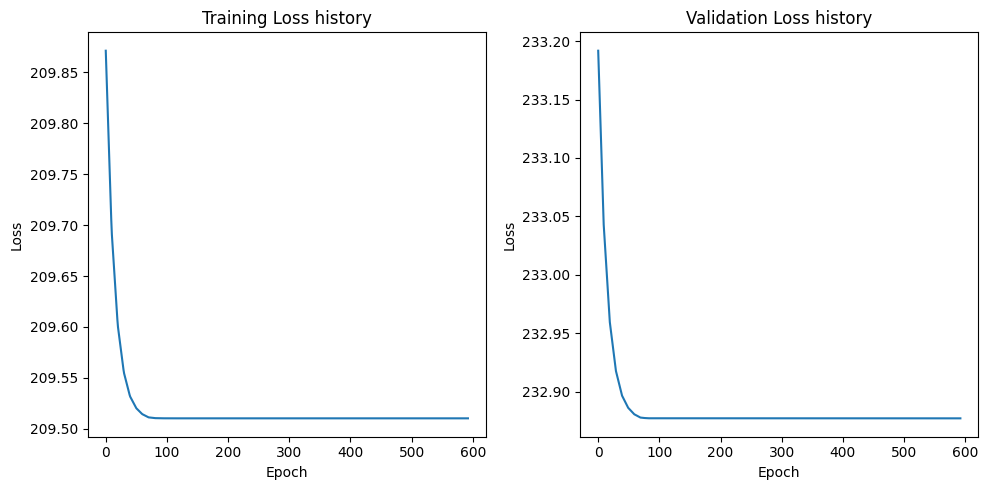

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1223, Train Loss: 134.6241488456726, Validation Loss: 131.54888153076172
Epoch 101/1223, Train Loss: 9.43458116054535, Validation Loss: 16.715641021728516
Epoch 201/1223, Train Loss: 9.417551457881927, Validation Loss: 16.694005012512207
Epoch 301/1223, Train Loss: 9.417550444602966, Validation Loss: 16.69400453567505
Epoch 401/1223, Train Loss: 9.417550444602966, Validation Loss: 16.69400453567505
Epoch 501/1223, Train Loss: 9.417550444602966, Validation Loss: 16.69400453567505
Epoch 601/1223, Train Loss: 9.417550444602966, Validation Loss: 16.69400453567505
Epoch 701/1223, Train Loss: 9.417550444602966, Validation Loss: 16.69400453567505
Early stopping triggered.


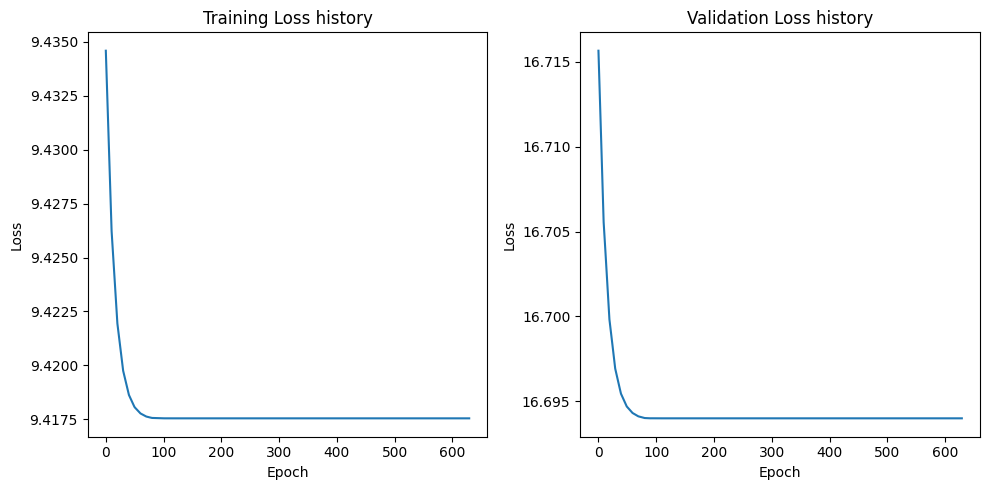

[I 2023-10-11 07:19:51,072] Trial 9 finished with value: 11.836552619934082 and parameters: {'hidden_layers': 5, 'epochs': 1223, 'batch_size': 333, 'learning_rate': 0.007981317992396996}. Best is trial 4 with value: 3.7518374919891357.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1088, Train Loss: 1022.0159301757812, Validation Loss: 1015.3704223632812
Epoch 101/1088, Train Loss: 1021.3396759033203, Validation Loss: 1014.7495727539062
Epoch 201/1088, Train Loss: 1021.3390960693359, Validation Loss: 1014.7490844726562
Epoch 301/1088, Train Loss: 1021.3390960693359, Validation Loss: 1014.7490844726562
Epoch 401/1088, Train Loss: 1021.3390960693359, Validation Loss: 1014.7490844726562
Epoch 501/1088, Train Loss: 1021.3390960693359, Validation Loss: 1014.7490844726562
Epoch 601/1088, Train Loss: 1021.3390960693359, Validation Loss: 1014.7490844726562
Early stopping triggered.


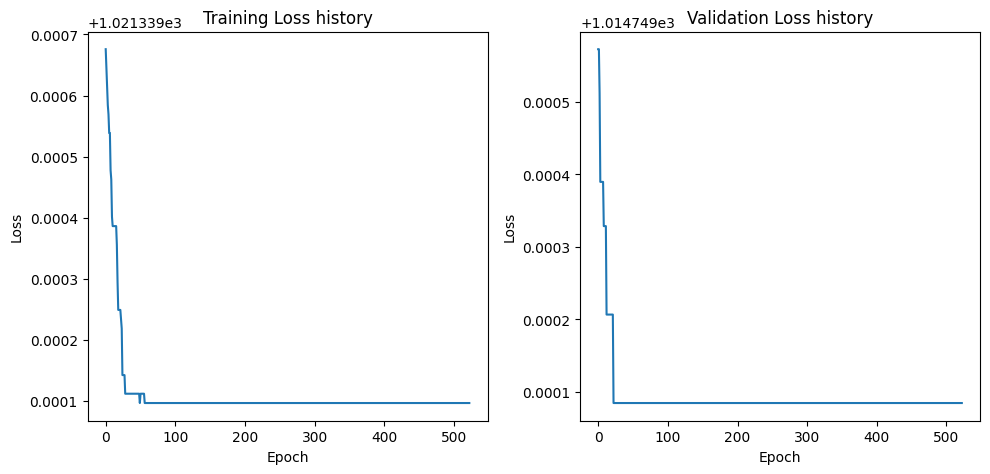

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1088, Train Loss: 1031.2583770751953, Validation Loss: 1026.5760498046875
Epoch 101/1088, Train Loss: 1030.4325256347656, Validation Loss: 1025.8509521484375
Epoch 201/1088, Train Loss: 1030.4318389892578, Validation Loss: 1025.8502197265625
Epoch 301/1088, Train Loss: 1030.4318389892578, Validation Loss: 1025.8502197265625
Epoch 401/1088, Train Loss: 1030.4318389892578, Validation Loss: 1025.8502197265625
Epoch 501/1088, Train Loss: 1030.4318389892578, Validation Loss: 1025.8502197265625
Epoch 601/1088, Train Loss: 1030.4318389892578, Validation Loss: 1025.8502197265625
Early stopping triggered.


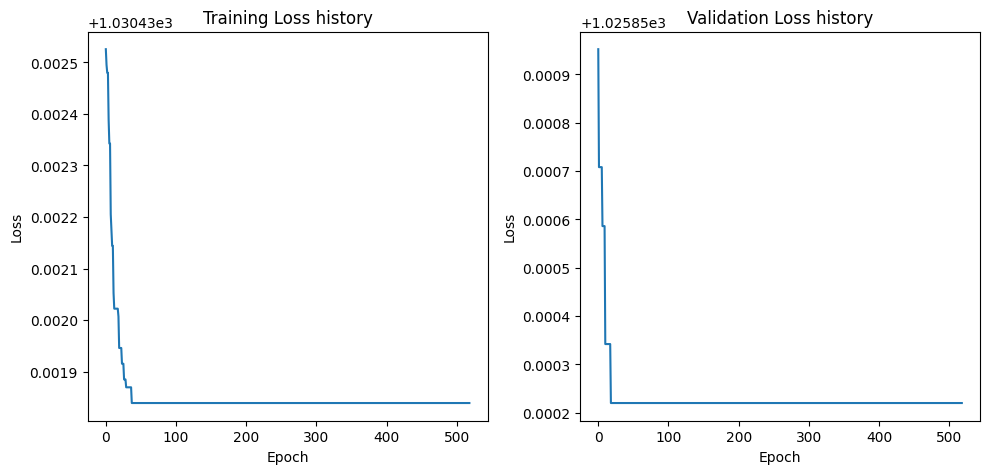

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1088, Train Loss: 150.0246982574463, Validation Loss: 151.47119140625
Epoch 101/1088, Train Loss: 149.70169258117676, Validation Loss: 151.1772003173828
Epoch 201/1088, Train Loss: 149.70143699645996, Validation Loss: 151.1769561767578
Epoch 301/1088, Train Loss: 149.70143699645996, Validation Loss: 151.1769561767578
Epoch 401/1088, Train Loss: 149.70143699645996, Validation Loss: 151.1769561767578
Epoch 501/1088, Train Loss: 149.70143699645996, Validation Loss: 151.1769561767578
Epoch 601/1088, Train Loss: 149.70143699645996, Validation Loss: 151.1769561767578
Early stopping triggered.


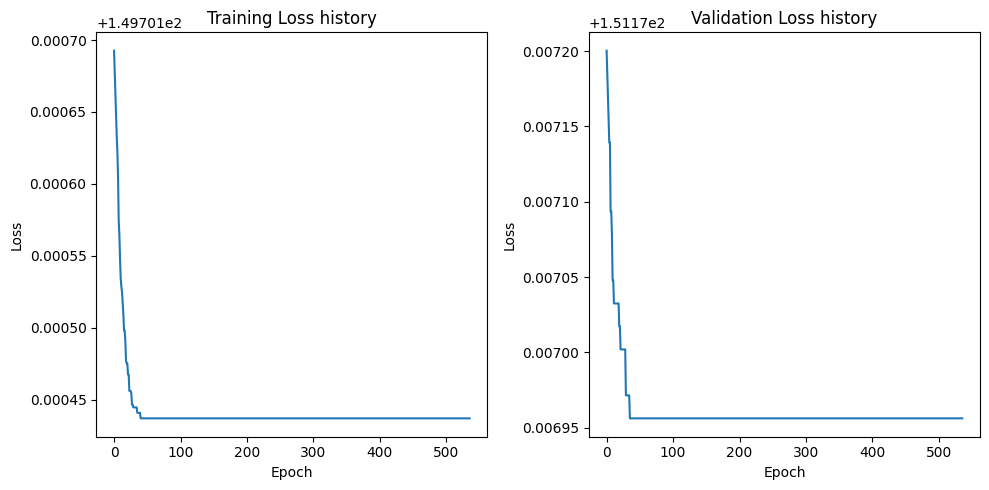

[I 2023-10-11 07:20:41,697] Trial 10 finished with value: 25.37097930908203 and parameters: {'hidden_layers': 3, 'epochs': 1088, 'batch_size': 774, 'learning_rate': 2.1819888913470273e-05}. Best is trial 4 with value: 3.7518374919891357.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3738, Train Loss: 945.0717424665179, Validation Loss: 682.1455078125
Epoch 101/3738, Train Loss: 10.776125192642212, Validation Loss: 31.831730842590332
Epoch 201/3738, Train Loss: 10.742417880467006, Validation Loss: 31.763158798217773
Epoch 301/3738, Train Loss: 10.7424076965877, Validation Loss: 31.76313877105713
Epoch 401/3738, Train Loss: 10.7424076965877, Validation Loss: 31.76313877105713
Epoch 501/3738, Train Loss: 10.7424076965877, Validation Loss: 31.76313877105713
Epoch 601/3738, Train Loss: 10.7424076965877, Validation Loss: 31.76313877105713
Epoch 701/3738, Train Loss: 10.7424076965877, Validation Loss: 31.76313877105713
Early stopping triggered.


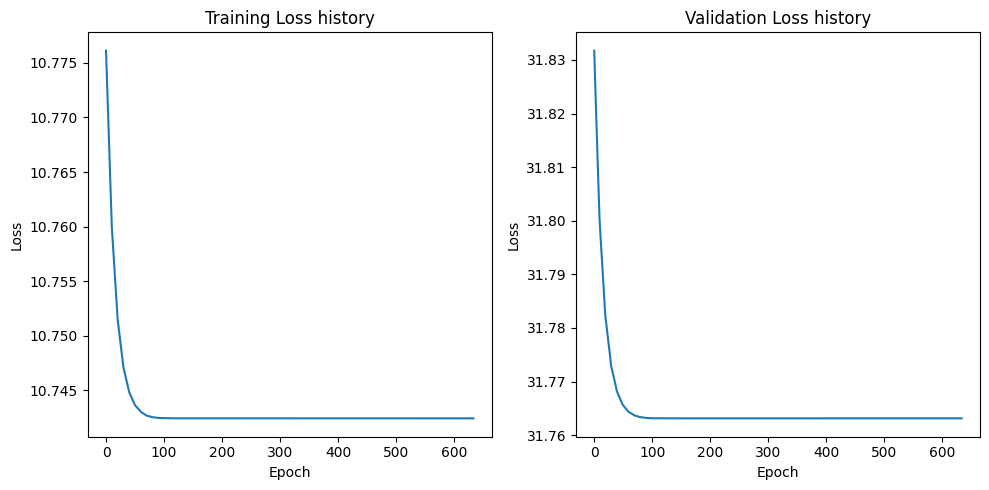

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3738, Train Loss: 915.9931117466518, Validation Loss: 634.5785827636719
Epoch 101/3738, Train Loss: 11.321515832628522, Validation Loss: 30.19599723815918
Epoch 201/3738, Train Loss: 11.273603575570244, Validation Loss: 30.08949851989746
Epoch 301/3738, Train Loss: 11.273592131478447, Validation Loss: 30.089460372924805
Epoch 401/3738, Train Loss: 11.273592131478447, Validation Loss: 30.089460372924805
Epoch 501/3738, Train Loss: 11.273592131478447, Validation Loss: 30.089460372924805
Epoch 601/3738, Train Loss: 11.273592131478447, Validation Loss: 30.089460372924805
Epoch 701/3738, Train Loss: 11.273592131478447, Validation Loss: 30.089460372924805
Early stopping triggered.


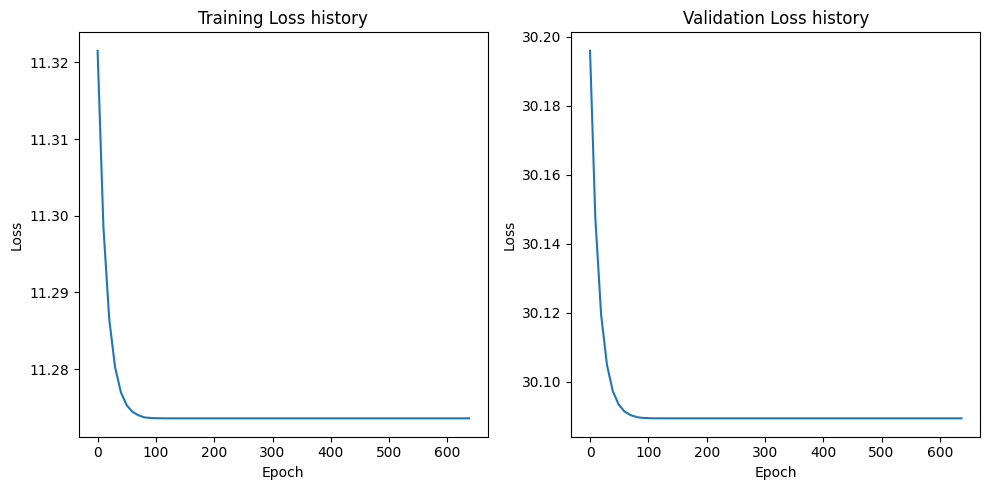

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3738, Train Loss: 113.32114955357143, Validation Loss: 88.63371276855469
Epoch 101/3738, Train Loss: 1.5311784829412187, Validation Loss: 3.949179530143738
Epoch 201/3738, Train Loss: 1.5260212932314192, Validation Loss: 3.938740372657776
Epoch 301/3738, Train Loss: 1.5260195987565177, Validation Loss: 3.9387385845184326
Epoch 401/3738, Train Loss: 1.5260195987565177, Validation Loss: 3.9387385845184326
Epoch 501/3738, Train Loss: 1.5260195987565177, Validation Loss: 3.9387385845184326
Epoch 601/3738, Train Loss: 1.5260195987565177, Validation Loss: 3.9387385845184326
Epoch 701/3738, Train Loss: 1.5260195987565177, Validation Loss: 3.9387385845184326
Early stopping triggered.


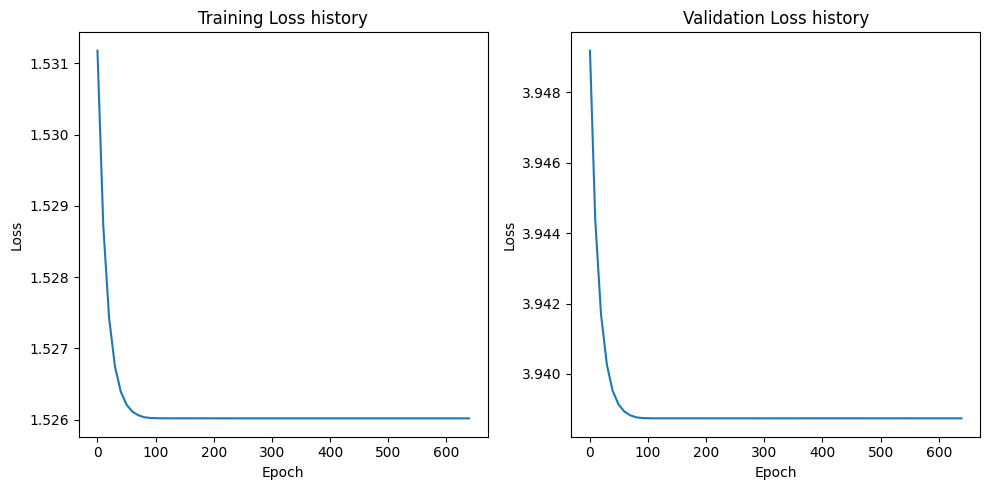

[I 2023-10-11 07:21:46,243] Trial 11 finished with value: 3.14843487739563 and parameters: {'hidden_layers': 4, 'epochs': 3738, 'batch_size': 384, 'learning_rate': 0.08796312429859848}. Best is trial 11 with value: 3.14843487739563.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3917, Train Loss: 1021.9059719509548, Validation Loss: 994.7689208984375
Epoch 101/3917, Train Loss: 42.45124287075467, Validation Loss: 68.98782730102539
Epoch 201/3917, Train Loss: 42.358658684624565, Validation Loss: 68.89929072062175
Epoch 301/3917, Train Loss: 42.35865190294054, Validation Loss: 68.89928944905598
Epoch 401/3917, Train Loss: 42.35865190294054, Validation Loss: 68.89928944905598
Epoch 501/3917, Train Loss: 42.35865190294054, Validation Loss: 68.89928944905598
Epoch 601/3917, Train Loss: 42.35865190294054, Validation Loss: 68.89928944905598
Epoch 701/3917, Train Loss: 42.35865190294054, Validation Loss: 68.89928944905598
Early stopping triggered.


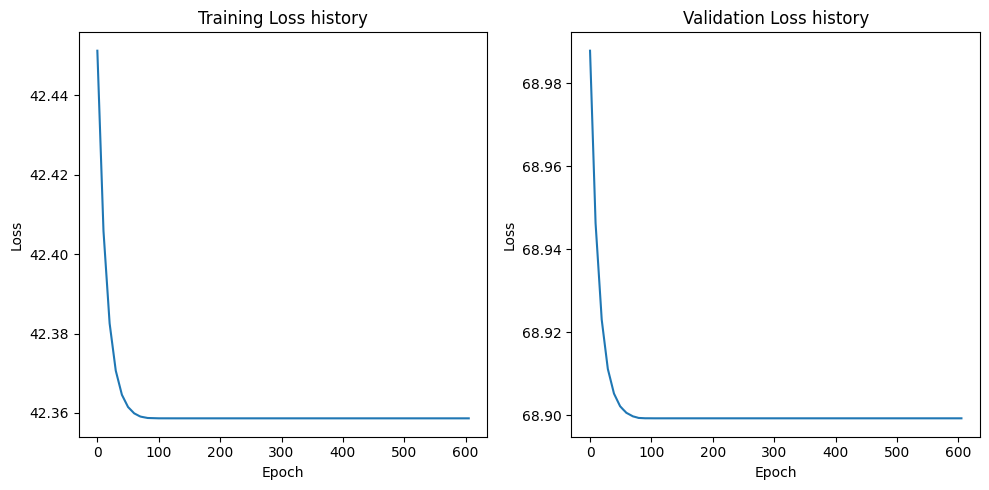

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3917, Train Loss: 1000.0279473198784, Validation Loss: 956.0765991210938
Epoch 101/3917, Train Loss: 53.619559817843964, Validation Loss: 69.31530952453613
Epoch 201/3917, Train Loss: 53.51505661010742, Validation Loss: 69.23286056518555
Epoch 301/3917, Train Loss: 53.51504813300239, Validation Loss: 69.2328592936198
Epoch 401/3917, Train Loss: 53.51504813300239, Validation Loss: 69.2328592936198
Epoch 501/3917, Train Loss: 53.51504813300239, Validation Loss: 69.2328592936198
Epoch 601/3917, Train Loss: 53.51504813300239, Validation Loss: 69.2328592936198
Epoch 701/3917, Train Loss: 53.51504813300239, Validation Loss: 69.2328592936198
Early stopping triggered.


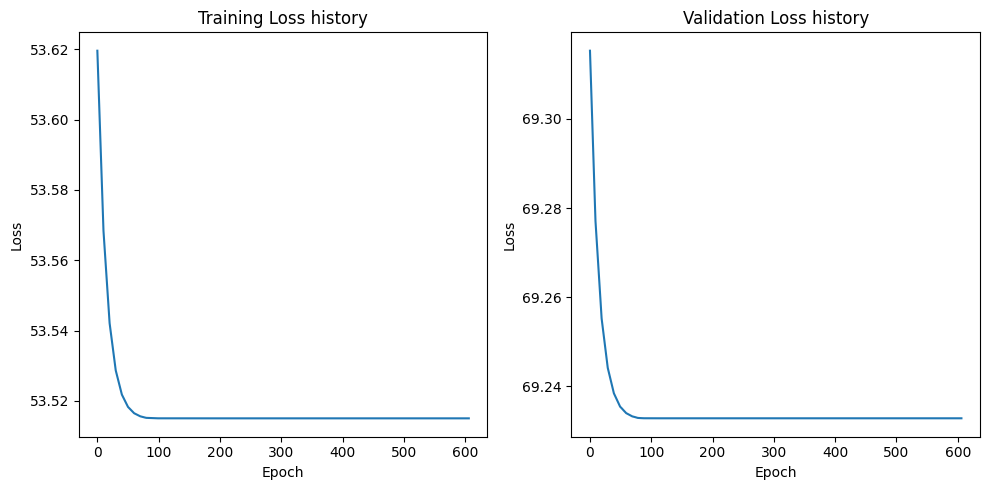

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3917, Train Loss: 125.84194437662761, Validation Loss: 105.69535319010417
Epoch 101/3917, Train Loss: 2.9147984385490417, Validation Loss: 6.064897795518239
Epoch 201/3917, Train Loss: 2.9049263265397816, Validation Loss: 6.052680790424347
Epoch 301/3917, Train Loss: 2.9049249556329517, Validation Loss: 6.0526791115601855
Epoch 401/3917, Train Loss: 2.9049249556329517, Validation Loss: 6.0526791115601855
Epoch 501/3917, Train Loss: 2.9049249556329517, Validation Loss: 6.0526791115601855
Epoch 601/3917, Train Loss: 2.9049249556329517, Validation Loss: 6.0526791115601855
Epoch 701/3917, Train Loss: 2.9049249556329517, Validation Loss: 6.0526791115601855
Early stopping triggered.


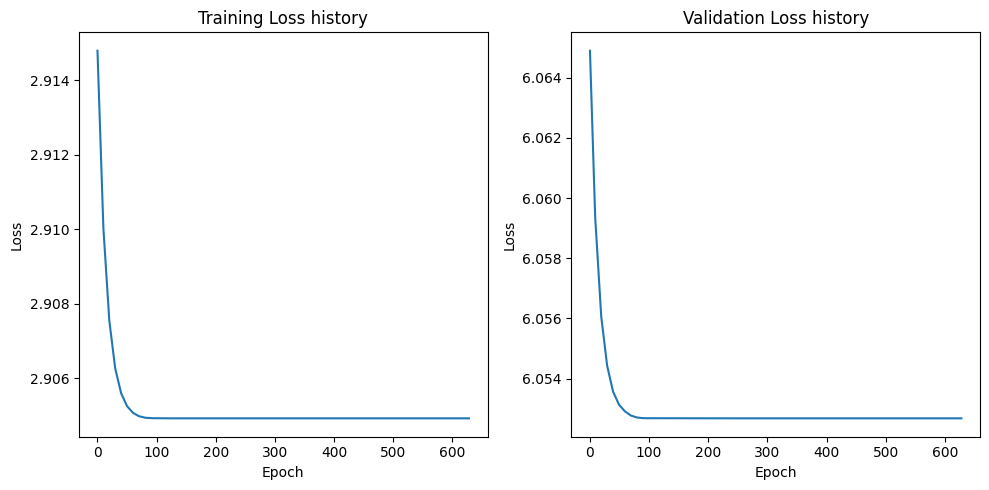

[I 2023-10-11 07:22:51,072] Trial 12 finished with value: 5.713205337524414 and parameters: {'hidden_layers': 4, 'epochs': 3917, 'batch_size': 304, 'learning_rate': 0.021390707939219867}. Best is trial 11 with value: 3.14843487739563.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3754, Train Loss: 941.4948168945313, Validation Loss: 737.6158708844866
Epoch 101/3754, Train Loss: 8.313656358718871, Validation Loss: 24.50925806590489
Epoch 201/3754, Train Loss: 8.277737808227538, Validation Loss: 24.42942019871303
Epoch 301/3754, Train Loss: 8.277731828689575, Validation Loss: 24.42939679963248
Epoch 401/3754, Train Loss: 8.277731828689575, Validation Loss: 24.42939679963248
Epoch 501/3754, Train Loss: 8.277731828689575, Validation Loss: 24.42939679963248
Epoch 601/3754, Train Loss: 8.277731828689575, Validation Loss: 24.42939679963248
Epoch 701/3754, Train Loss: 8.277731828689575, Validation Loss: 24.42939679963248
Early stopping triggered.


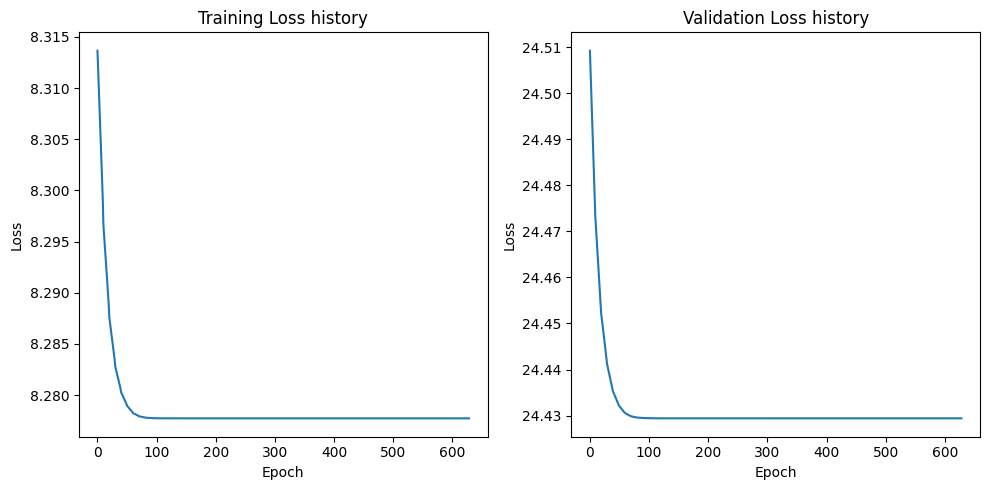

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3754, Train Loss: 992.5769482421875, Validation Loss: 814.1534249441964
Epoch 101/3754, Train Loss: 8.663701524734497, Validation Loss: 23.047135408435548
Epoch 201/3754, Train Loss: 8.609909896850587, Validation Loss: 22.971581825188228
Epoch 301/3754, Train Loss: 8.609904308319091, Validation Loss: 22.971568405628204
Epoch 401/3754, Train Loss: 8.609904308319091, Validation Loss: 22.971568405628204
Epoch 501/3754, Train Loss: 8.609904308319091, Validation Loss: 22.971568405628204
Epoch 601/3754, Train Loss: 8.609904308319091, Validation Loss: 22.971568405628204
Epoch 701/3754, Train Loss: 8.609904308319091, Validation Loss: 22.971568405628204
Early stopping triggered.


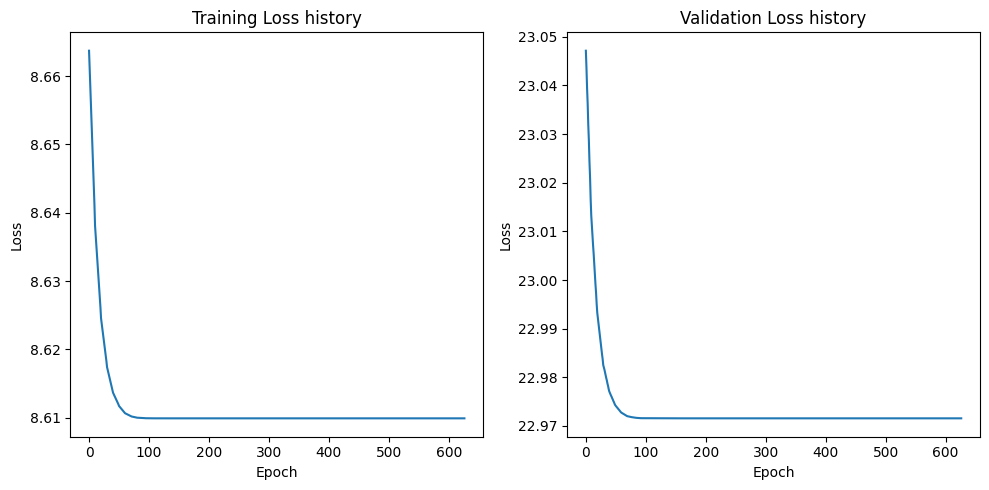

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3754, Train Loss: 89.12338775634765, Validation Loss: 103.8483521597726
Epoch 101/3754, Train Loss: 0.8071071583032609, Validation Loss: 2.1777099796703885
Epoch 201/3754, Train Loss: 0.8026149567961692, Validation Loss: 2.1674306392669678
Epoch 301/3754, Train Loss: 0.8026134157180786, Validation Loss: 2.1674269352640425
Epoch 401/3754, Train Loss: 0.8026134157180786, Validation Loss: 2.1674269352640425
Epoch 501/3754, Train Loss: 0.8026134157180786, Validation Loss: 2.1674269352640425
Epoch 601/3754, Train Loss: 0.8026134157180786, Validation Loss: 2.1674269352640425
Epoch 701/3754, Train Loss: 0.8026134157180786, Validation Loss: 2.1674269352640425
Early stopping triggered.


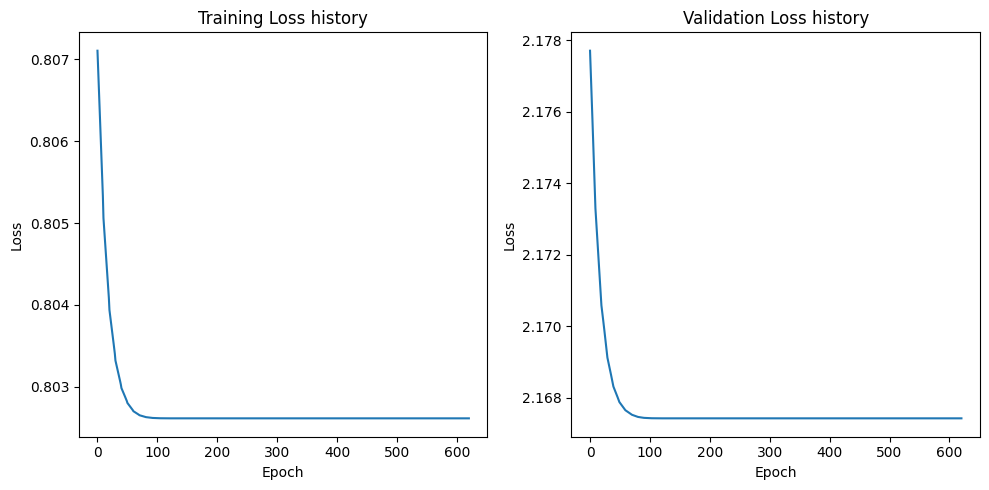

[I 2023-10-11 07:24:30,301] Trial 13 finished with value: 2.7137887477874756 and parameters: {'hidden_layers': 4, 'epochs': 3754, 'batch_size': 104, 'learning_rate': 0.023865109701642538}. Best is trial 13 with value: 2.7137887477874756.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4116, Train Loss: 913.2004917689732, Validation Loss: 611.4790649414062
Epoch 101/4116, Train Loss: 15.566317558288574, Validation Loss: 37.12117958068848
Epoch 201/4116, Train Loss: 15.494550568716866, Validation Loss: 36.98523998260498
Epoch 301/4116, Train Loss: 15.494530132838658, Validation Loss: 36.985188484191895
Epoch 401/4116, Train Loss: 15.494530132838658, Validation Loss: 36.985188484191895
Epoch 501/4116, Train Loss: 15.494530132838658, Validation Loss: 36.985188484191895
Epoch 601/4116, Train Loss: 15.494530132838658, Validation Loss: 36.985188484191895
Epoch 701/4116, Train Loss: 15.494530132838658, Validation Loss: 36.985188484191895
Early stopping triggered.


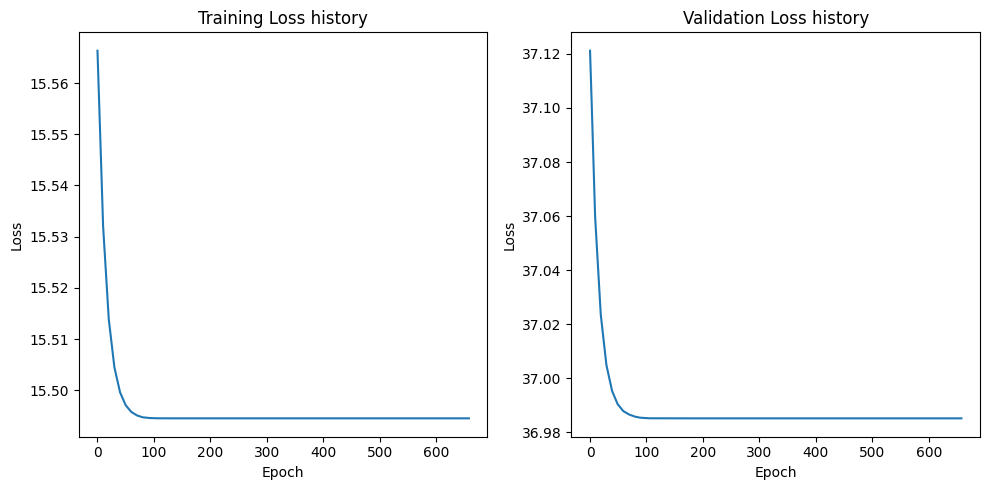

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4116, Train Loss: 1014.0199584960938, Validation Loss: 849.6847534179688
Epoch 101/4116, Train Loss: 15.082812581743513, Validation Loss: 32.81639766693115
Epoch 201/4116, Train Loss: 14.983212879725865, Validation Loss: 32.685707092285156
Epoch 301/4116, Train Loss: 14.983182838984899, Validation Loss: 32.68567085266113
Epoch 401/4116, Train Loss: 14.983182838984899, Validation Loss: 32.68567085266113
Epoch 501/4116, Train Loss: 14.983182838984899, Validation Loss: 32.68567085266113
Epoch 601/4116, Train Loss: 14.983182838984899, Validation Loss: 32.68567085266113
Epoch 701/4116, Train Loss: 14.983182838984899, Validation Loss: 32.68567085266113
Early stopping triggered.


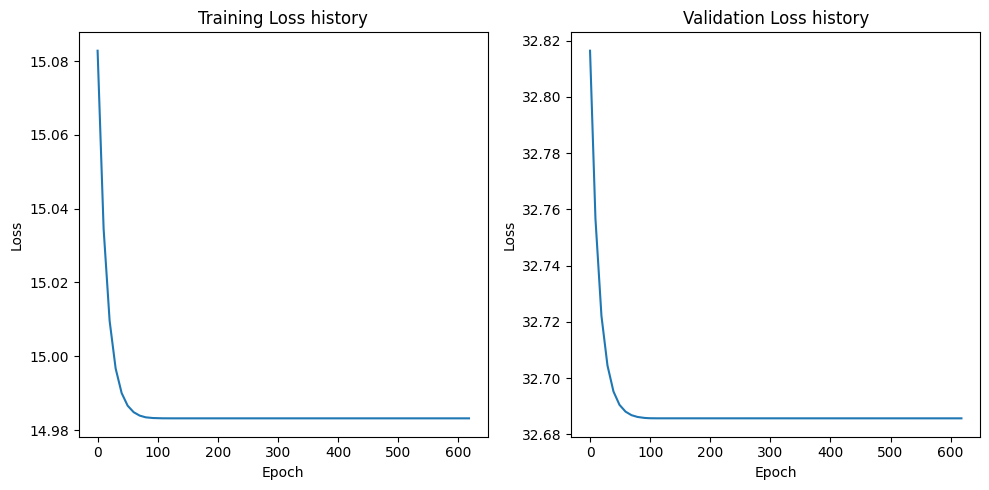

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4116, Train Loss: 141.45202854701452, Validation Loss: 116.83568954467773
Epoch 101/4116, Train Loss: 1.5980577298573084, Validation Loss: 3.3991119861602783
Epoch 201/4116, Train Loss: 1.590750208922795, Validation Loss: 3.3885995149612427
Epoch 301/4116, Train Loss: 1.5907481568200248, Validation Loss: 3.3885987997055054
Epoch 401/4116, Train Loss: 1.5907481568200248, Validation Loss: 3.3885987997055054
Epoch 501/4116, Train Loss: 1.5907481568200248, Validation Loss: 3.3885987997055054
Epoch 601/4116, Train Loss: 1.5907481568200248, Validation Loss: 3.3885987997055054
Epoch 701/4116, Train Loss: 1.5907481568200248, Validation Loss: 3.3885987997055054
Early stopping triggered.


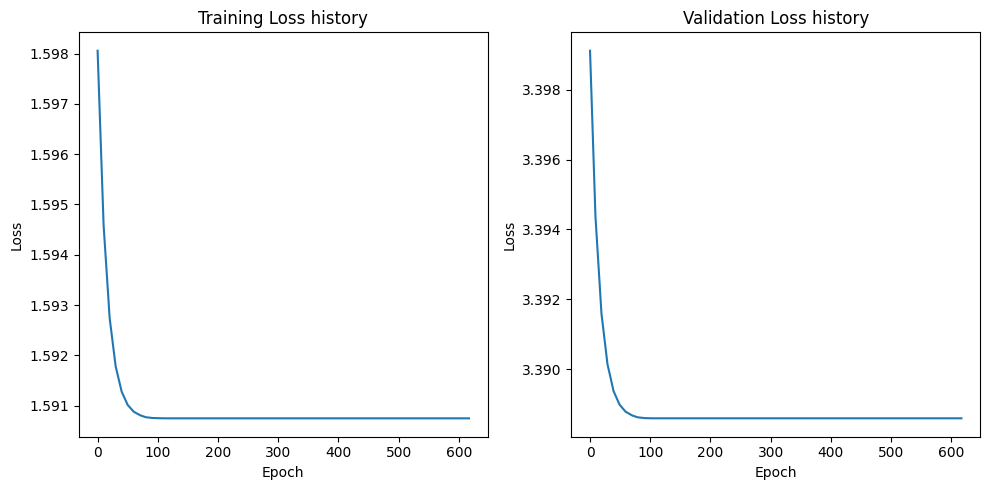

[I 2023-10-11 07:25:35,951] Trial 14 finished with value: 3.55501651763916 and parameters: {'hidden_layers': 3, 'epochs': 4116, 'batch_size': 393, 'learning_rate': 0.09513696720786888}. Best is trial 13 with value: 2.7137887477874756.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4415, Train Loss: 1027.002944946289, Validation Loss: 1004.4320068359375
Epoch 101/4415, Train Loss: 60.010581970214844, Validation Loss: 123.82196044921875
Epoch 201/4415, Train Loss: 59.873043060302734, Validation Loss: 123.68161010742188
Epoch 301/4415, Train Loss: 59.87302303314209, Validation Loss: 123.68157196044922
Epoch 401/4415, Train Loss: 59.87302303314209, Validation Loss: 123.68157196044922
Epoch 501/4415, Train Loss: 59.87302303314209, Validation Loss: 123.68157196044922
Epoch 601/4415, Train Loss: 59.87302303314209, Validation Loss: 123.68157196044922
Epoch 701/4415, Train Loss: 59.87302303314209, Validation Loss: 123.68157196044922
Early stopping triggered.


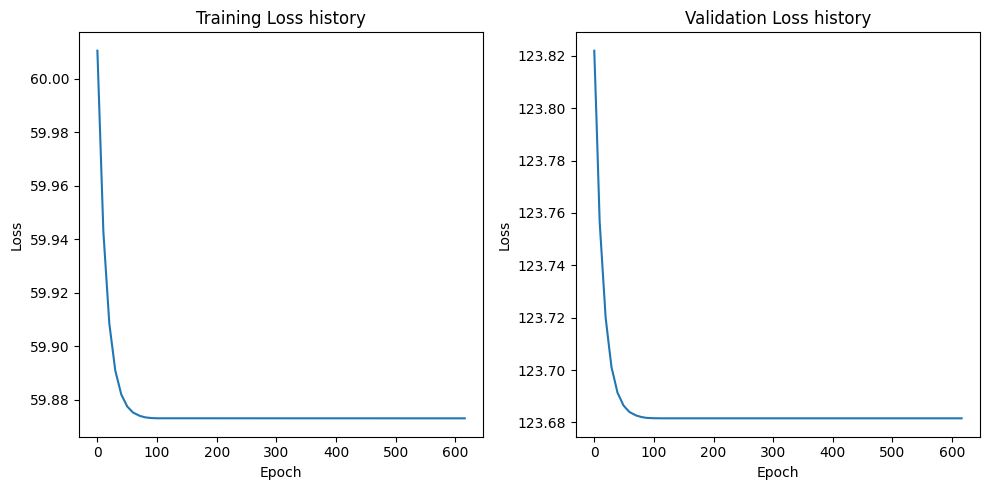

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4415, Train Loss: 1022.5529174804688, Validation Loss: 970.1433715820312
Epoch 101/4415, Train Loss: 132.20150756835938, Validation Loss: 199.32489013671875
Epoch 201/4415, Train Loss: 131.96205711364746, Validation Loss: 199.179443359375
Epoch 301/4415, Train Loss: 131.96199989318848, Validation Loss: 199.17942810058594
Epoch 401/4415, Train Loss: 131.96199989318848, Validation Loss: 199.17942810058594
Epoch 501/4415, Train Loss: 131.96199989318848, Validation Loss: 199.17942810058594
Epoch 601/4415, Train Loss: 131.96199989318848, Validation Loss: 199.17942810058594
Epoch 701/4415, Train Loss: 131.96199989318848, Validation Loss: 199.17942810058594
Early stopping triggered.


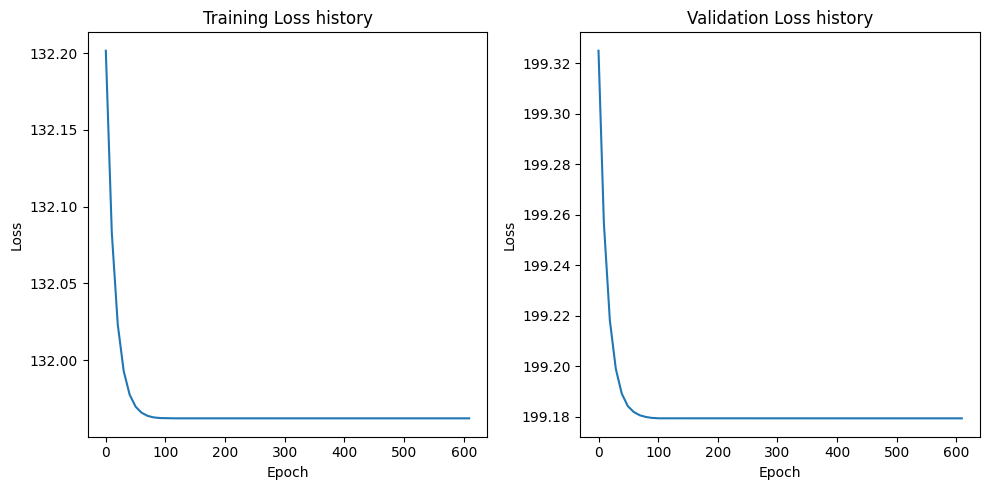

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4415, Train Loss: 135.21383666992188, Validation Loss: 121.2063217163086
Epoch 101/4415, Train Loss: 6.705002427101135, Validation Loss: 14.207968711853027
Epoch 201/4415, Train Loss: 6.6884132623672485, Validation Loss: 14.18885612487793
Epoch 301/4415, Train Loss: 6.688409447669983, Validation Loss: 14.188851356506348
Epoch 401/4415, Train Loss: 6.688409447669983, Validation Loss: 14.188851356506348
Epoch 501/4415, Train Loss: 6.688409447669983, Validation Loss: 14.188851356506348
Epoch 601/4415, Train Loss: 6.688409447669983, Validation Loss: 14.188851356506348
Epoch 701/4415, Train Loss: 6.688409447669983, Validation Loss: 14.188851356506348
Early stopping triggered.


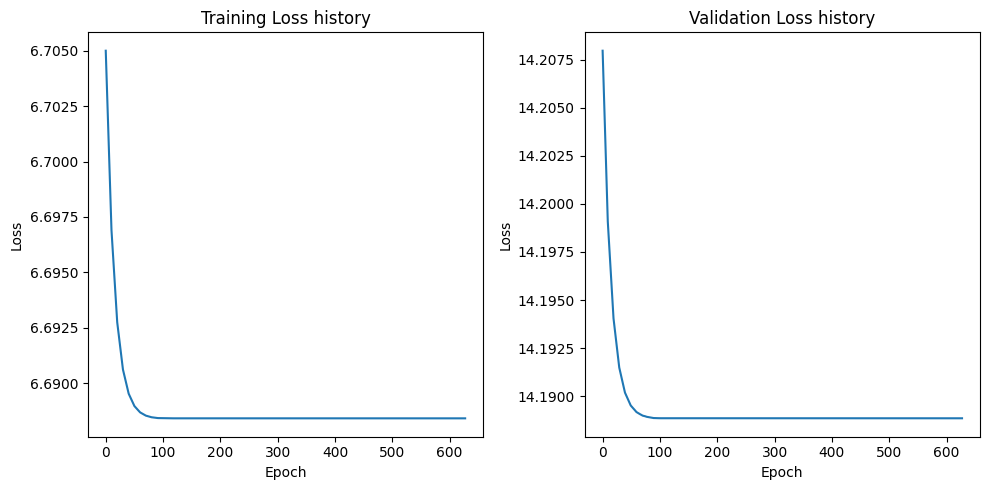

[I 2023-10-11 07:26:32,442] Trial 15 finished with value: 8.05984115600586 and parameters: {'hidden_layers': 4, 'epochs': 4415, 'batch_size': 639, 'learning_rate': 0.0327878290180749}. Best is trial 13 with value: 2.7137887477874756.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3452, Train Loss: 989.7411376953125, Validation Loss: 1002.4320475260416
Epoch 101/3452, Train Loss: 454.32708740234375, Validation Loss: 487.25525919596356
Epoch 201/3452, Train Loss: 454.02001800537107, Validation Loss: 486.96461995442706
Epoch 301/3452, Train Loss: 454.02001190185547, Validation Loss: 486.964599609375
Epoch 401/3452, Train Loss: 454.02001190185547, Validation Loss: 486.964599609375
Epoch 501/3452, Train Loss: 454.02001190185547, Validation Loss: 486.964599609375
Epoch 601/3452, Train Loss: 454.02001190185547, Validation Loss: 486.964599609375
Early stopping triggered.


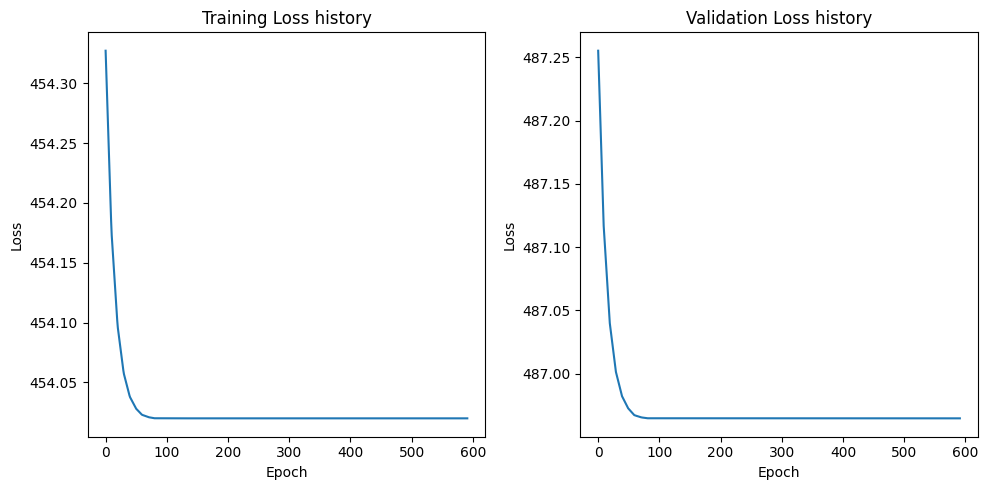

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3452, Train Loss: 1022.044189453125, Validation Loss: 1033.9132893880208
Epoch 101/3452, Train Loss: 674.1862701416015, Validation Loss: 702.5167439778646
Epoch 201/3452, Train Loss: 673.9535980224609, Validation Loss: 702.2741902669271
Epoch 301/3452, Train Loss: 673.9535980224609, Validation Loss: 702.2742309570312
Epoch 401/3452, Train Loss: 673.9535980224609, Validation Loss: 702.2742309570312
Epoch 501/3452, Train Loss: 673.9535980224609, Validation Loss: 702.2742309570312
Epoch 601/3452, Train Loss: 673.9535980224609, Validation Loss: 702.2742309570312
Early stopping triggered.


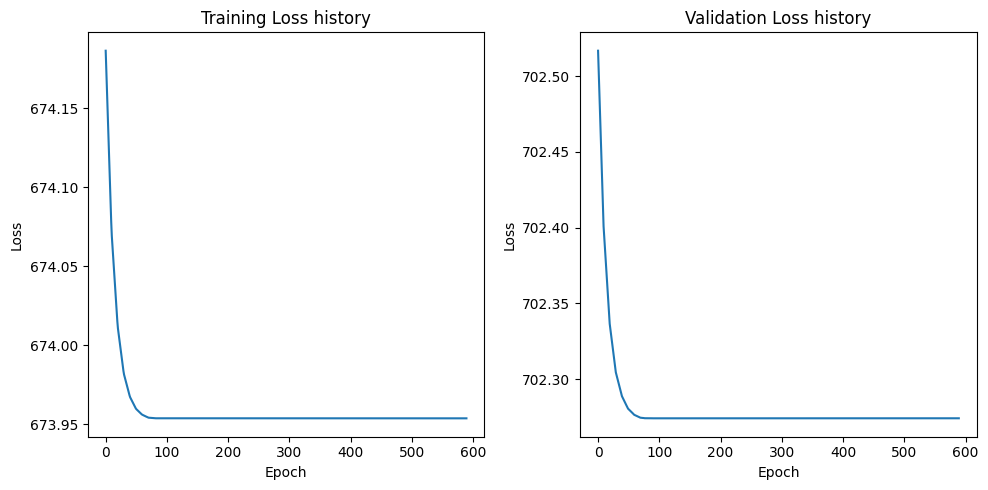

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3452, Train Loss: 145.48903045654296, Validation Loss: 149.34972127278647
Epoch 101/3452, Train Loss: 41.098626708984376, Validation Loss: 51.514809926350914
Epoch 201/3452, Train Loss: 41.05745429992676, Validation Loss: 51.47573216756185
Epoch 301/3452, Train Loss: 41.05745267868042, Validation Loss: 51.475729624430336
Epoch 401/3452, Train Loss: 41.05745267868042, Validation Loss: 51.475729624430336
Epoch 501/3452, Train Loss: 41.05745267868042, Validation Loss: 51.475729624430336
Epoch 601/3452, Train Loss: 41.05745267868042, Validation Loss: 51.475729624430336
Epoch 701/3452, Train Loss: 41.05745267868042, Validation Loss: 51.475729624430336
Early stopping triggered.


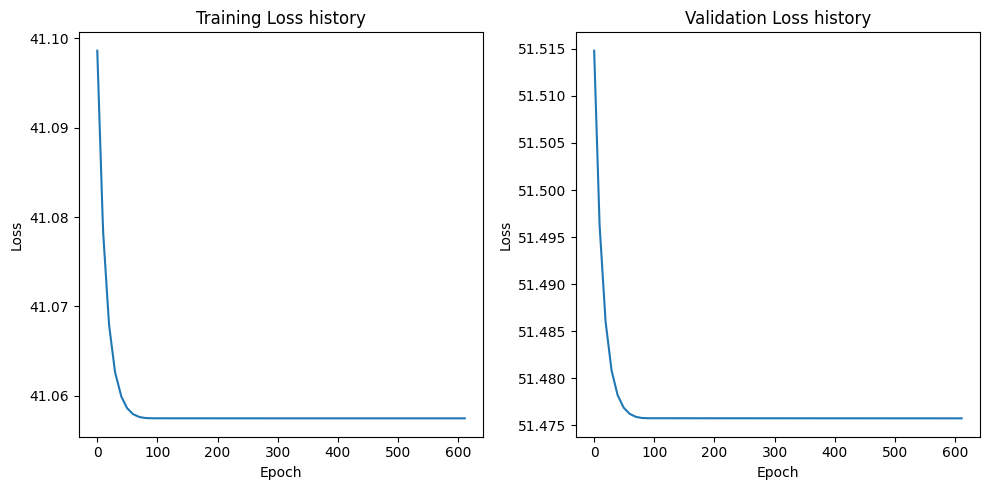

[I 2023-10-11 07:27:38,639] Trial 16 finished with value: 18.03394889831543 and parameters: {'hidden_layers': 3, 'epochs': 3452, 'batch_size': 250, 'learning_rate': 0.004697140402796154}. Best is trial 13 with value: 2.7137887477874756.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3580, Train Loss: 992.441880446214, Validation Loss: 854.0822448730469
Epoch 101/3580, Train Loss: 17.948344230651855, Validation Loss: 42.966458797454834
Epoch 201/3580, Train Loss: 17.897559312673714, Validation Loss: 42.8974232673645
Epoch 301/3580, Train Loss: 17.89755469102126, Validation Loss: 42.89741325378418
Epoch 401/3580, Train Loss: 17.89755469102126, Validation Loss: 42.89741325378418
Epoch 501/3580, Train Loss: 17.89755469102126, Validation Loss: 42.89741325378418
Epoch 601/3580, Train Loss: 17.89755469102126, Validation Loss: 42.89741325378418
Epoch 701/3580, Train Loss: 17.89755469102126, Validation Loss: 42.89741325378418
Early stopping triggered.


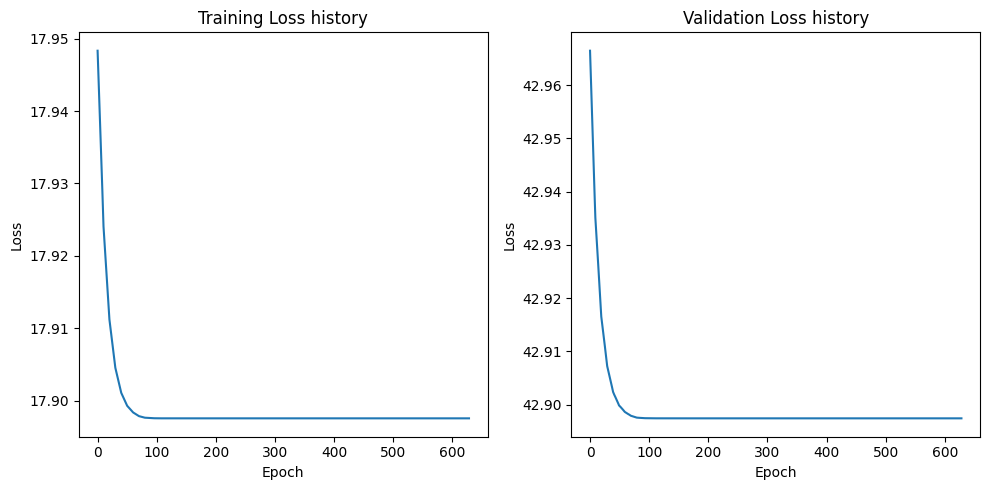

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3580, Train Loss: 1000.0916748046875, Validation Loss: 912.8575592041016
Epoch 101/3580, Train Loss: 17.079972413870003, Validation Loss: 45.82296919822693
Epoch 201/3580, Train Loss: 17.027378925910362, Validation Loss: 45.72384858131409
Epoch 301/3580, Train Loss: 17.027372983785774, Validation Loss: 45.72381591796875
Epoch 401/3580, Train Loss: 17.027372983785774, Validation Loss: 45.72381591796875
Epoch 501/3580, Train Loss: 17.027372983785774, Validation Loss: 45.72381591796875
Epoch 601/3580, Train Loss: 17.027372983785774, Validation Loss: 45.72381591796875
Epoch 701/3580, Train Loss: 17.027372983785774, Validation Loss: 45.72381591796875
Early stopping triggered.


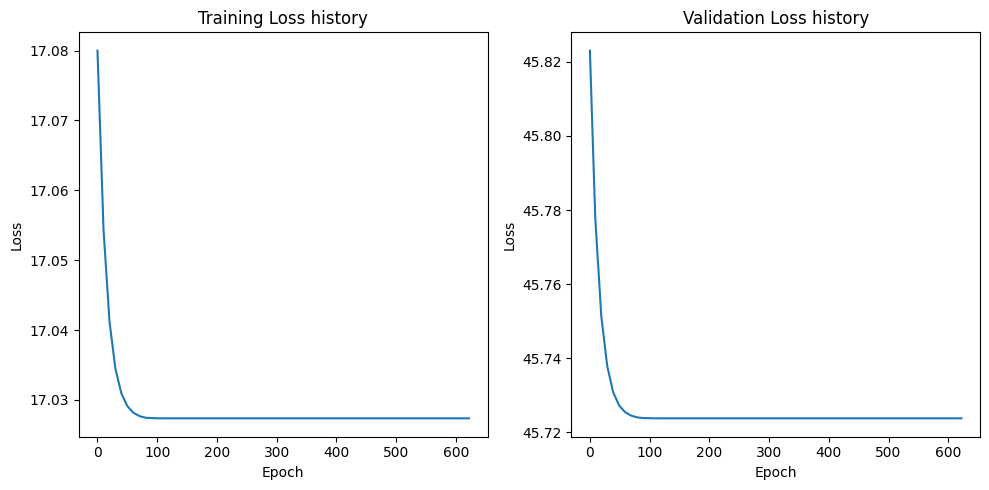

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3580, Train Loss: 113.19284791212816, Validation Loss: 79.84199237823486
Epoch 101/3580, Train Loss: 1.027882186266092, Validation Loss: 3.1643067598342896
Epoch 201/3580, Train Loss: 1.023212377841656, Validation Loss: 3.158394515514374
Epoch 301/3580, Train Loss: 1.0232113370528588, Validation Loss: 3.1583931148052216
Epoch 401/3580, Train Loss: 1.0232113370528588, Validation Loss: 3.1583931148052216
Epoch 501/3580, Train Loss: 1.0232113370528588, Validation Loss: 3.1583931148052216
Epoch 601/3580, Train Loss: 1.0232113370528588, Validation Loss: 3.1583931148052216
Epoch 701/3580, Train Loss: 1.0232113370528588, Validation Loss: 3.1583931148052216
Early stopping triggered.


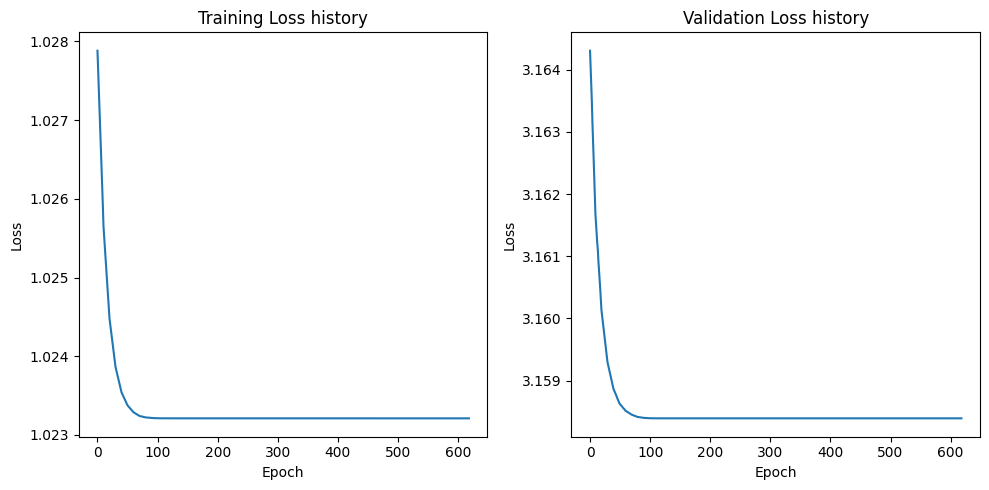

[I 2023-10-11 07:28:55,691] Trial 17 finished with value: 3.8193929195404053 and parameters: {'hidden_layers': 4, 'epochs': 3580, 'batch_size': 206, 'learning_rate': 0.030214653076424357}. Best is trial 13 with value: 2.7137887477874756.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4991, Train Loss: 988.7442626953125, Validation Loss: 1011.5233459472656
Epoch 101/4991, Train Loss: 700.5747549874442, Validation Loss: 746.998291015625
Epoch 201/4991, Train Loss: 700.2788434709821, Validation Loss: 746.7024841308594
Epoch 301/4991, Train Loss: 700.2788434709821, Validation Loss: 746.7024841308594
Epoch 401/4991, Train Loss: 700.2788434709821, Validation Loss: 746.7024841308594
Epoch 501/4991, Train Loss: 700.2788434709821, Validation Loss: 746.7024841308594
Epoch 601/4991, Train Loss: 700.2788434709821, Validation Loss: 746.7024841308594
Early stopping triggered.


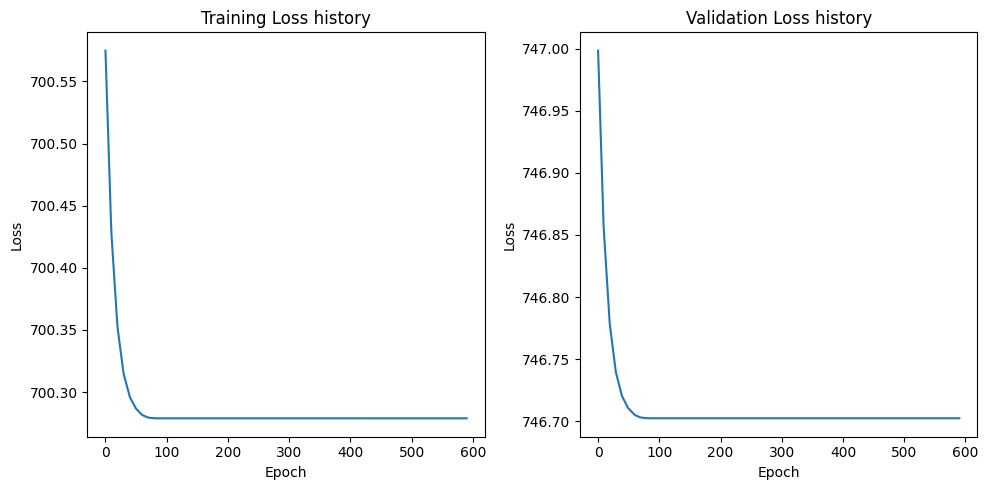

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4991, Train Loss: 1063.0048130580358, Validation Loss: 1082.3247985839844
Epoch 101/4991, Train Loss: 855.2620413643973, Validation Loss: 888.6502380371094
Epoch 201/4991, Train Loss: 855.0579310825893, Validation Loss: 888.4488220214844
Epoch 301/4991, Train Loss: 855.0579310825893, Validation Loss: 888.4488220214844
Epoch 401/4991, Train Loss: 855.0579310825893, Validation Loss: 888.4488220214844
Epoch 501/4991, Train Loss: 855.0579310825893, Validation Loss: 888.4488220214844
Epoch 601/4991, Train Loss: 855.0579310825893, Validation Loss: 888.4488220214844
Early stopping triggered.


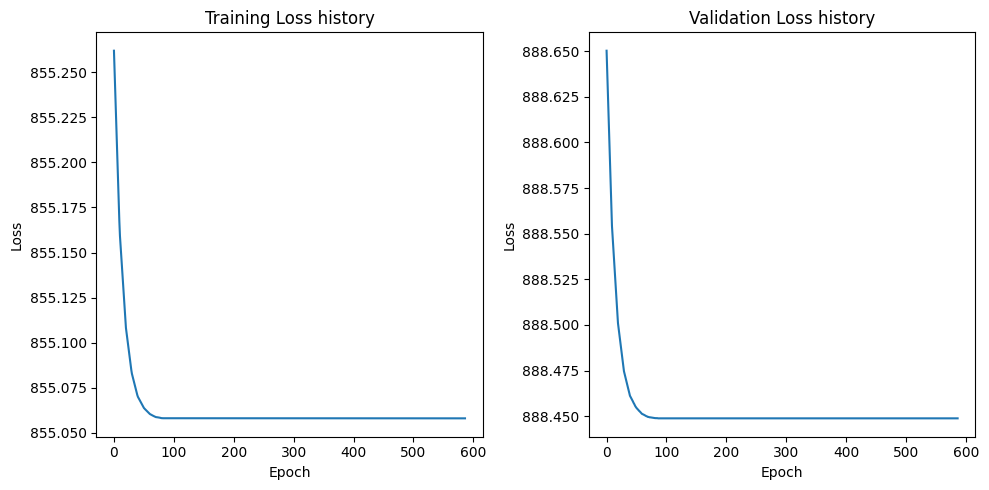

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4991, Train Loss: 144.76209912981307, Validation Loss: 150.12071990966797
Epoch 101/4991, Train Loss: 127.22655868530273, Validation Loss: 135.05373764038086
Epoch 201/4991, Train Loss: 127.216979435512, Validation Loss: 135.04413604736328
Epoch 301/4991, Train Loss: 127.216979435512, Validation Loss: 135.04413604736328
Epoch 401/4991, Train Loss: 127.216979435512, Validation Loss: 135.04413604736328
Epoch 501/4991, Train Loss: 127.216979435512, Validation Loss: 135.04413604736328
Epoch 601/4991, Train Loss: 127.216979435512, Validation Loss: 135.04413604736328
Early stopping triggered.


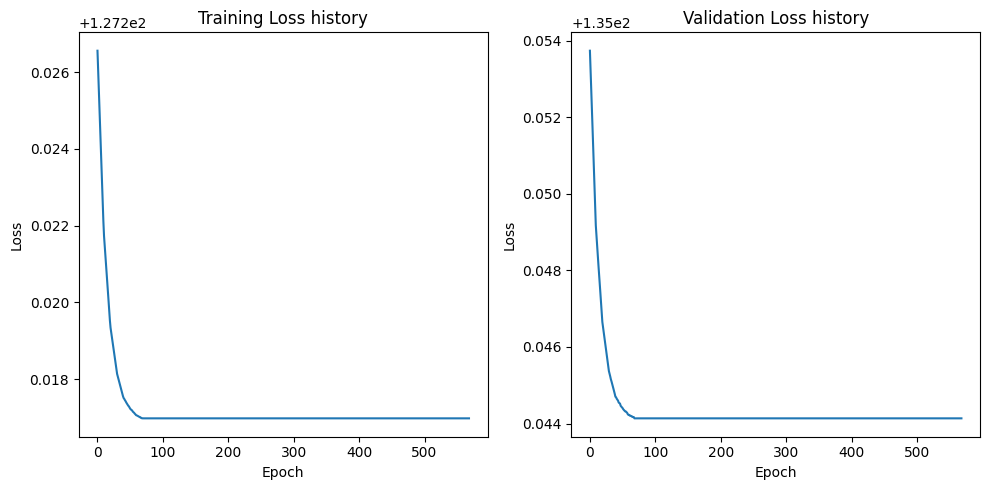

[I 2023-10-11 07:29:55,009] Trial 18 finished with value: 22.078340530395508 and parameters: {'hidden_layers': 2, 'epochs': 4991, 'batch_size': 401, 'learning_rate': 0.003307654802625339}. Best is trial 13 with value: 2.7137887477874756.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4391, Train Loss: 963.6322509765625, Validation Loss: 918.8650512695312
Epoch 101/4391, Train Loss: 34.88524398803711, Validation Loss: 51.55584144592285
Epoch 201/4391, Train Loss: 34.824602890014646, Validation Loss: 51.49415683746338
Epoch 301/4391, Train Loss: 34.824595260620114, Validation Loss: 51.49415111541748
Epoch 401/4391, Train Loss: 34.824595260620114, Validation Loss: 51.49415111541748
Epoch 501/4391, Train Loss: 34.824595260620114, Validation Loss: 51.49415111541748
Epoch 601/4391, Train Loss: 34.824595260620114, Validation Loss: 51.49415111541748
Epoch 701/4391, Train Loss: 34.824595260620114, Validation Loss: 51.49415111541748
Early stopping triggered.


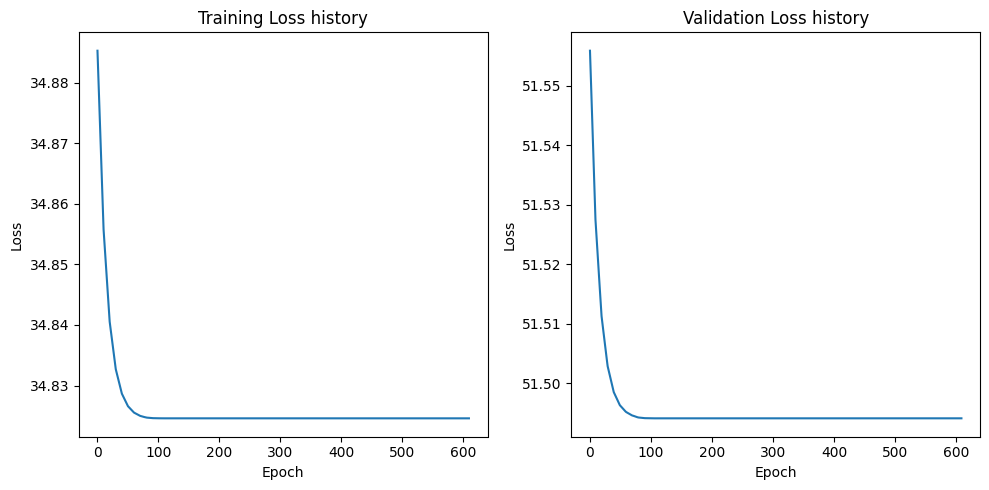

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4391, Train Loss: 990.5800170898438, Validation Loss: 977.9422912597656
Epoch 101/4391, Train Loss: 41.50217247009277, Validation Loss: 64.85293102264404
Epoch 201/4391, Train Loss: 41.421770858764646, Validation Loss: 64.77188014984131
Epoch 301/4391, Train Loss: 41.421760177612306, Validation Loss: 64.7718620300293
Epoch 401/4391, Train Loss: 41.421760177612306, Validation Loss: 64.7718620300293
Epoch 501/4391, Train Loss: 41.421760177612306, Validation Loss: 64.7718620300293
Epoch 601/4391, Train Loss: 41.421760177612306, Validation Loss: 64.7718620300293
Epoch 701/4391, Train Loss: 41.421760177612306, Validation Loss: 64.7718620300293
Early stopping triggered.


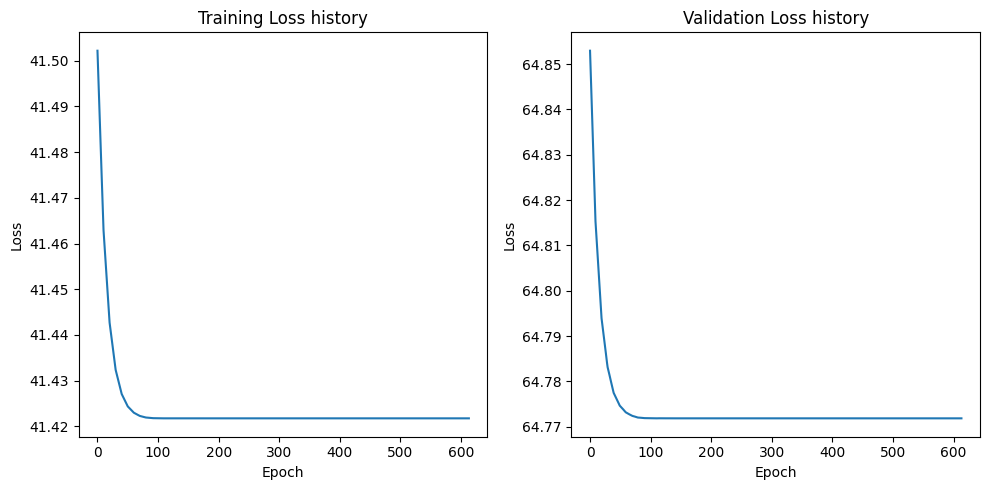

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4391, Train Loss: 136.21084899902343, Validation Loss: 126.07993698120117
Epoch 101/4391, Train Loss: 3.0766647338867186, Validation Loss: 4.928585767745972
Epoch 201/4391, Train Loss: 3.0690673828125, Validation Loss: 4.921151041984558
Epoch 301/4391, Train Loss: 3.0690658330917358, Validation Loss: 4.921151041984558
Epoch 401/4391, Train Loss: 3.0690658330917358, Validation Loss: 4.921151041984558
Epoch 501/4391, Train Loss: 3.0690658330917358, Validation Loss: 4.921151041984558
Epoch 601/4391, Train Loss: 3.0690658330917358, Validation Loss: 4.921151041984558
Epoch 701/4391, Train Loss: 3.0690658330917358, Validation Loss: 4.921151041984558
Early stopping triggered.


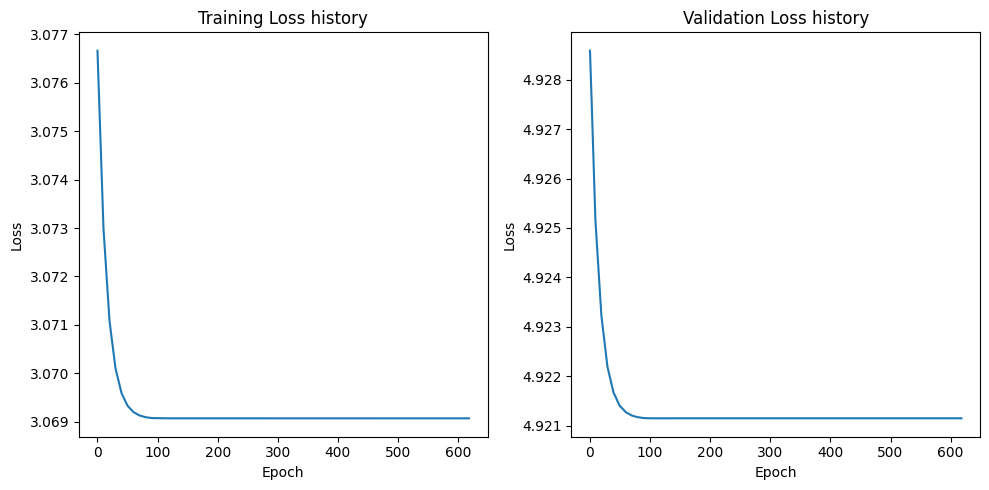

[I 2023-10-11 07:30:57,416] Trial 19 finished with value: 5.375020503997803 and parameters: {'hidden_layers': 4, 'epochs': 4391, 'batch_size': 576, 'learning_rate': 0.03992291504338411}. Best is trial 13 with value: 2.7137887477874756.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3715, Train Loss: 993.1094970703125, Validation Loss: 967.587890625
Epoch 101/3715, Train Loss: 430.41064453125, Validation Loss: 454.6462097167969
Epoch 201/3715, Train Loss: 430.0740432739258, Validation Loss: 454.3587951660156
Epoch 301/3715, Train Loss: 430.07401275634766, Validation Loss: 454.3587951660156
Epoch 401/3715, Train Loss: 430.07401275634766, Validation Loss: 454.3587951660156
Epoch 501/3715, Train Loss: 430.07401275634766, Validation Loss: 454.3587951660156
Epoch 601/3715, Train Loss: 430.07401275634766, Validation Loss: 454.3587951660156
Epoch 701/3715, Train Loss: 430.07401275634766, Validation Loss: 454.3587951660156
Early stopping triggered.


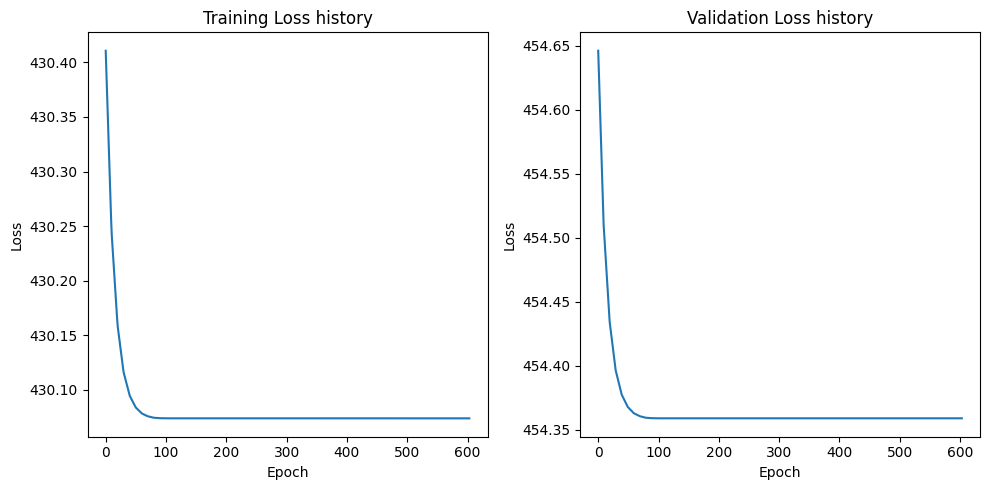

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3715, Train Loss: 1012.1422119140625, Validation Loss: 996.3538818359375
Epoch 101/3715, Train Loss: 447.22705078125, Validation Loss: 478.9284362792969
Epoch 201/3715, Train Loss: 446.8283233642578, Validation Loss: 478.5737609863281
Epoch 301/3715, Train Loss: 446.8282928466797, Validation Loss: 478.5737609863281
Epoch 401/3715, Train Loss: 446.8282928466797, Validation Loss: 478.5737609863281
Epoch 501/3715, Train Loss: 446.8282928466797, Validation Loss: 478.5737609863281
Epoch 601/3715, Train Loss: 446.8282928466797, Validation Loss: 478.5737609863281
Early stopping triggered.


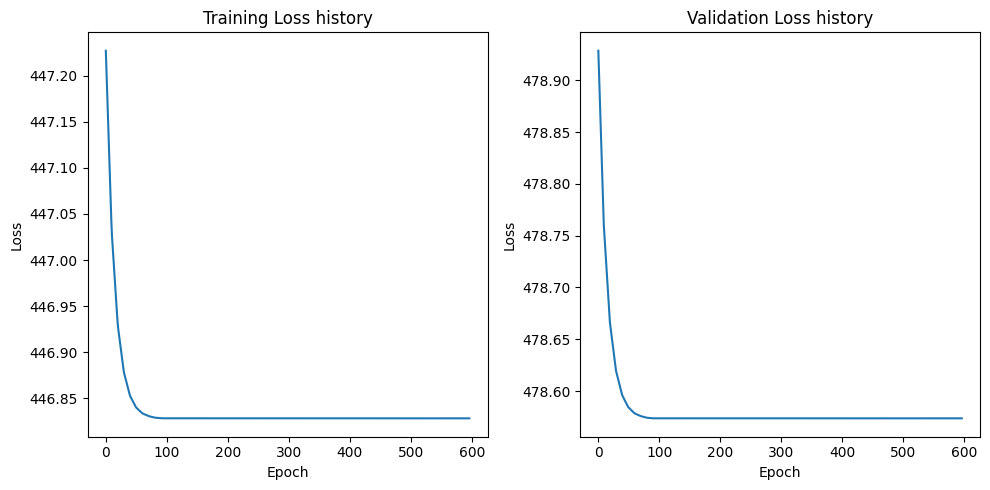

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3715, Train Loss: 145.49503326416016, Validation Loss: 140.95762634277344
Epoch 101/3715, Train Loss: 24.51983094215393, Validation Loss: 34.24739456176758
Epoch 201/3715, Train Loss: 24.477972745895386, Validation Loss: 34.21518325805664
Epoch 301/3715, Train Loss: 24.47796940803528, Validation Loss: 34.215179443359375
Epoch 401/3715, Train Loss: 24.47796940803528, Validation Loss: 34.215179443359375
Epoch 501/3715, Train Loss: 24.47796940803528, Validation Loss: 34.215179443359375
Epoch 601/3715, Train Loss: 24.47796940803528, Validation Loss: 34.215179443359375
Epoch 701/3715, Train Loss: 24.47796940803528, Validation Loss: 34.215179443359375
Early stopping triggered.


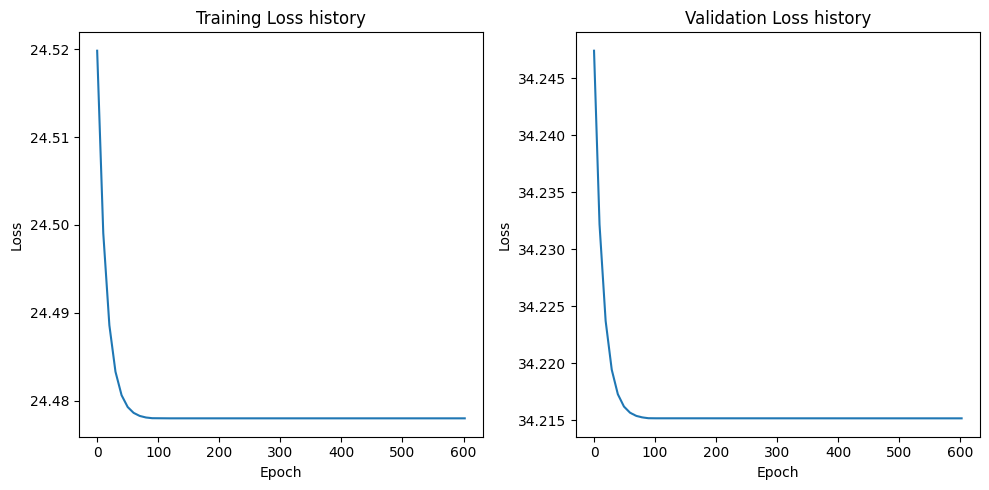

[I 2023-10-11 07:31:53,167] Trial 20 finished with value: 15.990370750427246 and parameters: {'hidden_layers': 3, 'epochs': 3715, 'batch_size': 759, 'learning_rate': 0.012276877782998203}. Best is trial 13 with value: 2.7137887477874756.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4096, Train Loss: 1013.5906720842634, Validation Loss: 879.8648376464844
Epoch 101/4096, Train Loss: 18.597851276397705, Validation Loss: 40.27676773071289
Epoch 201/4096, Train Loss: 18.52952139718192, Validation Loss: 40.15641689300537
Epoch 301/4096, Train Loss: 18.529510634286062, Validation Loss: 40.156399726867676
Epoch 401/4096, Train Loss: 18.529510634286062, Validation Loss: 40.156399726867676
Epoch 501/4096, Train Loss: 18.529510634286062, Validation Loss: 40.156399726867676
Epoch 601/4096, Train Loss: 18.529510634286062, Validation Loss: 40.156399726867676
Epoch 701/4096, Train Loss: 18.529510634286062, Validation Loss: 40.156399726867676
Early stopping triggered.


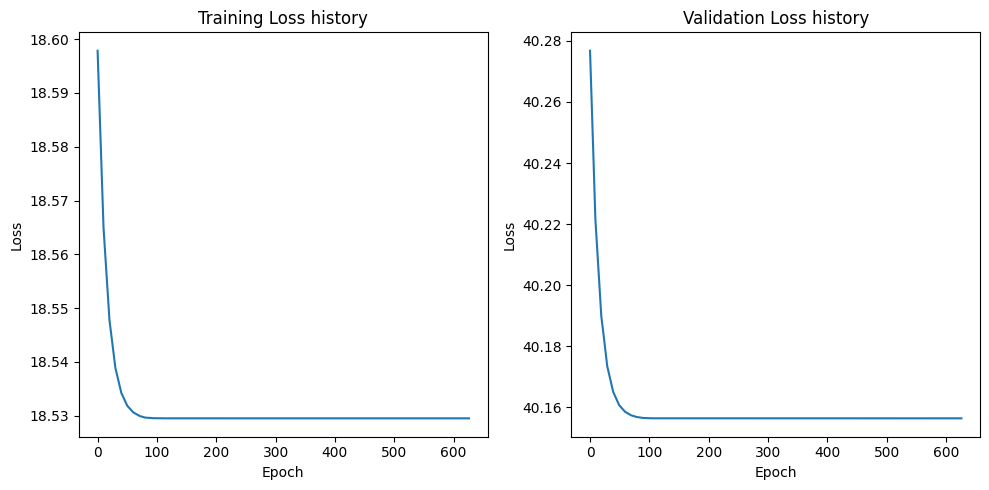

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4096, Train Loss: 944.6844395228794, Validation Loss: 775.1047973632812
Epoch 101/4096, Train Loss: 14.34153073174613, Validation Loss: 33.77686882019043
Epoch 201/4096, Train Loss: 14.273769174303327, Validation Loss: 33.678587913513184
Epoch 301/4096, Train Loss: 14.273749079023089, Validation Loss: 33.678561210632324
Epoch 401/4096, Train Loss: 14.273749079023089, Validation Loss: 33.678561210632324
Epoch 501/4096, Train Loss: 14.273749079023089, Validation Loss: 33.678561210632324
Epoch 601/4096, Train Loss: 14.273749079023089, Validation Loss: 33.678561210632324
Epoch 701/4096, Train Loss: 14.273749079023089, Validation Loss: 33.678561210632324
Early stopping triggered.


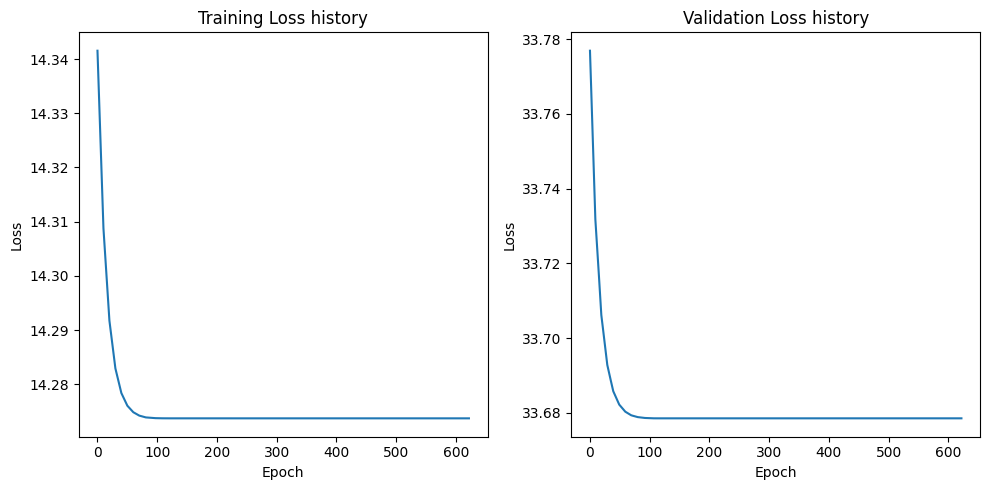

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4096, Train Loss: 125.7657448904855, Validation Loss: 104.4709701538086
Epoch 101/4096, Train Loss: 1.3456310714994157, Validation Loss: 3.190313160419464
Epoch 201/4096, Train Loss: 1.3386025130748749, Validation Loss: 3.1760963797569275
Epoch 301/4096, Train Loss: 1.3386005461215973, Validation Loss: 3.176092505455017
Epoch 401/4096, Train Loss: 1.3386005461215973, Validation Loss: 3.176092505455017
Epoch 501/4096, Train Loss: 1.3386005461215973, Validation Loss: 3.176092505455017
Epoch 601/4096, Train Loss: 1.3386005461215973, Validation Loss: 3.176092505455017
Epoch 701/4096, Train Loss: 1.3386005461215973, Validation Loss: 3.176092505455017
Early stopping triggered.


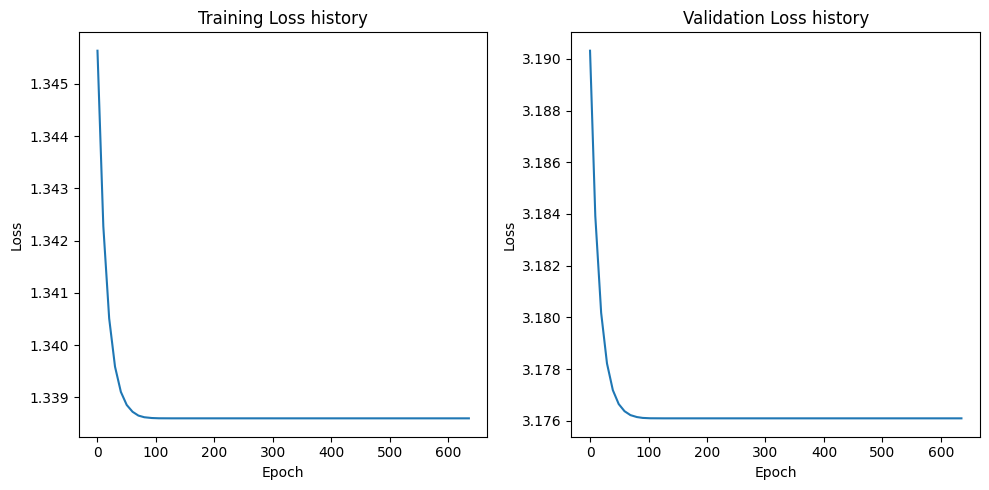

[I 2023-10-11 07:32:57,415] Trial 21 finished with value: 3.7697994709014893 and parameters: {'hidden_layers': 3, 'epochs': 4096, 'batch_size': 408, 'learning_rate': 0.08967812095640075}. Best is trial 13 with value: 2.7137887477874756.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4341, Train Loss: 954.8143463134766, Validation Loss: 769.539306640625
Epoch 101/4341, Train Loss: 24.902395963668823, Validation Loss: 46.34115409851074
Epoch 201/4341, Train Loss: 24.8034451007843, Validation Loss: 46.20236682891846
Epoch 301/4341, Train Loss: 24.80343270301819, Validation Loss: 46.20234680175781
Epoch 401/4341, Train Loss: 24.80343270301819, Validation Loss: 46.20234680175781
Epoch 501/4341, Train Loss: 24.80343270301819, Validation Loss: 46.20234680175781
Epoch 601/4341, Train Loss: 24.80343270301819, Validation Loss: 46.20234680175781
Epoch 701/4341, Train Loss: 24.80343270301819, Validation Loss: 46.20234680175781
Early stopping triggered.


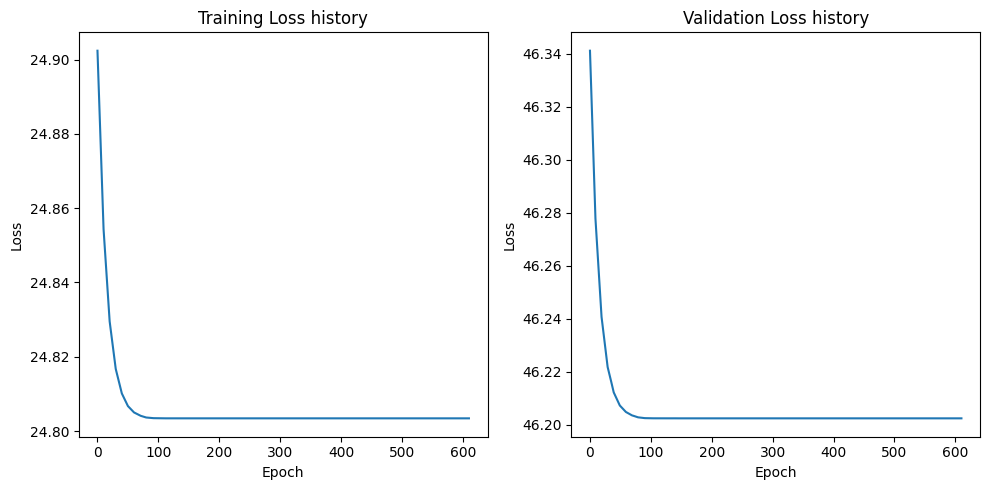

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4341, Train Loss: 974.7090530395508, Validation Loss: 906.6360473632812
Epoch 101/4341, Train Loss: 32.234678506851196, Validation Loss: 71.4070816040039
Epoch 201/4341, Train Loss: 32.143537521362305, Validation Loss: 71.23716926574707
Epoch 301/4341, Train Loss: 32.14352464675903, Validation Loss: 71.23714065551758
Epoch 401/4341, Train Loss: 32.14352464675903, Validation Loss: 71.23714065551758
Epoch 501/4341, Train Loss: 32.14352464675903, Validation Loss: 71.23714065551758
Epoch 601/4341, Train Loss: 32.14352464675903, Validation Loss: 71.23714065551758
Epoch 701/4341, Train Loss: 32.14352464675903, Validation Loss: 71.23714065551758
Early stopping triggered.


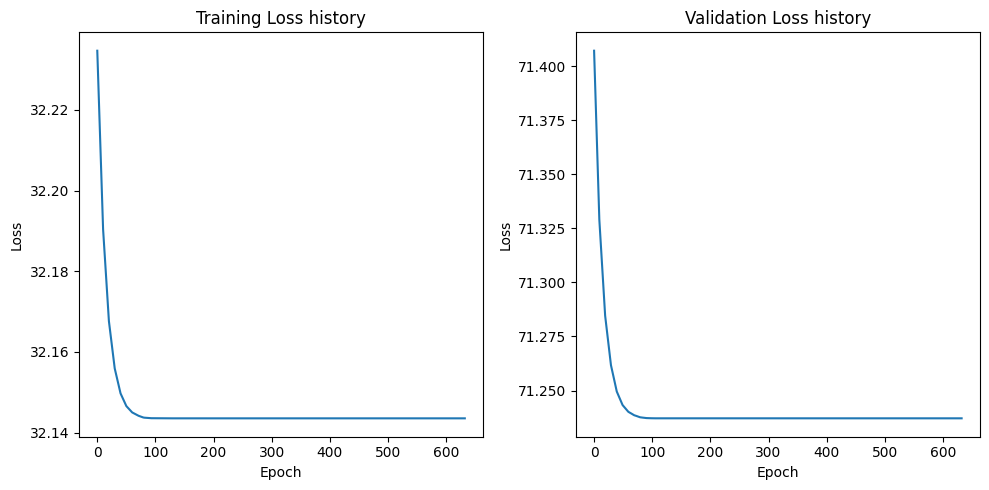

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4341, Train Loss: 118.64812517166138, Validation Loss: 85.92884826660156
Epoch 101/4341, Train Loss: 1.6415282040834427, Validation Loss: 3.988248825073242
Epoch 201/4341, Train Loss: 1.6316598802804947, Validation Loss: 3.970455229282379
Epoch 301/4341, Train Loss: 1.6316573917865753, Validation Loss: 3.9704525470733643
Epoch 401/4341, Train Loss: 1.6316573917865753, Validation Loss: 3.9704525470733643
Epoch 501/4341, Train Loss: 1.6316573917865753, Validation Loss: 3.9704525470733643
Epoch 601/4341, Train Loss: 1.6316573917865753, Validation Loss: 3.9704525470733643
Epoch 701/4341, Train Loss: 1.6316573917865753, Validation Loss: 3.9704525470733643
Early stopping triggered.


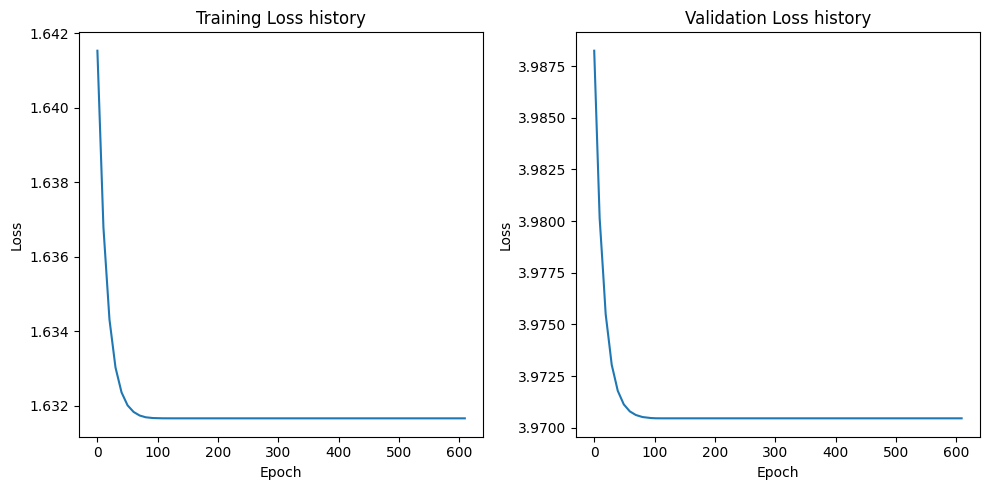

[I 2023-10-11 07:34:00,285] Trial 22 finished with value: 4.3329081535339355 and parameters: {'hidden_layers': 3, 'epochs': 4341, 'batch_size': 335, 'learning_rate': 0.04923281971386551}. Best is trial 13 with value: 2.7137887477874756.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3174, Train Loss: 855.0754801432291, Validation Loss: 639.4532979329427
Epoch 101/3174, Train Loss: 6.406969130039215, Validation Loss: 23.608150164286297
Epoch 201/3174, Train Loss: 6.375517308712006, Validation Loss: 23.52681541442871
Epoch 301/3174, Train Loss: 6.375507573286693, Validation Loss: 23.526821454366047
Epoch 401/3174, Train Loss: 6.375507573286693, Validation Loss: 23.526821454366047
Epoch 501/3174, Train Loss: 6.375507573286693, Validation Loss: 23.526821454366047
Epoch 601/3174, Train Loss: 6.375507573286693, Validation Loss: 23.526821454366047
Epoch 701/3174, Train Loss: 6.375507573286693, Validation Loss: 23.526821454366047
Early stopping triggered.


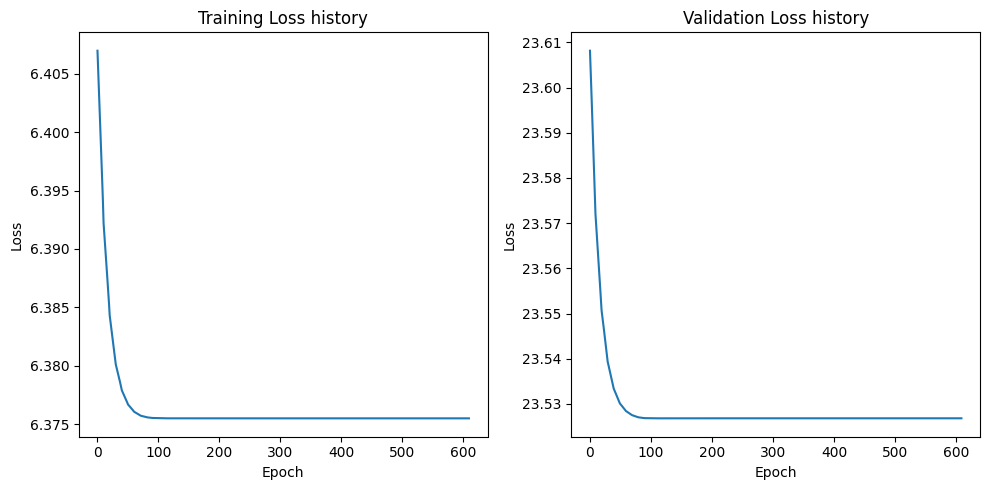

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3174, Train Loss: 800.9670054117838, Validation Loss: 598.765858968099
Epoch 101/3174, Train Loss: 7.670058647791545, Validation Loss: 31.15452257792155
Epoch 201/3174, Train Loss: 7.642735322316487, Validation Loss: 31.083910942077637
Epoch 301/3174, Train Loss: 7.642727375030518, Validation Loss: 31.083887736002605
Epoch 401/3174, Train Loss: 7.642727375030518, Validation Loss: 31.083887736002605
Epoch 501/3174, Train Loss: 7.642727375030518, Validation Loss: 31.083887736002605
Epoch 601/3174, Train Loss: 7.642727375030518, Validation Loss: 31.083887736002605
Epoch 701/3174, Train Loss: 7.642727375030518, Validation Loss: 31.083887736002605
Early stopping triggered.


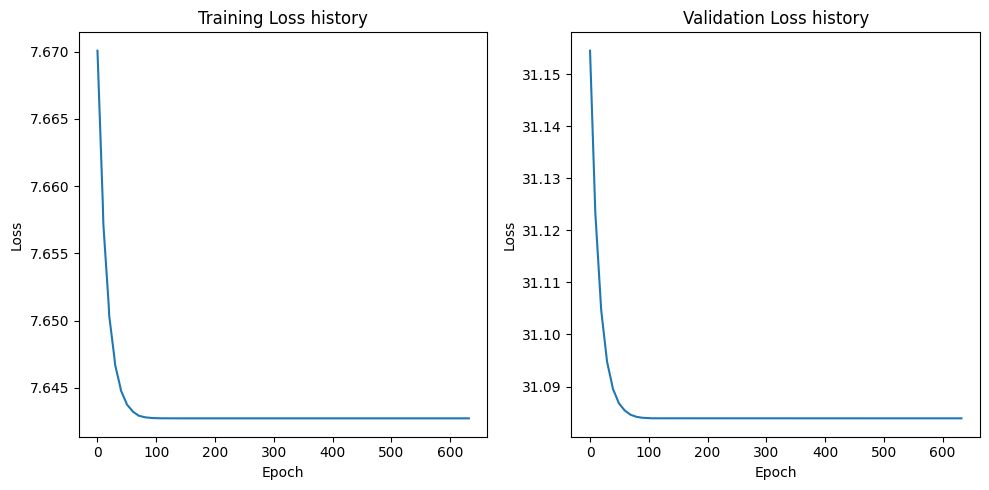

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3174, Train Loss: 73.91083876291911, Validation Loss: 454.03808848063153
Epoch 101/3174, Train Loss: 1.9515442550182343, Validation Loss: 5.01479156812032
Epoch 201/3174, Train Loss: 1.944332202275594, Validation Loss: 4.998847961425781
Epoch 301/3174, Train Loss: 1.9443305134773254, Validation Loss: 4.998845179875691
Epoch 401/3174, Train Loss: 1.9443305134773254, Validation Loss: 4.998845179875691
Epoch 501/3174, Train Loss: 1.9443305134773254, Validation Loss: 4.998845179875691
Epoch 601/3174, Train Loss: 1.9443305134773254, Validation Loss: 4.998845179875691
Epoch 701/3174, Train Loss: 1.9443305134773254, Validation Loss: 4.998845179875691
Early stopping triggered.


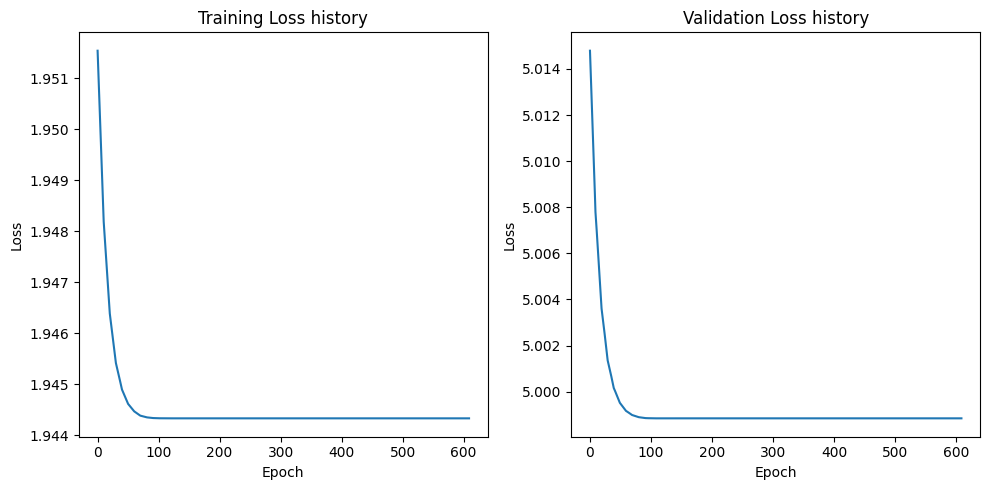

[I 2023-10-11 07:35:14,075] Trial 23 finished with value: 2.76061749458313 and parameters: {'hidden_layers': 4, 'epochs': 3174, 'batch_size': 212, 'learning_rate': 0.09967330710906462}. Best is trial 13 with value: 2.7137887477874756.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3080, Train Loss: 923.9115365835337, Validation Loss: 819.213623046875
Epoch 101/3080, Train Loss: 15.752356749314528, Validation Loss: 34.60719037055969
Epoch 201/3080, Train Loss: 15.704144404484676, Validation Loss: 34.537017703056335
Epoch 301/3080, Train Loss: 15.70413849903987, Validation Loss: 34.537012457847595
Epoch 401/3080, Train Loss: 15.70413849903987, Validation Loss: 34.537012457847595
Epoch 501/3080, Train Loss: 15.70413849903987, Validation Loss: 34.537012457847595
Epoch 601/3080, Train Loss: 15.70413849903987, Validation Loss: 34.537012457847595
Epoch 701/3080, Train Loss: 15.70413849903987, Validation Loss: 34.537012457847595
Early stopping triggered.


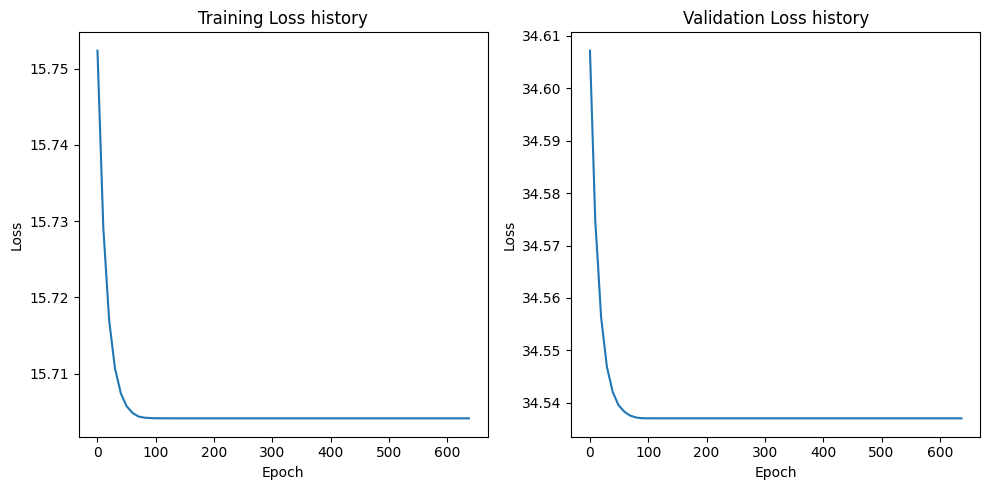

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3080, Train Loss: 973.440927358774, Validation Loss: 894.6659545898438
Epoch 101/3080, Train Loss: 19.083685104663555, Validation Loss: 43.567898631095886
Epoch 201/3080, Train Loss: 19.02533743931697, Validation Loss: 43.49622678756714
Epoch 301/3080, Train Loss: 19.025333477900578, Validation Loss: 43.49622869491577
Epoch 401/3080, Train Loss: 19.025333477900578, Validation Loss: 43.49622869491577
Epoch 501/3080, Train Loss: 19.025333477900578, Validation Loss: 43.49622869491577
Epoch 601/3080, Train Loss: 19.025333477900578, Validation Loss: 43.49622869491577
Epoch 701/3080, Train Loss: 19.025333477900578, Validation Loss: 43.49622869491577
Early stopping triggered.


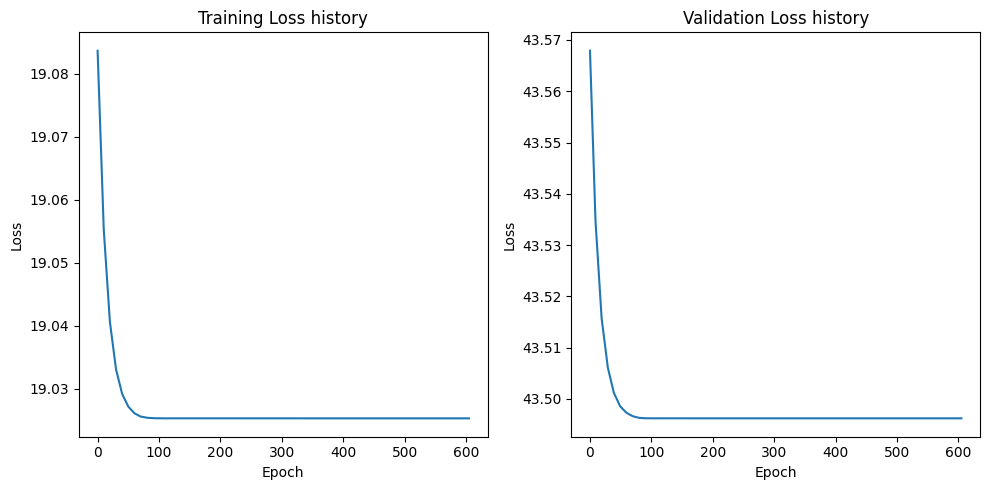

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3080, Train Loss: 115.86006311269907, Validation Loss: 88.06025791168213
Epoch 101/3080, Train Loss: 1.199571261039147, Validation Loss: 3.1410557478666306
Epoch 201/3080, Train Loss: 1.1941940165483034, Validation Loss: 3.132791519165039
Epoch 301/3080, Train Loss: 1.1941931018462548, Validation Loss: 3.1327903419733047
Epoch 401/3080, Train Loss: 1.1941931018462548, Validation Loss: 3.1327903419733047
Epoch 501/3080, Train Loss: 1.1941931018462548, Validation Loss: 3.1327903419733047
Epoch 601/3080, Train Loss: 1.1941931018462548, Validation Loss: 3.1327903419733047
Epoch 701/3080, Train Loss: 1.1941931018462548, Validation Loss: 3.1327903419733047
Early stopping triggered.


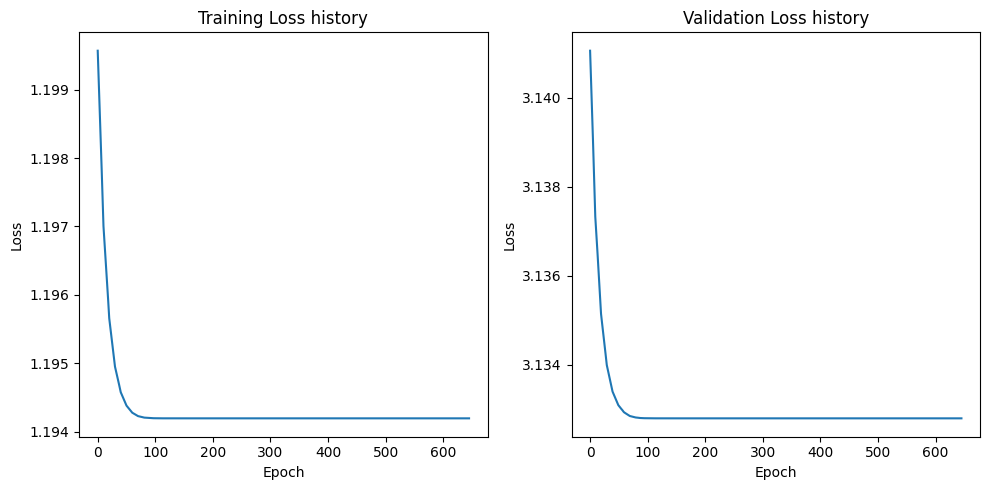

[I 2023-10-11 07:36:31,367] Trial 24 finished with value: 3.5589077472686768 and parameters: {'hidden_layers': 4, 'epochs': 3080, 'batch_size': 198, 'learning_rate': 0.022906523866078533}. Best is trial 13 with value: 2.7137887477874756.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3236, Train Loss: 956.7065175374349, Validation Loss: 736.6603393554688
Epoch 101/3236, Train Loss: 10.468848745028177, Validation Loss: 32.17803764343262
Epoch 201/3236, Train Loss: 10.436782360076904, Validation Loss: 32.135153452555336
Epoch 301/3236, Train Loss: 10.436777790387472, Validation Loss: 32.13516426086426
Epoch 401/3236, Train Loss: 10.436777790387472, Validation Loss: 32.13516426086426
Epoch 501/3236, Train Loss: 10.436777790387472, Validation Loss: 32.13516426086426
Epoch 601/3236, Train Loss: 10.436777790387472, Validation Loss: 32.13516426086426
Early stopping triggered.


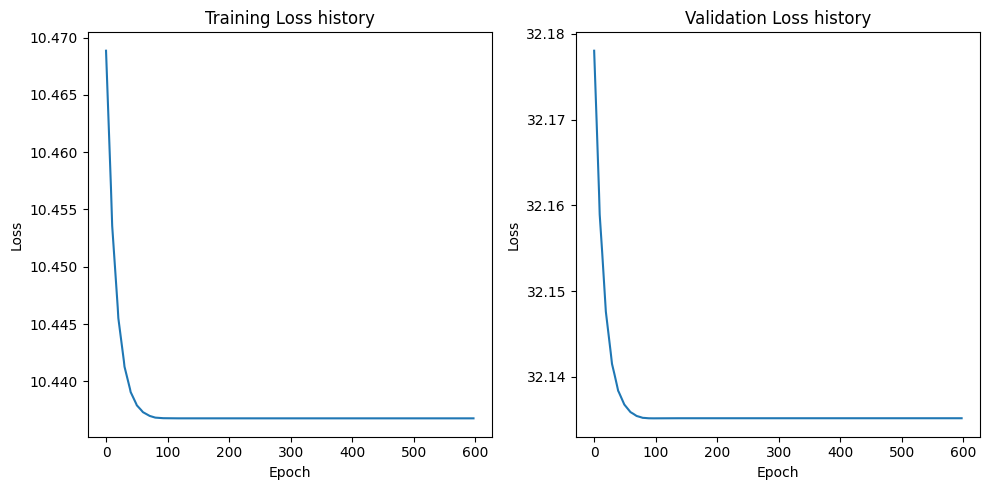

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3236, Train Loss: 860.462392171224, Validation Loss: 582.0138651529948
Epoch 101/3236, Train Loss: 9.747529963652292, Validation Loss: 35.88098589579264
Epoch 201/3236, Train Loss: 9.720944066842398, Validation Loss: 35.8077392578125
Epoch 301/3236, Train Loss: 9.72094033161799, Validation Loss: 35.80773417154948
Epoch 401/3236, Train Loss: 9.72094033161799, Validation Loss: 35.80773417154948
Epoch 501/3236, Train Loss: 9.72094033161799, Validation Loss: 35.80773417154948
Epoch 601/3236, Train Loss: 9.72094033161799, Validation Loss: 35.80773417154948
Epoch 701/3236, Train Loss: 9.72094033161799, Validation Loss: 35.80773417154948
Early stopping triggered.


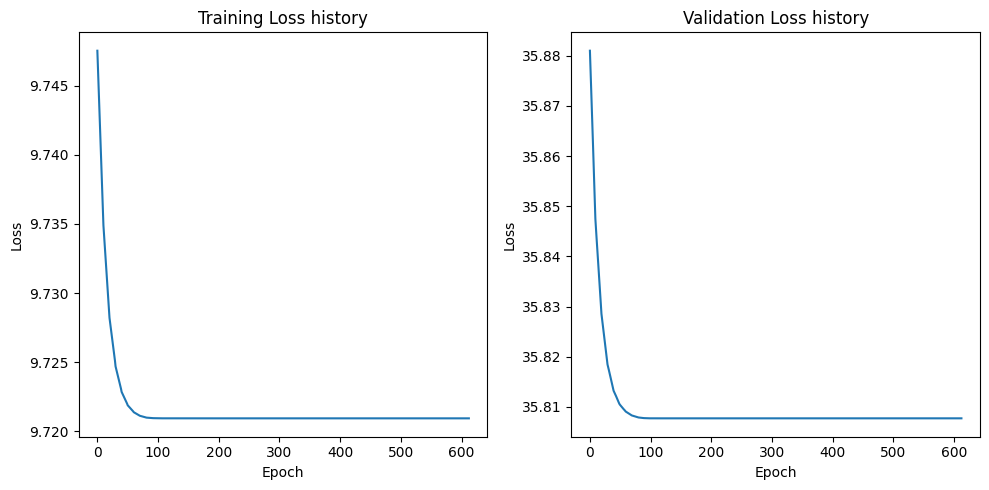

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3236, Train Loss: 120.12516593933105, Validation Loss: 95.3679428100586
Epoch 101/3236, Train Loss: 1.003035917878151, Validation Loss: 3.5930721362431846
Epoch 201/3236, Train Loss: 0.9993225907286009, Validation Loss: 3.584377566973368
Epoch 301/3236, Train Loss: 0.9993218096594015, Validation Loss: 3.5843773682912192
Epoch 401/3236, Train Loss: 0.9993218096594015, Validation Loss: 3.5843773682912192
Epoch 501/3236, Train Loss: 0.9993218096594015, Validation Loss: 3.5843773682912192
Epoch 601/3236, Train Loss: 0.9993218096594015, Validation Loss: 3.5843773682912192
Epoch 701/3236, Train Loss: 0.9993218096594015, Validation Loss: 3.5843773682912192
Early stopping triggered.


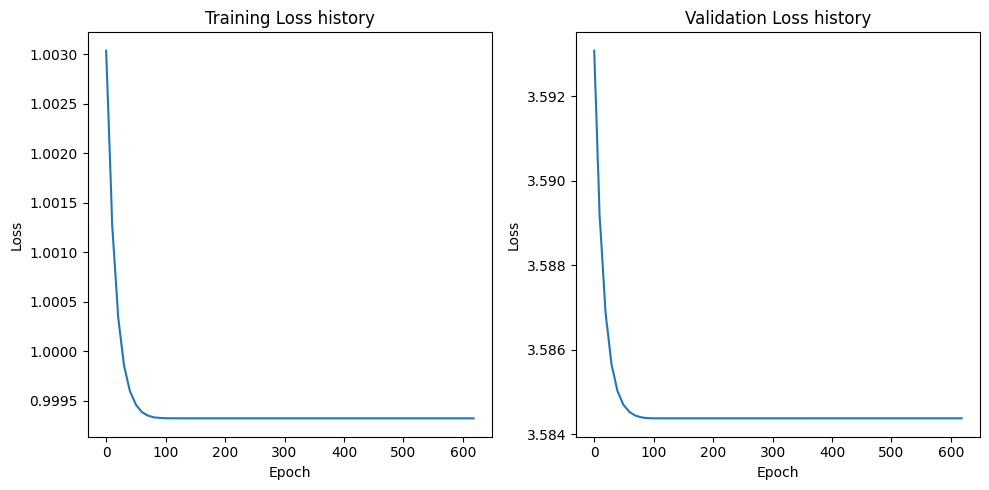

[I 2023-10-11 07:37:44,295] Trial 25 finished with value: 3.1791555881500244 and parameters: {'hidden_layers': 5, 'epochs': 3236, 'batch_size': 226, 'learning_rate': 0.04413540089928745}. Best is trial 13 with value: 2.7137887477874756.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2768, Train Loss: 752.1071875, Validation Loss: 610.5309579031808
Epoch 101/2768, Train Loss: 4.492741451263428, Validation Loss: 15.114951593535286
Epoch 201/2768, Train Loss: 4.457872142791748, Validation Loss: 15.045854210853577
Epoch 301/2768, Train Loss: 4.457855958938598, Validation Loss: 15.045837981360298
Epoch 401/2768, Train Loss: 4.457855958938598, Validation Loss: 15.045837981360298
Epoch 501/2768, Train Loss: 4.457855958938598, Validation Loss: 15.045837981360298
Epoch 601/2768, Train Loss: 4.457855958938598, Validation Loss: 15.045837981360298
Epoch 701/2768, Train Loss: 4.457855958938598, Validation Loss: 15.045837981360298
Early stopping triggered.


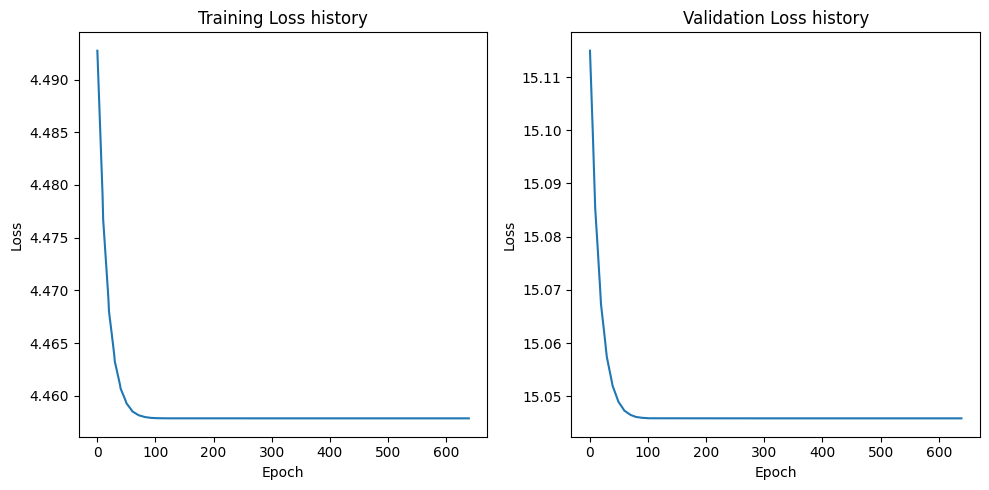

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2768, Train Loss: 741.74224609375, Validation Loss: 674.059064592634
Epoch 101/2768, Train Loss: 3.0451008033752442, Validation Loss: 12.640616723469325
Epoch 201/2768, Train Loss: 3.014897346496582, Validation Loss: 12.574849724769592
Epoch 301/2768, Train Loss: 3.014883794784546, Validation Loss: 12.574821318898882
Epoch 401/2768, Train Loss: 3.014883794784546, Validation Loss: 12.574821318898882
Epoch 501/2768, Train Loss: 3.014883794784546, Validation Loss: 12.574821318898882
Epoch 601/2768, Train Loss: 3.014883794784546, Validation Loss: 12.574821318898882
Epoch 701/2768, Train Loss: 3.014883794784546, Validation Loss: 12.574821318898882
Early stopping triggered.


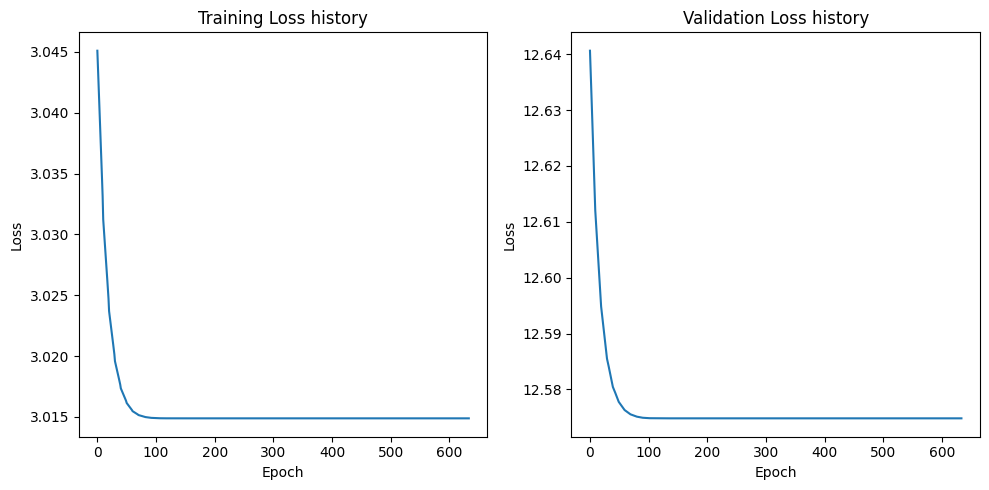

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2768, Train Loss: 78.65414001464843, Validation Loss: 214.07398223876953
Epoch 101/2768, Train Loss: 0.8939926135540008, Validation Loss: 3.349500673157828
Epoch 201/2768, Train Loss: 0.888612699508667, Validation Loss: 3.3339438012668063
Epoch 301/2768, Train Loss: 0.8886101865768432, Validation Loss: 3.3339365805898393
Epoch 401/2768, Train Loss: 0.8886101865768432, Validation Loss: 3.3339365805898393
Epoch 501/2768, Train Loss: 0.8886101865768432, Validation Loss: 3.3339365805898393
Epoch 601/2768, Train Loss: 0.8886101865768432, Validation Loss: 3.3339365805898393
Epoch 701/2768, Train Loss: 0.8886101865768432, Validation Loss: 3.3339365805898393
Early stopping triggered.


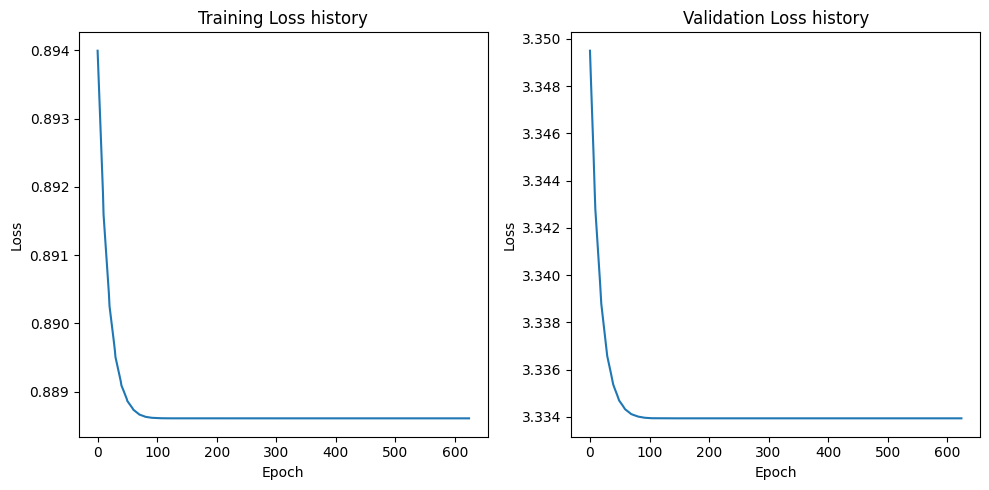

[I 2023-10-11 07:39:26,048] Trial 26 finished with value: 2.044973134994507 and parameters: {'hidden_layers': 4, 'epochs': 2768, 'batch_size': 101, 'learning_rate': 0.0484438207326677}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2683, Train Loss: 994.606923828125, Validation Loss: 893.4620622907366
Epoch 101/2683, Train Loss: 14.168207359313964, Validation Loss: 36.08001436505999
Epoch 201/2683, Train Loss: 14.114988746643066, Validation Loss: 35.9792412349156
Epoch 301/2683, Train Loss: 14.114985790252685, Validation Loss: 35.97924654824393
Epoch 401/2683, Train Loss: 14.114985790252685, Validation Loss: 35.97924654824393
Epoch 501/2683, Train Loss: 14.114985790252685, Validation Loss: 35.97924654824393
Epoch 601/2683, Train Loss: 14.114985790252685, Validation Loss: 35.97924654824393
Early stopping triggered.


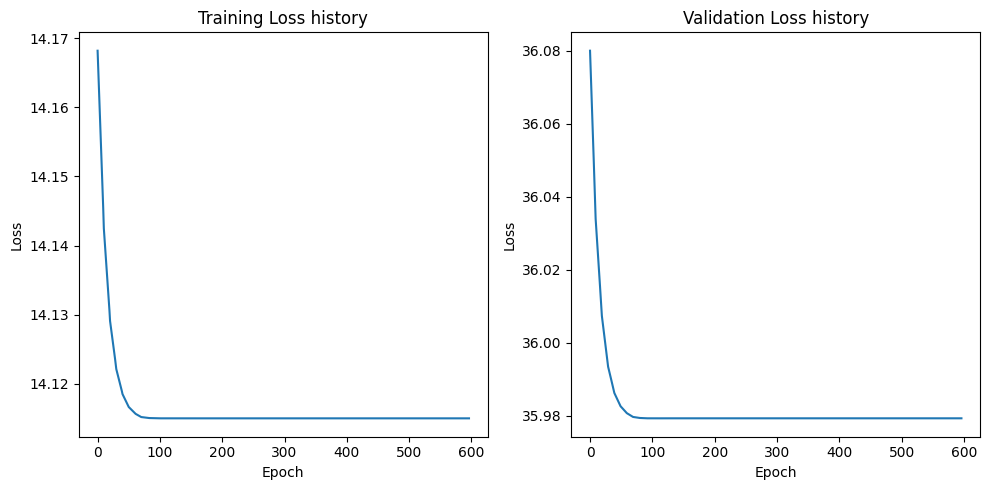

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2683, Train Loss: 1014.73611328125, Validation Loss: 968.5386439732143
Epoch 101/2683, Train Loss: 19.615792484283446, Validation Loss: 32.883855138506206
Epoch 201/2683, Train Loss: 19.520999050140382, Validation Loss: 32.769860540117534
Epoch 301/2683, Train Loss: 19.52099349975586, Validation Loss: 32.76985890524728
Epoch 401/2683, Train Loss: 19.52099349975586, Validation Loss: 32.76985890524728
Epoch 501/2683, Train Loss: 19.52099349975586, Validation Loss: 32.76985890524728
Epoch 601/2683, Train Loss: 19.52099349975586, Validation Loss: 32.76985890524728
Epoch 701/2683, Train Loss: 19.52099349975586, Validation Loss: 32.76985890524728
Early stopping triggered.


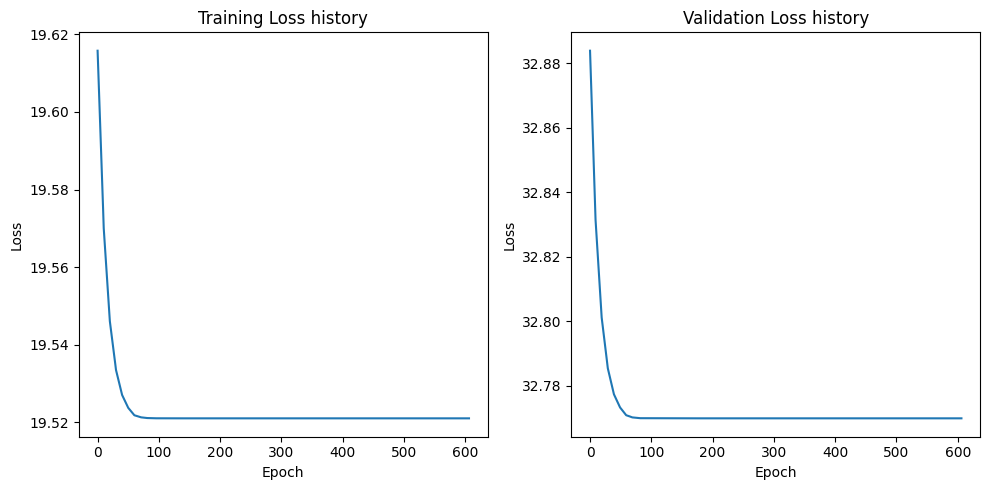

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2683, Train Loss: 112.69928466796875, Validation Loss: 83.30856650216239
Epoch 101/2683, Train Loss: 0.9177165460586548, Validation Loss: 2.503991799695151
Epoch 201/2683, Train Loss: 0.91308886885643, Validation Loss: 2.49519915665899
Epoch 301/2683, Train Loss: 0.9130882334709167, Validation Loss: 2.495198049715587
Epoch 401/2683, Train Loss: 0.9130882334709167, Validation Loss: 2.495198049715587
Epoch 501/2683, Train Loss: 0.9130882334709167, Validation Loss: 2.495198049715587
Epoch 601/2683, Train Loss: 0.9130882334709167, Validation Loss: 2.495198049715587
Epoch 701/2683, Train Loss: 0.9130882334709167, Validation Loss: 2.495198049715587
Early stopping triggered.


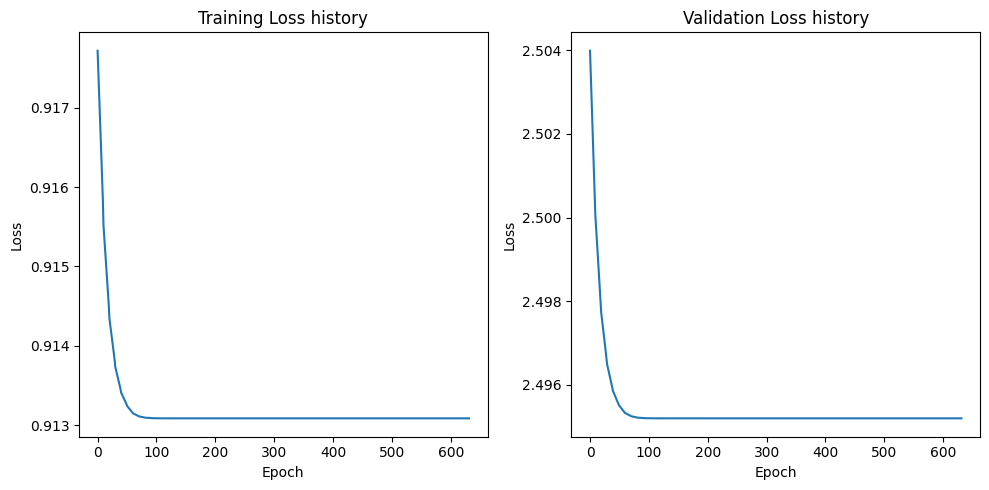

[I 2023-10-11 07:41:01,460] Trial 27 finished with value: 3.6056041717529297 and parameters: {'hidden_layers': 4, 'epochs': 2683, 'batch_size': 103, 'learning_rate': 0.014622712192656099}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2350, Train Loss: 910.1892578125, Validation Loss: 768.8139190673828
Epoch 101/2350, Train Loss: 13.11547114054362, Validation Loss: 39.09599304199219
Epoch 201/2350, Train Loss: 13.071003723144532, Validation Loss: 39.02566337585449
Epoch 301/2350, Train Loss: 13.070998446146648, Validation Loss: 39.025667667388916
Epoch 401/2350, Train Loss: 13.070998446146648, Validation Loss: 39.025667667388916
Epoch 501/2350, Train Loss: 13.070998446146648, Validation Loss: 39.025667667388916
Epoch 601/2350, Train Loss: 13.070998446146648, Validation Loss: 39.025667667388916
Early stopping triggered.


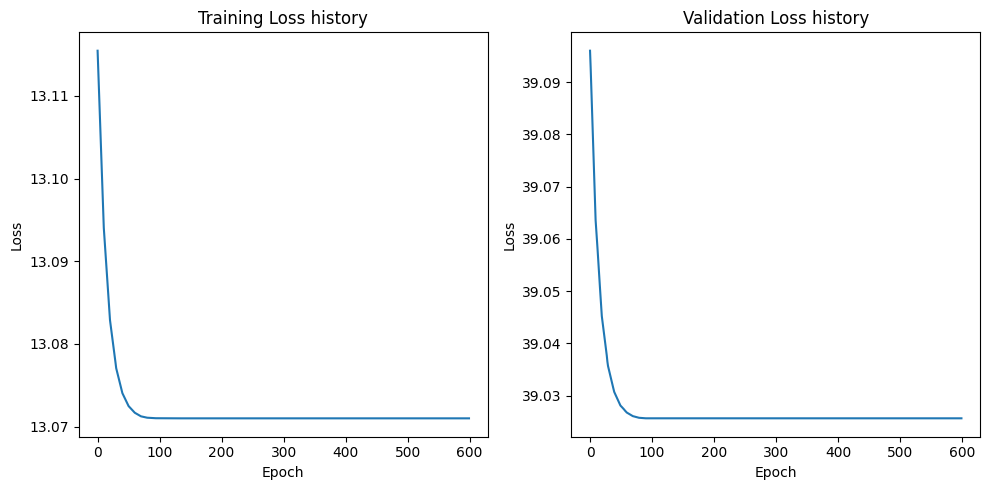

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2350, Train Loss: 952.7287638346354, Validation Loss: 811.2409057617188
Epoch 101/2350, Train Loss: 13.370553652445475, Validation Loss: 40.94684839248657
Epoch 201/2350, Train Loss: 13.326139958699544, Validation Loss: 40.88323497772217
Epoch 301/2350, Train Loss: 13.326135635375977, Validation Loss: 40.88323259353638
Epoch 401/2350, Train Loss: 13.326135635375977, Validation Loss: 40.88323259353638
Epoch 501/2350, Train Loss: 13.326135635375977, Validation Loss: 40.88323259353638
Epoch 601/2350, Train Loss: 13.326135635375977, Validation Loss: 40.88323259353638
Epoch 701/2350, Train Loss: 13.326135635375977, Validation Loss: 40.88323259353638
Early stopping triggered.


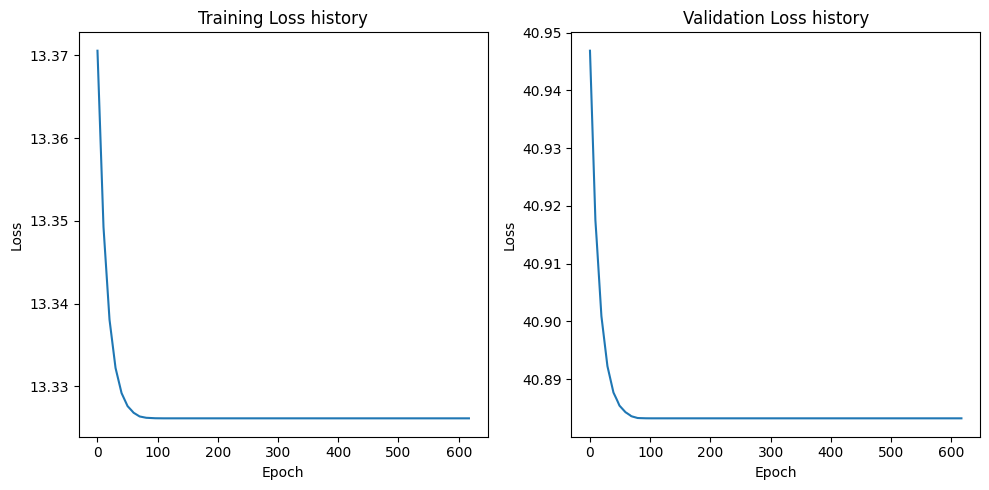

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2350, Train Loss: 117.4190284729004, Validation Loss: 87.60161972045898
Epoch 101/2350, Train Loss: 1.1587644894917806, Validation Loss: 3.815827339887619
Epoch 201/2350, Train Loss: 1.1540863156318664, Validation Loss: 3.804646670818329
Epoch 301/2350, Train Loss: 1.1540854454040528, Validation Loss: 3.8046441972255707
Epoch 401/2350, Train Loss: 1.1540854454040528, Validation Loss: 3.8046441972255707
Epoch 501/2350, Train Loss: 1.1540854454040528, Validation Loss: 3.8046441972255707
Epoch 601/2350, Train Loss: 1.1540854454040528, Validation Loss: 3.8046441972255707
Epoch 701/2350, Train Loss: 1.1540854454040528, Validation Loss: 3.8046441972255707
Early stopping triggered.


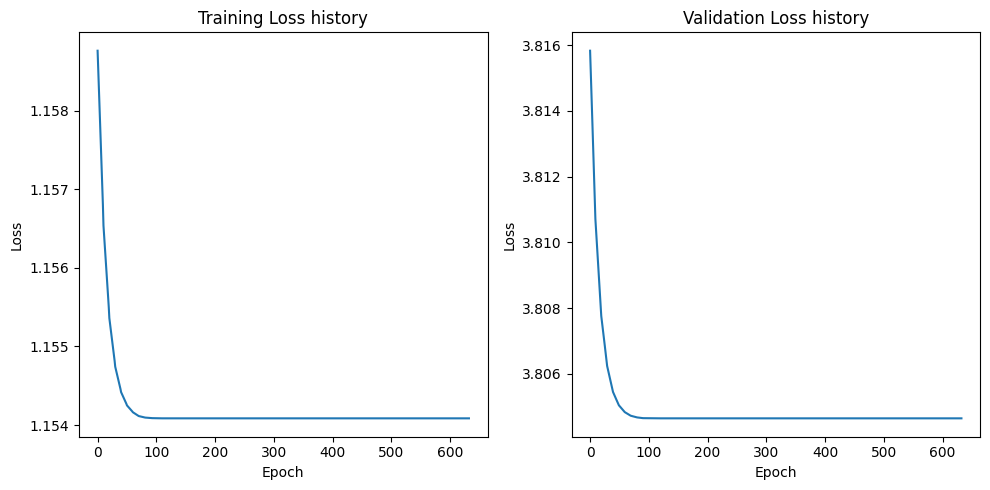

[I 2023-10-11 07:42:22,357] Trial 28 finished with value: 3.247004747390747 and parameters: {'hidden_layers': 5, 'epochs': 2350, 'batch_size': 172, 'learning_rate': 0.022281549260954783}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1513, Train Loss: 828.8262390136719, Validation Loss: 585.336669921875
Epoch 101/1513, Train Loss: 4.840847623348236, Validation Loss: 23.18347063064575
Epoch 201/1513, Train Loss: 4.817547571659088, Validation Loss: 23.10968542098999
Epoch 301/1513, Train Loss: 4.817540240287781, Validation Loss: 23.109697818756104
Epoch 401/1513, Train Loss: 4.817540240287781, Validation Loss: 23.109697818756104
Epoch 501/1513, Train Loss: 4.817540240287781, Validation Loss: 23.109697818756104
Epoch 601/1513, Train Loss: 4.817540240287781, Validation Loss: 23.109697818756104
Epoch 701/1513, Train Loss: 4.817540240287781, Validation Loss: 23.109697818756104
Early stopping triggered.


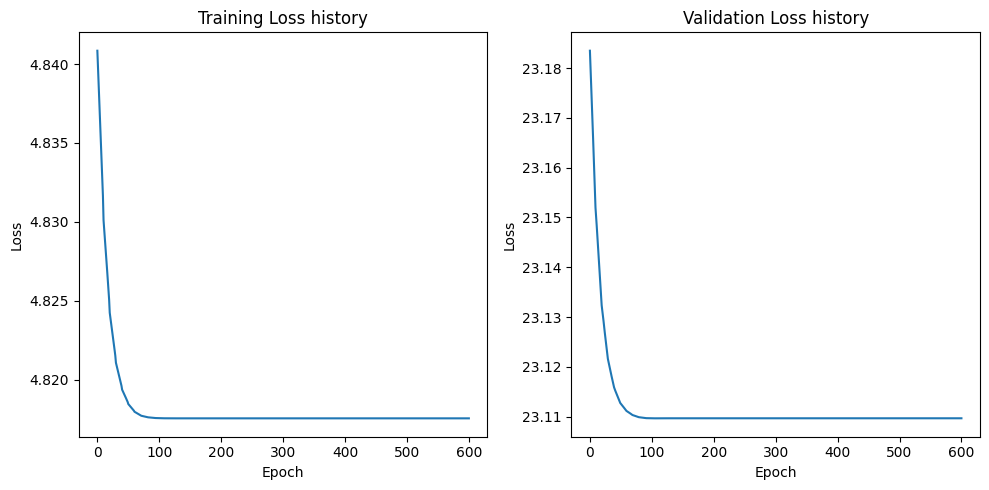

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1513, Train Loss: 786.1955017089844, Validation Loss: 559.8015625
Epoch 101/1513, Train Loss: 5.4612367153167725, Validation Loss: 19.863551139831543
Epoch 201/1513, Train Loss: 5.435437381267548, Validation Loss: 19.80554542541504
Epoch 301/1513, Train Loss: 5.435429096221924, Validation Loss: 19.805527019500733
Epoch 401/1513, Train Loss: 5.435429096221924, Validation Loss: 19.805527019500733
Epoch 501/1513, Train Loss: 5.435429096221924, Validation Loss: 19.805527019500733
Epoch 601/1513, Train Loss: 5.435429096221924, Validation Loss: 19.805527019500733
Epoch 701/1513, Train Loss: 5.435429096221924, Validation Loss: 19.805527019500733
Early stopping triggered.


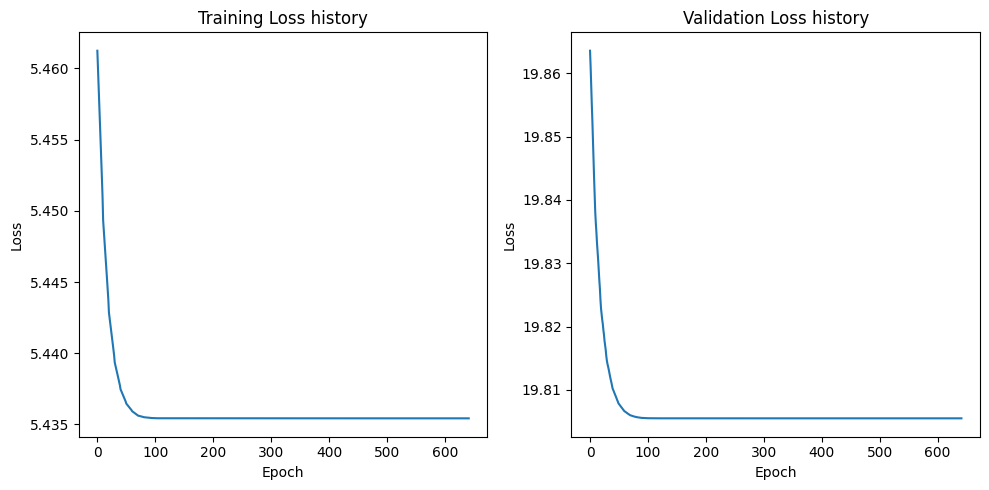

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1513, Train Loss: 63.438378715515135, Validation Loss: 279.3476249694824
Epoch 101/1513, Train Loss: 0.8878171652555465, Validation Loss: 2.745300316810608
Epoch 201/1513, Train Loss: 0.8831409722566604, Validation Loss: 2.734482669830322
Epoch 301/1513, Train Loss: 0.8831388980150223, Validation Loss: 2.7344803333282472
Epoch 401/1513, Train Loss: 0.8831388980150223, Validation Loss: 2.7344803333282472
Epoch 501/1513, Train Loss: 0.8831388980150223, Validation Loss: 2.7344803333282472
Epoch 601/1513, Train Loss: 0.8831388980150223, Validation Loss: 2.7344803333282472
Epoch 701/1513, Train Loss: 0.8831388980150223, Validation Loss: 2.7344803333282472
Early stopping triggered.


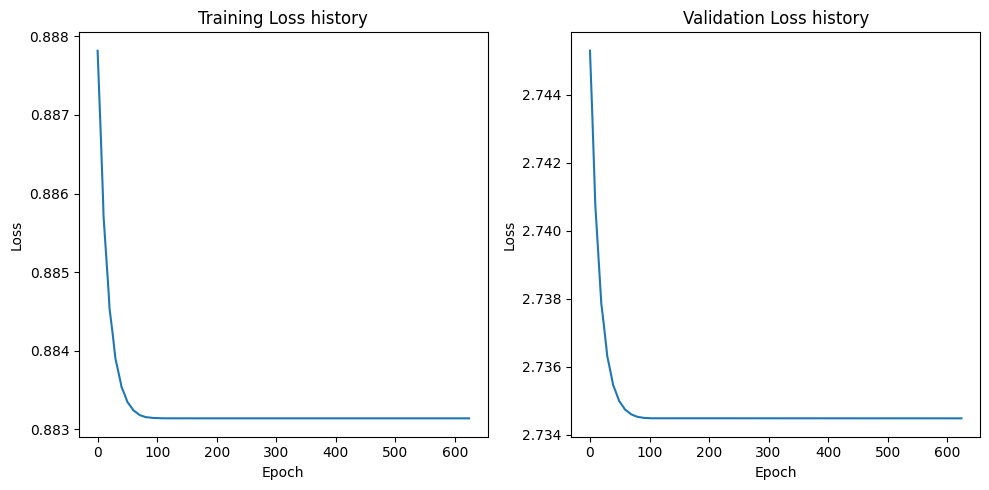

[I 2023-10-11 07:43:49,223] Trial 29 finished with value: 2.4074866771698 and parameters: {'hidden_layers': 5, 'epochs': 1513, 'batch_size': 126, 'learning_rate': 0.04914552105043667}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1514, Train Loss: 985.957763671875, Validation Loss: 972.2359008789062
Epoch 101/1514, Train Loss: 221.7985397338867, Validation Loss: 260.9624917166574
Epoch 201/1514, Train Loss: 221.47827728271486, Validation Loss: 260.65001133510043
Epoch 301/1514, Train Loss: 221.478271484375, Validation Loss: 260.6500222342355
Epoch 401/1514, Train Loss: 221.478271484375, Validation Loss: 260.6500222342355
Epoch 501/1514, Train Loss: 221.478271484375, Validation Loss: 260.6500222342355
Epoch 601/1514, Train Loss: 221.478271484375, Validation Loss: 260.6500222342355
Early stopping triggered.


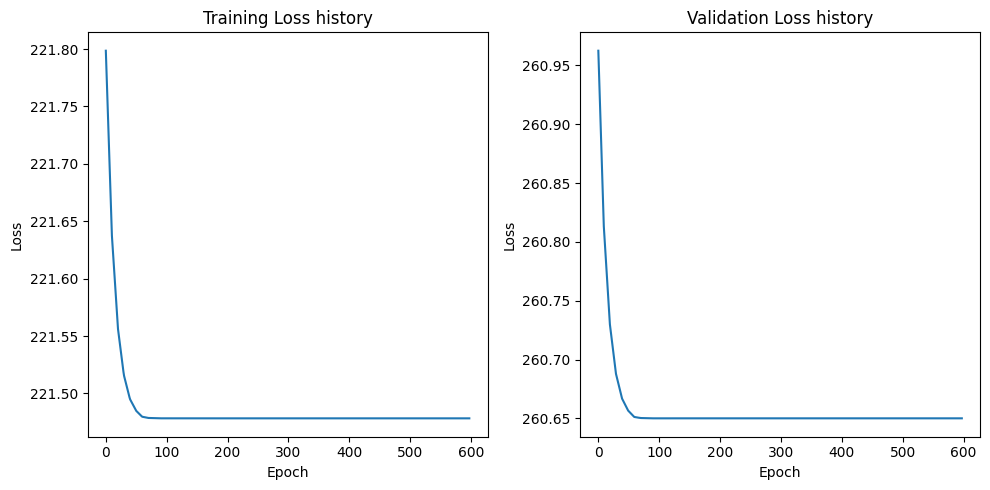

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1514, Train Loss: 1028.1789819335938, Validation Loss: 1018.0005754743304
Epoch 101/1514, Train Loss: 226.27428039550782, Validation Loss: 266.8884059361049
Epoch 201/1514, Train Loss: 225.92589324951172, Validation Loss: 266.54378618512834
Epoch 301/1514, Train Loss: 225.92589080810546, Validation Loss: 266.54377310616627
Epoch 401/1514, Train Loss: 225.92589080810546, Validation Loss: 266.54377310616627
Epoch 501/1514, Train Loss: 225.92589080810546, Validation Loss: 266.54377310616627
Epoch 601/1514, Train Loss: 225.92589080810546, Validation Loss: 266.54377310616627
Epoch 701/1514, Train Loss: 225.92589080810546, Validation Loss: 266.54377310616627
Early stopping triggered.


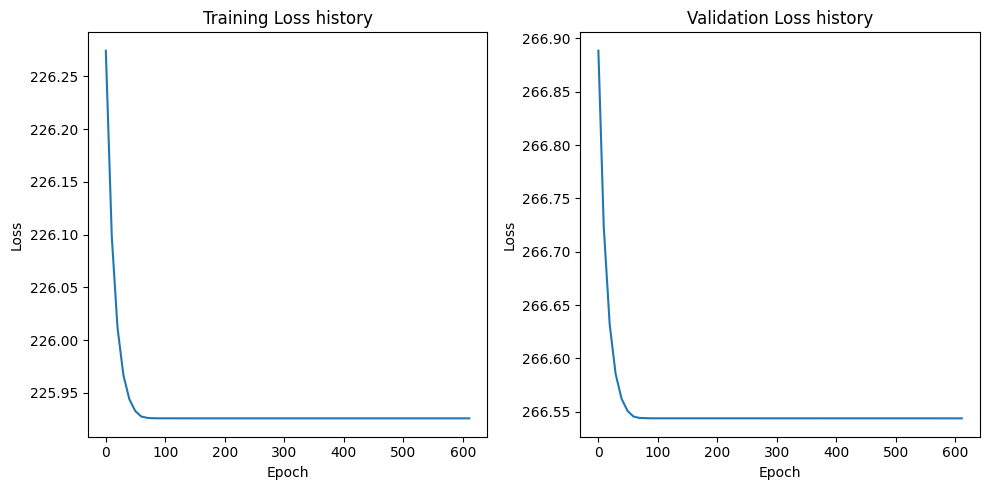

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1514, Train Loss: 149.4875927734375, Validation Loss: 144.11148834228516
Epoch 101/1514, Train Loss: 26.305178451538087, Validation Loss: 29.800173350742885
Epoch 201/1514, Train Loss: 26.261396408081055, Validation Loss: 29.760036740984237
Epoch 301/1514, Train Loss: 26.261396369934083, Validation Loss: 29.76003728594099
Epoch 401/1514, Train Loss: 26.261396369934083, Validation Loss: 29.76003728594099
Epoch 501/1514, Train Loss: 26.261396369934083, Validation Loss: 29.76003728594099
Epoch 601/1514, Train Loss: 26.261396369934083, Validation Loss: 29.76003728594099
Early stopping triggered.


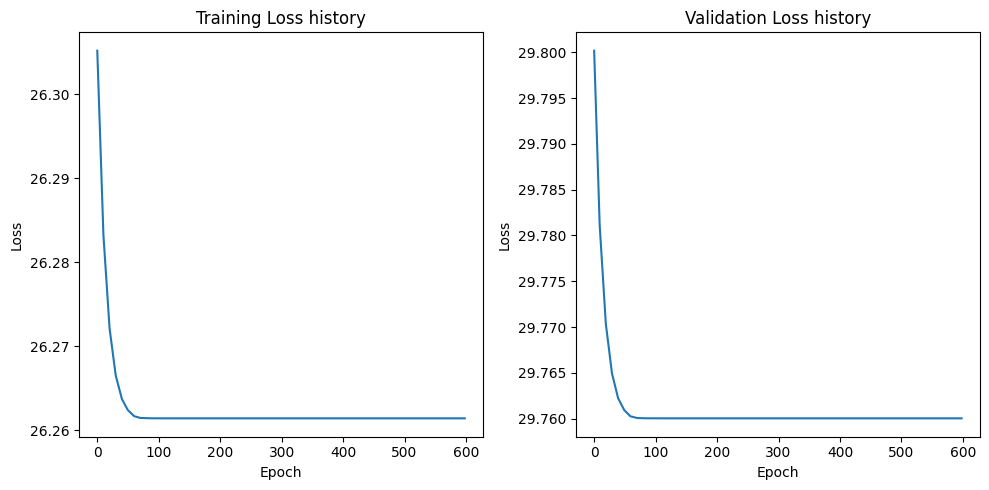

[I 2023-10-11 07:45:25,407] Trial 30 finished with value: 11.992693901062012 and parameters: {'hidden_layers': 5, 'epochs': 1514, 'batch_size': 102, 'learning_rate': 0.0028177615059889138}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1637, Train Loss: 871.7301025390625, Validation Loss: 599.5651626586914
Epoch 101/1637, Train Loss: 6.519869454701742, Validation Loss: 21.164910435676575
Epoch 201/1637, Train Loss: 6.4925551573435465, Validation Loss: 21.116092562675476
Epoch 301/1637, Train Loss: 6.492547082901001, Validation Loss: 21.116074204444885
Epoch 401/1637, Train Loss: 6.492547082901001, Validation Loss: 21.116074204444885
Epoch 501/1637, Train Loss: 6.492547082901001, Validation Loss: 21.116074204444885
Epoch 601/1637, Train Loss: 6.492547082901001, Validation Loss: 21.116074204444885
Epoch 701/1637, Train Loss: 6.492547082901001, Validation Loss: 21.116074204444885
Early stopping triggered.


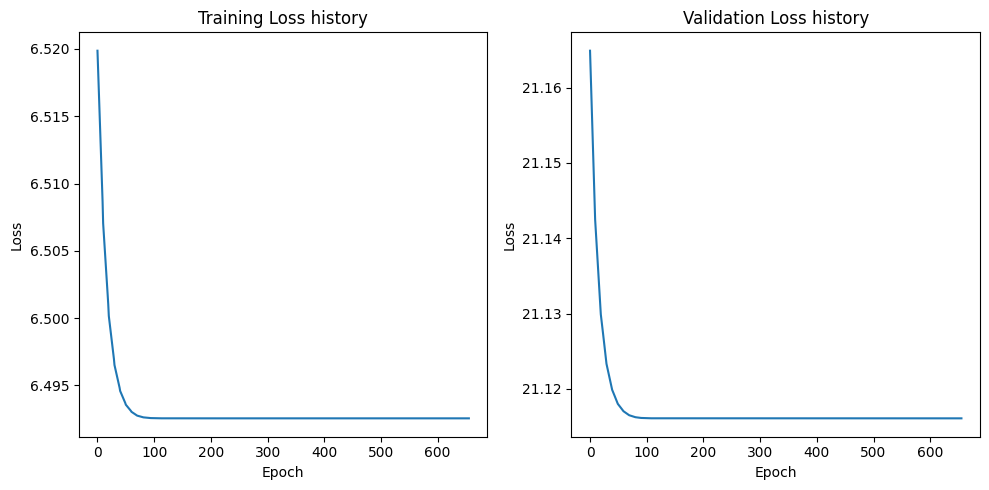

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1637, Train Loss: 886.4056355794271, Validation Loss: 609.2981185913086
Epoch 101/1637, Train Loss: 5.184855112433434, Validation Loss: 25.431668043136597
Epoch 201/1637, Train Loss: 5.165148172775904, Validation Loss: 25.373551607131958
Epoch 301/1637, Train Loss: 5.1651427268981935, Validation Loss: 25.373549938201904
Epoch 401/1637, Train Loss: 5.1651427268981935, Validation Loss: 25.373549938201904
Epoch 501/1637, Train Loss: 5.1651427268981935, Validation Loss: 25.373549938201904
Epoch 601/1637, Train Loss: 5.1651427268981935, Validation Loss: 25.373549938201904
Epoch 701/1637, Train Loss: 5.1651427268981935, Validation Loss: 25.373549938201904
Early stopping triggered.


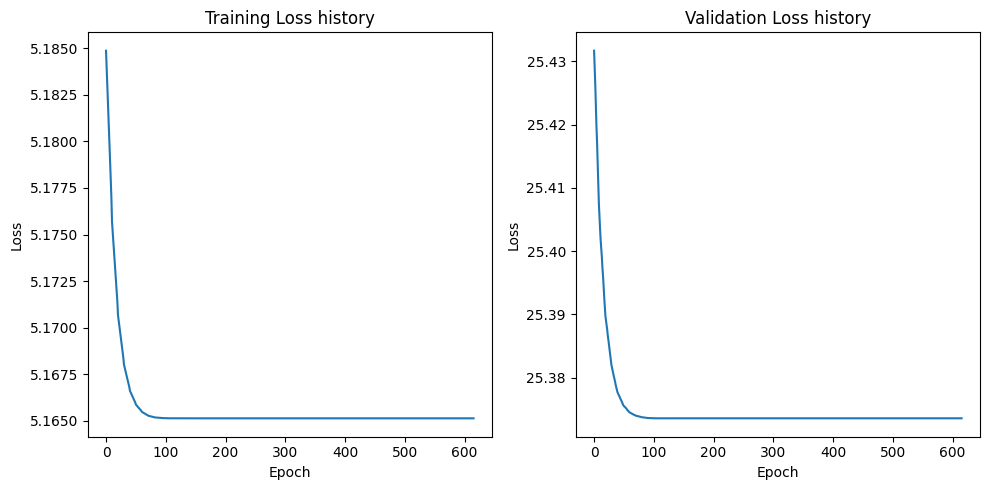

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1637, Train Loss: 87.3757832845052, Validation Loss: 154.65888500213623
Epoch 101/1637, Train Loss: 0.9189097901185354, Validation Loss: 3.4527185559272766
Epoch 201/1637, Train Loss: 0.9142510851224264, Validation Loss: 3.4432626217603683
Epoch 301/1637, Train Loss: 0.9142497499783834, Validation Loss: 3.4432633966207504
Epoch 401/1637, Train Loss: 0.9142497499783834, Validation Loss: 3.4432633966207504
Epoch 501/1637, Train Loss: 0.9142497499783834, Validation Loss: 3.4432633966207504
Epoch 601/1637, Train Loss: 0.9142497499783834, Validation Loss: 3.4432633966207504
Epoch 701/1637, Train Loss: 0.9142497499783834, Validation Loss: 3.4432633966207504
Early stopping triggered.


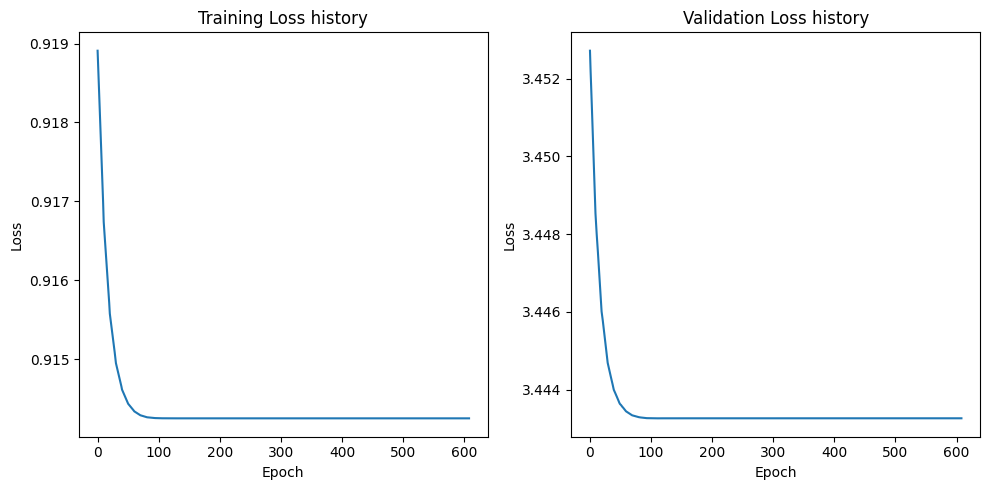

[I 2023-10-11 07:46:47,738] Trial 31 finished with value: 2.6031084060668945 and parameters: {'hidden_layers': 5, 'epochs': 1637, 'batch_size': 178, 'learning_rate': 0.048849637169997004}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1514, Train Loss: 756.1469547047335, Validation Loss: 571.5305419921875
Epoch 101/1514, Train Loss: 7.152635167626774, Validation Loss: 23.229582595825196
Epoch 201/1514, Train Loss: 7.11812040385078, Validation Loss: 23.145961380004884
Epoch 301/1514, Train Loss: 7.118111989077399, Validation Loss: 23.145945739746093
Epoch 401/1514, Train Loss: 7.118111989077399, Validation Loss: 23.145945739746093
Epoch 501/1514, Train Loss: 7.118111989077399, Validation Loss: 23.145945739746093
Epoch 601/1514, Train Loss: 7.118111989077399, Validation Loss: 23.145945739746093
Epoch 701/1514, Train Loss: 7.118111989077399, Validation Loss: 23.145945739746093
Early stopping triggered.


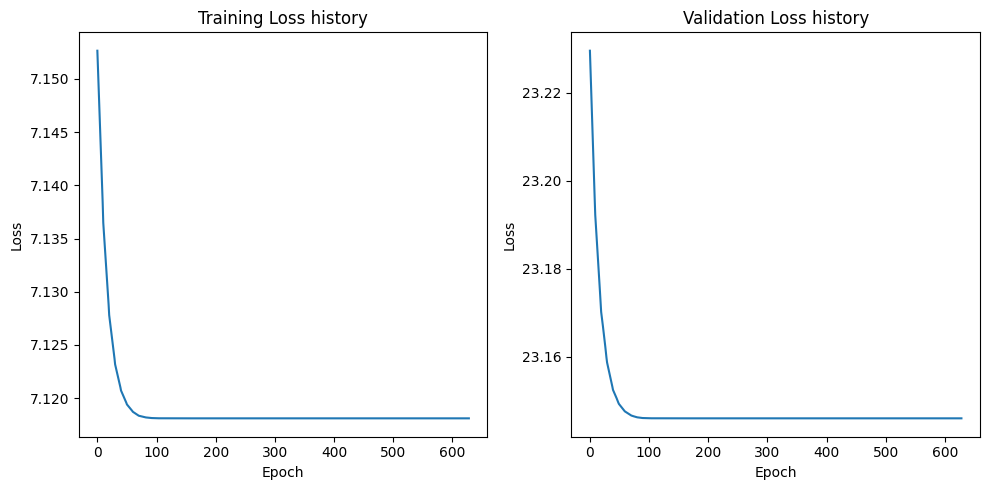

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1514, Train Loss: 901.6207993451287, Validation Loss: 628.6167114257812
Epoch 101/1514, Train Loss: 6.647832821397221, Validation Loss: 23.752342987060548
Epoch 201/1514, Train Loss: 6.618484041270087, Validation Loss: 23.70600347518921
Epoch 301/1514, Train Loss: 6.618476180469289, Validation Loss: 23.705988121032714
Epoch 401/1514, Train Loss: 6.618476180469289, Validation Loss: 23.705988121032714
Epoch 501/1514, Train Loss: 6.618476180469289, Validation Loss: 23.705988121032714
Epoch 601/1514, Train Loss: 6.618476180469289, Validation Loss: 23.705988121032714
Epoch 701/1514, Train Loss: 6.618476180469289, Validation Loss: 23.705988121032714
Early stopping triggered.


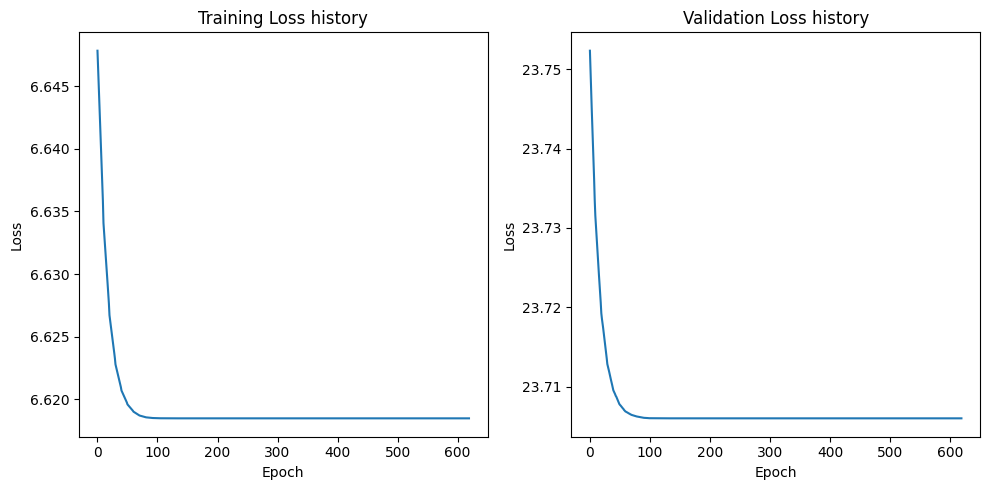

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1514, Train Loss: 91.67035966760972, Validation Loss: 153.31346282958984
Epoch 101/1514, Train Loss: 0.9248583421987646, Validation Loss: 3.2053048968315125
Epoch 201/1514, Train Loss: 0.918821501381257, Validation Loss: 3.193210905790329
Epoch 301/1514, Train Loss: 0.9188196483780356, Validation Loss: 3.193206462264061
Epoch 401/1514, Train Loss: 0.9188196483780356, Validation Loss: 3.193206462264061
Epoch 501/1514, Train Loss: 0.9188196483780356, Validation Loss: 3.193206462264061
Epoch 601/1514, Train Loss: 0.9188196483780356, Validation Loss: 3.193206462264061
Epoch 701/1514, Train Loss: 0.9188196483780356, Validation Loss: 3.193206462264061
Early stopping triggered.


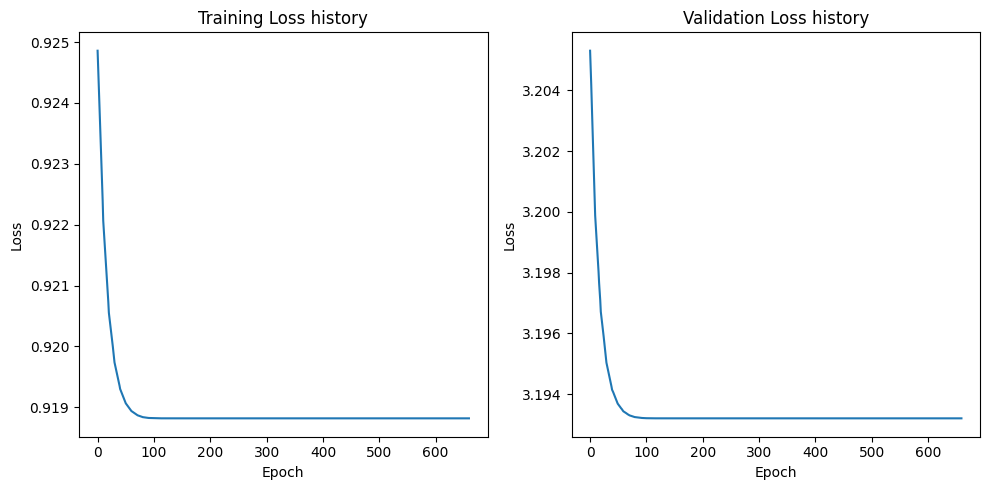

[I 2023-10-11 07:48:09,113] Trial 32 finished with value: 2.700836181640625 and parameters: {'hidden_layers': 5, 'epochs': 1514, 'batch_size': 154, 'learning_rate': 0.04599147049424962}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1522, Train Loss: 1018.9260498046875, Validation Loss: 925.5874837239584
Epoch 101/1522, Train Loss: 11.747644567489624, Validation Loss: 36.07603486378988
Epoch 201/1522, Train Loss: 11.702580451965332, Validation Loss: 35.997669537862144
Epoch 301/1522, Train Loss: 11.702572059631347, Validation Loss: 35.997663815816246
Epoch 401/1522, Train Loss: 11.702572059631347, Validation Loss: 35.997663815816246
Epoch 501/1522, Train Loss: 11.702572059631347, Validation Loss: 35.997663815816246
Epoch 601/1522, Train Loss: 11.702572059631347, Validation Loss: 35.997663815816246
Epoch 701/1522, Train Loss: 11.702572059631347, Validation Loss: 35.997663815816246
Early stopping triggered.


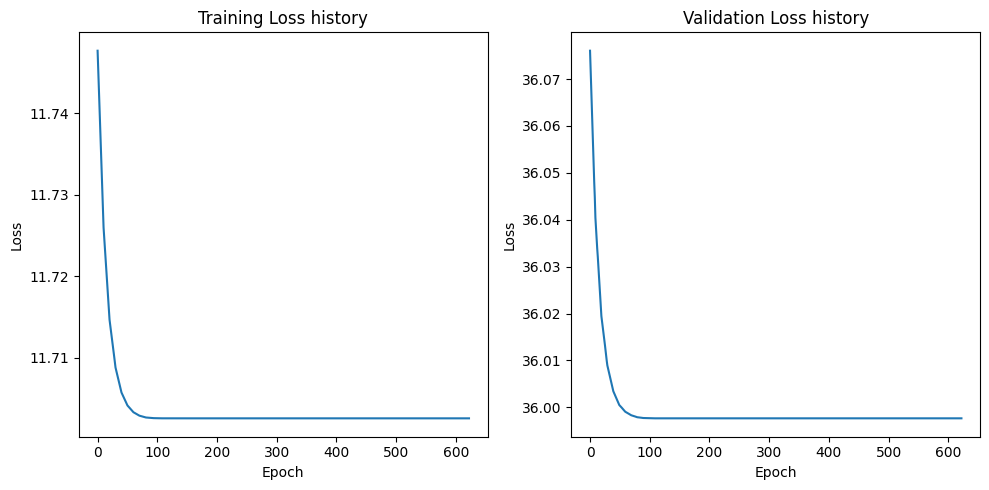

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1522, Train Loss: 1020.1807006835937, Validation Loss: 948.6142374674479
Epoch 101/1522, Train Loss: 10.891349077224731, Validation Loss: 32.90593942006429
Epoch 201/1522, Train Loss: 10.85376434326172, Validation Loss: 32.85593795776367
Epoch 301/1522, Train Loss: 10.853757381439209, Validation Loss: 32.85592873891195
Epoch 401/1522, Train Loss: 10.853757381439209, Validation Loss: 32.85592873891195
Epoch 501/1522, Train Loss: 10.853757381439209, Validation Loss: 32.85592873891195
Epoch 601/1522, Train Loss: 10.853757381439209, Validation Loss: 32.85592873891195
Epoch 701/1522, Train Loss: 10.853757381439209, Validation Loss: 32.85592873891195
Early stopping triggered.


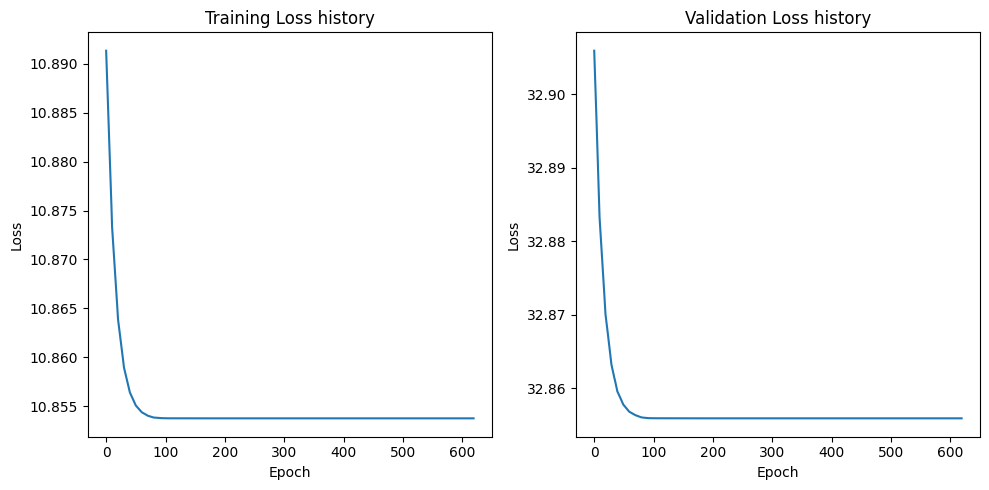

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1522, Train Loss: 149.29246292114257, Validation Loss: 135.061642964681
Epoch 101/1522, Train Loss: 1.606554341316223, Validation Loss: 4.579177498817444
Epoch 201/1522, Train Loss: 1.6011446237564086, Validation Loss: 4.5726174513498945
Epoch 301/1522, Train Loss: 1.6011434972286225, Validation Loss: 4.572617491086324
Epoch 401/1522, Train Loss: 1.6011434972286225, Validation Loss: 4.572617491086324
Epoch 501/1522, Train Loss: 1.6011434972286225, Validation Loss: 4.572617491086324
Epoch 601/1522, Train Loss: 1.6011434972286225, Validation Loss: 4.572617491086324
Early stopping triggered.


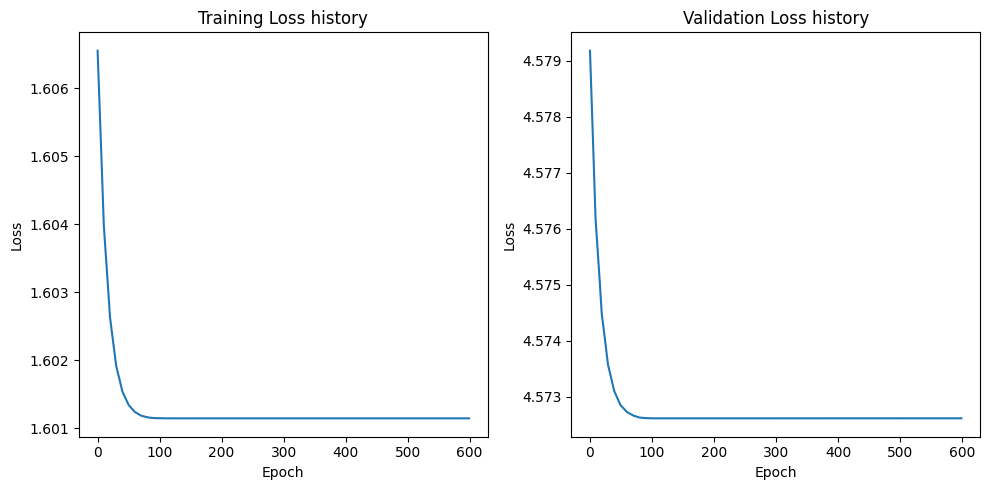

[I 2023-10-11 07:49:17,635] Trial 33 finished with value: 3.2368767261505127 and parameters: {'hidden_layers': 5, 'epochs': 1522, 'batch_size': 271, 'learning_rate': 0.047290487162371046}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1514, Train Loss: 842.1749747140067, Validation Loss: 570.3372039794922
Epoch 101/1514, Train Loss: 6.095688598496573, Validation Loss: 20.22432053089142
Epoch 201/1514, Train Loss: 6.065837315150669, Validation Loss: 20.176472067832947
Epoch 301/1514, Train Loss: 6.065831337656293, Validation Loss: 20.176475286483765
Epoch 401/1514, Train Loss: 6.065831337656293, Validation Loss: 20.176475286483765
Epoch 501/1514, Train Loss: 6.065831337656293, Validation Loss: 20.176475286483765
Epoch 601/1514, Train Loss: 6.065831337656293, Validation Loss: 20.176475286483765
Epoch 701/1514, Train Loss: 6.065831337656293, Validation Loss: 20.176475286483765
Early stopping triggered.


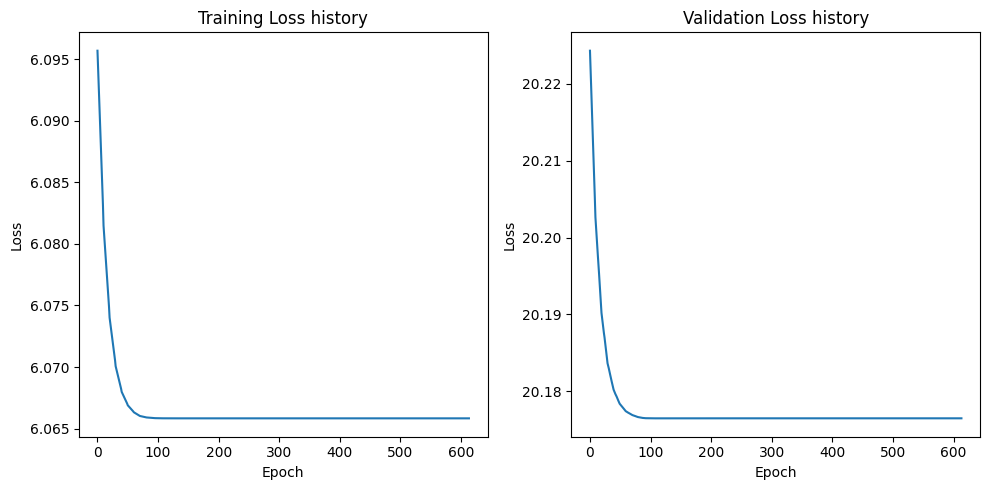

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1514, Train Loss: 884.1548113141741, Validation Loss: 631.742431640625
Epoch 101/1514, Train Loss: 6.320546431200845, Validation Loss: 27.266764283180237
Epoch 201/1514, Train Loss: 6.298393624169486, Validation Loss: 27.216372430324554
Epoch 301/1514, Train Loss: 6.298388745103564, Validation Loss: 27.216378152370453
Epoch 401/1514, Train Loss: 6.298388745103564, Validation Loss: 27.216378152370453
Epoch 501/1514, Train Loss: 6.298388745103564, Validation Loss: 27.216378152370453
Epoch 601/1514, Train Loss: 6.298388745103564, Validation Loss: 27.216378152370453
Early stopping triggered.


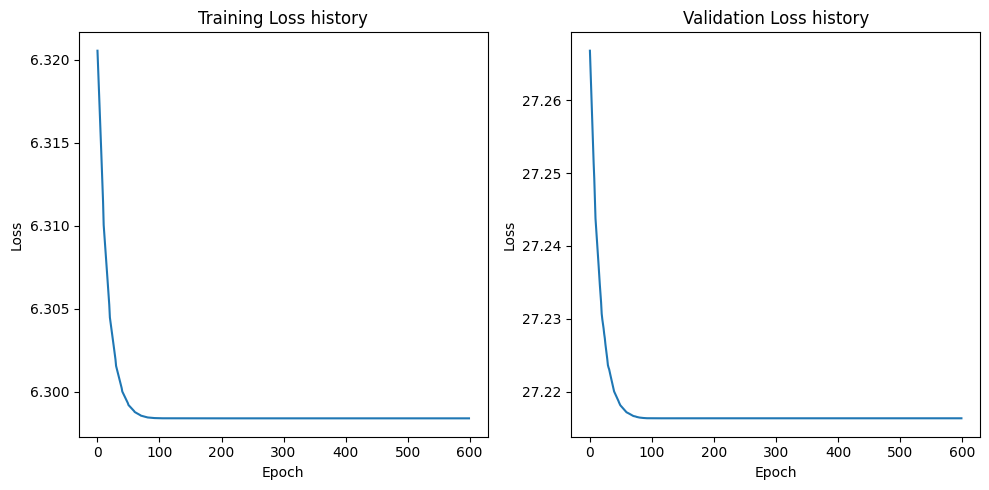

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1514, Train Loss: 98.10263551984515, Validation Loss: 176.32023334503174
Epoch 101/1514, Train Loss: 1.4812031728880746, Validation Loss: 4.260952353477478
Epoch 201/1514, Train Loss: 1.473473310470581, Validation Loss: 4.24223518371582
Epoch 301/1514, Train Loss: 1.4734713435173035, Validation Loss: 4.242232441902161
Epoch 401/1514, Train Loss: 1.4734713435173035, Validation Loss: 4.242232441902161
Epoch 501/1514, Train Loss: 1.4734713435173035, Validation Loss: 4.242232441902161
Epoch 601/1514, Train Loss: 1.4734713435173035, Validation Loss: 4.242232441902161
Epoch 701/1514, Train Loss: 1.4734713435173035, Validation Loss: 4.242232441902161
Early stopping triggered.


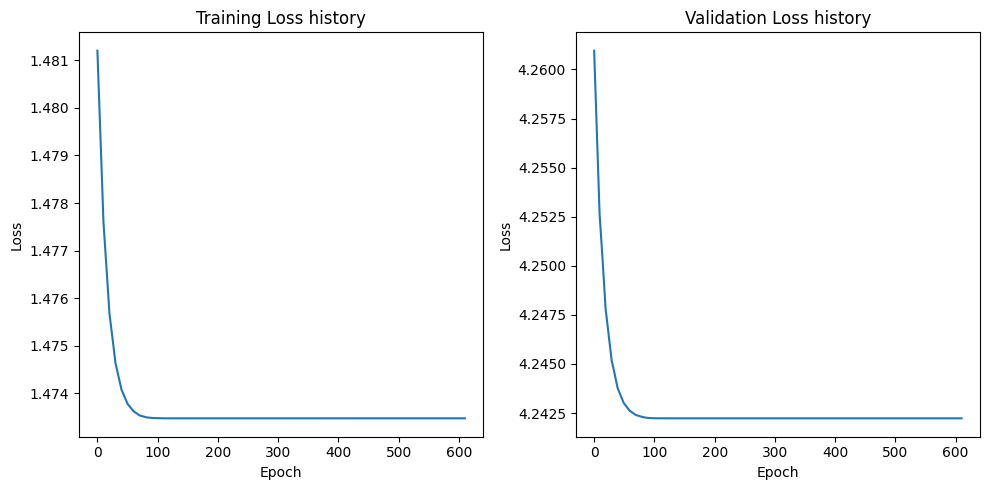

[I 2023-10-11 07:50:34,139] Trial 34 finished with value: 2.6094810962677 and parameters: {'hidden_layers': 5, 'epochs': 1514, 'batch_size': 189, 'learning_rate': 0.05132819002428075}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1882, Train Loss: 1025.7072448730469, Validation Loss: 1026.7425130208333
Epoch 101/1882, Train Loss: 58.920188903808594, Validation Loss: 84.1864840189616
Epoch 201/1882, Train Loss: 58.802485656738284, Validation Loss: 84.08816909790039
Epoch 301/1882, Train Loss: 58.802484130859376, Validation Loss: 84.08816782633464
Epoch 401/1882, Train Loss: 58.802484130859376, Validation Loss: 84.08816782633464
Epoch 501/1882, Train Loss: 58.802484130859376, Validation Loss: 84.08816782633464
Epoch 601/1882, Train Loss: 58.802484130859376, Validation Loss: 84.08816782633464
Epoch 701/1882, Train Loss: 58.802484130859376, Validation Loss: 84.08816782633464
Early stopping triggered.


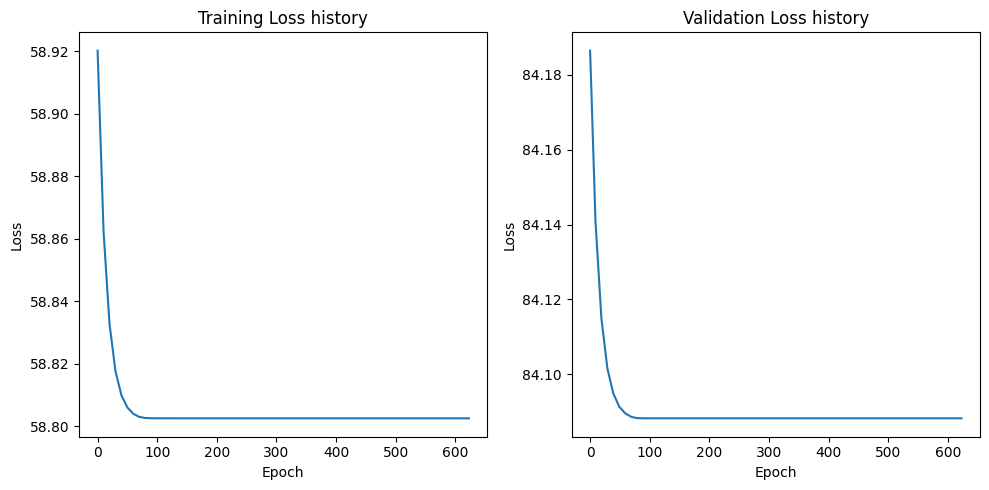

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1882, Train Loss: 995.4474487304688, Validation Loss: 987.3892008463541
Epoch 101/1882, Train Loss: 74.18444938659668, Validation Loss: 106.75123596191406
Epoch 201/1882, Train Loss: 74.01700134277344, Validation Loss: 106.59761047363281
Epoch 301/1882, Train Loss: 74.01698608398438, Validation Loss: 106.59759140014648
Epoch 401/1882, Train Loss: 74.01698608398438, Validation Loss: 106.59759140014648
Epoch 501/1882, Train Loss: 74.01698608398438, Validation Loss: 106.59759140014648
Epoch 601/1882, Train Loss: 74.01698608398438, Validation Loss: 106.59759140014648
Epoch 701/1882, Train Loss: 74.01698608398438, Validation Loss: 106.59759140014648
Early stopping triggered.


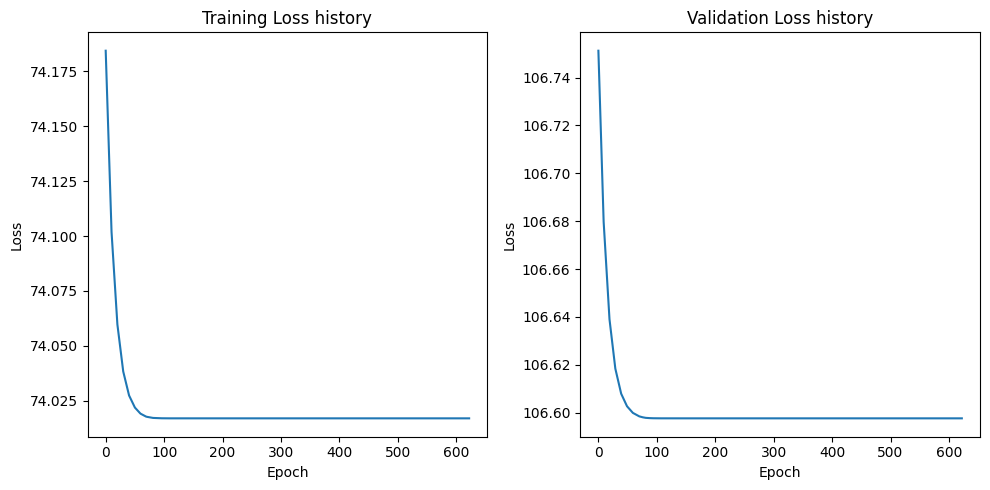

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1882, Train Loss: 147.1255989074707, Validation Loss: 141.30839029947916
Epoch 101/1882, Train Loss: 8.255007410049439, Validation Loss: 13.824457168579102
Epoch 201/1882, Train Loss: 8.237828826904297, Validation Loss: 13.8070920308431
Epoch 301/1882, Train Loss: 8.237827491760253, Validation Loss: 13.807090123494467
Epoch 401/1882, Train Loss: 8.237827491760253, Validation Loss: 13.807090123494467
Epoch 501/1882, Train Loss: 8.237827491760253, Validation Loss: 13.807090123494467
Epoch 601/1882, Train Loss: 8.237827491760253, Validation Loss: 13.807090123494467
Epoch 701/1882, Train Loss: 8.237827491760253, Validation Loss: 13.807090123494467
Early stopping triggered.


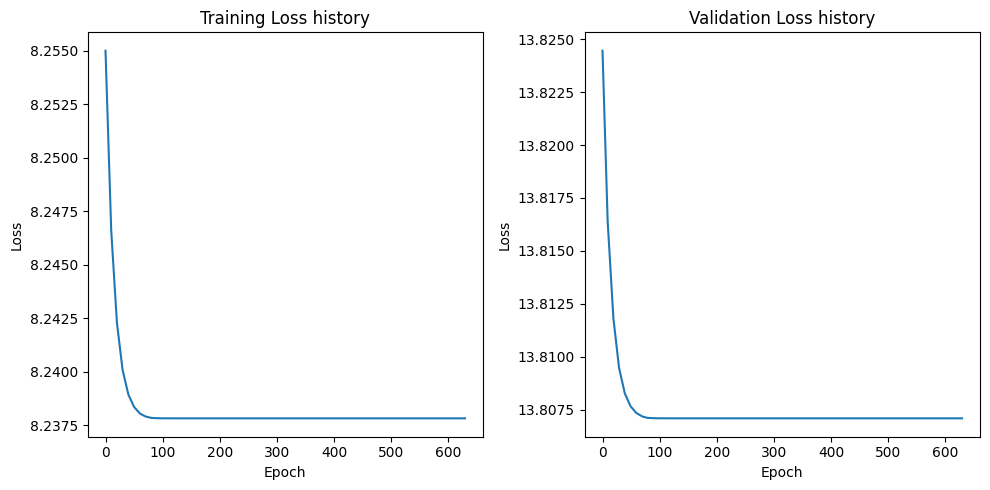

[I 2023-10-11 07:51:42,235] Trial 35 finished with value: 6.784576416015625 and parameters: {'hidden_layers': 5, 'epochs': 1882, 'batch_size': 270, 'learning_rate': 0.00992360407629303}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2061, Train Loss: 998.6715413411458, Validation Loss: 912.1167602539062
Epoch 101/2061, Train Loss: 18.849043210347492, Validation Loss: 38.73456692695618
Epoch 201/2061, Train Loss: 18.79475336074829, Validation Loss: 38.67537808418274
Epoch 301/2061, Train Loss: 18.794748051961264, Validation Loss: 38.67536783218384
Epoch 401/2061, Train Loss: 18.794748051961264, Validation Loss: 38.67536783218384
Epoch 501/2061, Train Loss: 18.794748051961264, Validation Loss: 38.67536783218384
Epoch 601/2061, Train Loss: 18.794748051961264, Validation Loss: 38.67536783218384
Epoch 701/2061, Train Loss: 18.794748051961264, Validation Loss: 38.67536783218384
Early stopping triggered.


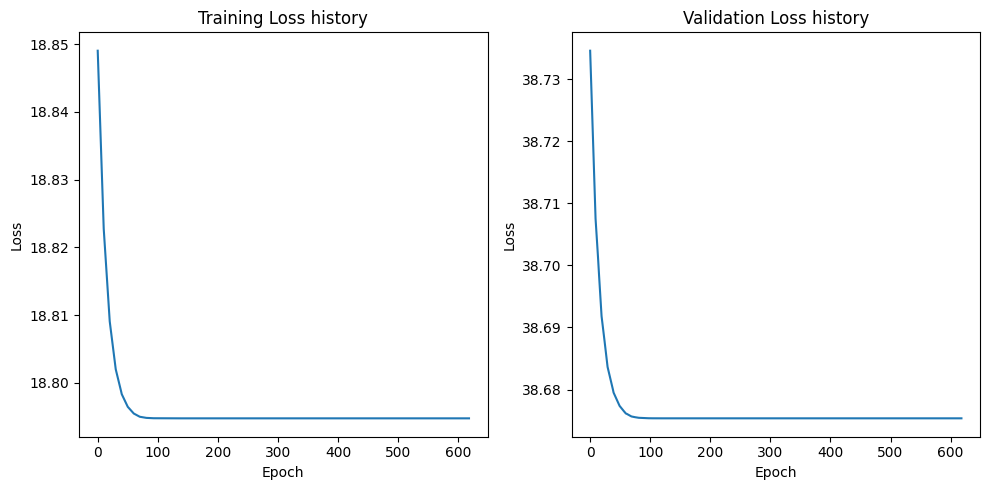

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2061, Train Loss: 990.2361328125, Validation Loss: 927.6967620849609
Epoch 101/2061, Train Loss: 37.01276521682739, Validation Loss: 70.95486450195312
Epoch 201/2061, Train Loss: 36.879936122894286, Validation Loss: 70.8052020072937
Epoch 301/2061, Train Loss: 36.879928747812905, Validation Loss: 70.80517530441284
Epoch 401/2061, Train Loss: 36.879928747812905, Validation Loss: 70.80517530441284
Epoch 501/2061, Train Loss: 36.879928747812905, Validation Loss: 70.80517530441284
Epoch 601/2061, Train Loss: 36.879928747812905, Validation Loss: 70.80517530441284
Epoch 701/2061, Train Loss: 36.879928747812905, Validation Loss: 70.80517530441284
Early stopping triggered.


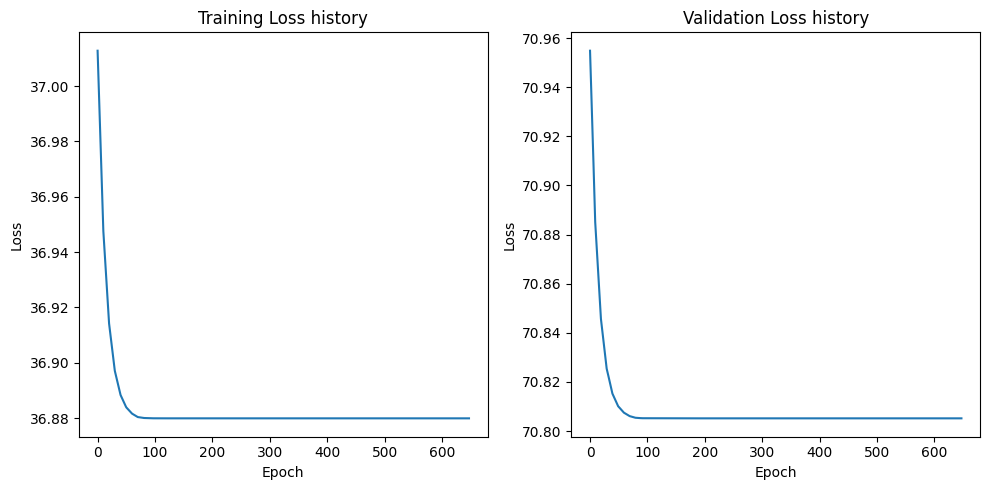

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2061, Train Loss: 140.22836507161458, Validation Loss: 125.67629432678223
Epoch 101/2061, Train Loss: 2.562310822804769, Validation Loss: 5.311032295227051
Epoch 201/2061, Train Loss: 2.5509748140970867, Validation Loss: 5.295259118080139
Epoch 301/2061, Train Loss: 2.5509740749994916, Validation Loss: 5.295259654521942
Epoch 401/2061, Train Loss: 2.5509740749994916, Validation Loss: 5.295259654521942
Epoch 501/2061, Train Loss: 2.5509740749994916, Validation Loss: 5.295259654521942
Epoch 601/2061, Train Loss: 2.5509740749994916, Validation Loss: 5.295259654521942
Epoch 701/2061, Train Loss: 2.5509740749994916, Validation Loss: 5.295259654521942
Early stopping triggered.


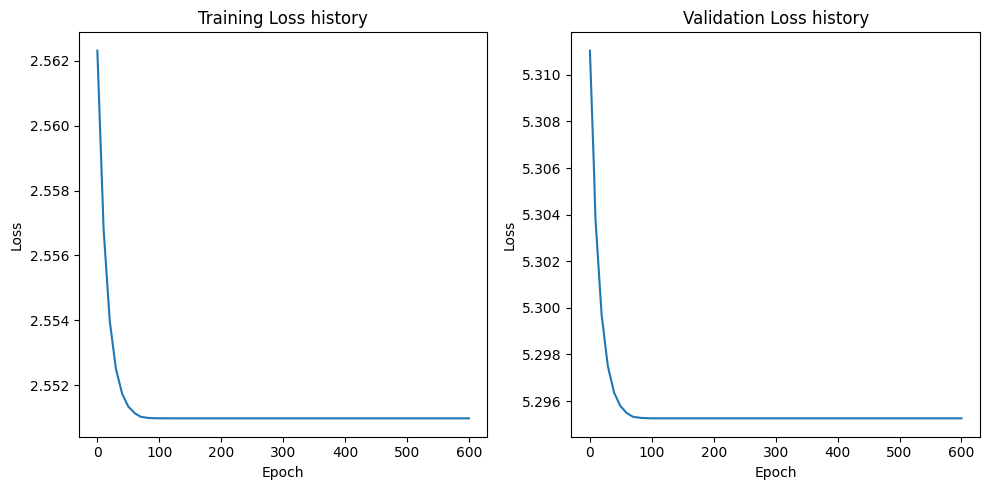

[I 2023-10-11 07:53:03,030] Trial 36 finished with value: 4.624032497406006 and parameters: {'hidden_layers': 5, 'epochs': 2061, 'batch_size': 178, 'learning_rate': 0.015060586180902188}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2400, Train Loss: 1038.989237467448, Validation Loss: 1024.345458984375
Epoch 101/2400, Train Loss: 1029.4915364583333, Validation Loss: 1015.8732299804688
Epoch 201/2400, Train Loss: 1029.4825032552083, Validation Loss: 1015.864990234375
Epoch 301/2400, Train Loss: 1029.4825032552083, Validation Loss: 1015.864990234375
Epoch 401/2400, Train Loss: 1029.4825032552083, Validation Loss: 1015.864990234375
Epoch 501/2400, Train Loss: 1029.4825032552083, Validation Loss: 1015.864990234375
Epoch 601/2400, Train Loss: 1029.4825032552083, Validation Loss: 1015.864990234375
Early stopping triggered.


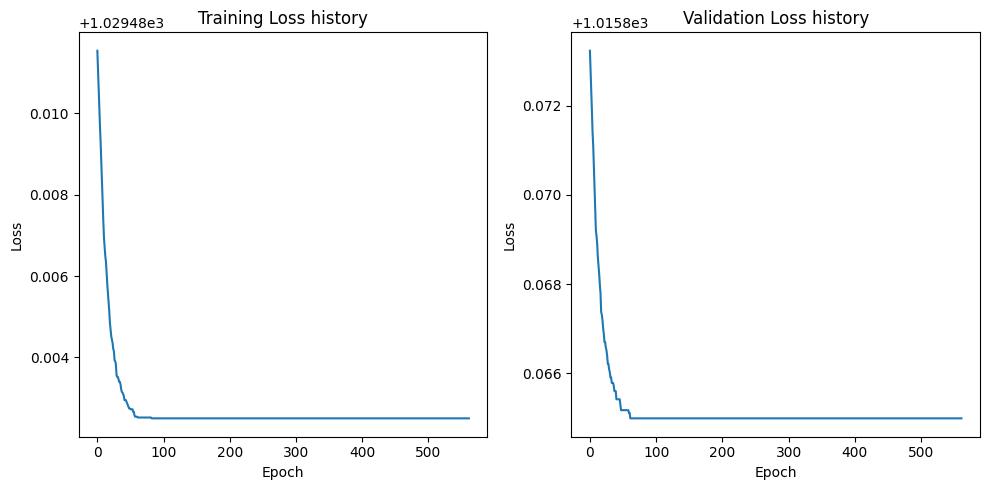

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2400, Train Loss: 1041.9761149088542, Validation Loss: 1027.4273681640625
Epoch 101/2400, Train Loss: 1029.0646362304688, Validation Loss: 1015.7366943359375
Epoch 201/2400, Train Loss: 1029.05126953125, Validation Loss: 1015.7244262695312
Epoch 301/2400, Train Loss: 1029.05126953125, Validation Loss: 1015.7244262695312
Epoch 401/2400, Train Loss: 1029.05126953125, Validation Loss: 1015.7244262695312
Epoch 501/2400, Train Loss: 1029.05126953125, Validation Loss: 1015.7244262695312
Epoch 601/2400, Train Loss: 1029.05126953125, Validation Loss: 1015.7244262695312
Early stopping triggered.


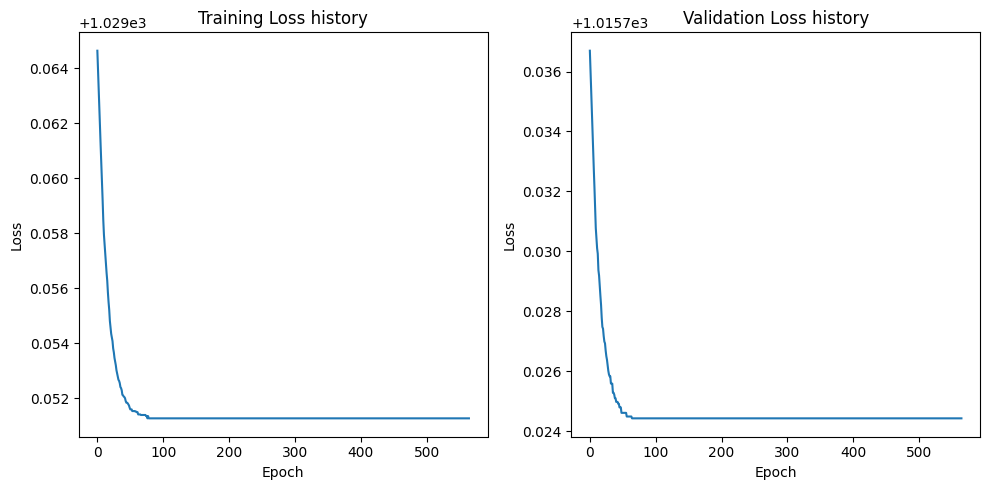

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2400, Train Loss: 148.1464080810547, Validation Loss: 144.20211791992188
Epoch 101/2400, Train Loss: 145.8999760945638, Validation Loss: 142.14683532714844
Epoch 201/2400, Train Loss: 145.89769744873047, Validation Loss: 142.14474487304688
Epoch 301/2400, Train Loss: 145.89769744873047, Validation Loss: 142.14474487304688
Epoch 401/2400, Train Loss: 145.89769744873047, Validation Loss: 142.14474487304688
Epoch 501/2400, Train Loss: 145.89769744873047, Validation Loss: 142.14474487304688
Epoch 601/2400, Train Loss: 145.89769744873047, Validation Loss: 142.14474487304688
Early stopping triggered.


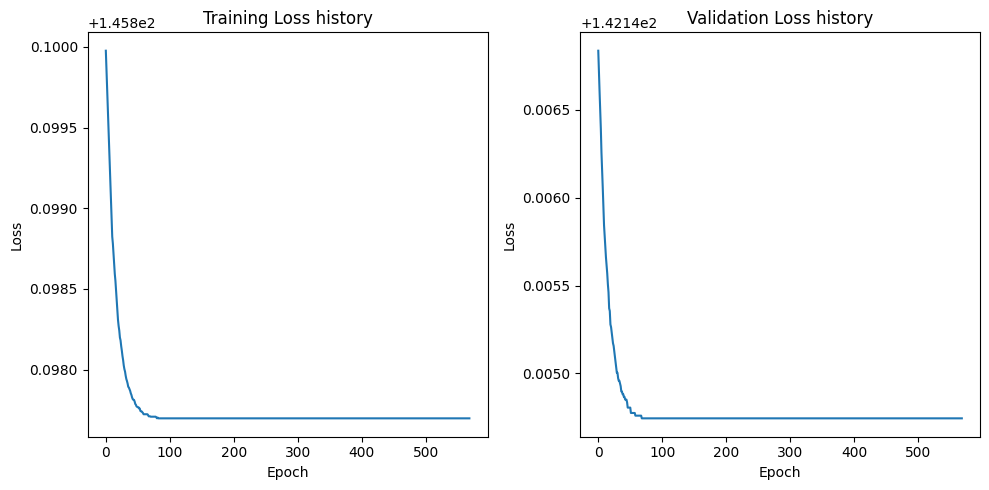

[I 2023-10-11 07:53:56,711] Trial 37 finished with value: 25.093820571899414 and parameters: {'hidden_layers': 5, 'epochs': 2400, 'batch_size': 980, 'learning_rate': 0.00034851789942362565}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1337, Train Loss: 1006.5608520507812, Validation Loss: 915.290283203125
Epoch 101/1337, Train Loss: 29.796958287556965, Validation Loss: 75.18582153320312
Epoch 201/1337, Train Loss: 29.74114418029785, Validation Loss: 75.13695526123047
Epoch 301/1337, Train Loss: 29.741126378377277, Validation Loss: 75.1369400024414
Epoch 401/1337, Train Loss: 29.741126378377277, Validation Loss: 75.1369400024414
Epoch 501/1337, Train Loss: 29.741126378377277, Validation Loss: 75.1369400024414
Epoch 601/1337, Train Loss: 29.741126378377277, Validation Loss: 75.1369400024414
Epoch 701/1337, Train Loss: 29.741126378377277, Validation Loss: 75.1369400024414
Early stopping triggered.


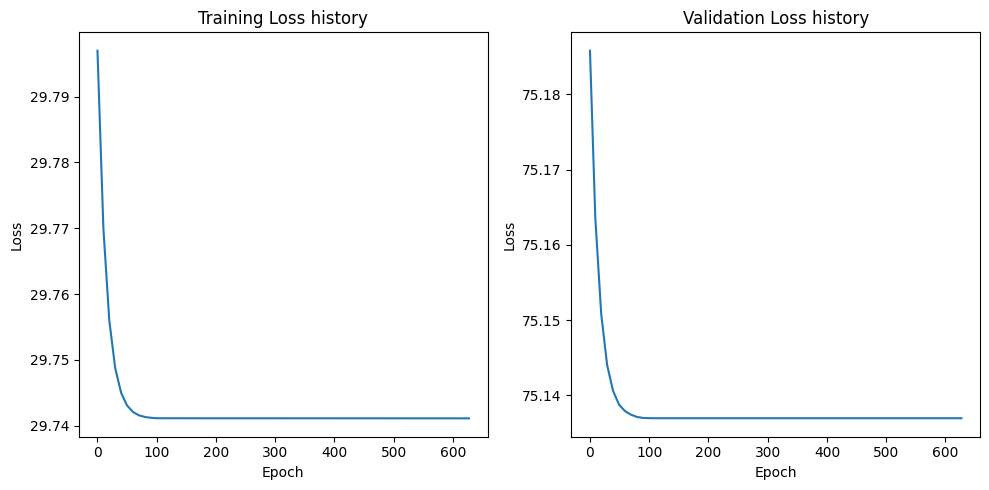

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1337, Train Loss: 1017.1206258138021, Validation Loss: 972.2880249023438
Epoch 101/1337, Train Loss: 36.71623865763346, Validation Loss: 66.88331604003906
Epoch 201/1337, Train Loss: 36.63297907511393, Validation Loss: 66.7913818359375
Epoch 301/1337, Train Loss: 36.6329460144043, Validation Loss: 66.79132843017578
Epoch 401/1337, Train Loss: 36.6329460144043, Validation Loss: 66.79132843017578
Epoch 501/1337, Train Loss: 36.6329460144043, Validation Loss: 66.79132843017578
Epoch 601/1337, Train Loss: 36.6329460144043, Validation Loss: 66.79132843017578
Epoch 701/1337, Train Loss: 36.6329460144043, Validation Loss: 66.79132843017578
Early stopping triggered.


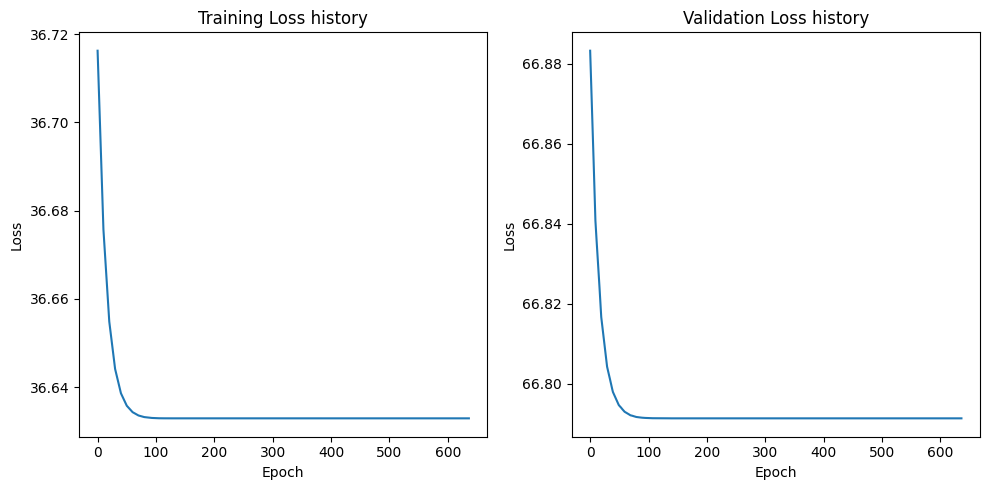

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1337, Train Loss: 129.42988077799478, Validation Loss: 100.22440338134766
Epoch 101/1337, Train Loss: 2.793039242426554, Validation Loss: 9.946979522705078
Epoch 201/1337, Train Loss: 2.786478598912557, Validation Loss: 9.934501647949219
Epoch 301/1337, Train Loss: 2.7864760557810464, Validation Loss: 9.934497833251953
Epoch 401/1337, Train Loss: 2.7864760557810464, Validation Loss: 9.934497833251953
Epoch 501/1337, Train Loss: 2.7864760557810464, Validation Loss: 9.934497833251953
Epoch 601/1337, Train Loss: 2.7864760557810464, Validation Loss: 9.934497833251953
Epoch 701/1337, Train Loss: 2.7864760557810464, Validation Loss: 9.934497833251953
Early stopping triggered.


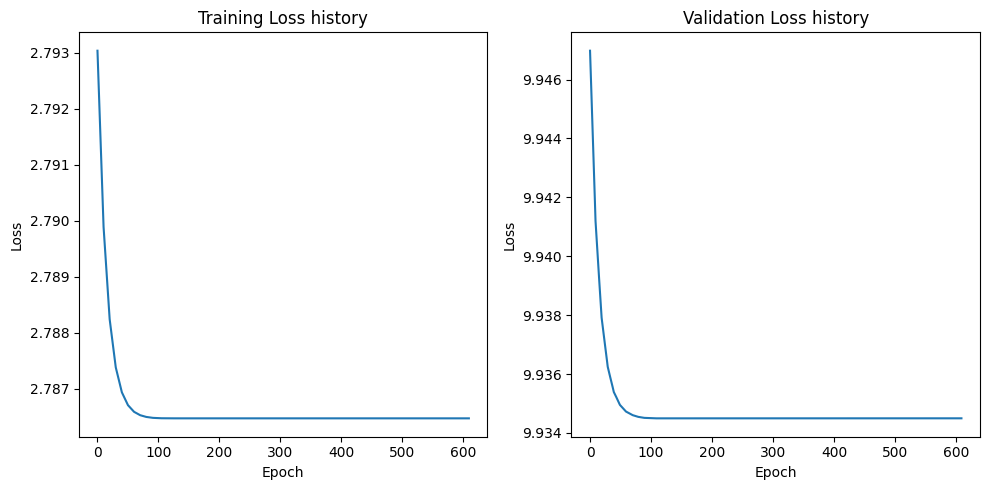

[I 2023-10-11 07:54:56,502] Trial 38 finished with value: 4.823343276977539 and parameters: {'hidden_layers': 5, 'epochs': 1337, 'batch_size': 890, 'learning_rate': 0.056864653457385235}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1733, Train Loss: 1017.8202514648438, Validation Loss: 1059.9285888671875
Epoch 101/1733, Train Loss: 914.450917561849, Validation Loss: 969.72509765625
Epoch 201/1733, Train Loss: 914.3294779459635, Validation Loss: 969.6170959472656
Epoch 301/1733, Train Loss: 914.3294779459635, Validation Loss: 969.6170959472656
Epoch 401/1733, Train Loss: 914.3294779459635, Validation Loss: 969.6170959472656
Epoch 501/1733, Train Loss: 914.3294779459635, Validation Loss: 969.6170959472656
Epoch 601/1733, Train Loss: 914.3294779459635, Validation Loss: 969.6170959472656
Early stopping triggered.


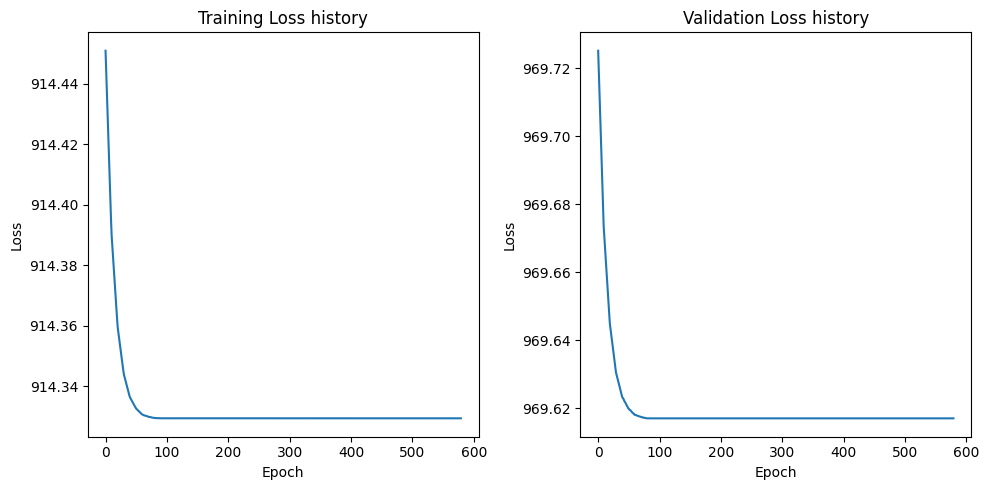

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1733, Train Loss: 1029.4053344726562, Validation Loss: 1072.8966979980469
Epoch 101/1733, Train Loss: 925.9870096842448, Validation Loss: 978.5875549316406
Epoch 201/1733, Train Loss: 925.8553059895834, Validation Loss: 978.4672546386719
Epoch 301/1733, Train Loss: 925.8553059895834, Validation Loss: 978.4672546386719
Epoch 401/1733, Train Loss: 925.8553059895834, Validation Loss: 978.4672546386719
Epoch 501/1733, Train Loss: 925.8553059895834, Validation Loss: 978.4672546386719
Epoch 601/1733, Train Loss: 925.8553059895834, Validation Loss: 978.4672546386719
Early stopping triggered.


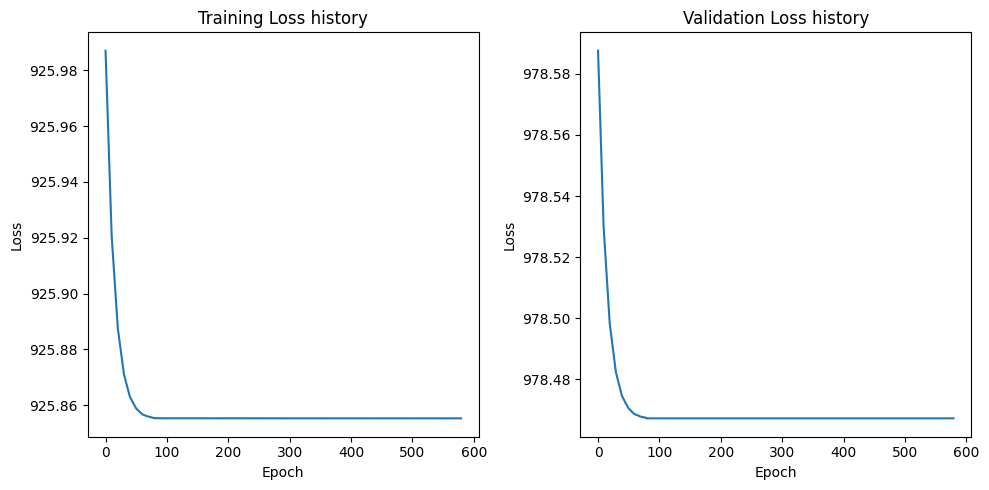

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1733, Train Loss: 134.3541030883789, Validation Loss: 147.646240234375
Epoch 101/1733, Train Loss: 108.53851636250813, Validation Loss: 124.04085922241211
Epoch 201/1733, Train Loss: 108.51390329996745, Validation Loss: 124.01677703857422
Epoch 301/1733, Train Loss: 108.51390329996745, Validation Loss: 124.01677703857422
Epoch 401/1733, Train Loss: 108.51390329996745, Validation Loss: 124.01677703857422
Epoch 501/1733, Train Loss: 108.51390329996745, Validation Loss: 124.01677703857422
Epoch 601/1733, Train Loss: 108.51390329996745, Validation Loss: 124.01677703857422
Early stopping triggered.


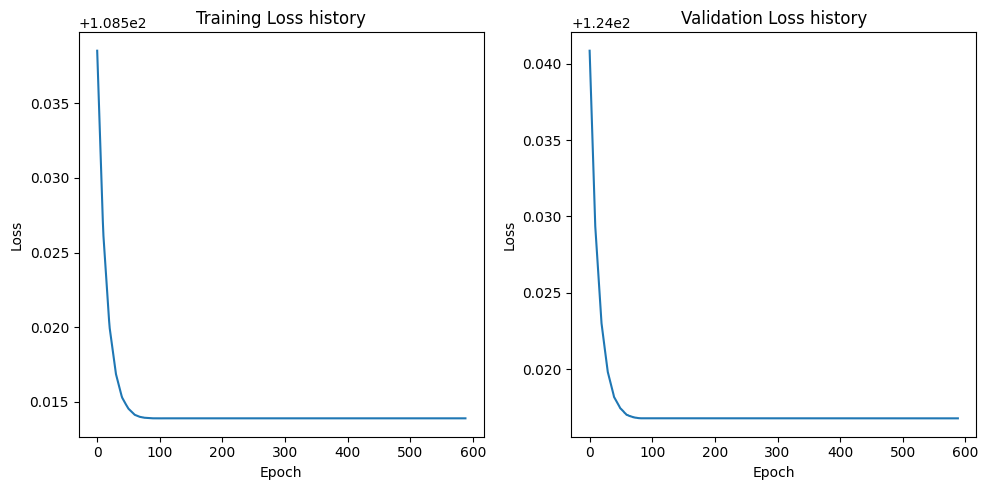

[I 2023-10-11 07:55:52,654] Trial 39 finished with value: 23.651792526245117 and parameters: {'hidden_layers': 5, 'epochs': 1733, 'batch_size': 481, 'learning_rate': 0.0013446489463421992}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2877, Train Loss: 931.4444953070747, Validation Loss: 636.3984497070312
Epoch 101/2877, Train Loss: 6.633615016937256, Validation Loss: 23.299547576904295
Epoch 201/2877, Train Loss: 6.597147226333618, Validation Loss: 23.227098083496095
Epoch 301/2877, Train Loss: 6.597137173016866, Validation Loss: 23.227072525024415
Epoch 401/2877, Train Loss: 6.597137173016866, Validation Loss: 23.227072525024415
Epoch 501/2877, Train Loss: 6.597137173016866, Validation Loss: 23.227072525024415
Epoch 601/2877, Train Loss: 6.597137173016866, Validation Loss: 23.227072525024415
Epoch 701/2877, Train Loss: 6.597137173016866, Validation Loss: 23.227072525024415
Early stopping triggered.


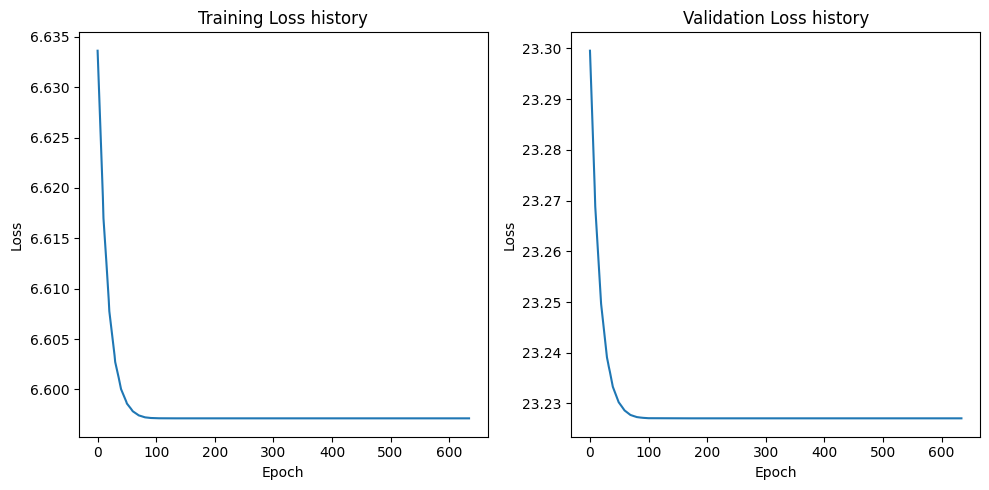

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2877, Train Loss: 761.5185987684462, Validation Loss: 576.2021057128907
Epoch 101/2877, Train Loss: 5.810604148440891, Validation Loss: 20.347221279144286
Epoch 201/2877, Train Loss: 5.780604031350878, Validation Loss: 20.28726453781128
Epoch 301/2877, Train Loss: 5.780594083997938, Validation Loss: 20.287256813049318
Epoch 401/2877, Train Loss: 5.780594083997938, Validation Loss: 20.287256813049318
Epoch 501/2877, Train Loss: 5.780594083997938, Validation Loss: 20.287256813049318
Epoch 601/2877, Train Loss: 5.780594083997938, Validation Loss: 20.287256813049318
Epoch 701/2877, Train Loss: 5.780594083997938, Validation Loss: 20.287256813049318
Early stopping triggered.


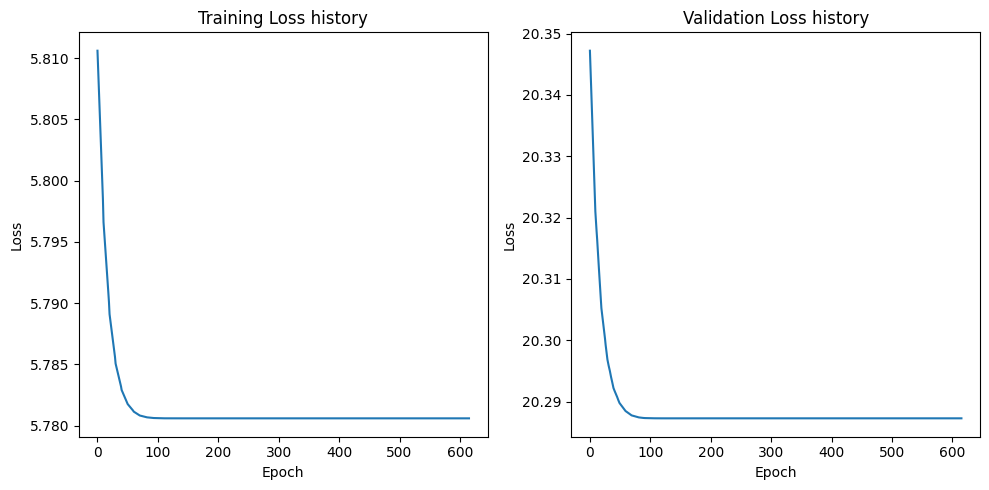

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2877, Train Loss: 60.00132412380643, Validation Loss: 273.7583240509033
Epoch 101/2877, Train Loss: 1.0795406136247847, Validation Loss: 3.0589643001556395
Epoch 201/2877, Train Loss: 1.0732324752542708, Validation Loss: 3.049470829963684
Epoch 301/2877, Train Loss: 1.073230226834615, Validation Loss: 3.049471616744995
Epoch 401/2877, Train Loss: 1.073230226834615, Validation Loss: 3.049471616744995
Epoch 501/2877, Train Loss: 1.073230226834615, Validation Loss: 3.049471616744995
Epoch 601/2877, Train Loss: 1.073230226834615, Validation Loss: 3.049471616744995
Epoch 701/2877, Train Loss: 1.073230226834615, Validation Loss: 3.049471616744995
Early stopping triggered.


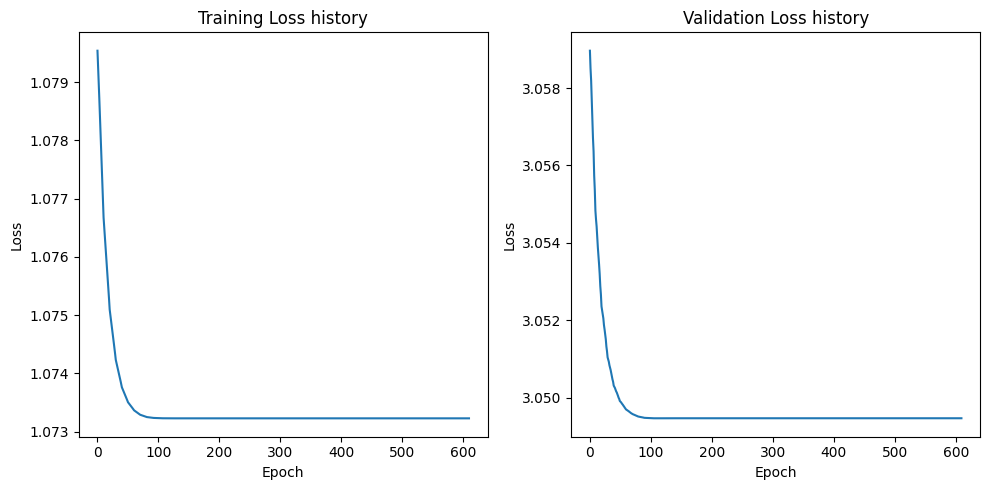

[I 2023-10-11 07:57:13,818] Trial 40 finished with value: 2.657897710800171 and parameters: {'hidden_layers': 5, 'epochs': 2877, 'batch_size': 143, 'learning_rate': 0.061416493835329176}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2791, Train Loss: 765.375233968099, Validation Loss: 836.7905517578125
Epoch 101/2791, Train Loss: 4.722196141878764, Validation Loss: 15.48229489326477
Epoch 201/2791, Train Loss: 4.687638507948981, Validation Loss: 15.423439812660217
Epoch 301/2791, Train Loss: 4.687627143330044, Validation Loss: 15.423420667648315
Epoch 401/2791, Train Loss: 4.687627143330044, Validation Loss: 15.423420667648315
Epoch 501/2791, Train Loss: 4.687627143330044, Validation Loss: 15.423420667648315
Epoch 601/2791, Train Loss: 4.687627143330044, Validation Loss: 15.423420667648315
Epoch 701/2791, Train Loss: 4.687627143330044, Validation Loss: 15.423420667648315
Early stopping triggered.


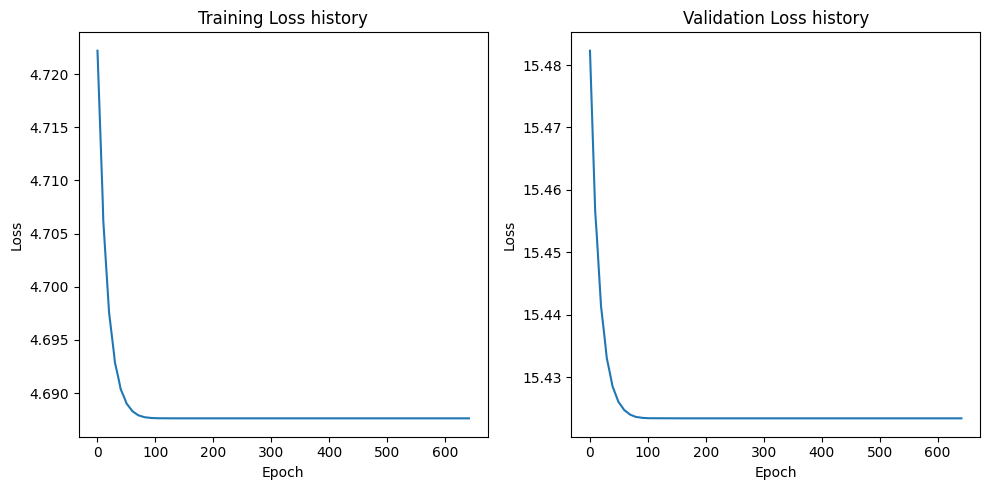

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2791, Train Loss: 774.5223388671875, Validation Loss: 606.5472290039063
Epoch 101/2791, Train Loss: 5.333606428570217, Validation Loss: 26.66744532585144
Epoch 201/2791, Train Loss: 5.3099221388498945, Validation Loss: 26.61036605834961
Epoch 301/2791, Train Loss: 5.309915847248501, Validation Loss: 26.610365676879884
Epoch 401/2791, Train Loss: 5.309915847248501, Validation Loss: 26.610365676879884
Epoch 501/2791, Train Loss: 5.309915847248501, Validation Loss: 26.610365676879884
Epoch 601/2791, Train Loss: 5.309915847248501, Validation Loss: 26.610365676879884
Epoch 701/2791, Train Loss: 5.309915847248501, Validation Loss: 26.610365676879884
Early stopping triggered.


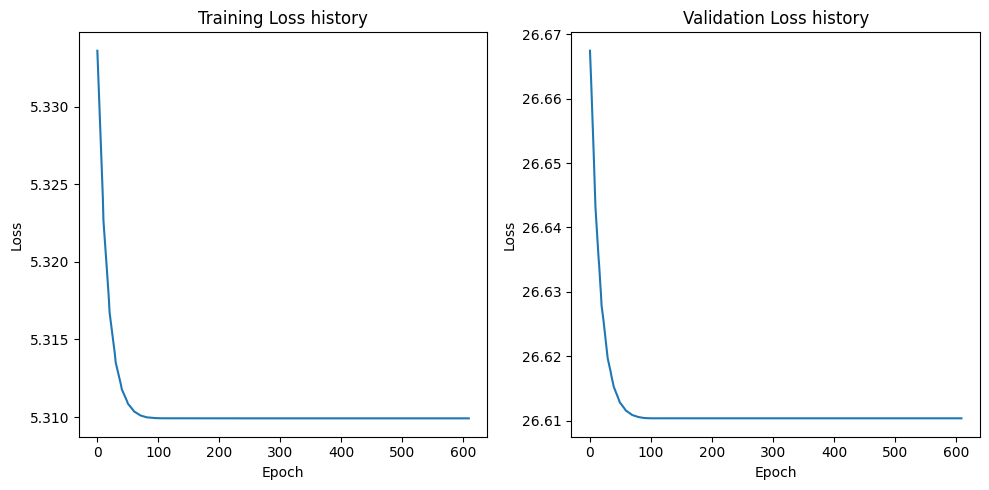

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2791, Train Loss: 85.72285758124457, Validation Loss: 261.4174034118652
Epoch 101/2791, Train Loss: 1.0337075756655798, Validation Loss: 3.9877311110496523
Epoch 201/2791, Train Loss: 1.028107504049937, Validation Loss: 3.9729296922683717
Epoch 301/2791, Train Loss: 1.028105530473921, Validation Loss: 3.972925639152527
Epoch 401/2791, Train Loss: 1.028105530473921, Validation Loss: 3.972925639152527
Epoch 501/2791, Train Loss: 1.028105530473921, Validation Loss: 3.972925639152527
Epoch 601/2791, Train Loss: 1.028105530473921, Validation Loss: 3.972925639152527
Epoch 701/2791, Train Loss: 1.028105530473921, Validation Loss: 3.972925639152527
Early stopping triggered.


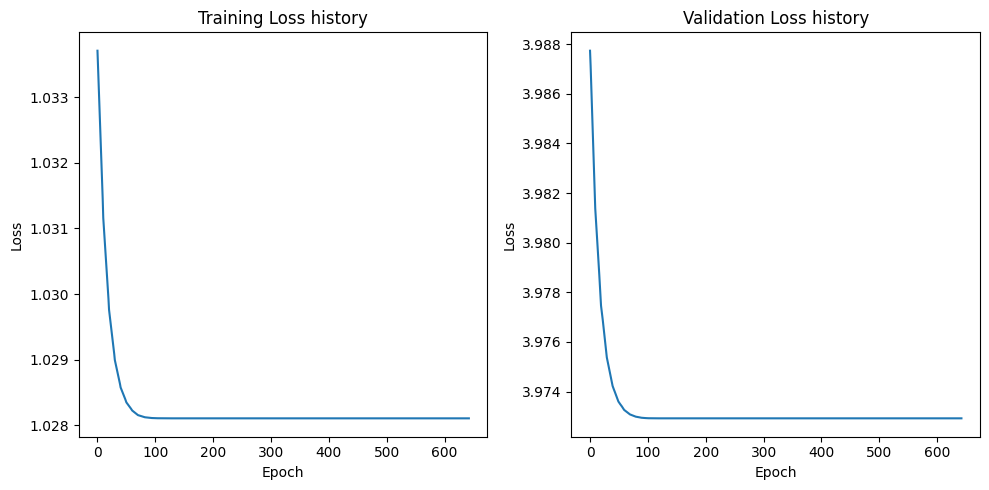

[I 2023-10-11 07:58:38,391] Trial 41 finished with value: 2.2529687881469727 and parameters: {'hidden_layers': 5, 'epochs': 2791, 'batch_size': 145, 'learning_rate': 0.06257961994889776}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1027, Train Loss: 918.6025834517045, Validation Loss: 768.7326863606771
Epoch 101/1027, Train Loss: 12.884969798001377, Validation Loss: 33.66641171773275
Epoch 201/1027, Train Loss: 12.84646987915039, Validation Loss: 33.616340001424156
Epoch 301/1027, Train Loss: 12.846464330499822, Validation Loss: 33.6163330078125
Epoch 401/1027, Train Loss: 12.846464330499822, Validation Loss: 33.6163330078125
Epoch 501/1027, Train Loss: 12.846464330499822, Validation Loss: 33.6163330078125
Epoch 601/1027, Train Loss: 12.846464330499822, Validation Loss: 33.6163330078125
Epoch 701/1027, Train Loss: 12.846464330499822, Validation Loss: 33.6163330078125
Early stopping triggered.


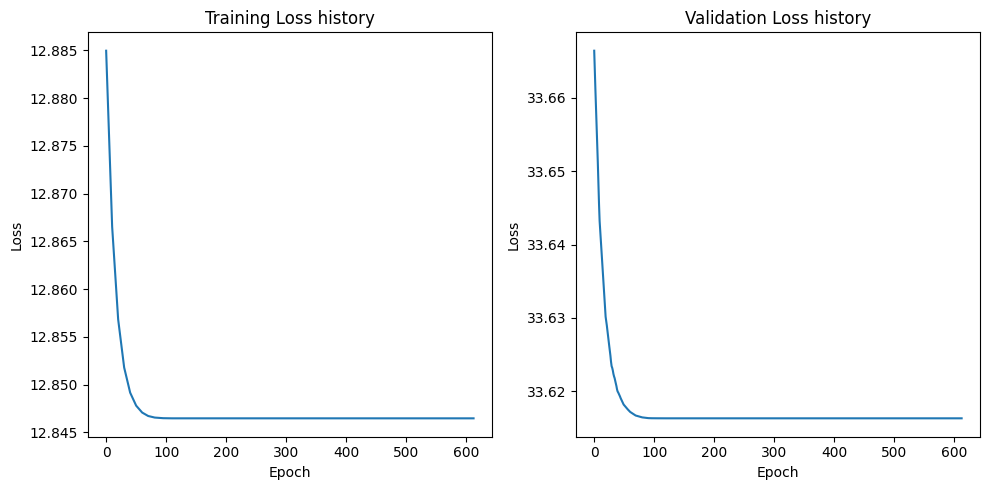

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1027, Train Loss: 947.0031682794744, Validation Loss: 852.8164672851562
Epoch 101/1027, Train Loss: 12.748047005046498, Validation Loss: 43.131967544555664
Epoch 201/1027, Train Loss: 12.70715280012651, Validation Loss: 43.065847396850586
Epoch 301/1027, Train Loss: 12.707146601243453, Validation Loss: 43.06585884094238
Epoch 401/1027, Train Loss: 12.707146601243453, Validation Loss: 43.06585884094238
Epoch 501/1027, Train Loss: 12.707146601243453, Validation Loss: 43.06585884094238
Epoch 601/1027, Train Loss: 12.707146601243453, Validation Loss: 43.06585884094238
Early stopping triggered.


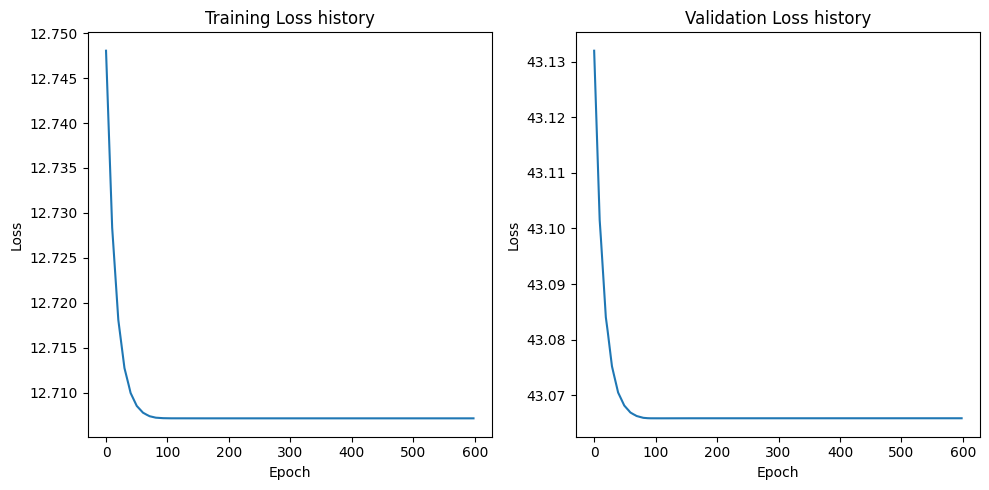

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1027, Train Loss: 126.08344338156961, Validation Loss: 95.30835978190105
Epoch 101/1027, Train Loss: 1.2136767127297141, Validation Loss: 5.226996898651123
Epoch 201/1027, Train Loss: 1.209379575469277, Validation Loss: 5.217302004496257
Epoch 301/1027, Train Loss: 1.2093787030740217, Validation Loss: 5.217300256093343
Epoch 401/1027, Train Loss: 1.2093787030740217, Validation Loss: 5.217300256093343
Epoch 501/1027, Train Loss: 1.2093787030740217, Validation Loss: 5.217300256093343
Epoch 601/1027, Train Loss: 1.2093787030740217, Validation Loss: 5.217300256093343
Epoch 701/1027, Train Loss: 1.2093787030740217, Validation Loss: 5.217300256093343
Early stopping triggered.


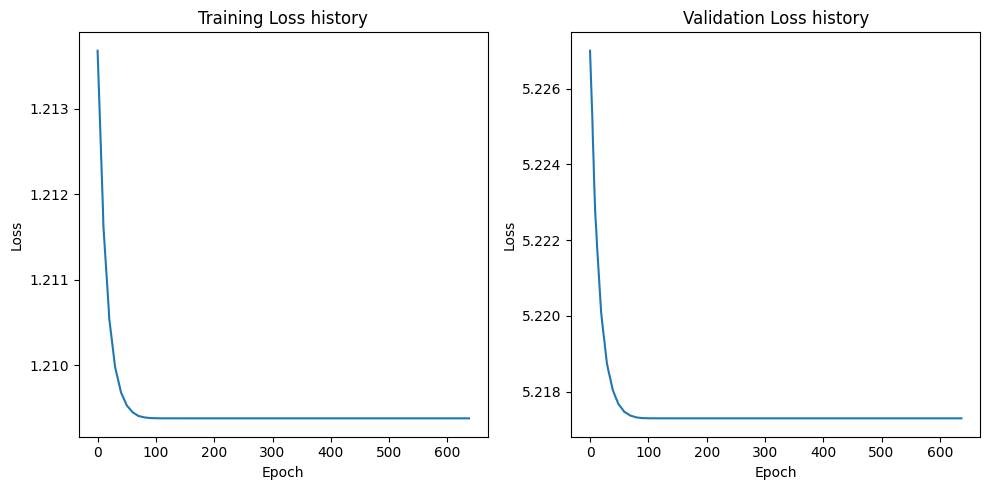

[I 2023-10-11 07:59:47,580] Trial 42 finished with value: 3.3211214542388916 and parameters: {'hidden_layers': 5, 'epochs': 1027, 'batch_size': 240, 'learning_rate': 0.03302494472047772}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2184, Train Loss: 973.1115264892578, Validation Loss: 715.6428833007812
Epoch 101/2184, Train Loss: 9.519074857234955, Validation Loss: 35.37242031097412
Epoch 201/2184, Train Loss: 9.48612779378891, Validation Loss: 35.302340507507324
Epoch 301/2184, Train Loss: 9.486120522022247, Validation Loss: 35.30231857299805
Epoch 401/2184, Train Loss: 9.486120522022247, Validation Loss: 35.30231857299805
Epoch 501/2184, Train Loss: 9.486120522022247, Validation Loss: 35.30231857299805
Epoch 601/2184, Train Loss: 9.486120522022247, Validation Loss: 35.30231857299805
Epoch 701/2184, Train Loss: 9.486120522022247, Validation Loss: 35.30231857299805
Early stopping triggered.


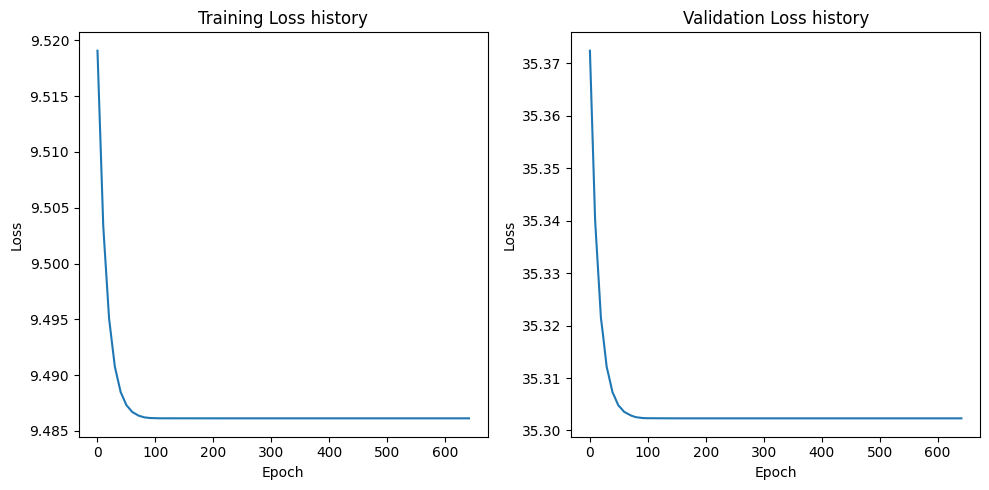

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2184, Train Loss: 935.1663208007812, Validation Loss: 686.8984985351562
Epoch 101/2184, Train Loss: 8.663180947303772, Validation Loss: 34.34055042266846
Epoch 201/2184, Train Loss: 8.63673734664917, Validation Loss: 34.28381538391113
Epoch 301/2184, Train Loss: 8.636731564998627, Validation Loss: 34.28380489349365
Epoch 401/2184, Train Loss: 8.636731564998627, Validation Loss: 34.28380489349365
Epoch 501/2184, Train Loss: 8.636731564998627, Validation Loss: 34.28380489349365
Epoch 601/2184, Train Loss: 8.636731564998627, Validation Loss: 34.28380489349365
Epoch 701/2184, Train Loss: 8.636731564998627, Validation Loss: 34.28380489349365
Early stopping triggered.


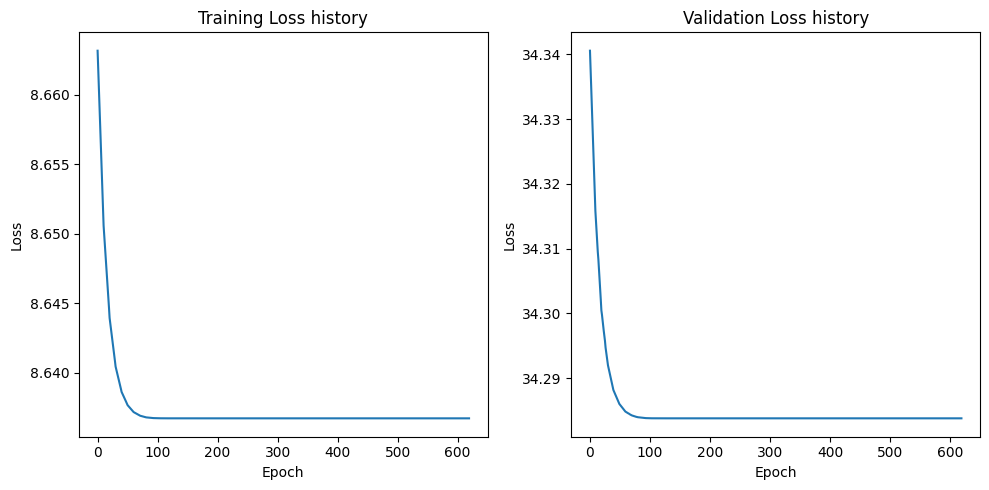

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2184, Train Loss: 107.46771478652954, Validation Loss: 129.96424865722656
Epoch 101/2184, Train Loss: 1.61560919880867, Validation Loss: 5.677053689956665
Epoch 201/2184, Train Loss: 1.6097493767738342, Validation Loss: 5.665481805801392
Epoch 301/2184, Train Loss: 1.609748050570488, Validation Loss: 5.665478825569153
Epoch 401/2184, Train Loss: 1.609748050570488, Validation Loss: 5.665478825569153
Epoch 501/2184, Train Loss: 1.609748050570488, Validation Loss: 5.665478825569153
Epoch 601/2184, Train Loss: 1.609748050570488, Validation Loss: 5.665478825569153
Epoch 701/2184, Train Loss: 1.609748050570488, Validation Loss: 5.665478825569153
Early stopping triggered.


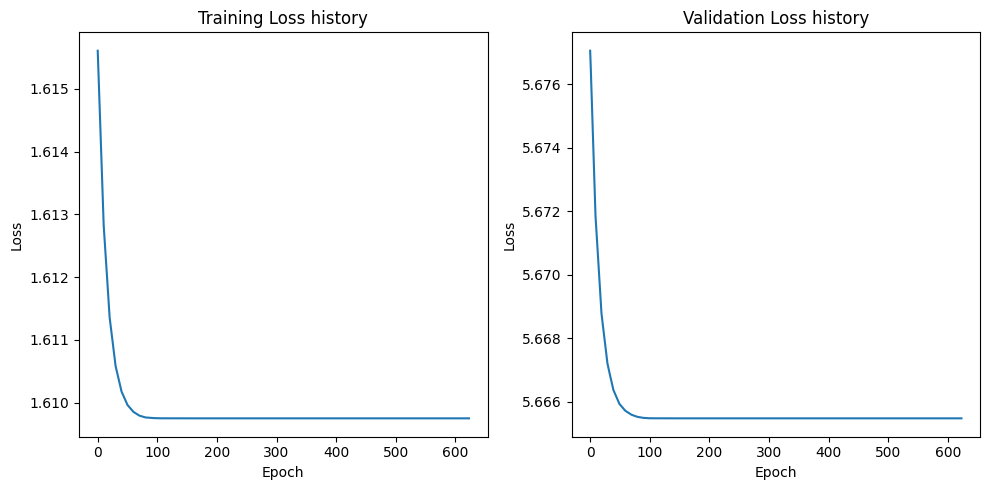

[I 2023-10-11 08:00:50,584] Trial 43 finished with value: 2.9965579509735107 and parameters: {'hidden_layers': 5, 'epochs': 2184, 'batch_size': 317, 'learning_rate': 0.06100382082137245}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2537, Train Loss: 968.7438534007352, Validation Loss: 871.0104370117188
Epoch 101/2537, Train Loss: 14.466067482443417, Validation Loss: 38.44768991470337
Epoch 201/2537, Train Loss: 14.417365074157715, Validation Loss: 38.39462399482727
Epoch 301/2537, Train Loss: 14.41736125946045, Validation Loss: 38.39462785720825
Epoch 401/2537, Train Loss: 14.417361035066492, Validation Loss: 38.39462785720825
Epoch 501/2537, Train Loss: 14.417361035066492, Validation Loss: 38.39462785720825
Epoch 601/2537, Train Loss: 14.417361035066492, Validation Loss: 38.39462785720825
Early stopping triggered.


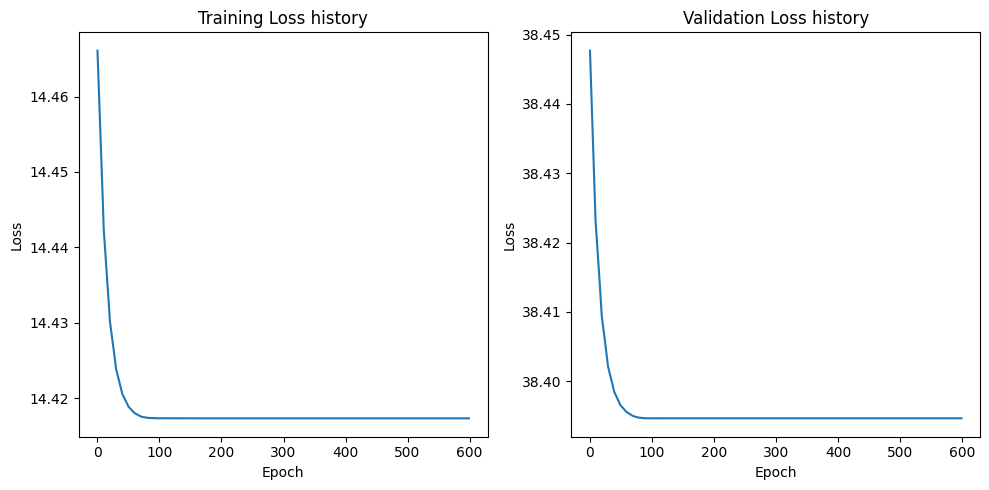

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2537, Train Loss: 918.1379035500919, Validation Loss: 801.5952209472656
Epoch 101/2537, Train Loss: 15.94657308915082, Validation Loss: 49.8592529296875
Epoch 201/2537, Train Loss: 15.889459273394417, Validation Loss: 49.768625259399414
Epoch 301/2537, Train Loss: 15.889455178204704, Validation Loss: 49.768613243103026
Epoch 401/2537, Train Loss: 15.889455178204704, Validation Loss: 49.768613243103026
Epoch 501/2537, Train Loss: 15.889455178204704, Validation Loss: 49.768613243103026
Epoch 601/2537, Train Loss: 15.889455178204704, Validation Loss: 49.768613243103026
Epoch 701/2537, Train Loss: 15.889455178204704, Validation Loss: 49.768613243103026
Early stopping triggered.


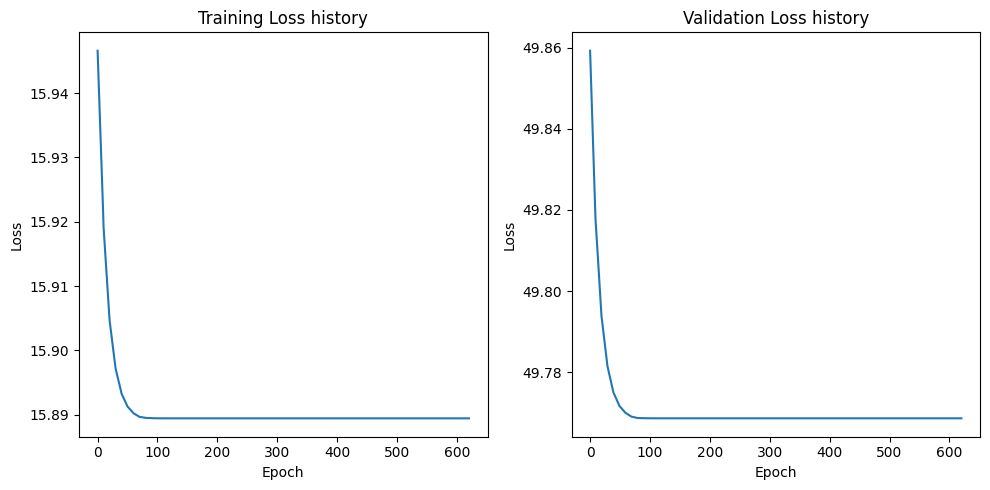

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2537, Train Loss: 139.26002053653494, Validation Loss: 119.72014923095703
Epoch 101/2537, Train Loss: 1.2785496887038736, Validation Loss: 3.460550272464752
Epoch 201/2537, Train Loss: 1.270788732696982, Validation Loss: 3.4473055481910704
Epoch 301/2537, Train Loss: 1.2707879788735335, Validation Loss: 3.447305381298065
Epoch 401/2537, Train Loss: 1.2707879788735335, Validation Loss: 3.447305381298065
Epoch 501/2537, Train Loss: 1.2707879788735335, Validation Loss: 3.447305381298065
Epoch 601/2537, Train Loss: 1.2707879788735335, Validation Loss: 3.447305381298065
Epoch 701/2537, Train Loss: 1.2707879788735335, Validation Loss: 3.447305381298065
Early stopping triggered.


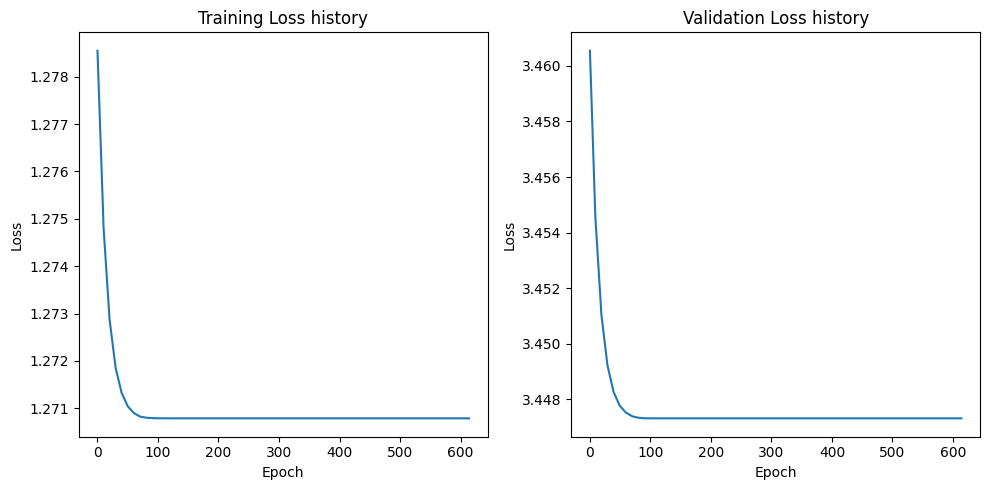

[I 2023-10-11 08:02:08,749] Trial 44 finished with value: 3.5262956619262695 and parameters: {'hidden_layers': 5, 'epochs': 2537, 'batch_size': 149, 'learning_rate': 0.018515658958843356}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2831, Train Loss: 924.4534040178571, Validation Loss: 731.4327087402344
Epoch 101/2831, Train Loss: 11.480926139014107, Validation Loss: 28.02742087841034
Epoch 201/2831, Train Loss: 11.42237377166748, Validation Loss: 27.955034971237183
Epoch 301/2831, Train Loss: 11.422364916120257, Validation Loss: 27.955018401145935
Epoch 401/2831, Train Loss: 11.422364916120257, Validation Loss: 27.955018401145935
Epoch 501/2831, Train Loss: 11.422364916120257, Validation Loss: 27.955018401145935
Epoch 601/2831, Train Loss: 11.422364916120257, Validation Loss: 27.955018401145935
Epoch 701/2831, Train Loss: 11.422364916120257, Validation Loss: 27.955018401145935
Early stopping triggered.


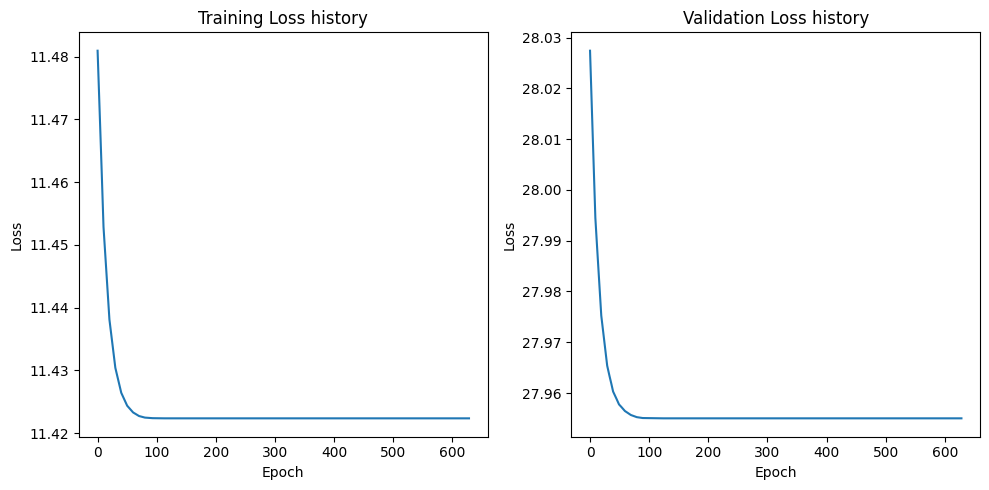

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2831, Train Loss: 944.0121023995536, Validation Loss: 773.7560119628906
Epoch 101/2831, Train Loss: 12.630542346409388, Validation Loss: 30.295853853225708
Epoch 201/2831, Train Loss: 12.555383205413818, Validation Loss: 30.1938636302948
Epoch 301/2831, Train Loss: 12.555374554225377, Validation Loss: 30.193870782852173
Epoch 401/2831, Train Loss: 12.555374554225377, Validation Loss: 30.193870782852173
Epoch 501/2831, Train Loss: 12.555374554225377, Validation Loss: 30.193870782852173
Epoch 601/2831, Train Loss: 12.555374554225377, Validation Loss: 30.193870782852173
Epoch 701/2831, Train Loss: 12.555374554225377, Validation Loss: 30.193870782852173
Early stopping triggered.


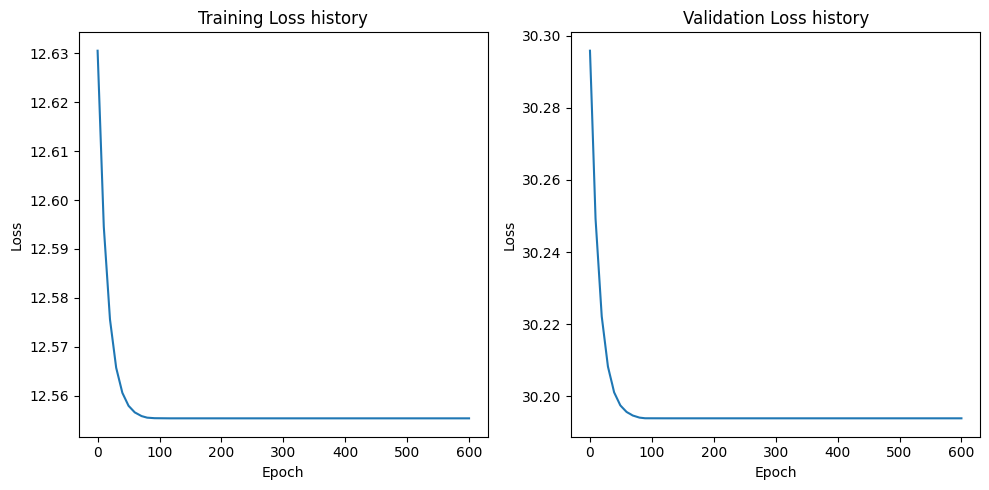

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2831, Train Loss: 119.99067415509906, Validation Loss: 97.10400581359863
Epoch 101/2831, Train Loss: 0.8781189184103694, Validation Loss: 3.318317010998726
Epoch 201/2831, Train Loss: 0.8743996077350208, Validation Loss: 3.306935630738735
Epoch 301/2831, Train Loss: 0.874398729630879, Validation Loss: 3.306931972503662
Epoch 401/2831, Train Loss: 0.874398729630879, Validation Loss: 3.306931972503662
Epoch 501/2831, Train Loss: 0.874398729630879, Validation Loss: 3.306931972503662
Epoch 601/2831, Train Loss: 0.874398729630879, Validation Loss: 3.306931972503662
Epoch 701/2831, Train Loss: 0.874398729630879, Validation Loss: 3.306931972503662
Early stopping triggered.


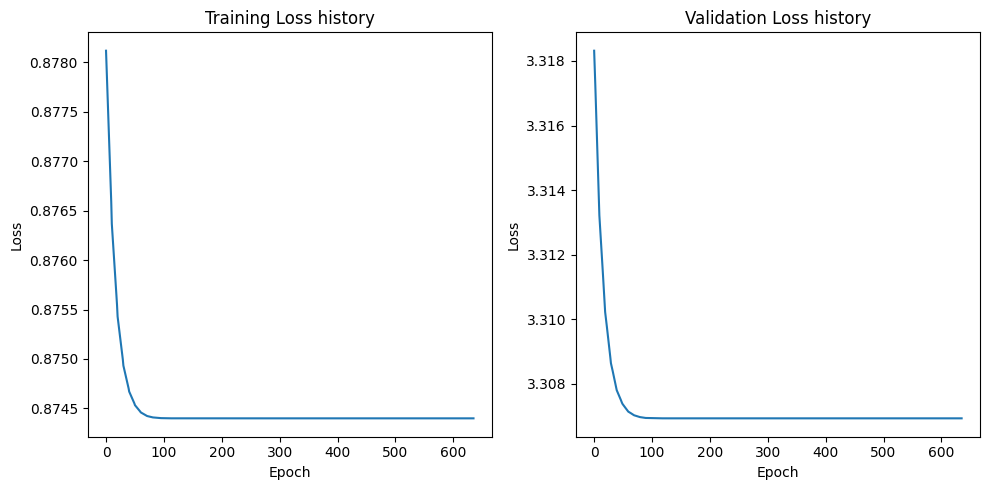

[I 2023-10-11 08:03:29,371] Trial 45 finished with value: 2.954200029373169 and parameters: {'hidden_layers': 4, 'epochs': 2831, 'batch_size': 187, 'learning_rate': 0.0314535771514889}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1772, Train Loss: 971.2666422526041, Validation Loss: 932.5762837727865
Epoch 101/1772, Train Loss: 23.255805219922745, Validation Loss: 42.665749390920006
Epoch 201/1772, Train Loss: 23.195875917162216, Validation Loss: 42.58982531229655
Epoch 301/1772, Train Loss: 23.195874191465833, Validation Loss: 42.58982849121094
Epoch 401/1772, Train Loss: 23.195874191465833, Validation Loss: 42.58982849121094
Epoch 501/1772, Train Loss: 23.195874191465833, Validation Loss: 42.58982849121094
Epoch 601/1772, Train Loss: 23.195874191465833, Validation Loss: 42.58982849121094
Epoch 701/1772, Train Loss: 23.195874191465833, Validation Loss: 42.58982849121094
Early stopping triggered.


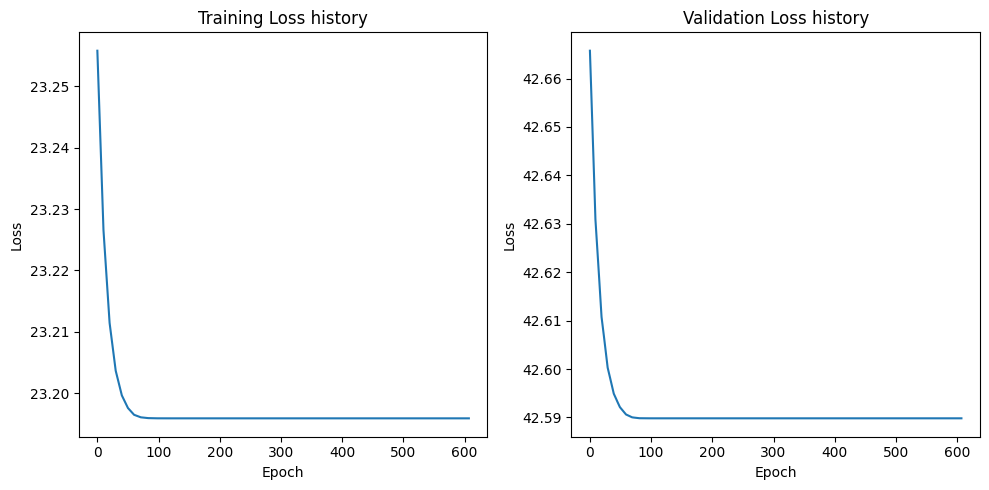

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1772, Train Loss: 987.116949172247, Validation Loss: 963.3659362792969
Epoch 101/1772, Train Loss: 72.93147604806083, Validation Loss: 111.16725476582845
Epoch 201/1772, Train Loss: 72.6524672735305, Validation Loss: 110.85927518208821
Epoch 301/1772, Train Loss: 72.65245891752697, Validation Loss: 110.85927391052246
Epoch 401/1772, Train Loss: 72.65245891752697, Validation Loss: 110.85927391052246
Epoch 501/1772, Train Loss: 72.65245891752697, Validation Loss: 110.85927391052246
Epoch 601/1772, Train Loss: 72.65245891752697, Validation Loss: 110.85927391052246
Epoch 701/1772, Train Loss: 72.65245891752697, Validation Loss: 110.85927391052246
Early stopping triggered.


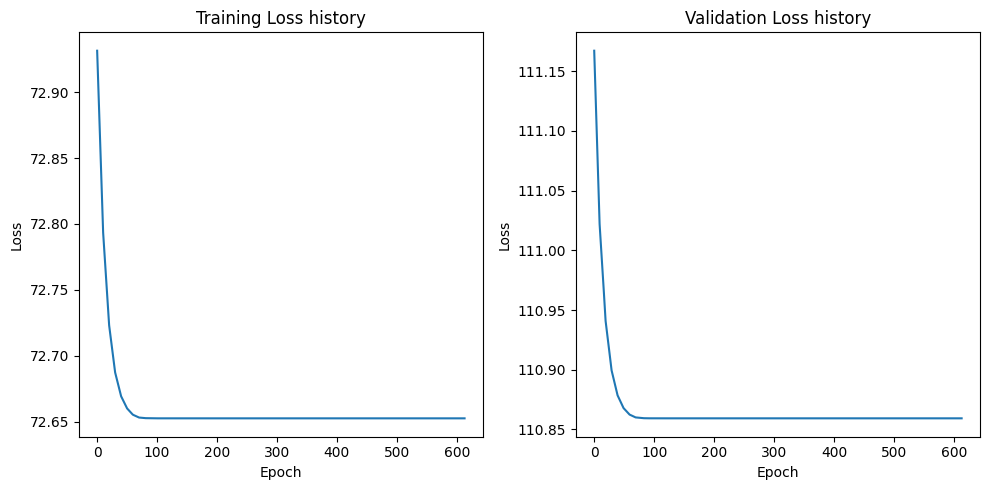

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1772, Train Loss: 128.76915232340494, Validation Loss: 108.52688852945964
Epoch 101/1772, Train Loss: 2.0154071081252325, Validation Loss: 4.593671401341756
Epoch 201/1772, Train Loss: 2.008715334392729, Validation Loss: 4.584776898225148
Epoch 301/1772, Train Loss: 2.008714885938735, Validation Loss: 4.584776024023692
Epoch 401/1772, Train Loss: 2.008714885938735, Validation Loss: 4.584776024023692
Epoch 501/1772, Train Loss: 2.008714885938735, Validation Loss: 4.584776024023692
Epoch 601/1772, Train Loss: 2.008714885938735, Validation Loss: 4.584776024023692
Epoch 701/1772, Train Loss: 2.008714885938735, Validation Loss: 4.584776024023692
Early stopping triggered.


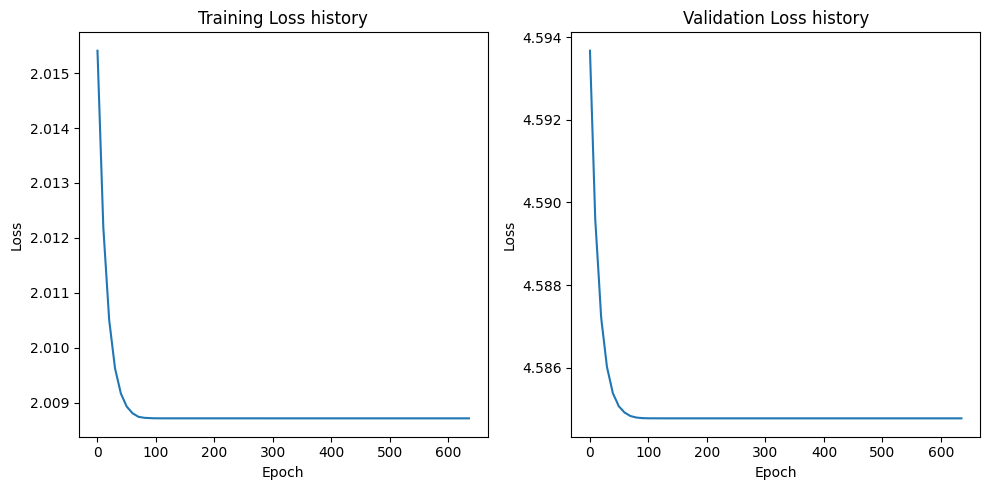

[I 2023-10-11 08:04:58,736] Trial 46 finished with value: 5.264523029327393 and parameters: {'hidden_layers': 5, 'epochs': 1772, 'batch_size': 123, 'learning_rate': 0.009039844157306789}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1206, Train Loss: 864.7375556098091, Validation Loss: 630.2023417154948
Epoch 101/1206, Train Loss: 9.073003239101833, Validation Loss: 26.519511222839355
Epoch 201/1206, Train Loss: 9.04172166188558, Validation Loss: 26.477362950642902
Epoch 301/1206, Train Loss: 9.041714880201551, Validation Loss: 26.47735897699992
Epoch 401/1206, Train Loss: 9.041714880201551, Validation Loss: 26.47735897699992
Epoch 501/1206, Train Loss: 9.041714880201551, Validation Loss: 26.47735897699992
Epoch 601/1206, Train Loss: 9.041714880201551, Validation Loss: 26.47735897699992
Epoch 701/1206, Train Loss: 9.041714880201551, Validation Loss: 26.47735897699992
Early stopping triggered.


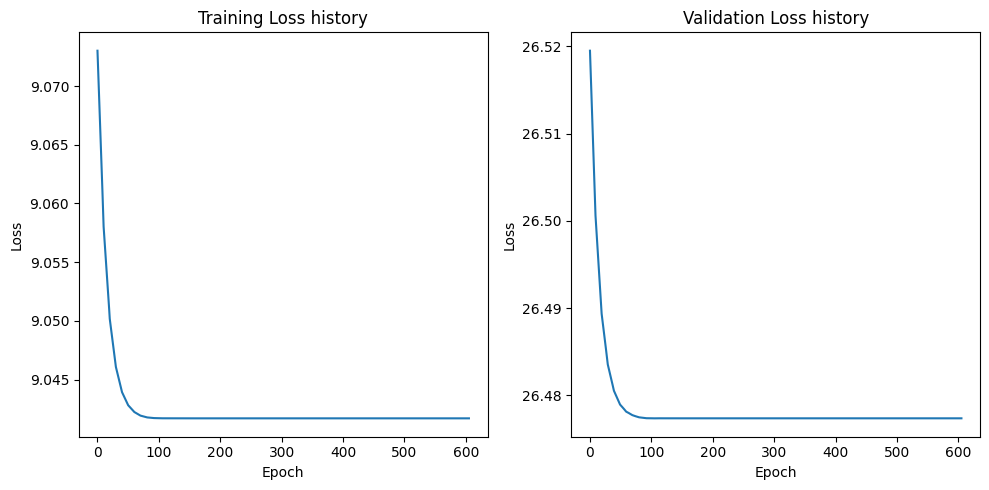

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1206, Train Loss: 856.6698744032118, Validation Loss: 587.8540547688802
Epoch 101/1206, Train Loss: 7.79437420103285, Validation Loss: 25.00022880236308
Epoch 201/1206, Train Loss: 7.7633825408087835, Validation Loss: 24.941182533899944
Epoch 301/1206, Train Loss: 7.763376659817165, Validation Loss: 24.941186904907227
Epoch 401/1206, Train Loss: 7.763376659817165, Validation Loss: 24.941186904907227
Epoch 501/1206, Train Loss: 7.763376659817165, Validation Loss: 24.941186904907227
Epoch 601/1206, Train Loss: 7.763376659817165, Validation Loss: 24.941186904907227
Epoch 701/1206, Train Loss: 7.763376659817165, Validation Loss: 24.941186904907227
Early stopping triggered.


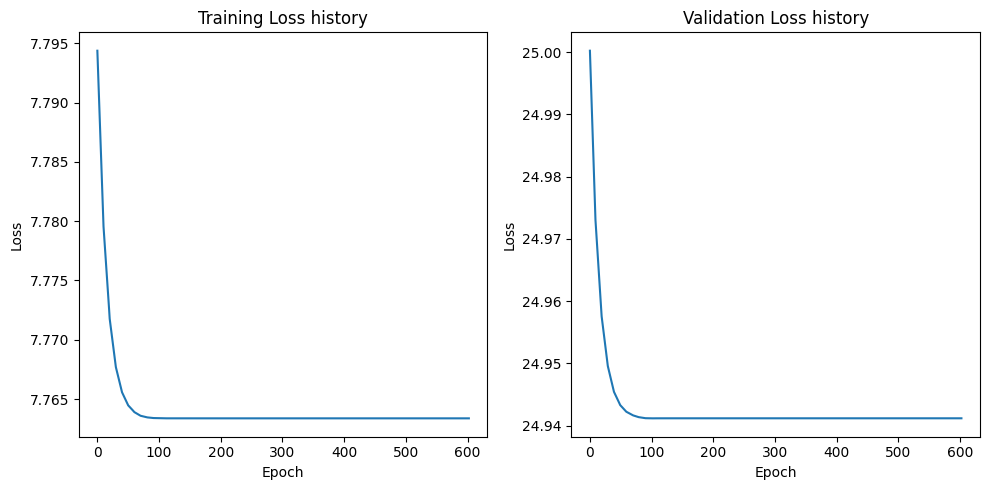

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1206, Train Loss: 106.21897167629666, Validation Loss: 111.28260040283203
Epoch 101/1206, Train Loss: 1.5204631553755865, Validation Loss: 3.710733195145925
Epoch 201/1206, Train Loss: 1.5155536201265123, Validation Loss: 3.7052637139956155
Epoch 301/1206, Train Loss: 1.5155525339974298, Validation Loss: 3.7052629590034485
Epoch 401/1206, Train Loss: 1.5155525339974298, Validation Loss: 3.7052629590034485
Epoch 501/1206, Train Loss: 1.5155525339974298, Validation Loss: 3.7052629590034485
Epoch 601/1206, Train Loss: 1.5155525339974298, Validation Loss: 3.7052629590034485
Epoch 701/1206, Train Loss: 1.5155525339974298, Validation Loss: 3.7052629590034485
Early stopping triggered.


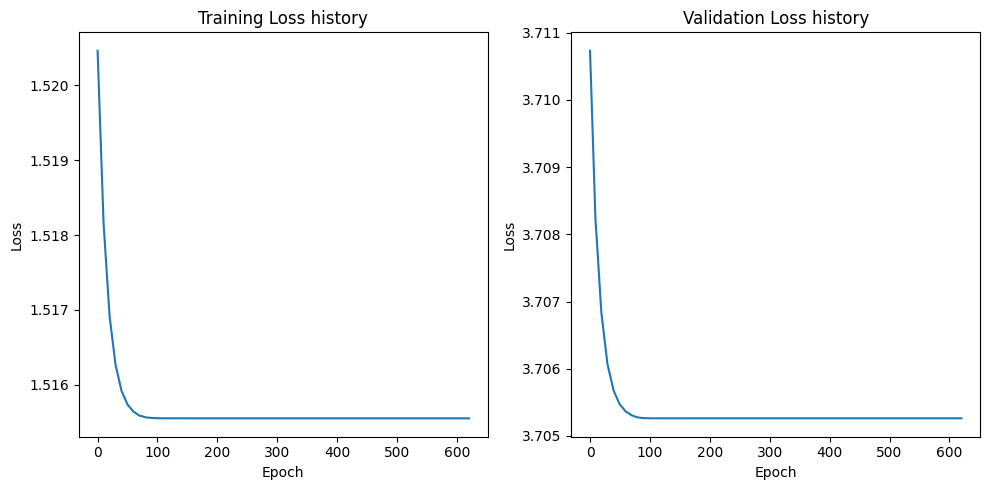

[I 2023-10-11 08:06:04,161] Trial 47 finished with value: 3.0471649169921875 and parameters: {'hidden_layers': 5, 'epochs': 1206, 'batch_size': 290, 'learning_rate': 0.06349091854208289}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2139, Train Loss: 1008.8853454589844, Validation Loss: 1001.4344787597656
Epoch 101/2139, Train Loss: 266.0795249938965, Validation Loss: 276.1785888671875
Epoch 201/2139, Train Loss: 265.70959854125977, Validation Loss: 275.83838653564453
Epoch 301/2139, Train Loss: 265.7095603942871, Validation Loss: 275.83837127685547
Epoch 401/2139, Train Loss: 265.7095603942871, Validation Loss: 275.83837127685547
Epoch 501/2139, Train Loss: 265.7095603942871, Validation Loss: 275.83837127685547
Epoch 601/2139, Train Loss: 265.7095603942871, Validation Loss: 275.83837127685547
Epoch 701/2139, Train Loss: 265.7095603942871, Validation Loss: 275.83837127685547
Early stopping triggered.


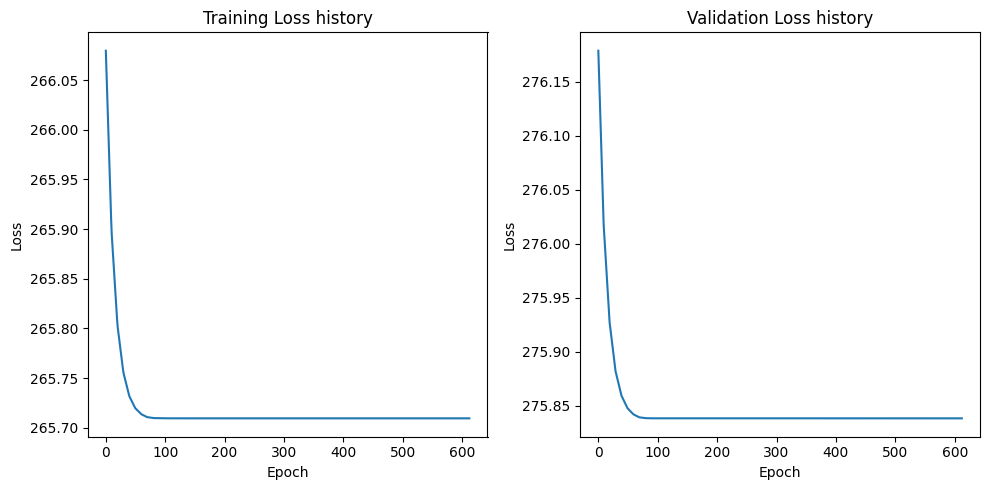

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2139, Train Loss: 994.8343658447266, Validation Loss: 994.8358154296875
Epoch 101/2139, Train Loss: 227.80312538146973, Validation Loss: 254.26815795898438
Epoch 201/2139, Train Loss: 227.45360946655273, Validation Loss: 253.99394989013672
Epoch 301/2139, Train Loss: 227.4535903930664, Validation Loss: 253.9939422607422
Epoch 401/2139, Train Loss: 227.4535903930664, Validation Loss: 253.9939422607422
Epoch 501/2139, Train Loss: 227.4535903930664, Validation Loss: 253.9939422607422
Epoch 601/2139, Train Loss: 227.4535903930664, Validation Loss: 253.9939422607422
Epoch 701/2139, Train Loss: 227.4535903930664, Validation Loss: 253.9939422607422
Early stopping triggered.


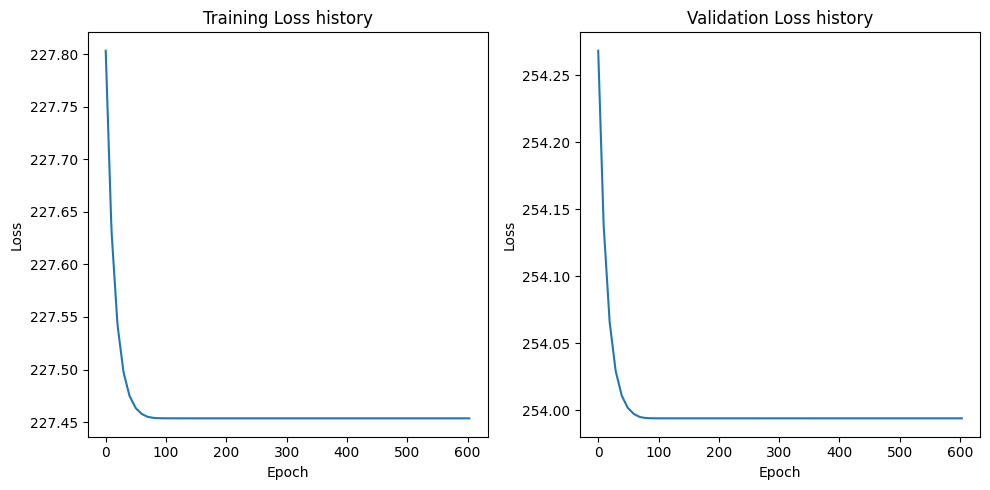

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2139, Train Loss: 139.63125038146973, Validation Loss: 137.2609748840332
Epoch 101/2139, Train Loss: 17.42135977745056, Validation Loss: 28.625256538391113
Epoch 201/2139, Train Loss: 17.39116334915161, Validation Loss: 28.59576416015625
Epoch 301/2139, Train Loss: 17.39116144180298, Validation Loss: 28.595765113830566
Epoch 401/2139, Train Loss: 17.39116144180298, Validation Loss: 28.595765113830566
Epoch 501/2139, Train Loss: 17.39116144180298, Validation Loss: 28.595765113830566
Epoch 601/2139, Train Loss: 17.39116144180298, Validation Loss: 28.595765113830566
Epoch 701/2139, Train Loss: 17.39116144180298, Validation Loss: 28.595765113830566
Early stopping triggered.


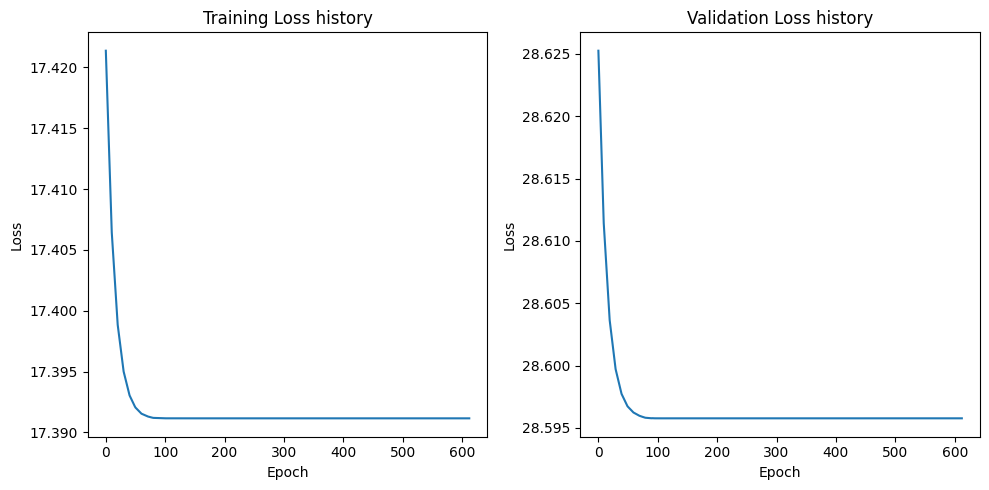

[I 2023-10-11 08:07:11,465] Trial 48 finished with value: 11.99272632598877 and parameters: {'hidden_layers': 4, 'epochs': 2139, 'batch_size': 349, 'learning_rate': 0.006673878480470569}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1359, Train Loss: 912.0160688920455, Validation Loss: 773.0125122070312
Epoch 101/1359, Train Loss: 13.987582900307395, Validation Loss: 45.50856145222982
Epoch 201/1359, Train Loss: 13.949465838345615, Validation Loss: 45.46337381998698
Epoch 301/1359, Train Loss: 13.949460809881037, Validation Loss: 45.463378270467125
Epoch 401/1359, Train Loss: 13.949460723183371, Validation Loss: 45.463378270467125
Epoch 501/1359, Train Loss: 13.949460723183371, Validation Loss: 45.463378270467125
Epoch 601/1359, Train Loss: 13.949460723183371, Validation Loss: 45.463378270467125
Early stopping triggered.


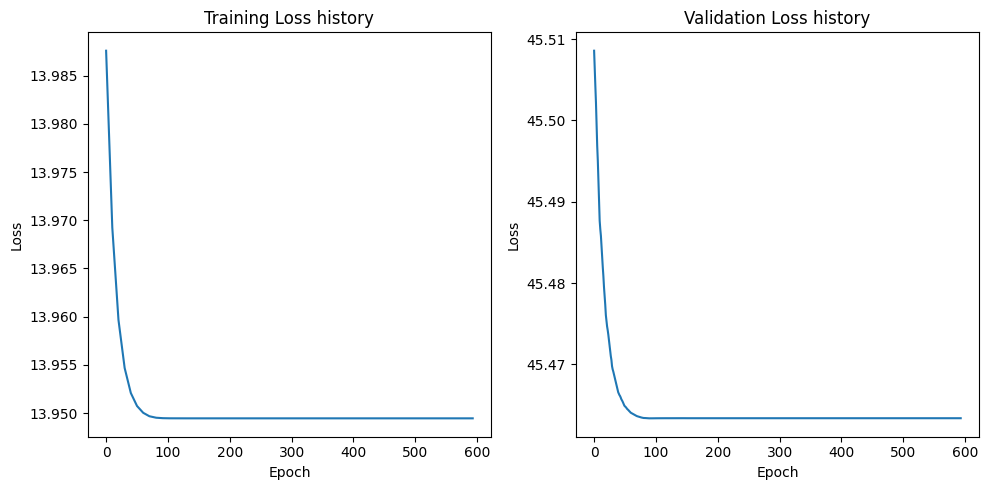

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1359, Train Loss: 948.2737371271306, Validation Loss: 803.9587809244791
Epoch 101/1359, Train Loss: 17.41505544835871, Validation Loss: 52.186346689860024
Epoch 201/1359, Train Loss: 17.36683602766557, Validation Loss: 52.13375473022461
Epoch 301/1359, Train Loss: 17.366832212968305, Validation Loss: 52.13375600179037
Epoch 401/1359, Train Loss: 17.366832212968305, Validation Loss: 52.13375600179037
Epoch 501/1359, Train Loss: 17.366832212968305, Validation Loss: 52.13375600179037
Epoch 601/1359, Train Loss: 17.366832212968305, Validation Loss: 52.13375600179037
Early stopping triggered.


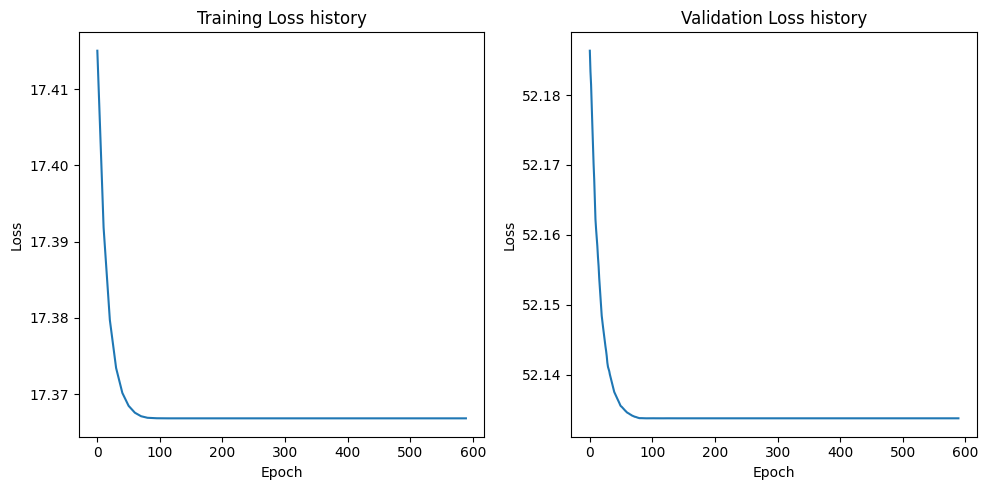

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1359, Train Loss: 131.42787378484553, Validation Loss: 105.62484486897786
Epoch 101/1359, Train Loss: 1.6693900606848977, Validation Loss: 4.423362493515015
Epoch 201/1359, Train Loss: 1.662982160394842, Validation Loss: 4.414977153142293
Epoch 301/1359, Train Loss: 1.662981087511236, Validation Loss: 4.414975643157959
Epoch 401/1359, Train Loss: 1.662981087511236, Validation Loss: 4.414975643157959
Epoch 501/1359, Train Loss: 1.662981087511236, Validation Loss: 4.414975643157959
Epoch 601/1359, Train Loss: 1.662981087511236, Validation Loss: 4.414975643157959
Epoch 701/1359, Train Loss: 1.662981087511236, Validation Loss: 4.414975643157959
Early stopping triggered.


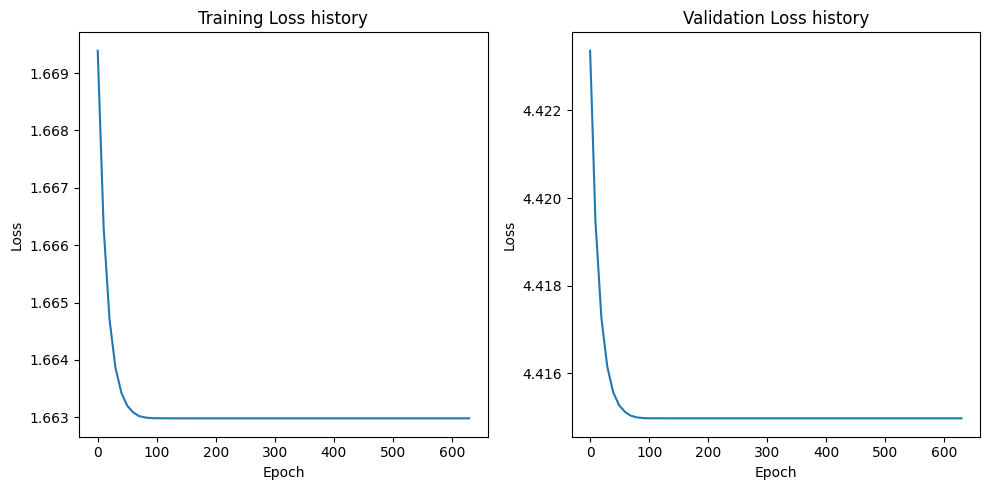

[I 2023-10-11 08:08:20,669] Trial 49 finished with value: 3.8152005672454834 and parameters: {'hidden_layers': 5, 'epochs': 1359, 'batch_size': 236, 'learning_rate': 0.02814637214186403}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1648, Train Loss: 984.7777519226074, Validation Loss: 899.2944946289062
Epoch 101/1648, Train Loss: 29.284036576747894, Validation Loss: 87.2414779663086
Epoch 201/1648, Train Loss: 29.17309844493866, Validation Loss: 87.14070320129395
Epoch 301/1648, Train Loss: 29.173091650009155, Validation Loss: 87.14067935943604
Epoch 401/1648, Train Loss: 29.173091650009155, Validation Loss: 87.14067935943604
Epoch 501/1648, Train Loss: 29.173091650009155, Validation Loss: 87.14067935943604
Epoch 601/1648, Train Loss: 29.173091650009155, Validation Loss: 87.14067935943604
Epoch 701/1648, Train Loss: 29.173091650009155, Validation Loss: 87.14067935943604
Early stopping triggered.


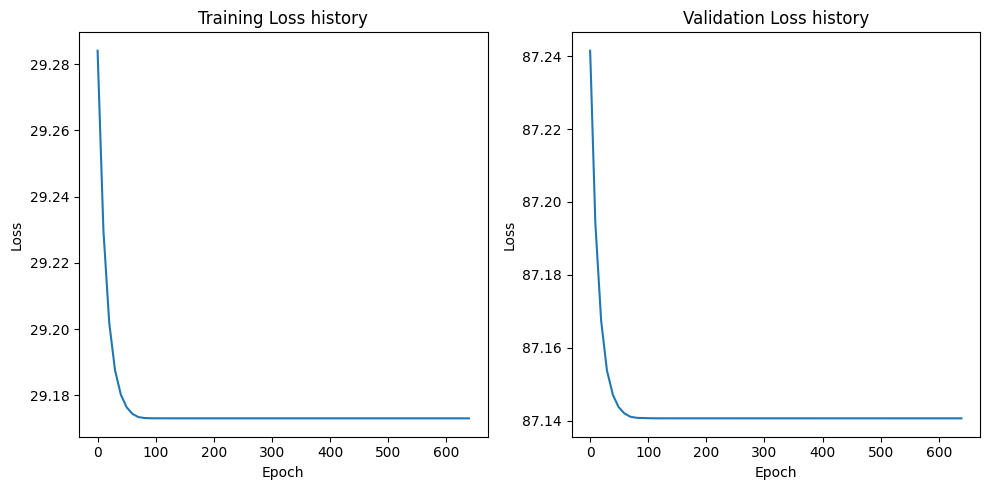

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1648, Train Loss: 967.1720695495605, Validation Loss: 915.9644317626953
Epoch 101/1648, Train Loss: 20.177417278289795, Validation Loss: 54.23332118988037
Epoch 201/1648, Train Loss: 20.10417276620865, Validation Loss: 54.12165451049805
Epoch 301/1648, Train Loss: 20.104166090488434, Validation Loss: 54.12164354324341
Epoch 401/1648, Train Loss: 20.104166090488434, Validation Loss: 54.12164354324341
Epoch 501/1648, Train Loss: 20.104166090488434, Validation Loss: 54.12164354324341
Epoch 601/1648, Train Loss: 20.104166090488434, Validation Loss: 54.12164354324341
Epoch 701/1648, Train Loss: 20.104166090488434, Validation Loss: 54.12164354324341
Early stopping triggered.


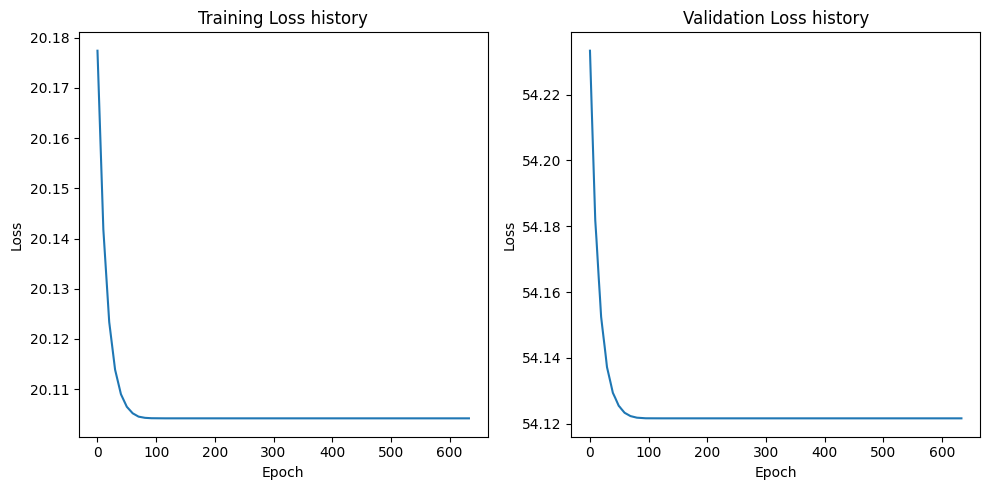

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/1648, Train Loss: 135.69135999679565, Validation Loss: 116.94133758544922
Epoch 101/1648, Train Loss: 1.4806508794426918, Validation Loss: 4.707368940114975
Epoch 201/1648, Train Loss: 1.4752405919134617, Validation Loss: 4.697544157505035
Epoch 301/1648, Train Loss: 1.4752397499978542, Validation Loss: 4.697544187307358
Epoch 401/1648, Train Loss: 1.4752397499978542, Validation Loss: 4.697544187307358
Epoch 501/1648, Train Loss: 1.4752397499978542, Validation Loss: 4.697544187307358
Epoch 601/1648, Train Loss: 1.4752397499978542, Validation Loss: 4.697544187307358
Epoch 701/1648, Train Loss: 1.4752397499978542, Validation Loss: 4.697544187307358
Early stopping triggered.


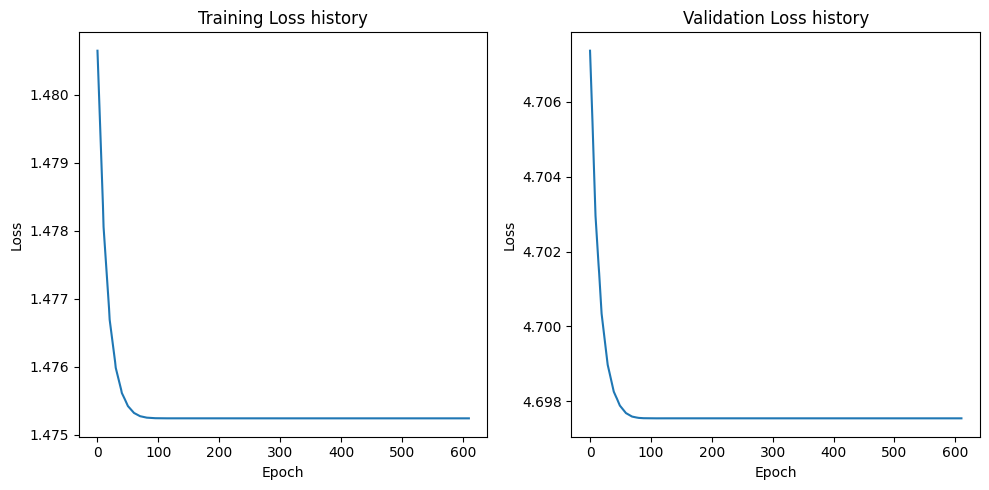

[I 2023-10-11 08:09:39,250] Trial 50 finished with value: 4.463287830352783 and parameters: {'hidden_layers': 4, 'epochs': 1648, 'batch_size': 159, 'learning_rate': 0.018378373949043864}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2859, Train Loss: 675.4770539936267, Validation Loss: 1098.8005065917969
Epoch 101/2859, Train Loss: 6.5935563037269995, Validation Loss: 19.143916511535643
Epoch 201/2859, Train Loss: 6.551358285703157, Validation Loss: 19.081553840637206
Epoch 301/2859, Train Loss: 6.551341759531121, Validation Loss: 19.08154296875
Epoch 401/2859, Train Loss: 6.551341759531121, Validation Loss: 19.08154296875
Epoch 501/2859, Train Loss: 6.551341759531121, Validation Loss: 19.08154296875
Epoch 601/2859, Train Loss: 6.551341759531121, Validation Loss: 19.08154296875
Epoch 701/2859, Train Loss: 6.551341759531121, Validation Loss: 19.08154296875
Early stopping triggered.


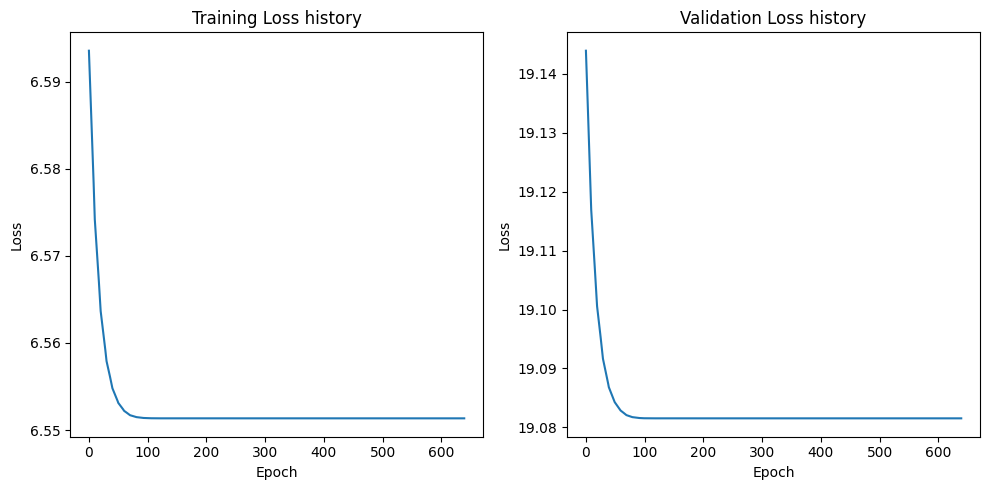

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2859, Train Loss: 757.6670724969161, Validation Loss: 682.762158203125
Epoch 101/2859, Train Loss: 4.372712147863288, Validation Loss: 18.582027912139893
Epoch 201/2859, Train Loss: 4.348840487630744, Validation Loss: 18.54372444152832
Epoch 301/2859, Train Loss: 4.348831678691663, Validation Loss: 18.543707180023194
Epoch 401/2859, Train Loss: 4.348831678691663, Validation Loss: 18.543707180023194
Epoch 501/2859, Train Loss: 4.348831678691663, Validation Loss: 18.543707180023194
Epoch 601/2859, Train Loss: 4.348831678691663, Validation Loss: 18.543707180023194
Epoch 701/2859, Train Loss: 4.348831678691663, Validation Loss: 18.543707180023194
Early stopping triggered.


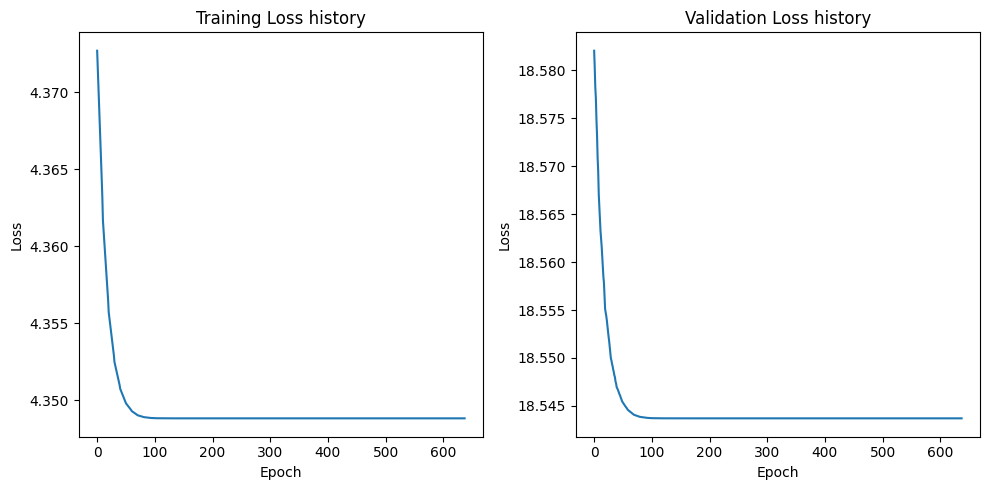

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2859, Train Loss: 82.68661719874332, Validation Loss: 306.43805541992185
Epoch 101/2859, Train Loss: 0.9875406669942957, Validation Loss: 3.0617645025253295
Epoch 201/2859, Train Loss: 0.9820321782639152, Validation Loss: 3.0505621314048765
Epoch 301/2859, Train Loss: 0.9820298066264704, Validation Loss: 3.0505571126937867
Epoch 401/2859, Train Loss: 0.9820298066264704, Validation Loss: 3.0505571126937867
Epoch 501/2859, Train Loss: 0.9820298066264704, Validation Loss: 3.0505571126937867
Epoch 601/2859, Train Loss: 0.9820298066264704, Validation Loss: 3.0505571126937867
Epoch 701/2859, Train Loss: 0.9820298066264704, Validation Loss: 3.0505571126937867
Early stopping triggered.


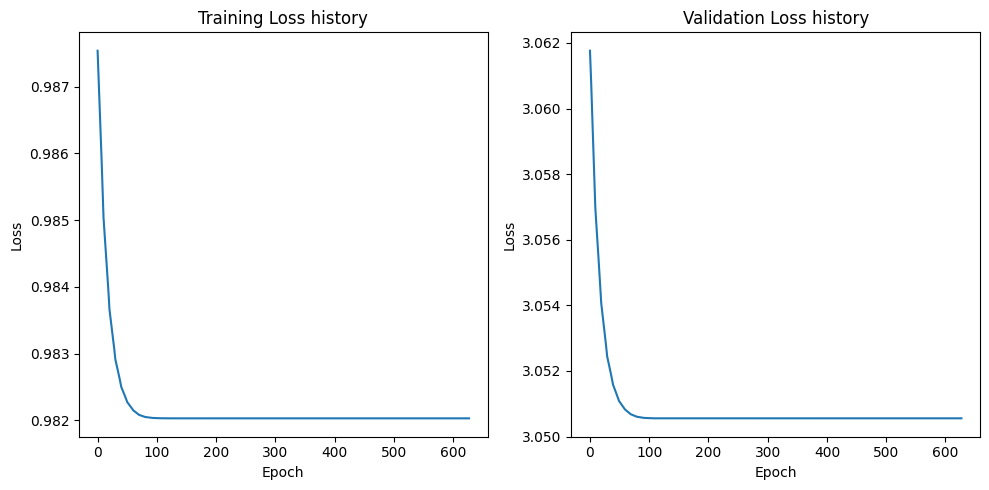

[I 2023-10-11 08:11:04,965] Trial 51 finished with value: 2.3665013313293457 and parameters: {'hidden_layers': 5, 'epochs': 2859, 'batch_size': 135, 'learning_rate': 0.061277368620351144}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2560, Train Loss: 737.7535593133224, Validation Loss: 925.7594482421875
Epoch 101/2560, Train Loss: 7.391440015090139, Validation Loss: 28.859817504882812
Epoch 201/2560, Train Loss: 7.354454843621505, Validation Loss: 28.78190860748291
Epoch 301/2560, Train Loss: 7.354438781738281, Validation Loss: 28.78189163208008
Epoch 401/2560, Train Loss: 7.354438781738281, Validation Loss: 28.78189163208008
Epoch 501/2560, Train Loss: 7.354438781738281, Validation Loss: 28.78189163208008
Epoch 601/2560, Train Loss: 7.354438781738281, Validation Loss: 28.78189163208008
Epoch 701/2560, Train Loss: 7.354438781738281, Validation Loss: 28.78189163208008
Early stopping triggered.


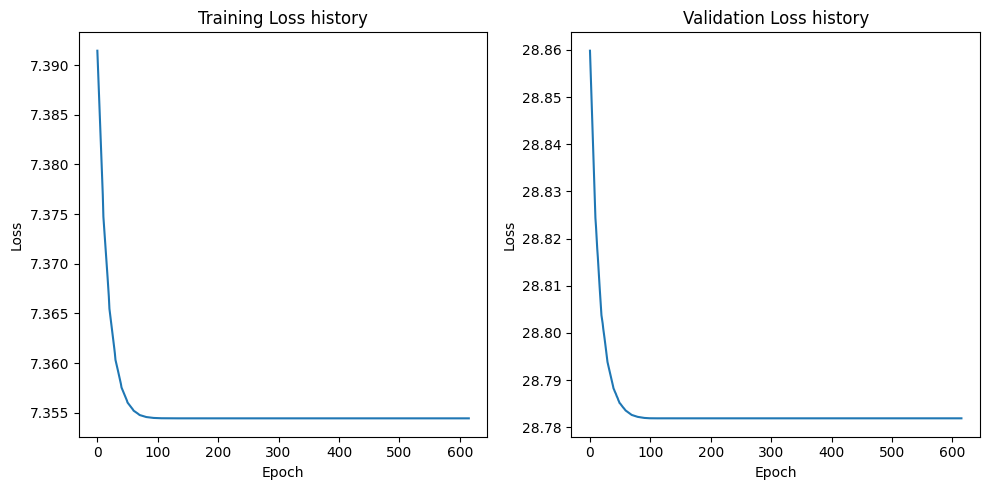

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2560, Train Loss: 688.8906763980264, Validation Loss: 1496.415509033203
Epoch 101/2560, Train Loss: 7.495700911471718, Validation Loss: 23.79206485748291
Epoch 201/2560, Train Loss: 7.455603674838417, Validation Loss: 23.73535861968994
Epoch 301/2560, Train Loss: 7.4555864334106445, Validation Loss: 23.735367202758788
Epoch 401/2560, Train Loss: 7.4555864334106445, Validation Loss: 23.735367202758788
Epoch 501/2560, Train Loss: 7.4555864334106445, Validation Loss: 23.735367202758788
Epoch 601/2560, Train Loss: 7.4555864334106445, Validation Loss: 23.735367202758788
Epoch 701/2560, Train Loss: 7.4555864334106445, Validation Loss: 23.735367202758788
Early stopping triggered.


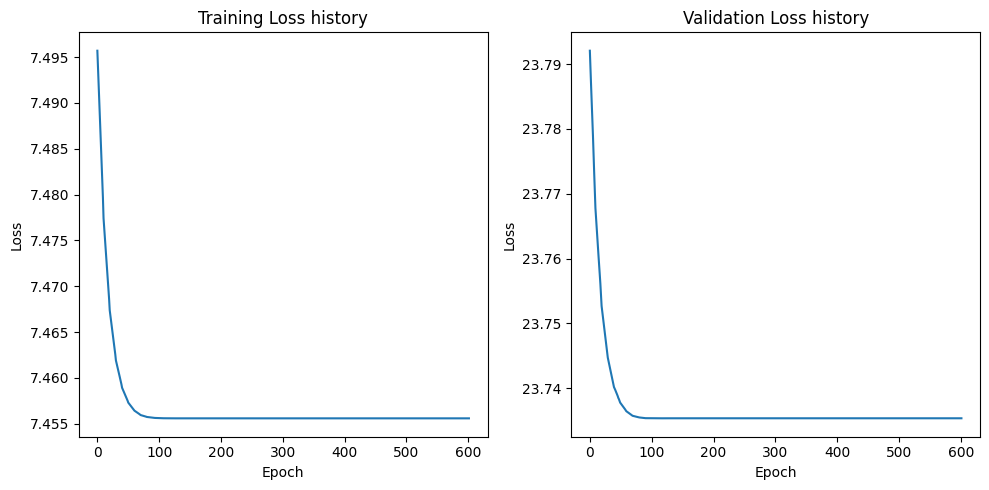

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2560, Train Loss: 49.48642509861996, Validation Loss: 266.4790687561035
Epoch 101/2560, Train Loss: 0.8258322414598966, Validation Loss: 3.596092402935028
Epoch 201/2560, Train Loss: 0.8208539015368411, Validation Loss: 3.5803380370140077
Epoch 301/2560, Train Loss: 0.8208518718418322, Validation Loss: 3.5803298234939573
Epoch 401/2560, Train Loss: 0.8208518749789188, Validation Loss: 3.5803298234939573
Epoch 501/2560, Train Loss: 0.8208518749789188, Validation Loss: 3.5803298234939573
Epoch 601/2560, Train Loss: 0.8208518749789188, Validation Loss: 3.5803298234939573
Epoch 701/2560, Train Loss: 0.8208518749789188, Validation Loss: 3.5803298234939573
Early stopping triggered.


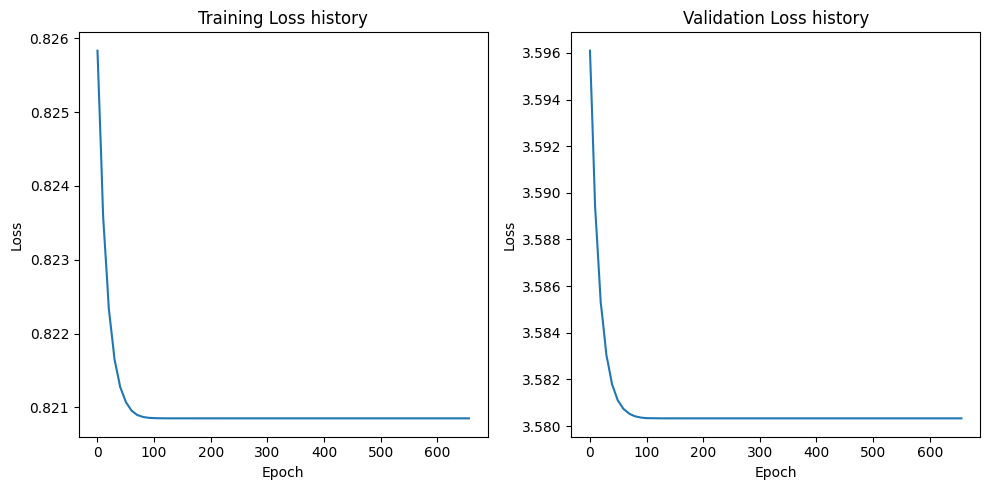

[I 2023-10-11 08:12:31,131] Trial 52 finished with value: 2.5410614013671875 and parameters: {'hidden_layers': 5, 'epochs': 2560, 'batch_size': 133, 'learning_rate': 0.07268787352147162}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2944, Train Loss: 668.4169282459077, Validation Loss: 1807.0372060139973
Epoch 101/2944, Train Loss: 8.895301569075812, Validation Loss: 30.268694678942364
Epoch 201/2944, Train Loss: 8.84695981797718, Validation Loss: 30.154786745707195
Epoch 301/2944, Train Loss: 8.846939438865299, Validation Loss: 30.154717961947124
Epoch 401/2944, Train Loss: 8.846939438865299, Validation Loss: 30.154717961947124
Epoch 501/2944, Train Loss: 8.846939438865299, Validation Loss: 30.154717961947124
Epoch 601/2944, Train Loss: 8.846939438865299, Validation Loss: 30.154717961947124
Epoch 701/2944, Train Loss: 8.846939438865299, Validation Loss: 30.154717961947124
Early stopping triggered.


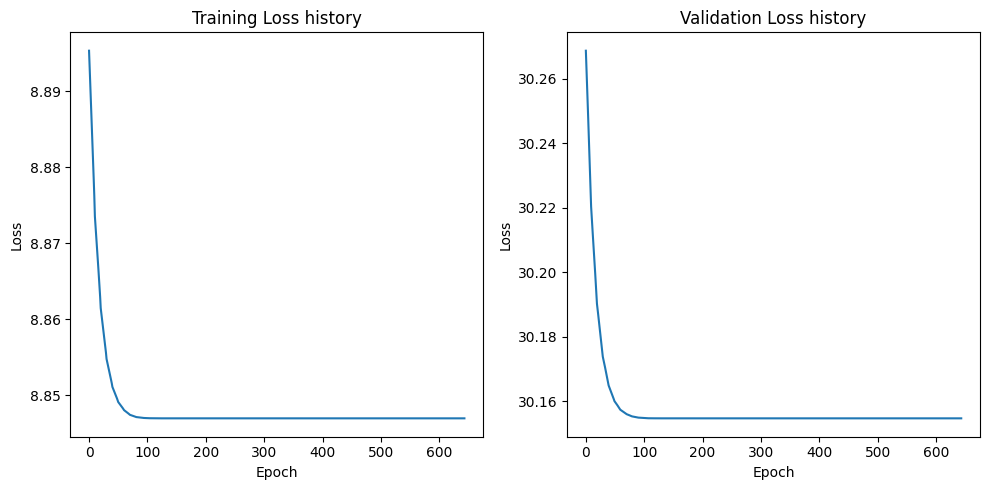

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2944, Train Loss: 638.2482416062128, Validation Loss: 1381.0660044352214
Epoch 101/2944, Train Loss: 6.601952121371315, Validation Loss: 30.070011377334595
Epoch 201/2944, Train Loss: 6.559926350911458, Validation Loss: 29.995553414026897
Epoch 301/2944, Train Loss: 6.5599053360167, Validation Loss: 29.995551586151123
Epoch 401/2944, Train Loss: 6.5599053360167, Validation Loss: 29.995551586151123
Epoch 501/2944, Train Loss: 6.5599053360167, Validation Loss: 29.995551586151123
Epoch 601/2944, Train Loss: 6.5599053360167, Validation Loss: 29.995551586151123
Epoch 701/2944, Train Loss: 6.5599053360167, Validation Loss: 29.995551586151123
Early stopping triggered.


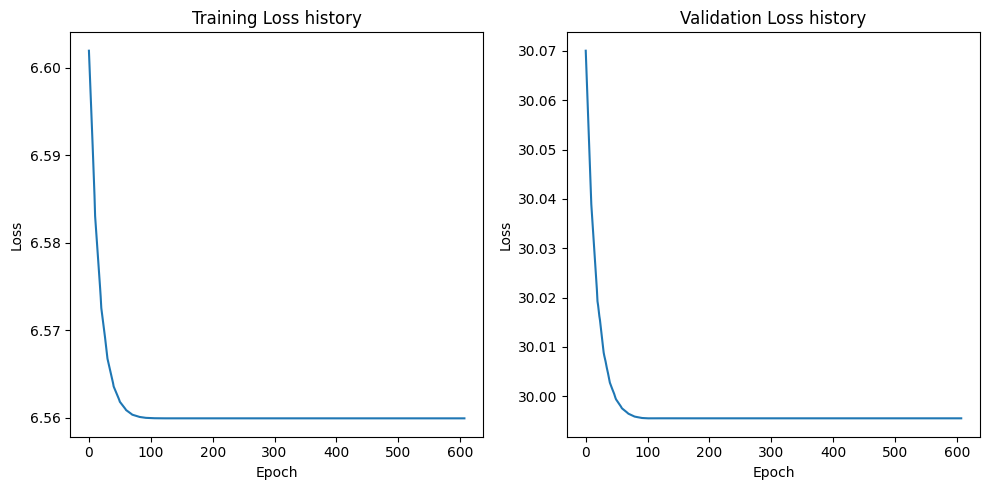

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2944, Train Loss: 71.2224969409761, Validation Loss: 186.17985661824545
Epoch 101/2944, Train Loss: 0.5469887015365419, Validation Loss: 3.187461862961451
Epoch 201/2944, Train Loss: 0.5430278231700262, Validation Loss: 3.1714700957139335
Epoch 301/2944, Train Loss: 0.5430259037585485, Validation Loss: 3.1714632908503213
Epoch 401/2944, Train Loss: 0.5430259037585485, Validation Loss: 3.1714632908503213
Epoch 501/2944, Train Loss: 0.5430259037585485, Validation Loss: 3.1714632908503213
Epoch 601/2944, Train Loss: 0.5430259037585485, Validation Loss: 3.1714632908503213
Epoch 701/2944, Train Loss: 0.5430259037585485, Validation Loss: 3.1714632908503213
Early stopping triggered.


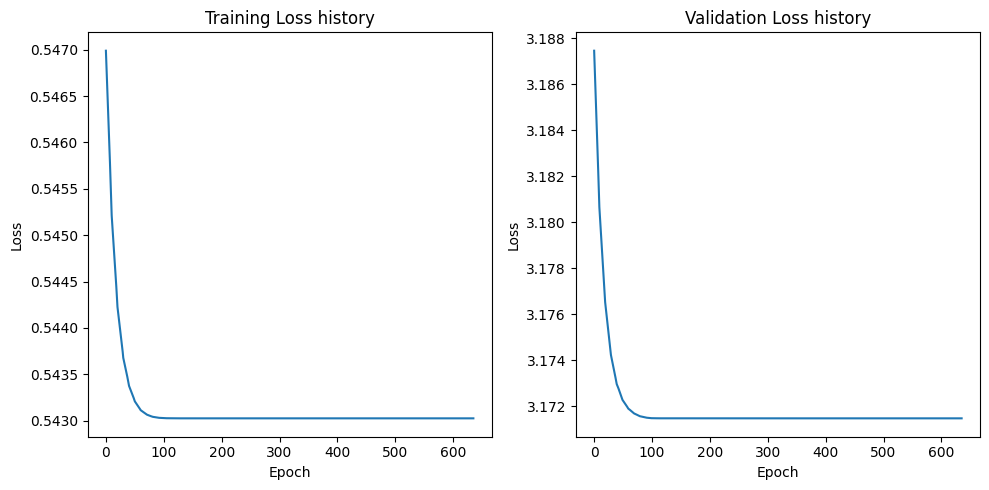

[I 2023-10-11 08:14:00,280] Trial 53 finished with value: 2.6847400665283203 and parameters: {'hidden_layers': 5, 'epochs': 2944, 'batch_size': 123, 'learning_rate': 0.08057664830014688}. Best is trial 26 with value: 2.044973134994507.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2530, Train Loss: 579.5655334472656, Validation Loss: 994.4173496791294
Epoch 101/2530, Train Loss: 0.2561063036322594, Validation Loss: 5.281714175428663
Epoch 201/2530, Train Loss: 0.25007518142461777, Validation Loss: 5.268048205545971
Epoch 301/2530, Train Loss: 0.25007157504558564, Validation Loss: 5.268055177160671
Epoch 401/2530, Train Loss: 0.25007157504558564, Validation Loss: 5.268055177160671
Epoch 501/2530, Train Loss: 0.25007157504558564, Validation Loss: 5.268055177160671
Epoch 601/2530, Train Loss: 0.25007157504558564, Validation Loss: 5.268055177160671
Epoch 701/2530, Train Loss: 0.25007157504558564, Validation Loss: 5.268055177160671
Early stopping triggered.


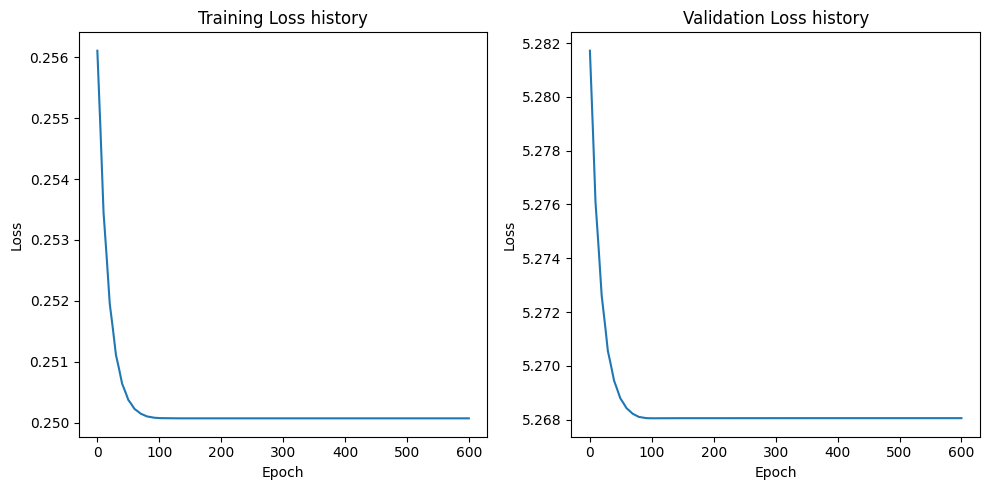

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2530, Train Loss: 735.7903173828125, Validation Loss: 1484.7554234095983
Epoch 101/2530, Train Loss: 2.867157987356186, Validation Loss: 7.227283154215131
Epoch 201/2530, Train Loss: 2.831979899406433, Validation Loss: 7.1702195193086355
Epoch 301/2530, Train Loss: 2.831953909397125, Validation Loss: 7.170185272182737
Epoch 401/2530, Train Loss: 2.831953899860382, Validation Loss: 7.170185272182737
Epoch 501/2530, Train Loss: 2.831953899860382, Validation Loss: 7.170185272182737
Epoch 601/2530, Train Loss: 2.831953899860382, Validation Loss: 7.170185272182737
Epoch 701/2530, Train Loss: 2.831953899860382, Validation Loss: 7.170185272182737
Early stopping triggered.


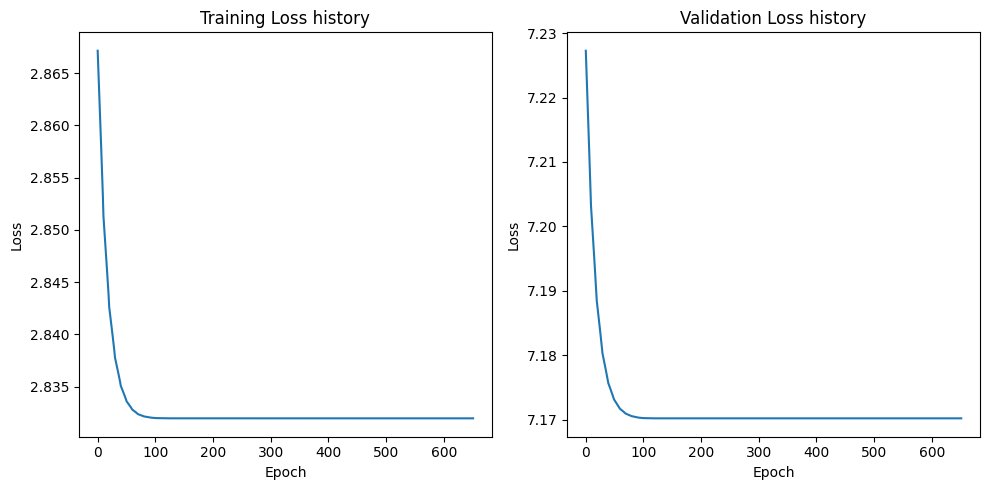

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2530, Train Loss: 69.655380859375, Validation Loss: 102.20067487444196
Epoch 101/2530, Train Loss: 0.4756539213657379, Validation Loss: 0.9381874629429409
Epoch 201/2530, Train Loss: 0.472929025888443, Validation Loss: 0.931420658315931
Epoch 301/2530, Train Loss: 0.4729268205165863, Validation Loss: 0.9314158133098057
Epoch 401/2530, Train Loss: 0.4729268205165863, Validation Loss: 0.9314158133098057
Epoch 501/2530, Train Loss: 0.4729268205165863, Validation Loss: 0.9314158133098057
Epoch 601/2530, Train Loss: 0.4729268205165863, Validation Loss: 0.9314158133098057
Epoch 701/2530, Train Loss: 0.4729268205165863, Validation Loss: 0.9314158133098057
Early stopping triggered.


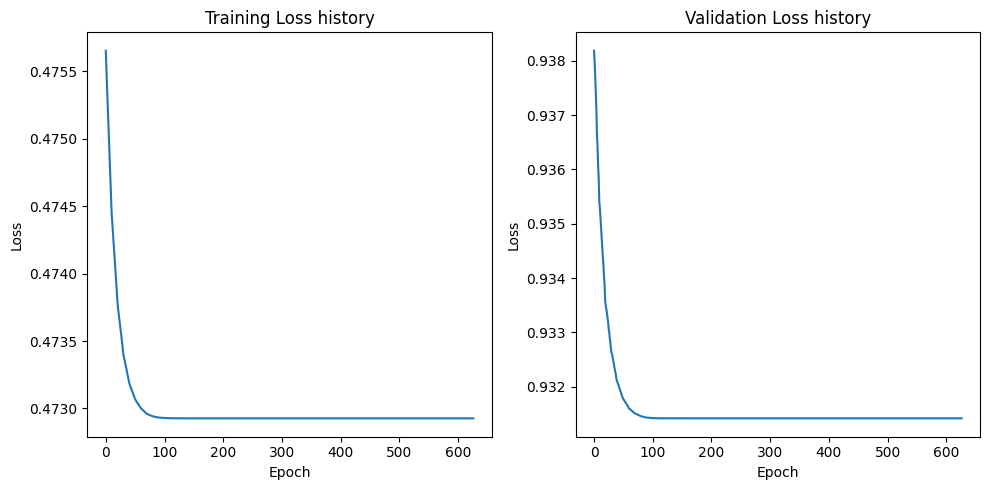

[I 2023-10-11 08:15:39,774] Trial 54 finished with value: 1.2948193550109863 and parameters: {'hidden_layers': 2, 'epochs': 2530, 'batch_size': 100, 'learning_rate': 0.09996577713940262}. Best is trial 54 with value: 1.2948193550109863.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2605, Train Loss: 716.8001171875, Validation Loss: 1077.8980538504463
Epoch 101/2605, Train Loss: 1.1144799189269543, Validation Loss: 2.290649854711124
Epoch 201/2605, Train Loss: 1.1039115543663502, Validation Loss: 2.274003687713827
Epoch 301/2605, Train Loss: 1.1039055088162422, Validation Loss: 2.274005319390978
Epoch 401/2605, Train Loss: 1.1039055088162422, Validation Loss: 2.274005319390978
Epoch 501/2605, Train Loss: 1.1039055088162422, Validation Loss: 2.274005319390978
Epoch 601/2605, Train Loss: 1.1039055088162422, Validation Loss: 2.274005319390978
Epoch 701/2605, Train Loss: 1.1039055088162422, Validation Loss: 2.274005319390978
Early stopping triggered.


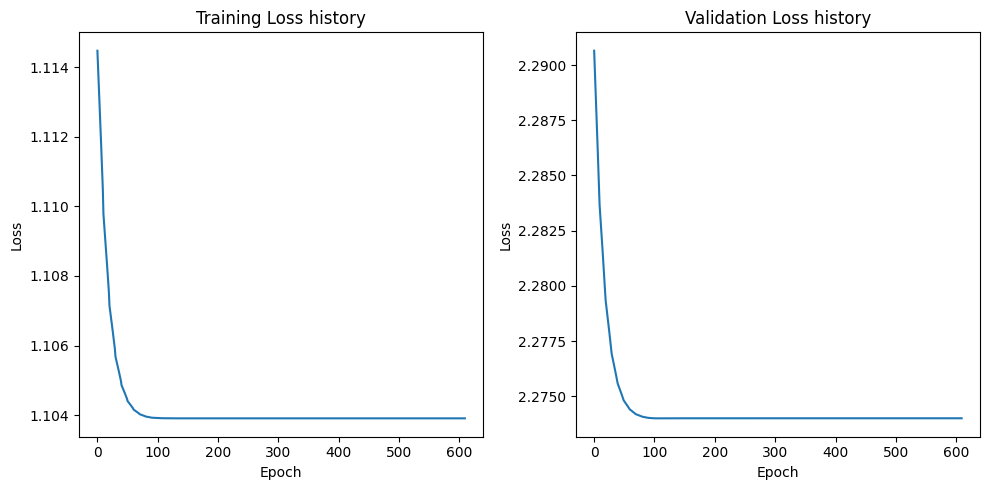

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2605, Train Loss: 793.9202001953125, Validation Loss: 778.3851579938616
Epoch 101/2605, Train Loss: 1.1393657505512238, Validation Loss: 5.07207772561482
Epoch 201/2605, Train Loss: 1.0902821892499923, Validation Loss: 4.976224592753819
Epoch 301/2605, Train Loss: 1.0902324628829956, Validation Loss: 4.976130059787205
Epoch 401/2605, Train Loss: 1.0902324748039245, Validation Loss: 4.976130059787205
Epoch 501/2605, Train Loss: 1.0902324748039245, Validation Loss: 4.976130059787205
Epoch 601/2605, Train Loss: 1.0902324748039245, Validation Loss: 4.976130059787205
Epoch 701/2605, Train Loss: 1.0902324748039245, Validation Loss: 4.976130059787205
Early stopping triggered.


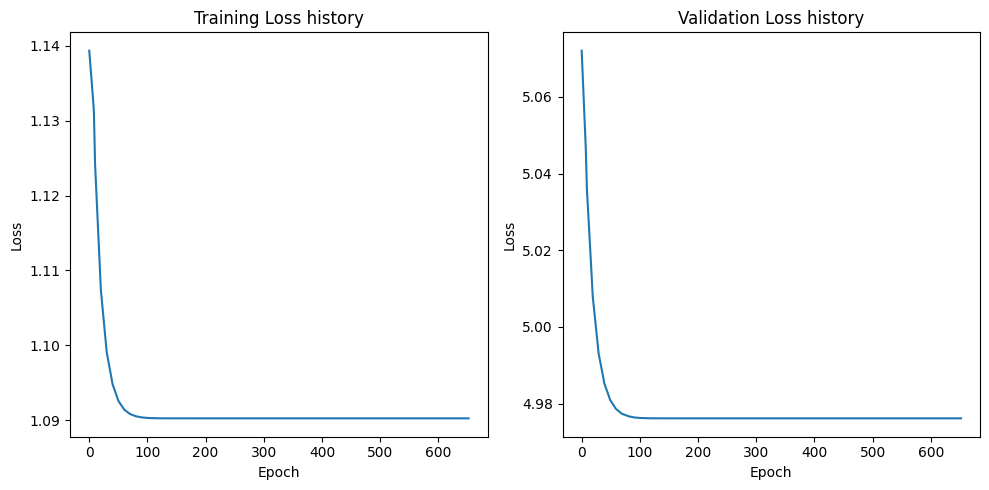

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2605, Train Loss: 82.21155700683593, Validation Loss: 143.59506852286202
Epoch 101/2605, Train Loss: 0.23706890493631363, Validation Loss: 0.5162931872265679
Epoch 201/2605, Train Loss: 0.23478782594203948, Validation Loss: 0.5116883260863168
Epoch 301/2605, Train Loss: 0.23478617370128632, Validation Loss: 0.5116849158491407
Epoch 401/2605, Train Loss: 0.23478617370128632, Validation Loss: 0.5116849158491407
Epoch 501/2605, Train Loss: 0.23478617370128632, Validation Loss: 0.5116849158491407
Epoch 601/2605, Train Loss: 0.23478617370128632, Validation Loss: 0.5116849158491407
Epoch 701/2605, Train Loss: 0.23478617370128632, Validation Loss: 0.5116849158491407
Early stopping triggered.


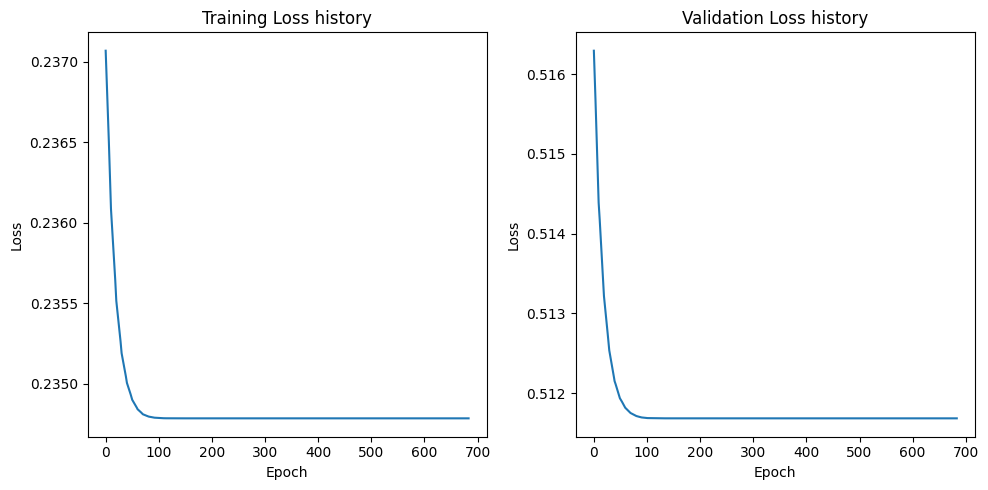

[I 2023-10-11 08:17:23,776] Trial 55 finished with value: 1.0142027139663696 and parameters: {'hidden_layers': 2, 'epochs': 2605, 'batch_size': 103, 'learning_rate': 0.07033867340049013}. Best is trial 55 with value: 1.0142027139663696.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2795, Train Loss: 893.5882651589134, Validation Loss: 674.8031616210938
Epoch 101/2795, Train Loss: 0.9478011375123804, Validation Loss: 2.618646194537481
Epoch 201/2795, Train Loss: 0.9251068918542429, Validation Loss: 2.5837533275286355
Epoch 301/2795, Train Loss: 0.9250974621285092, Validation Loss: 2.5837581853071847
Epoch 401/2795, Train Loss: 0.9250974621285092, Validation Loss: 2.5837581853071847
Epoch 501/2795, Train Loss: 0.9250974621285092, Validation Loss: 2.5837581853071847
Epoch 601/2795, Train Loss: 0.9250974621285092, Validation Loss: 2.5837581853071847
Epoch 701/2795, Train Loss: 0.9250974621285092, Validation Loss: 2.5837581853071847
Early stopping triggered.


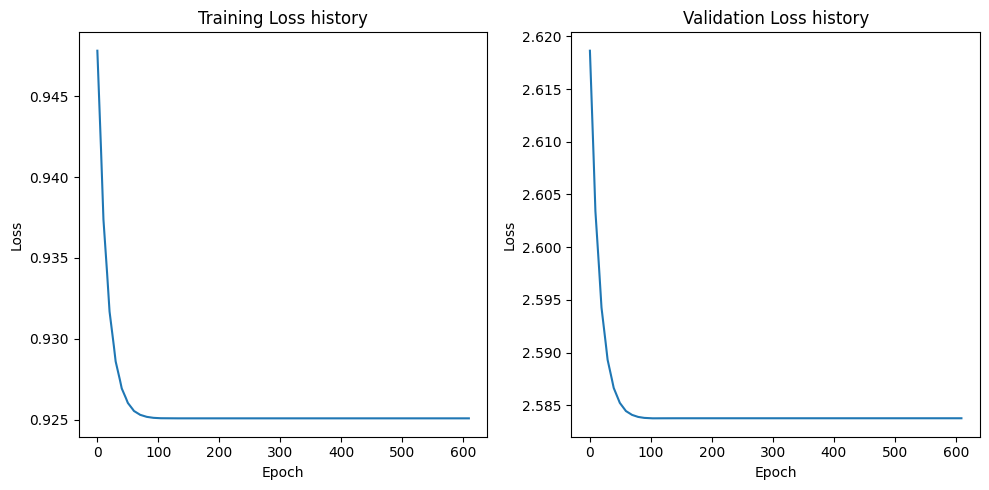

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2795, Train Loss: 1020.6600286310369, Validation Loss: 904.2304890950521
Epoch 101/2795, Train Loss: 2.944805482571775, Validation Loss: 9.201030445595583
Epoch 201/2795, Train Loss: 2.917313054203987, Validation Loss: 9.133798234164715
Epoch 301/2795, Train Loss: 2.9173064319924875, Validation Loss: 9.133786079784235
Epoch 401/2795, Train Loss: 2.9173064319924875, Validation Loss: 9.133786079784235
Epoch 501/2795, Train Loss: 2.9173064319924875, Validation Loss: 9.133786079784235
Epoch 601/2795, Train Loss: 2.9173064319924875, Validation Loss: 9.133786079784235
Epoch 701/2795, Train Loss: 2.9173064319924875, Validation Loss: 9.133786079784235
Early stopping triggered.


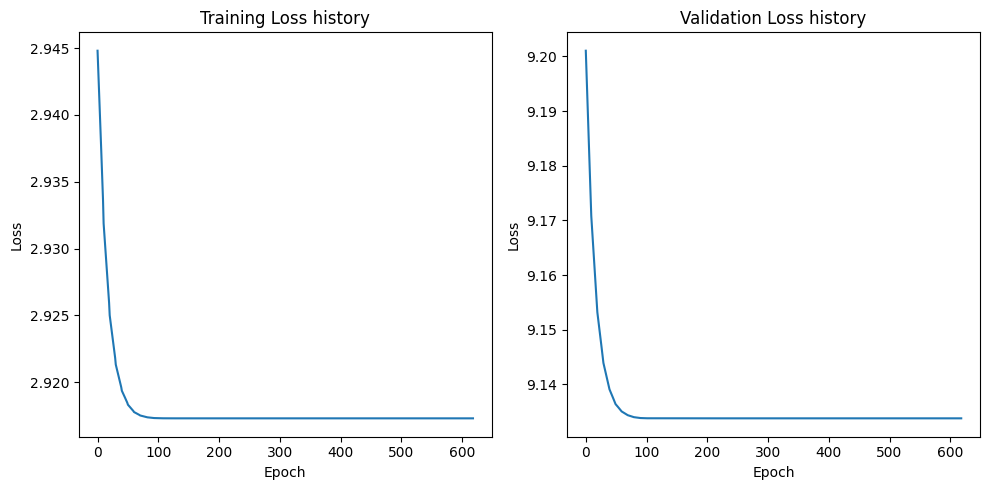

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2795, Train Loss: 126.30385277488016, Validation Loss: 115.17827796936035
Epoch 101/2795, Train Loss: 0.15884627317163078, Validation Loss: 0.4107658701638381
Epoch 201/2795, Train Loss: 0.15679190993647685, Validation Loss: 0.4084930196404457
Epoch 301/2795, Train Loss: 0.1567904854362661, Validation Loss: 0.40849210942784947
Epoch 401/2795, Train Loss: 0.1567904854362661, Validation Loss: 0.40849210942784947
Epoch 501/2795, Train Loss: 0.1567904854362661, Validation Loss: 0.40849210942784947
Epoch 601/2795, Train Loss: 0.1567904854362661, Validation Loss: 0.40849210942784947
Epoch 701/2795, Train Loss: 0.1567904854362661, Validation Loss: 0.40849210942784947
Early stopping triggered.


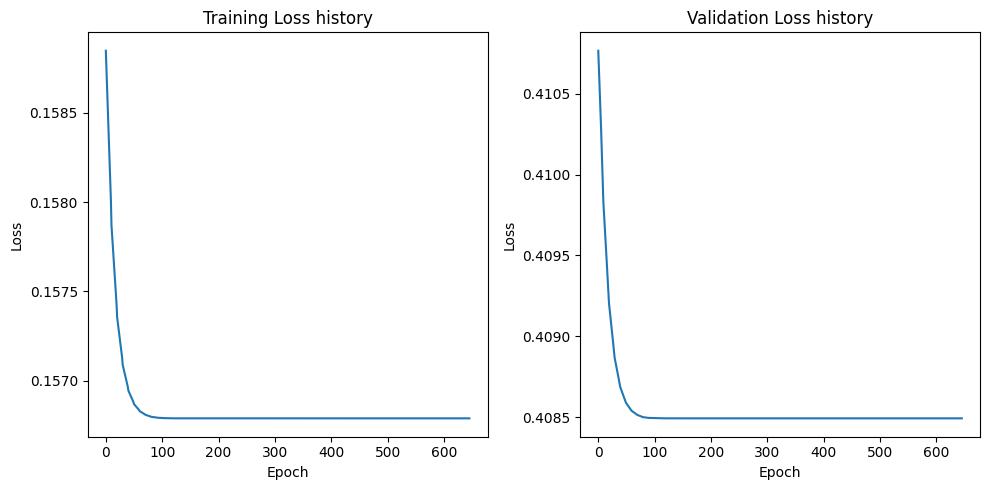

[I 2023-10-11 08:18:55,201] Trial 56 finished with value: 1.2178782224655151 and parameters: {'hidden_layers': 2, 'epochs': 2795, 'batch_size': 114, 'learning_rate': 0.03290504203066408}. Best is trial 55 with value: 1.0142027139663696.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3314, Train Loss: 942.2541351318359, Validation Loss: 699.9386800130209
Epoch 101/3314, Train Loss: 1.9781631774579485, Validation Loss: 6.936065057913463
Epoch 201/3314, Train Loss: 1.9640758863339822, Validation Loss: 6.897922486066818
Epoch 301/3314, Train Loss: 1.9640703639015555, Validation Loss: 6.897912879784902
Epoch 401/3314, Train Loss: 1.9640703639015555, Validation Loss: 6.897912879784902
Epoch 501/3314, Train Loss: 1.9640703639015555, Validation Loss: 6.897912879784902
Epoch 601/3314, Train Loss: 1.9640703639015555, Validation Loss: 6.897912879784902
Epoch 701/3314, Train Loss: 1.9640703639015555, Validation Loss: 6.897912879784902
Early stopping triggered.


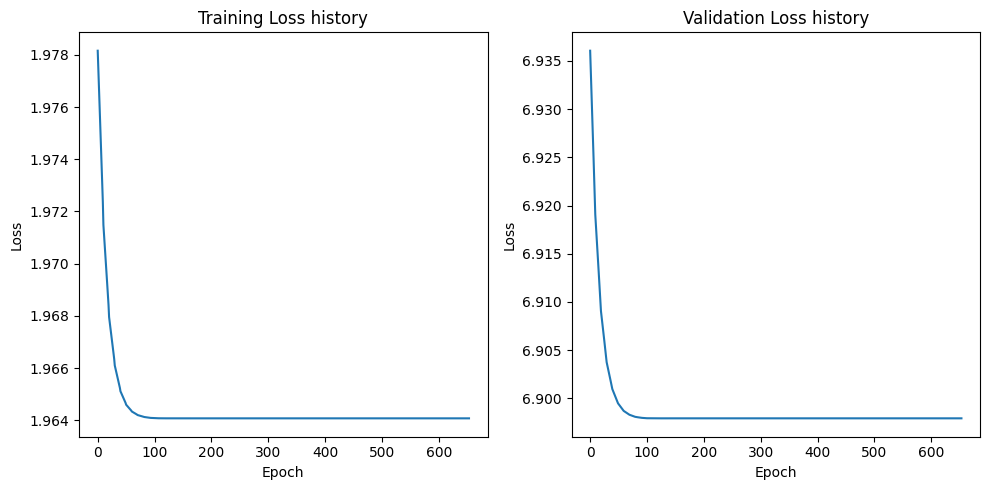

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3314, Train Loss: 1002.3198191324869, Validation Loss: 856.38525390625
Epoch 101/3314, Train Loss: 2.9353335897127786, Validation Loss: 7.740740060806274
Epoch 201/3314, Train Loss: 2.9043151636918387, Validation Loss: 7.686834812164307
Epoch 301/3314, Train Loss: 2.904302805662155, Validation Loss: 7.686806917190552
Epoch 401/3314, Train Loss: 2.904302805662155, Validation Loss: 7.686806917190552
Epoch 501/3314, Train Loss: 2.904302805662155, Validation Loss: 7.686806917190552
Epoch 601/3314, Train Loss: 2.904302805662155, Validation Loss: 7.686806917190552
Epoch 701/3314, Train Loss: 2.904302805662155, Validation Loss: 7.686806917190552
Early stopping triggered.


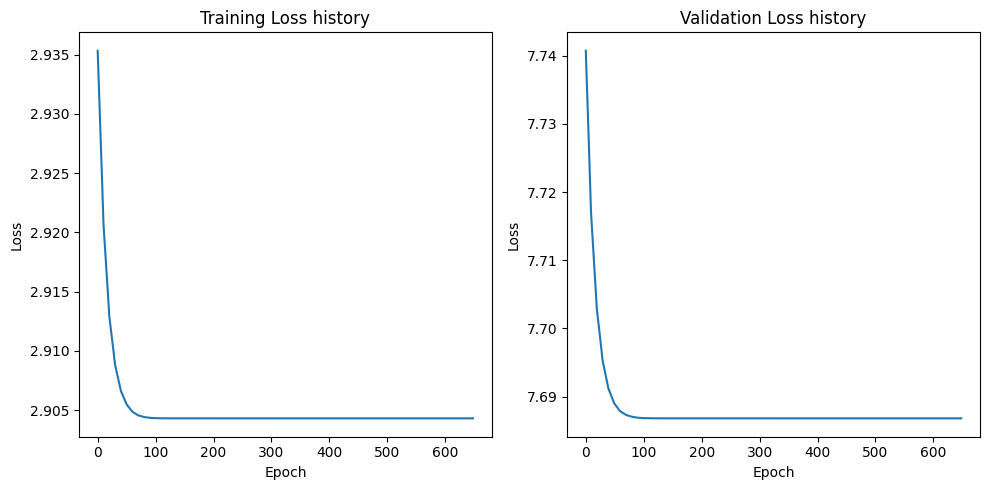

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3314, Train Loss: 79.31885846455891, Validation Loss: 299.79675038655597
Epoch 101/3314, Train Loss: 0.7367039943734804, Validation Loss: 1.280094603697459
Epoch 201/3314, Train Loss: 0.7285355975230535, Validation Loss: 1.2675090233484905
Epoch 301/3314, Train Loss: 0.7285323863228162, Validation Loss: 1.2675042351086934
Epoch 401/3314, Train Loss: 0.7285323863228162, Validation Loss: 1.2675042351086934
Epoch 501/3314, Train Loss: 0.7285323863228162, Validation Loss: 1.2675042351086934
Epoch 601/3314, Train Loss: 0.7285323863228162, Validation Loss: 1.2675042351086934
Epoch 701/3314, Train Loss: 0.7285323863228162, Validation Loss: 1.2675042351086934
Early stopping triggered.


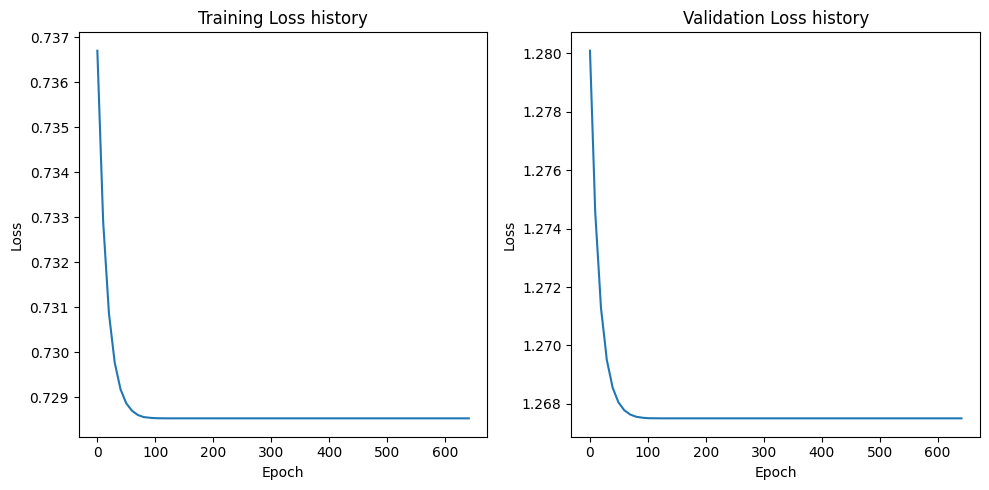

[I 2023-10-11 08:20:12,397] Trial 57 finished with value: 1.4439702033996582 and parameters: {'hidden_layers': 2, 'epochs': 3314, 'batch_size': 217, 'learning_rate': 0.09896410840041969}. Best is trial 55 with value: 1.0142027139663696.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3323, Train Loss: 676.1790551757813, Validation Loss: 1202.4420035226005
Epoch 101/3323, Train Loss: 1.0204329568147659, Validation Loss: 1.9435073733329773
Epoch 201/3323, Train Loss: 0.9996853971481323, Validation Loss: 1.9364478630678994
Epoch 301/3323, Train Loss: 0.9996657752990723, Validation Loss: 1.936453253030777
Epoch 401/3323, Train Loss: 0.9996657752990723, Validation Loss: 1.936453253030777
Epoch 501/3323, Train Loss: 0.9996657752990723, Validation Loss: 1.936453253030777
Epoch 601/3323, Train Loss: 0.9996657752990723, Validation Loss: 1.936453253030777
Early stopping triggered.


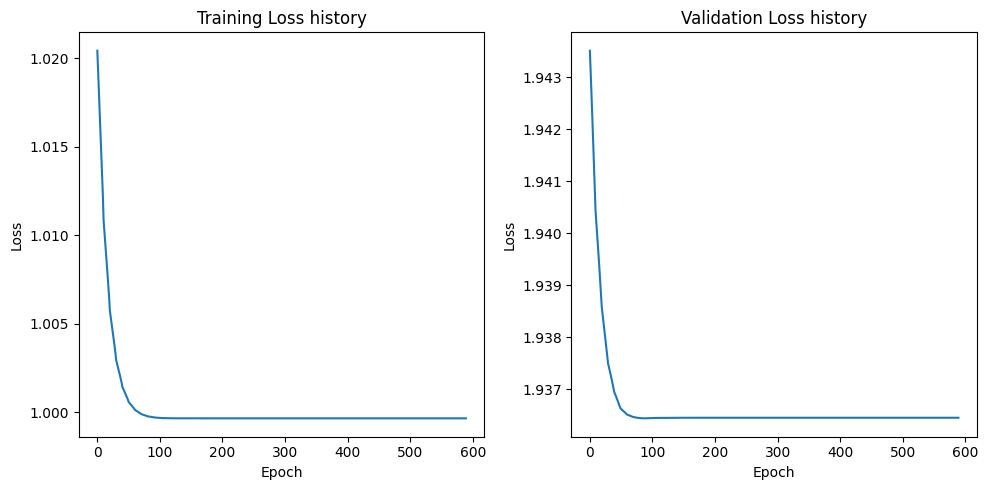

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3323, Train Loss: 658.6548291015625, Validation Loss: 1006.735129220145
Epoch 101/3323, Train Loss: 1.2971337604522706, Validation Loss: 3.2046998909541538
Epoch 201/3323, Train Loss: 1.2803866291046142, Validation Loss: 3.176836941923414
Epoch 301/3323, Train Loss: 1.280371696949005, Validation Loss: 3.1768217257090976
Epoch 401/3323, Train Loss: 1.28037171125412, Validation Loss: 3.1768217257090976
Epoch 501/3323, Train Loss: 1.28037171125412, Validation Loss: 3.1768217257090976
Epoch 601/3323, Train Loss: 1.28037171125412, Validation Loss: 3.1768217257090976
Epoch 701/3323, Train Loss: 1.28037171125412, Validation Loss: 3.1768217257090976
Early stopping triggered.


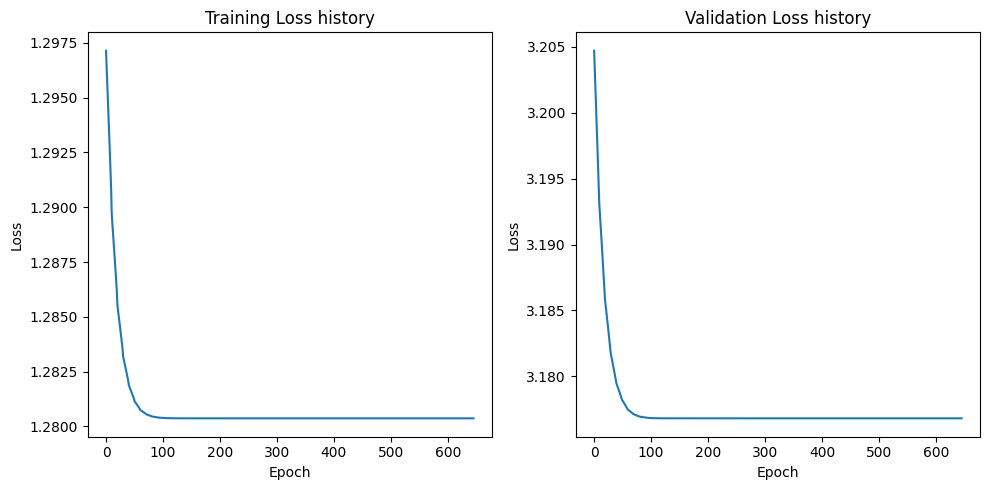

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3323, Train Loss: 65.64465698242188, Validation Loss: 231.66799926757812
Epoch 101/3323, Train Loss: 0.5614686983823777, Validation Loss: 1.4573361745902471
Epoch 201/3323, Train Loss: 0.557881852388382, Validation Loss: 1.4436619409493037
Epoch 301/3323, Train Loss: 0.5578786283731461, Validation Loss: 1.4436462138380324
Epoch 401/3323, Train Loss: 0.5578786283731461, Validation Loss: 1.4436462138380324
Epoch 501/3323, Train Loss: 0.5578786283731461, Validation Loss: 1.4436462138380324
Epoch 601/3323, Train Loss: 0.5578786283731461, Validation Loss: 1.4436462138380324
Epoch 701/3323, Train Loss: 0.5578786283731461, Validation Loss: 1.4436462138380324
Early stopping triggered.


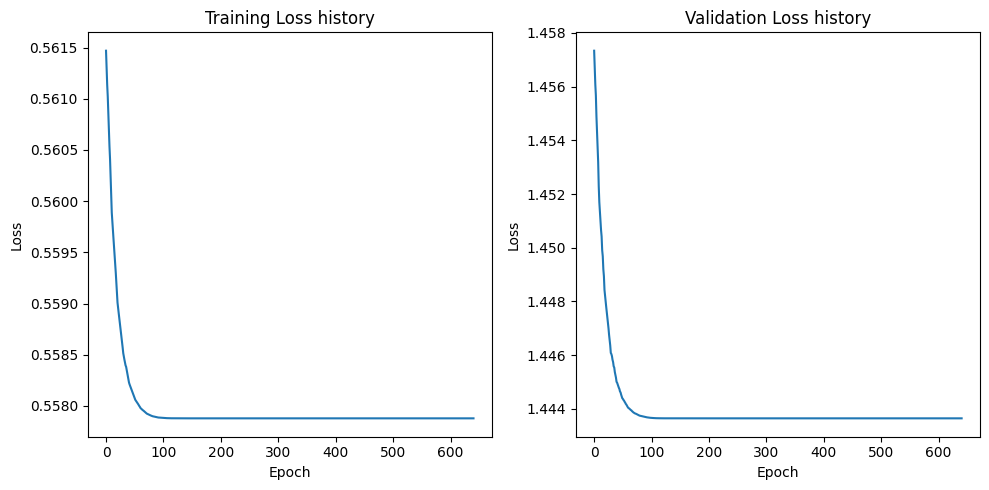

[I 2023-10-11 08:21:53,147] Trial 58 finished with value: 1.0370985269546509 and parameters: {'hidden_layers': 2, 'epochs': 3323, 'batch_size': 103, 'learning_rate': 0.09163095456088997}. Best is trial 55 with value: 1.0142027139663696.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3274, Train Loss: 616.6961303710938, Validation Loss: 1089.4518737792969
Epoch 101/3274, Train Loss: 0.643336974978447, Validation Loss: 3.2822092223380293
Epoch 201/3274, Train Loss: 0.6319487933814526, Validation Loss: 3.2613159120082855
Epoch 301/3274, Train Loss: 0.631936596930027, Validation Loss: 3.2613039293459485
Epoch 401/3274, Train Loss: 0.631936596930027, Validation Loss: 3.2613039293459485
Epoch 501/3274, Train Loss: 0.631936596930027, Validation Loss: 3.2613039293459485
Epoch 601/3274, Train Loss: 0.631936596930027, Validation Loss: 3.2613039293459485
Epoch 701/3274, Train Loss: 0.631936596930027, Validation Loss: 3.2613039293459485
Early stopping triggered.


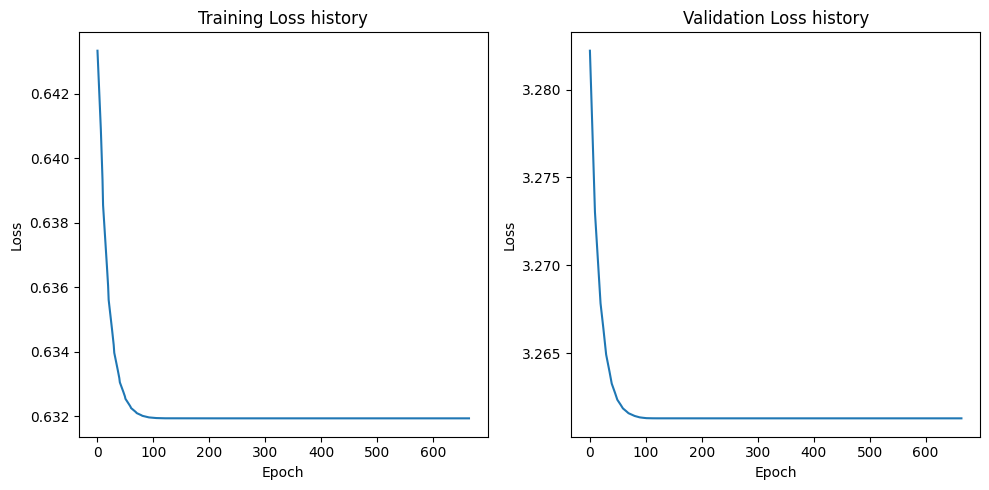

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3274, Train Loss: 716.5097509765625, Validation Loss: 1415.104989188058
Epoch 101/3274, Train Loss: 1.8843868723511696, Validation Loss: 4.6174647361040115
Epoch 201/3274, Train Loss: 1.8631727078557014, Validation Loss: 4.569526604243687
Epoch 301/3274, Train Loss: 1.863159614801407, Validation Loss: 4.569501632026264
Epoch 401/3274, Train Loss: 1.863159614801407, Validation Loss: 4.569501632026264
Epoch 501/3274, Train Loss: 1.863159614801407, Validation Loss: 4.569501632026264
Epoch 601/3274, Train Loss: 1.863159614801407, Validation Loss: 4.569501632026264
Epoch 701/3274, Train Loss: 1.863159614801407, Validation Loss: 4.569501632026264
Early stopping triggered.


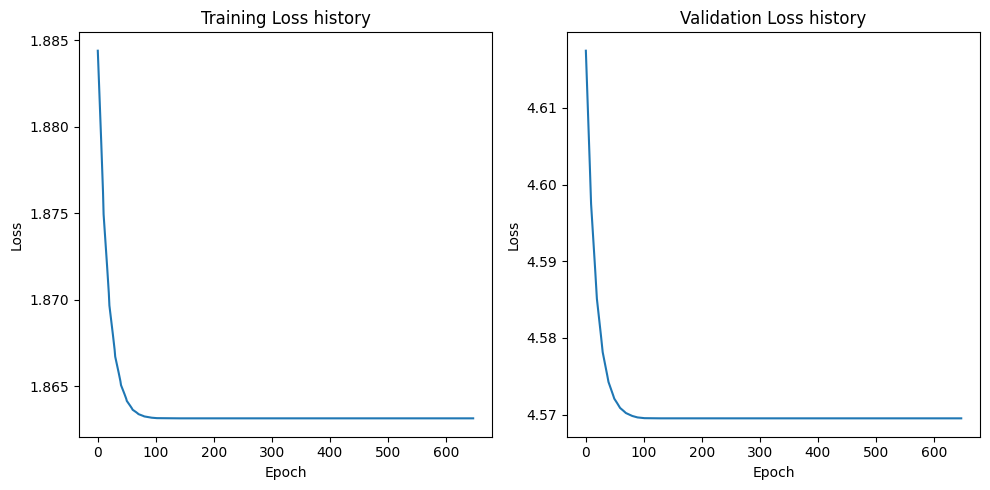

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3274, Train Loss: 63.67624252319336, Validation Loss: 338.2904941013881
Epoch 101/3274, Train Loss: 0.8289995002746582, Validation Loss: 2.152494183608464
Epoch 201/3274, Train Loss: 0.822116369009018, Validation Loss: 2.1335321409361705
Epoch 301/3274, Train Loss: 0.8221100938320159, Validation Loss: 2.1335086056164334
Epoch 401/3274, Train Loss: 0.8221100938320159, Validation Loss: 2.1335086056164334
Epoch 501/3274, Train Loss: 0.8221100938320159, Validation Loss: 2.1335086056164334
Epoch 601/3274, Train Loss: 0.8221100938320159, Validation Loss: 2.1335086056164334
Epoch 701/3274, Train Loss: 0.8221100938320159, Validation Loss: 2.1335086056164334
Early stopping triggered.


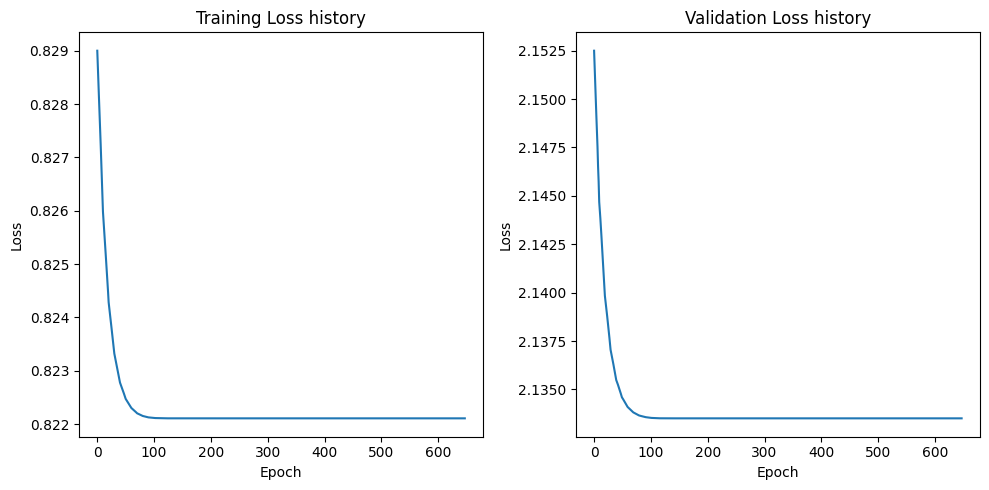

[I 2023-10-11 08:23:34,817] Trial 59 finished with value: 1.102170467376709 and parameters: {'hidden_layers': 2, 'epochs': 3274, 'batch_size': 100, 'learning_rate': 0.09928653795848881}. Best is trial 55 with value: 1.0142027139663696.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3317, Train Loss: 953.6346923828125, Validation Loss: 829.5005187988281
Epoch 101/3317, Train Loss: 28.561643028259276, Validation Loss: 31.050204753875732
Epoch 201/3317, Train Loss: 28.3801061630249, Validation Loss: 30.889607906341553
Epoch 301/3317, Train Loss: 28.38004264831543, Validation Loss: 30.88952922821045
Epoch 401/3317, Train Loss: 28.38004264831543, Validation Loss: 30.88952922821045
Epoch 501/3317, Train Loss: 28.38004264831543, Validation Loss: 30.88952922821045
Epoch 601/3317, Train Loss: 28.38004264831543, Validation Loss: 30.88952922821045
Epoch 701/3317, Train Loss: 28.38004264831543, Validation Loss: 30.88952922821045
Early stopping triggered.


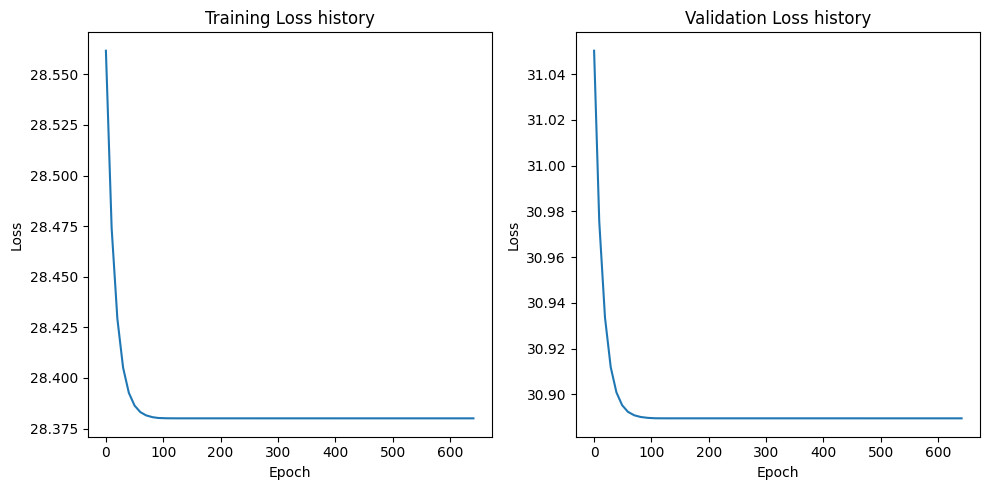

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3317, Train Loss: 959.503125, Validation Loss: 819.8424987792969
Epoch 101/3317, Train Loss: 19.61069393157959, Validation Loss: 26.374003887176514
Epoch 201/3317, Train Loss: 19.44618797302246, Validation Loss: 26.167842864990234
Epoch 301/3317, Train Loss: 19.446142387390136, Validation Loss: 26.167750358581543
Epoch 401/3317, Train Loss: 19.446142387390136, Validation Loss: 26.167750358581543
Epoch 501/3317, Train Loss: 19.446142387390136, Validation Loss: 26.167750358581543
Epoch 601/3317, Train Loss: 19.446142387390136, Validation Loss: 26.167750358581543
Epoch 701/3317, Train Loss: 19.446142387390136, Validation Loss: 26.167750358581543
Early stopping triggered.


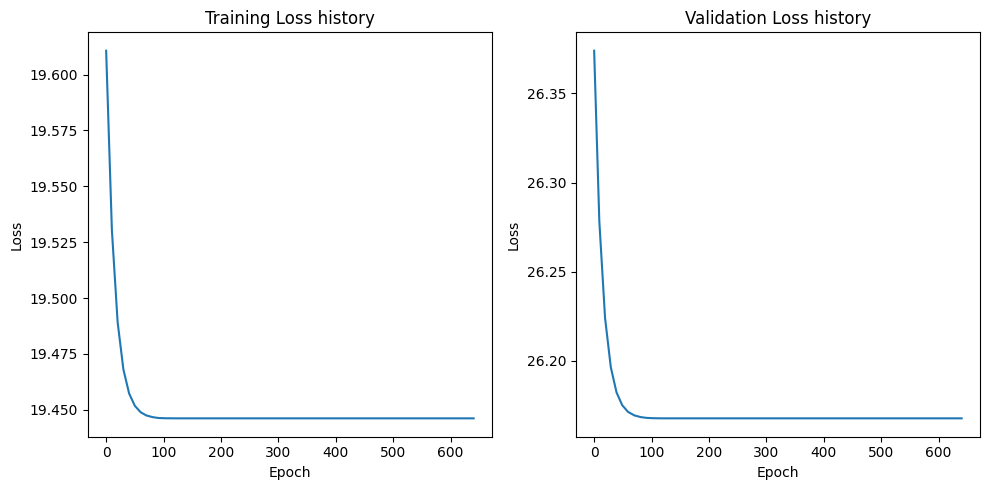

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3317, Train Loss: 141.9813995361328, Validation Loss: 125.65799331665039
Epoch 101/3317, Train Loss: 3.5515432238578795, Validation Loss: 4.808799564838409
Epoch 201/3317, Train Loss: 3.5330633997917174, Validation Loss: 4.789423763751984
Epoch 301/3317, Train Loss: 3.5330568671226503, Validation Loss: 4.789417564868927
Epoch 401/3317, Train Loss: 3.5330568671226503, Validation Loss: 4.789417564868927
Epoch 501/3317, Train Loss: 3.5330568671226503, Validation Loss: 4.789417564868927
Epoch 601/3317, Train Loss: 3.5330568671226503, Validation Loss: 4.789417564868927
Epoch 701/3317, Train Loss: 3.5330568671226503, Validation Loss: 4.789417564868927
Early stopping triggered.


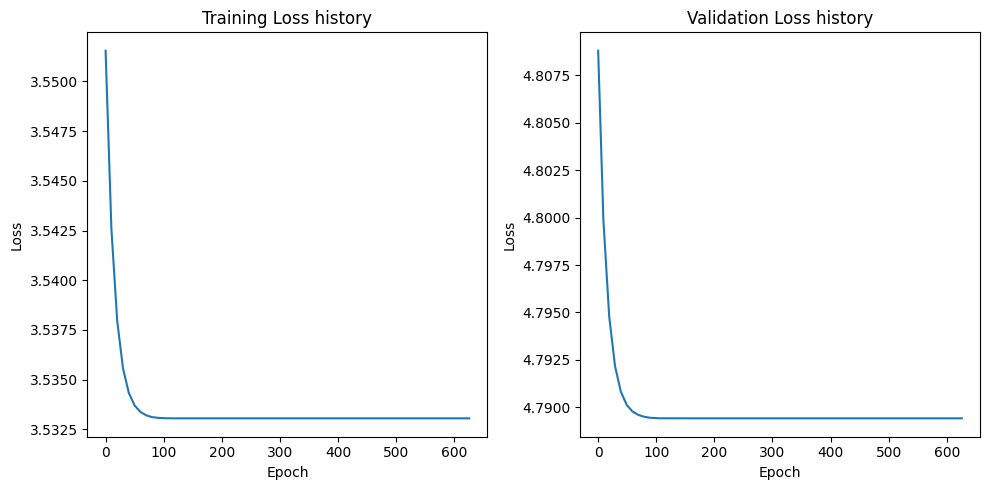

[I 2023-10-11 08:24:36,771] Trial 60 finished with value: 4.4438157081604 and parameters: {'hidden_layers': 2, 'epochs': 3317, 'batch_size': 612, 'learning_rate': 0.0928319675996088}. Best is trial 55 with value: 1.0142027139663696.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3137, Train Loss: 835.3235982259115, Validation Loss: 724.5338541666666
Epoch 101/3137, Train Loss: 1.2508140007654827, Validation Loss: 3.200934727986654
Epoch 201/3137, Train Loss: 1.2239492783943813, Validation Loss: 3.154118021329244
Epoch 301/3137, Train Loss: 1.2239402830600739, Validation Loss: 3.154104232788086
Epoch 401/3137, Train Loss: 1.2239402830600739, Validation Loss: 3.154104232788086
Epoch 501/3137, Train Loss: 1.2239402830600739, Validation Loss: 3.154104232788086
Epoch 601/3137, Train Loss: 1.2239402830600739, Validation Loss: 3.154104232788086
Epoch 701/3137, Train Loss: 1.2239402830600739, Validation Loss: 3.154104232788086
Early stopping triggered.


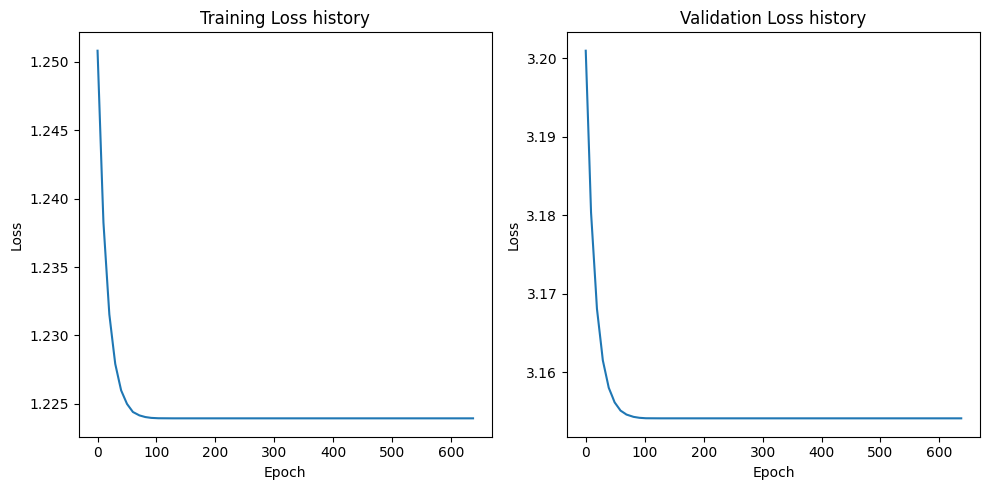

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3137, Train Loss: 896.2089691162109, Validation Loss: 609.7050577799479
Epoch 101/3137, Train Loss: 2.159549981355667, Validation Loss: 4.554770668347676
Epoch 201/3137, Train Loss: 2.133249908685684, Validation Loss: 4.507420897483826
Epoch 301/3137, Train Loss: 2.133235901594162, Validation Loss: 4.507405559221904
Epoch 401/3137, Train Loss: 2.133235901594162, Validation Loss: 4.507405559221904
Epoch 501/3137, Train Loss: 2.133235901594162, Validation Loss: 4.507405559221904
Epoch 601/3137, Train Loss: 2.133235901594162, Validation Loss: 4.507405559221904
Epoch 701/3137, Train Loss: 2.133235901594162, Validation Loss: 4.507405559221904
Early stopping triggered.


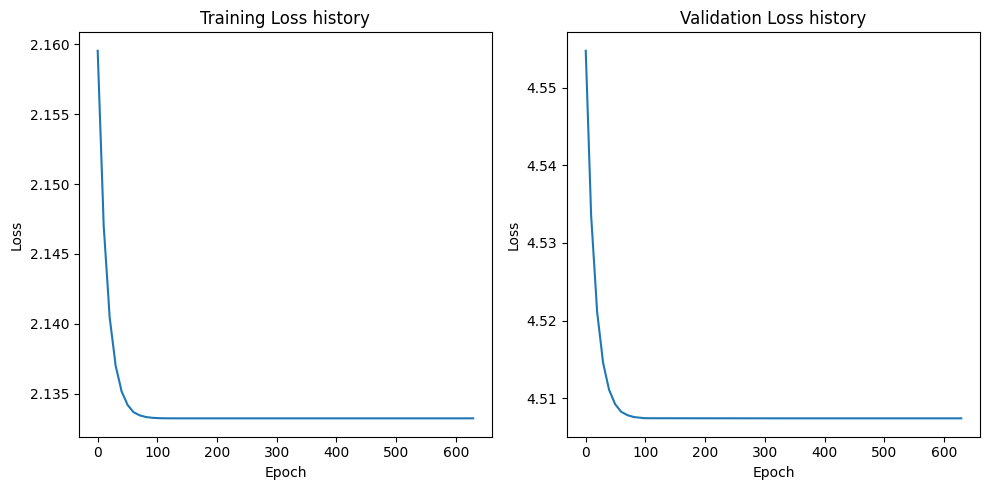

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3137, Train Loss: 107.58009847005208, Validation Loss: 222.18553415934244
Epoch 101/3137, Train Loss: 0.3763085672010978, Validation Loss: 0.636695608496666
Epoch 201/3137, Train Loss: 0.3734700505932172, Validation Loss: 0.6321630974610647
Epoch 301/3137, Train Loss: 0.3734691111991803, Validation Loss: 0.6321615328391393
Epoch 401/3137, Train Loss: 0.3734691111991803, Validation Loss: 0.6321615328391393
Epoch 501/3137, Train Loss: 0.3734691111991803, Validation Loss: 0.6321615328391393
Epoch 601/3137, Train Loss: 0.3734691111991803, Validation Loss: 0.6321615328391393
Epoch 701/3137, Train Loss: 0.3734691111991803, Validation Loss: 0.6321615328391393
Early stopping triggered.


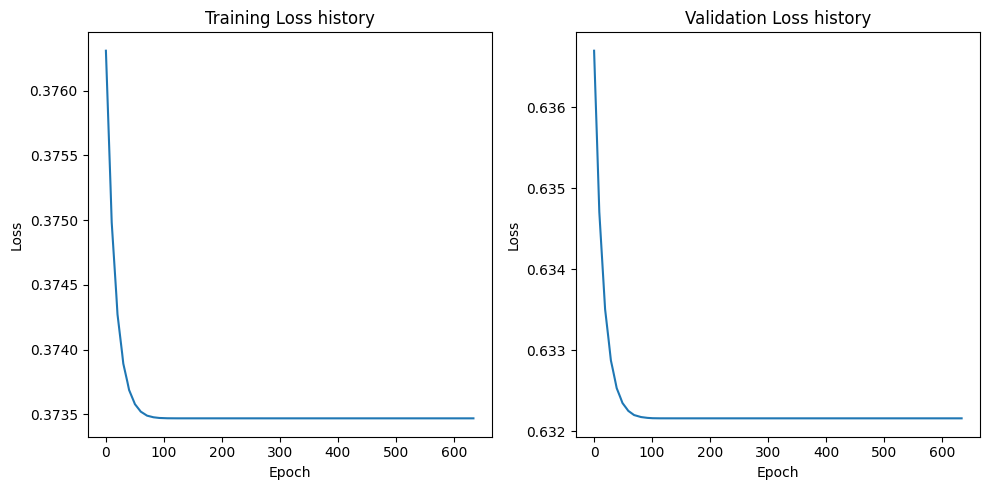

[I 2023-10-11 08:25:53,836] Trial 61 finished with value: 1.1617282629013062 and parameters: {'hidden_layers': 2, 'epochs': 3137, 'batch_size': 216, 'learning_rate': 0.09855430433020183}. Best is trial 55 with value: 1.0142027139663696.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3521, Train Loss: 838.810293344351, Validation Loss: 703.1070556640625
Epoch 101/3521, Train Loss: 0.7771781869232655, Validation Loss: 3.1100263465195894
Epoch 201/3521, Train Loss: 0.7633628060038273, Validation Loss: 3.0832274947315454
Epoch 301/3521, Train Loss: 0.7633559124974104, Validation Loss: 3.083219368942082
Epoch 401/3521, Train Loss: 0.7633559124974104, Validation Loss: 3.083219368942082
Epoch 501/3521, Train Loss: 0.7633559124974104, Validation Loss: 3.083219368942082
Epoch 601/3521, Train Loss: 0.7633559124974104, Validation Loss: 3.083219368942082
Epoch 701/3521, Train Loss: 0.7633559124974104, Validation Loss: 3.083219368942082
Early stopping triggered.


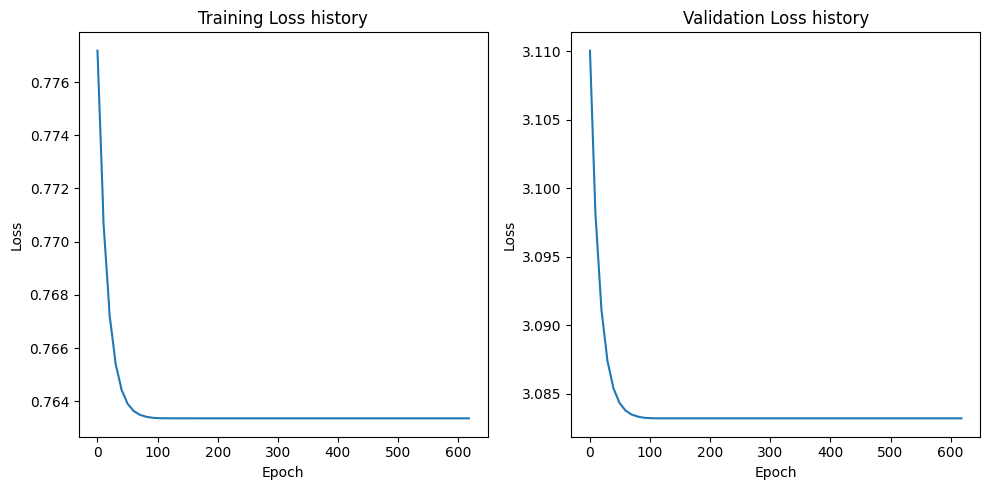

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3521, Train Loss: 829.7830012394832, Validation Loss: 692.1443634033203
Epoch 101/3521, Train Loss: 0.8955587034042065, Validation Loss: 3.6400126200169325
Epoch 201/3521, Train Loss: 0.8830355382882632, Validation Loss: 3.6145742312073708
Epoch 301/3521, Train Loss: 0.8830282900195855, Validation Loss: 3.6145642176270485
Epoch 401/3521, Train Loss: 0.8830282923120719, Validation Loss: 3.6145642176270485
Epoch 501/3521, Train Loss: 0.8830282923120719, Validation Loss: 3.6145642176270485
Epoch 601/3521, Train Loss: 0.8830282923120719, Validation Loss: 3.6145642176270485
Epoch 701/3521, Train Loss: 0.8830282923120719, Validation Loss: 3.6145642176270485
Early stopping triggered.


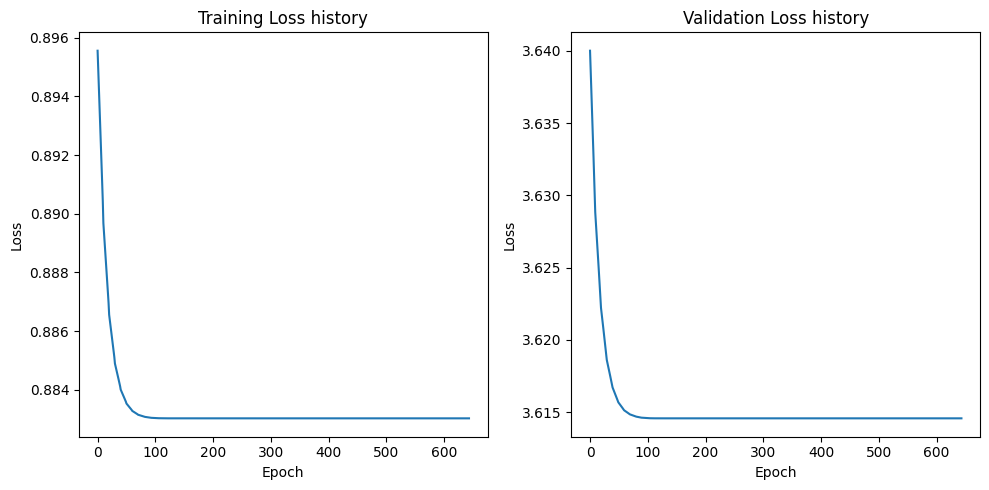

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3521, Train Loss: 91.00005017794095, Validation Loss: 108.07422065734863
Epoch 101/3521, Train Loss: 0.20946397059238875, Validation Loss: 0.31441623717546463
Epoch 201/3521, Train Loss: 0.20776978135108948, Validation Loss: 0.3116093948483467
Epoch 301/3521, Train Loss: 0.20776868095764747, Validation Loss: 0.3116087280213833
Epoch 401/3521, Train Loss: 0.20776868095764747, Validation Loss: 0.3116087280213833
Epoch 501/3521, Train Loss: 0.20776868095764747, Validation Loss: 0.3116087280213833
Epoch 601/3521, Train Loss: 0.20776868095764747, Validation Loss: 0.3116087280213833
Epoch 701/3521, Train Loss: 0.20776868095764747, Validation Loss: 0.3116087280213833
Early stopping triggered.


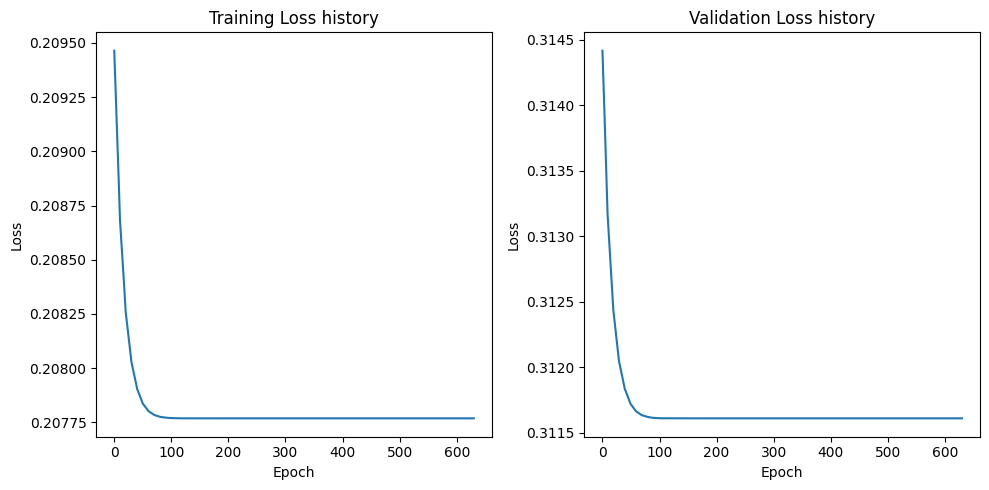

[I 2023-10-11 08:27:11,015] Trial 62 finished with value: 0.9090738892555237 and parameters: {'hidden_layers': 2, 'epochs': 3521, 'batch_size': 204, 'learning_rate': 0.09249769543017049}. Best is trial 62 with value: 0.9090738892555237.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3460, Train Loss: 823.8531298828125, Validation Loss: 591.2255946568081
Epoch 101/3460, Train Loss: 0.38356456875801087, Validation Loss: 4.10642129608563
Epoch 201/3460, Train Loss: 0.3747490753978491, Validation Loss: 4.0739623712641855
Epoch 301/3460, Train Loss: 0.3747448109835386, Validation Loss: 4.073949929858957
Epoch 401/3460, Train Loss: 0.3747448109835386, Validation Loss: 4.073949929858957
Epoch 501/3460, Train Loss: 0.3747448109835386, Validation Loss: 4.073949929858957
Epoch 601/3460, Train Loss: 0.3747448109835386, Validation Loss: 4.073949929858957
Epoch 701/3460, Train Loss: 0.3747448109835386, Validation Loss: 4.073949929858957
Early stopping triggered.


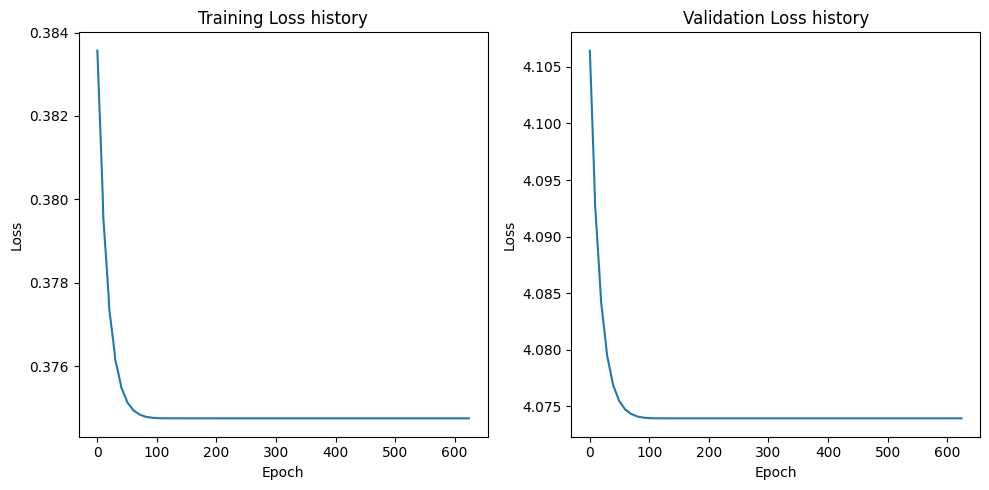

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3460, Train Loss: 991.4092163085937, Validation Loss: 911.2145472935268
Epoch 101/3460, Train Loss: 2.5199871253967285, Validation Loss: 5.42687007359096
Epoch 201/3460, Train Loss: 2.4837874698638918, Validation Loss: 5.367529698780605
Epoch 301/3460, Train Loss: 2.4837768411636354, Validation Loss: 5.367518220629011
Epoch 401/3460, Train Loss: 2.4837768411636354, Validation Loss: 5.367518220629011
Epoch 501/3460, Train Loss: 2.4837768411636354, Validation Loss: 5.367518220629011
Epoch 601/3460, Train Loss: 2.4837768411636354, Validation Loss: 5.367518220629011
Epoch 701/3460, Train Loss: 2.4837768411636354, Validation Loss: 5.367518220629011
Early stopping triggered.


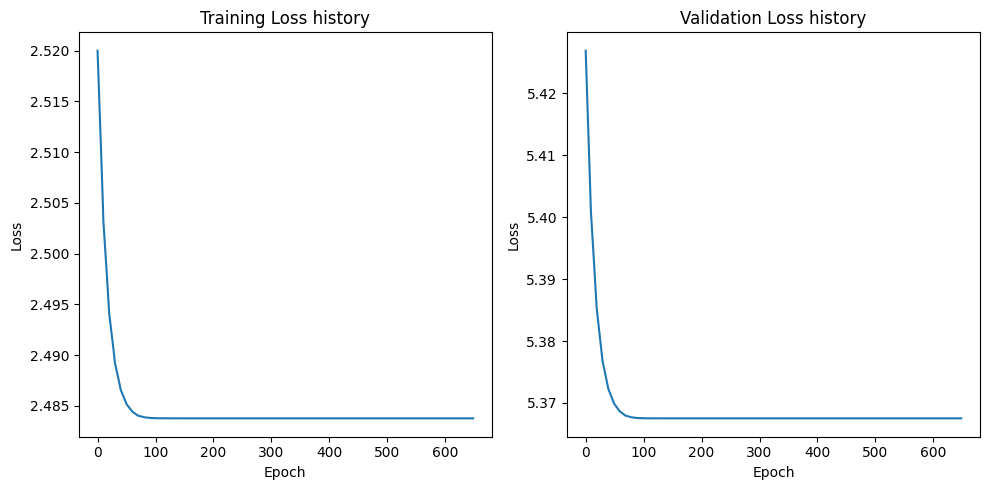

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3460, Train Loss: 126.01618255615234, Validation Loss: 97.99839128766742
Epoch 101/3460, Train Loss: 0.18491723626852036, Validation Loss: 0.4638699921114104
Epoch 201/3460, Train Loss: 0.18317589700222014, Validation Loss: 0.460194821868624
Epoch 301/3460, Train Loss: 0.1831751745939255, Validation Loss: 0.4601919853261539
Epoch 401/3460, Train Loss: 0.1831751745939255, Validation Loss: 0.4601919853261539
Epoch 501/3460, Train Loss: 0.1831751745939255, Validation Loss: 0.4601919853261539
Epoch 601/3460, Train Loss: 0.1831751745939255, Validation Loss: 0.4601919853261539
Epoch 701/3460, Train Loss: 0.1831751745939255, Validation Loss: 0.4601919853261539
Early stopping triggered.


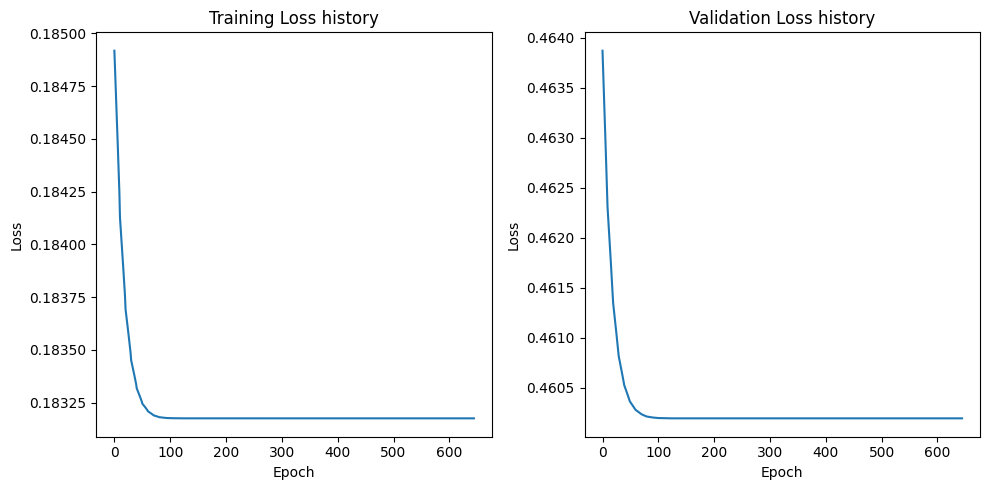

[I 2023-10-11 08:28:52,367] Trial 63 finished with value: 1.1460338830947876 and parameters: {'hidden_layers': 2, 'epochs': 3460, 'batch_size': 101, 'learning_rate': 0.0339976081341268}. Best is trial 62 with value: 0.9090738892555237.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3101, Train Loss: 1029.7035583496095, Validation Loss: 1039.468729654948
Epoch 101/3101, Train Loss: 170.0807632446289, Validation Loss: 210.90863037109375
Epoch 201/3101, Train Loss: 168.70589904785157, Validation Loss: 209.435791015625
Epoch 301/3101, Train Loss: 168.7055534362793, Validation Loss: 209.43546549479166
Epoch 401/3101, Train Loss: 168.7055534362793, Validation Loss: 209.43546549479166
Epoch 501/3101, Train Loss: 168.7055534362793, Validation Loss: 209.43546549479166
Epoch 601/3101, Train Loss: 168.7055534362793, Validation Loss: 209.43546549479166
Epoch 701/3101, Train Loss: 168.7055534362793, Validation Loss: 209.43546549479166
Early stopping triggered.


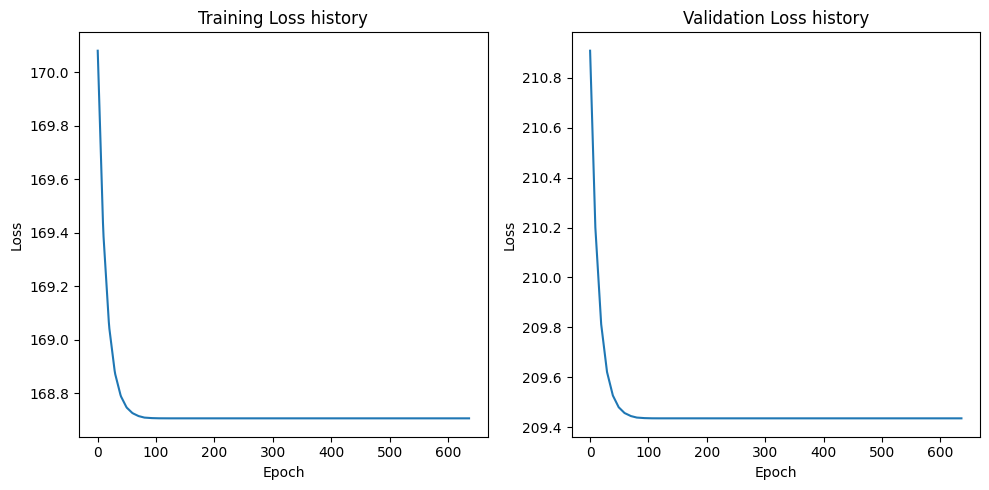

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3101, Train Loss: 1012.3221740722656, Validation Loss: 1021.0952758789062
Epoch 101/3101, Train Loss: 229.1195297241211, Validation Loss: 275.76024373372394
Epoch 201/3101, Train Loss: 228.43253021240236, Validation Loss: 274.99927775065106
Epoch 301/3101, Train Loss: 228.43245162963868, Validation Loss: 274.9991963704427
Epoch 401/3101, Train Loss: 228.43245162963868, Validation Loss: 274.9991963704427
Epoch 501/3101, Train Loss: 228.43245162963868, Validation Loss: 274.9991963704427
Epoch 601/3101, Train Loss: 228.43245162963868, Validation Loss: 274.9991963704427
Epoch 701/3101, Train Loss: 228.43245162963868, Validation Loss: 274.9991963704427
Early stopping triggered.


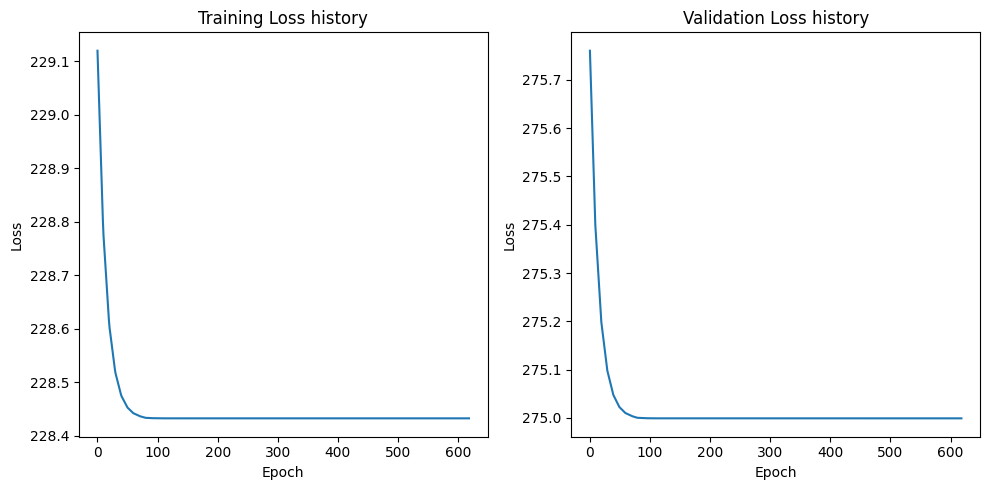

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3101, Train Loss: 109.48129425048828, Validation Loss: 99.15863037109375
Epoch 101/3101, Train Loss: 0.23285738453269006, Validation Loss: 0.22901135434707007
Epoch 201/3101, Train Loss: 0.22824673689901828, Validation Loss: 0.2284015379846096
Epoch 301/3101, Train Loss: 0.22824330143630506, Validation Loss: 0.228402196119229
Epoch 401/3101, Train Loss: 0.22824329994618892, Validation Loss: 0.228402196119229
Epoch 501/3101, Train Loss: 0.22824329994618892, Validation Loss: 0.228402196119229
Epoch 601/3101, Train Loss: 0.22824329994618892, Validation Loss: 0.228402196119229
Early stopping triggered.


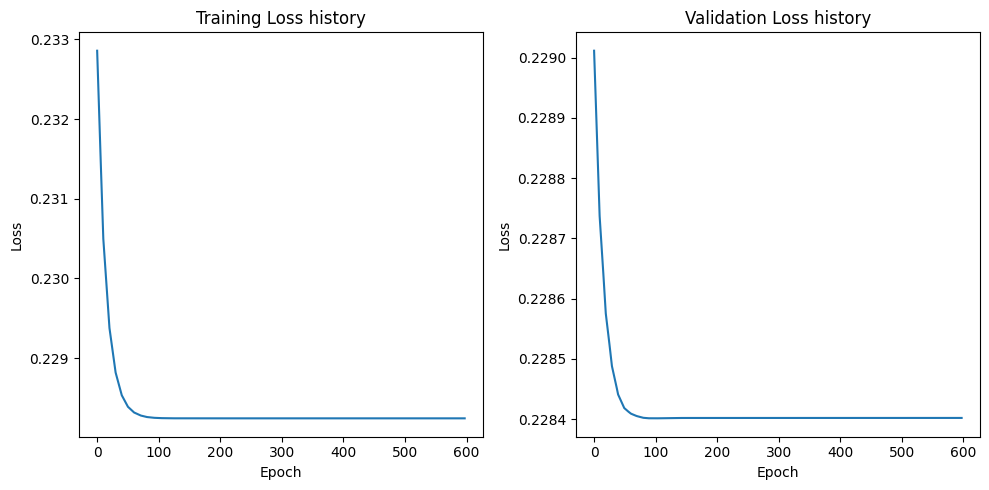

[I 2023-10-11 08:30:01,641] Trial 64 finished with value: 9.982266426086426 and parameters: {'hidden_layers': 1, 'epochs': 3101, 'batch_size': 252, 'learning_rate': 0.035244153781387975}. Best is trial 62 with value: 0.9090738892555237.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3585, Train Loss: 962.990732046274, Validation Loss: 843.9481811523438
Epoch 101/3585, Train Loss: 7.192573162225576, Validation Loss: 14.701364666223526
Epoch 201/3585, Train Loss: 7.071553037716792, Validation Loss: 14.485708832740784
Epoch 301/3585, Train Loss: 7.071526344005878, Validation Loss: 14.485652893781662
Epoch 401/3585, Train Loss: 7.071526344005878, Validation Loss: 14.485652893781662
Epoch 501/3585, Train Loss: 7.071526344005878, Validation Loss: 14.485652893781662
Epoch 601/3585, Train Loss: 7.071526344005878, Validation Loss: 14.485652893781662
Epoch 701/3585, Train Loss: 7.071526344005878, Validation Loss: 14.485652893781662
Early stopping triggered.


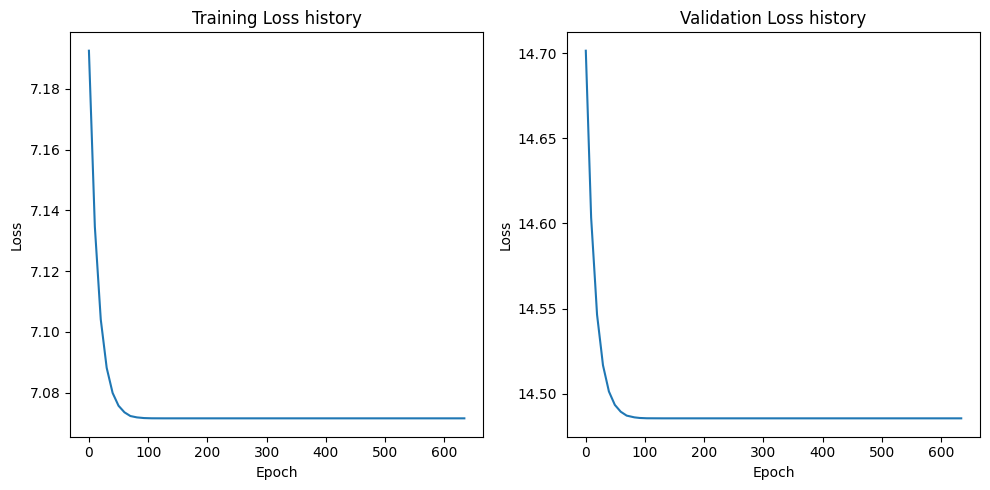

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3585, Train Loss: 1024.1188213641826, Validation Loss: 957.33447265625
Epoch 101/3585, Train Loss: 19.887958783369797, Validation Loss: 18.558207273483276
Epoch 201/3585, Train Loss: 19.647986815525936, Validation Loss: 18.314788475632668
Epoch 301/3585, Train Loss: 19.647914180388817, Validation Loss: 18.314714416861534
Epoch 401/3585, Train Loss: 19.647914180388817, Validation Loss: 18.314714416861534
Epoch 501/3585, Train Loss: 19.647914180388817, Validation Loss: 18.314714416861534
Epoch 601/3585, Train Loss: 19.647914180388817, Validation Loss: 18.314714416861534
Epoch 701/3585, Train Loss: 19.647914180388817, Validation Loss: 18.314714416861534
Early stopping triggered.


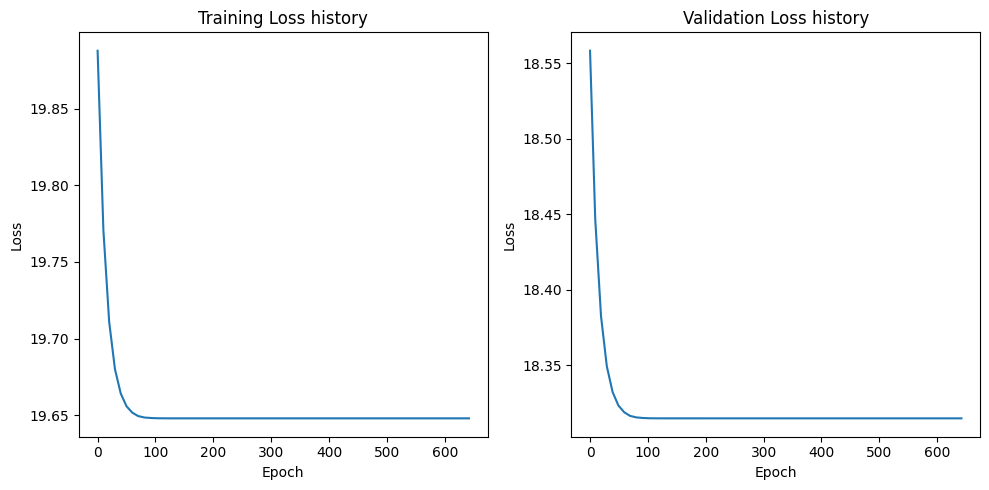

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3585, Train Loss: 114.03183981088492, Validation Loss: 91.21194648742676
Epoch 101/3585, Train Loss: 0.36703464503471667, Validation Loss: 0.7654685750603676
Epoch 201/3585, Train Loss: 0.3611125579247108, Validation Loss: 0.7562478668987751
Epoch 301/3585, Train Loss: 0.36111151255094087, Validation Loss: 0.7562456466257572
Epoch 401/3585, Train Loss: 0.36111151255094087, Validation Loss: 0.7562456466257572
Epoch 501/3585, Train Loss: 0.36111151255094087, Validation Loss: 0.7562456466257572
Epoch 601/3585, Train Loss: 0.36111151255094087, Validation Loss: 0.7562456466257572
Epoch 701/3585, Train Loss: 0.36111151255094087, Validation Loss: 0.7562456466257572
Early stopping triggered.


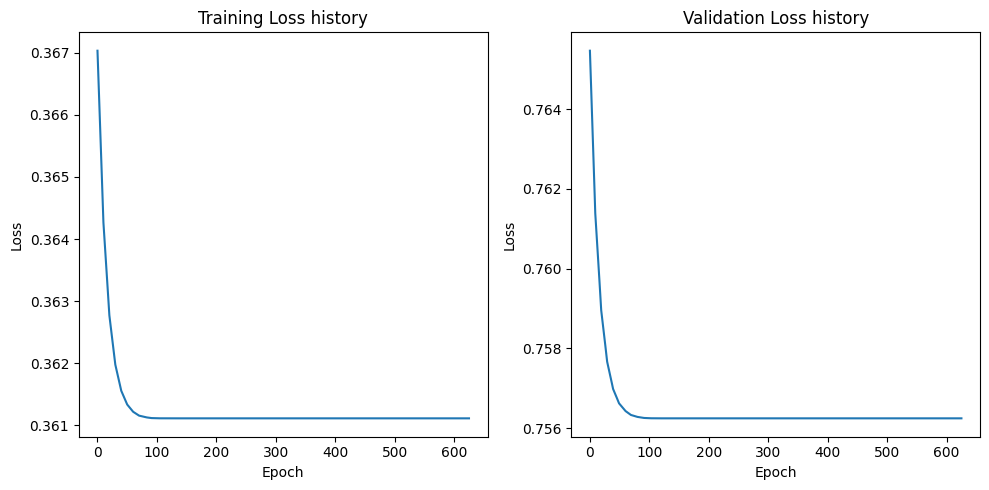

[I 2023-10-11 08:31:20,701] Trial 65 finished with value: 2.7859277725219727 and parameters: {'hidden_layers': 2, 'epochs': 3585, 'batch_size': 206, 'learning_rate': 0.0335095250180555}. Best is trial 62 with value: 0.9090738892555237.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3528, Train Loss: 951.6103434244792, Validation Loss: 848.5265808105469
Epoch 101/3528, Train Loss: 3.9002630074818927, Validation Loss: 9.205238938331604
Epoch 201/3528, Train Loss: 3.8522100925445555, Validation Loss: 9.12478095293045
Epoch 301/3528, Train Loss: 3.852193832397461, Validation Loss: 9.124762952327728
Epoch 401/3528, Train Loss: 3.852193832397461, Validation Loss: 9.124762952327728
Epoch 501/3528, Train Loss: 3.852193832397461, Validation Loss: 9.124762952327728
Epoch 601/3528, Train Loss: 3.852193832397461, Validation Loss: 9.124762952327728
Epoch 701/3528, Train Loss: 3.852193832397461, Validation Loss: 9.124762952327728
Early stopping triggered.


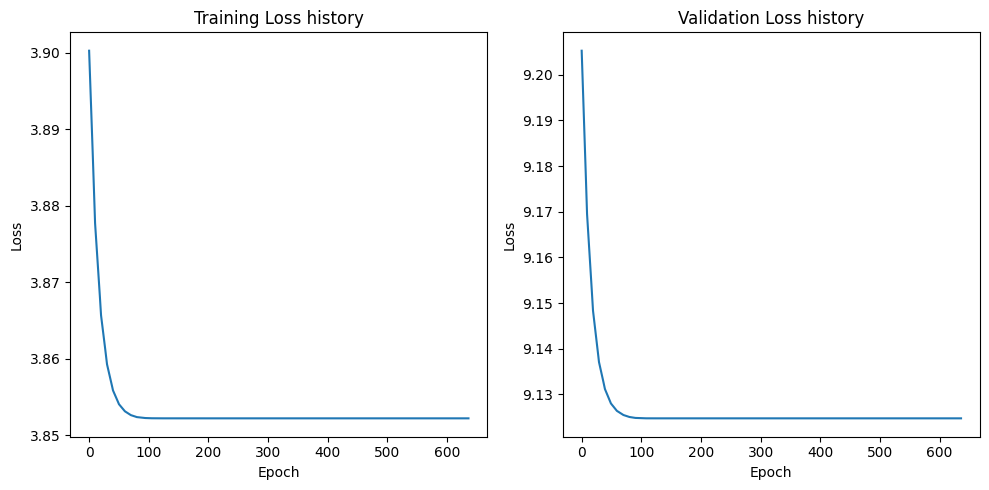

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3528, Train Loss: 834.3275838216146, Validation Loss: 761.9542083740234
Epoch 101/3528, Train Loss: 0.9154351850350698, Validation Loss: 1.9332277476787567
Epoch 201/3528, Train Loss: 0.9007425844669342, Validation Loss: 1.9095448404550552
Epoch 301/3528, Train Loss: 0.9007362763086955, Validation Loss: 1.9095370024442673
Epoch 401/3528, Train Loss: 0.9007362763086955, Validation Loss: 1.9095370024442673
Epoch 501/3528, Train Loss: 0.9007362763086955, Validation Loss: 1.9095370024442673
Epoch 601/3528, Train Loss: 0.9007362763086955, Validation Loss: 1.9095370024442673
Epoch 701/3528, Train Loss: 0.9007362763086955, Validation Loss: 1.9095370024442673
Early stopping triggered.


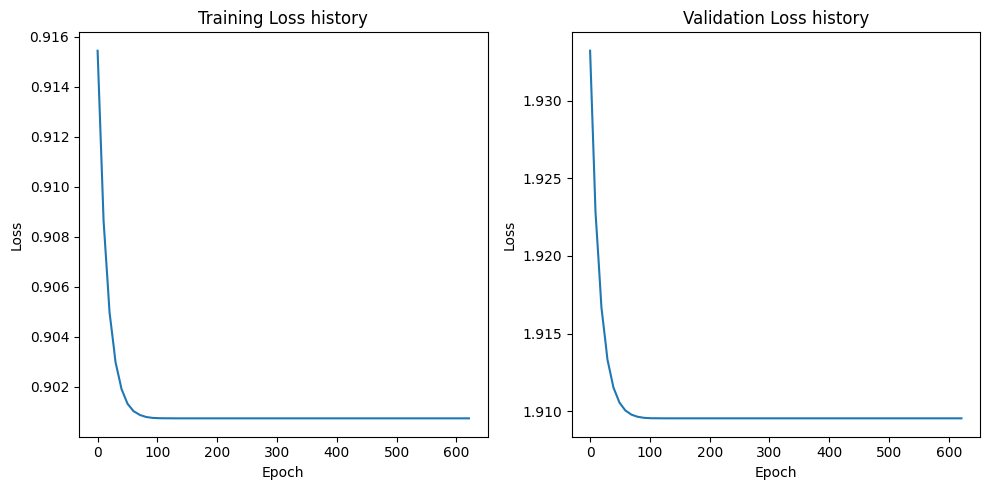

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3528, Train Loss: 80.42454096476237, Validation Loss: 211.34116744995117
Epoch 101/3528, Train Loss: 1.2800817251205445, Validation Loss: 2.4599764347076416
Epoch 201/3528, Train Loss: 1.2704779227574667, Validation Loss: 2.443312555551529
Epoch 301/3528, Train Loss: 1.2704747041066489, Validation Loss: 2.44330632686615
Epoch 401/3528, Train Loss: 1.2704747041066489, Validation Loss: 2.44330632686615
Epoch 501/3528, Train Loss: 1.2704747041066489, Validation Loss: 2.44330632686615
Epoch 601/3528, Train Loss: 1.2704747041066489, Validation Loss: 2.44330632686615
Epoch 701/3528, Train Loss: 1.2704747041066489, Validation Loss: 2.44330632686615
Early stopping triggered.


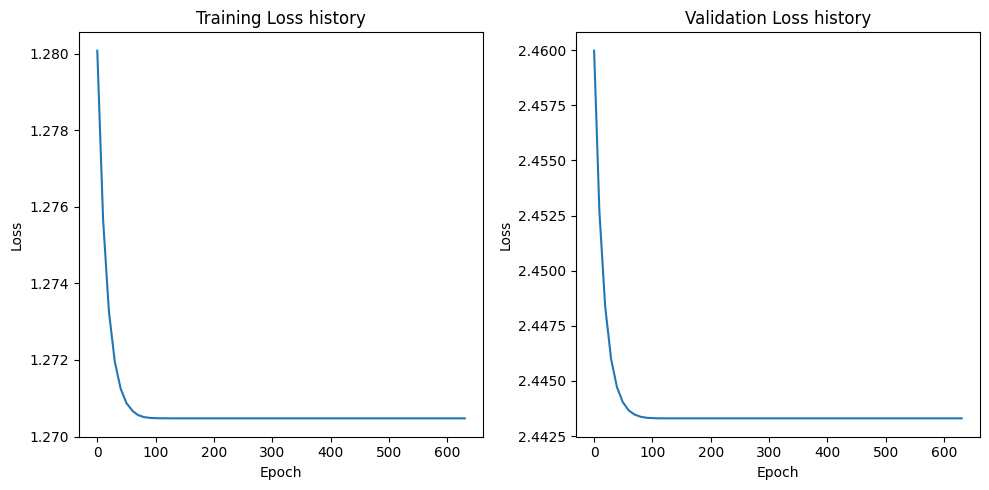

[I 2023-10-11 08:32:37,831] Trial 66 finished with value: 1.4396370649337769 and parameters: {'hidden_layers': 2, 'epochs': 3528, 'batch_size': 167, 'learning_rate': 0.07601194308561049}. Best is trial 62 with value: 0.9090738892555237.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3821, Train Loss: 966.8944373497596, Validation Loss: 892.9072570800781
Epoch 101/3821, Train Loss: 4.49929523238769, Validation Loss: 6.188238978385925
Epoch 201/3821, Train Loss: 4.353619429927606, Validation Loss: 6.027982883155346
Epoch 301/3821, Train Loss: 4.353522959810037, Validation Loss: 6.027853935956955
Epoch 401/3821, Train Loss: 4.353522959810037, Validation Loss: 6.027853935956955
Epoch 501/3821, Train Loss: 4.353522959810037, Validation Loss: 6.027853935956955
Epoch 601/3821, Train Loss: 4.353522959810037, Validation Loss: 6.027853935956955
Epoch 701/3821, Train Loss: 4.353522959810037, Validation Loss: 6.027853935956955
Early stopping triggered.


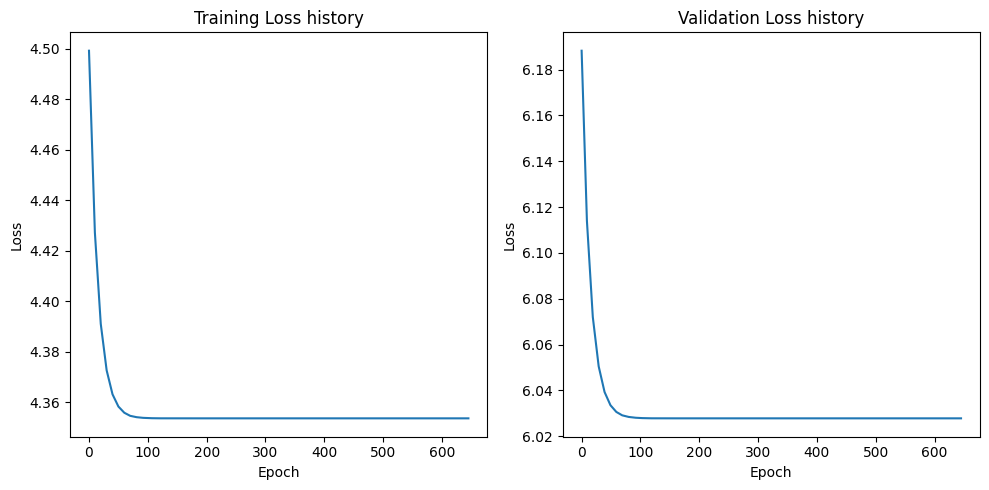

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3821, Train Loss: 957.904541015625, Validation Loss: 938.2388763427734
Epoch 101/3821, Train Loss: 469.16712482158954, Validation Loss: 473.0065612792969
Epoch 201/3821, Train Loss: 468.7752239520733, Validation Loss: 472.6227340698242
Epoch 301/3821, Train Loss: 468.7752239520733, Validation Loss: 472.6227340698242
Epoch 401/3821, Train Loss: 468.7752239520733, Validation Loss: 472.6227340698242
Epoch 501/3821, Train Loss: 468.7752239520733, Validation Loss: 472.6227340698242
Epoch 601/3821, Train Loss: 468.7752239520733, Validation Loss: 472.6227340698242
Early stopping triggered.


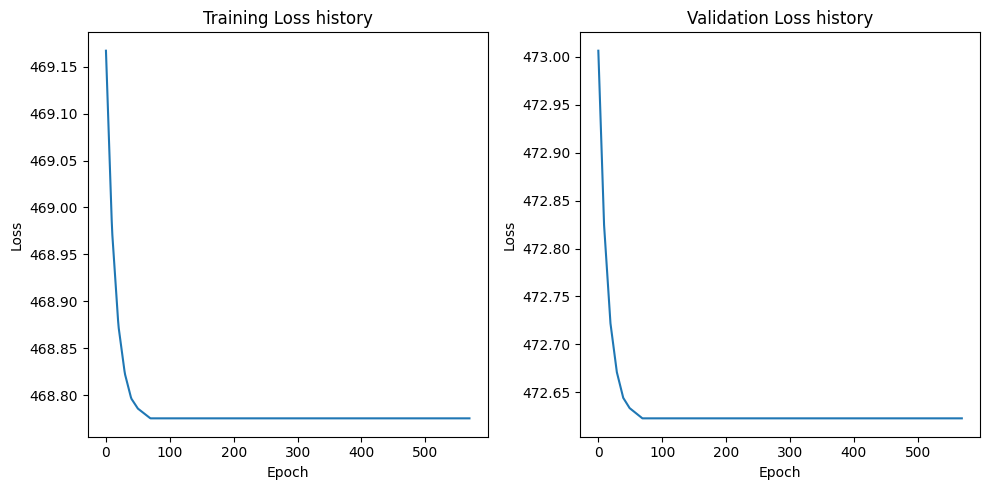

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3821, Train Loss: 129.88306338970477, Validation Loss: 115.39334297180176
Epoch 101/3821, Train Loss: 0.042571043595671654, Validation Loss: 0.05036862287670374
Epoch 201/3821, Train Loss: 0.042554848469220675, Validation Loss: 0.05034742597490549
Epoch 301/3821, Train Loss: 0.042554826833880864, Validation Loss: 0.050347414799034595
Epoch 401/3821, Train Loss: 0.042554826833880864, Validation Loss: 0.050347414799034595
Epoch 501/3821, Train Loss: 0.042554826833880864, Validation Loss: 0.050347414799034595
Epoch 601/3821, Train Loss: 0.042554826833880864, Validation Loss: 0.050347414799034595
Epoch 701/3821, Train Loss: 0.042554826833880864, Validation Loss: 0.050347414799034595
Early stopping triggered.


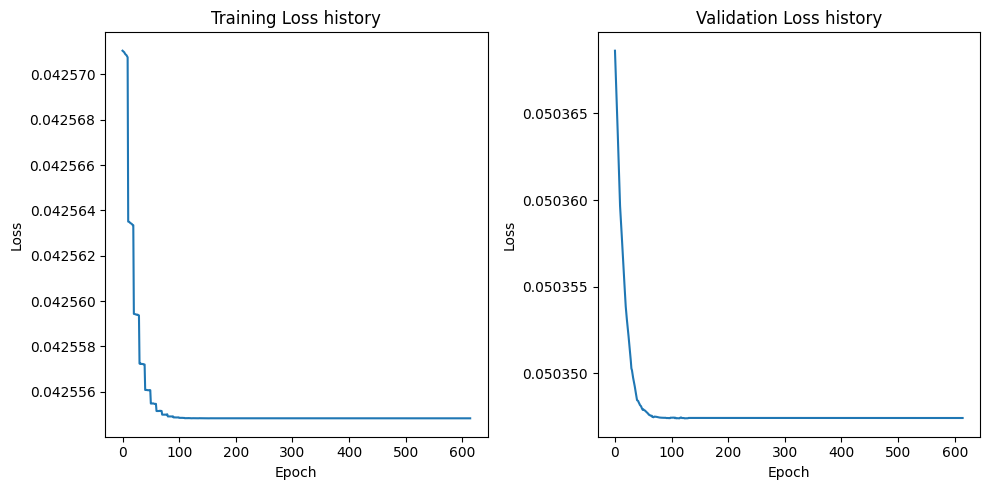

[I 2023-10-11 08:33:53,524] Trial 67 finished with value: 7.926141738891602 and parameters: {'hidden_layers': 1, 'epochs': 3821, 'batch_size': 206, 'learning_rate': 0.03850781887641419}. Best is trial 62 with value: 0.9090738892555237.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3400, Train Loss: 989.23953125, Validation Loss: 818.1754368373325
Epoch 101/3400, Train Loss: 2.335863158106804, Validation Loss: 6.928836019975798
Epoch 201/3400, Train Loss: 2.3088886004686358, Validation Loss: 6.875019556709698
Epoch 301/3400, Train Loss: 2.308880314826965, Validation Loss: 6.875005162187985
Epoch 401/3400, Train Loss: 2.308880314826965, Validation Loss: 6.875005162187985
Epoch 501/3400, Train Loss: 2.308880314826965, Validation Loss: 6.875005162187985
Epoch 601/3400, Train Loss: 2.308880314826965, Validation Loss: 6.875005162187985
Epoch 701/3400, Train Loss: 2.308880314826965, Validation Loss: 6.875005162187985
Early stopping triggered.


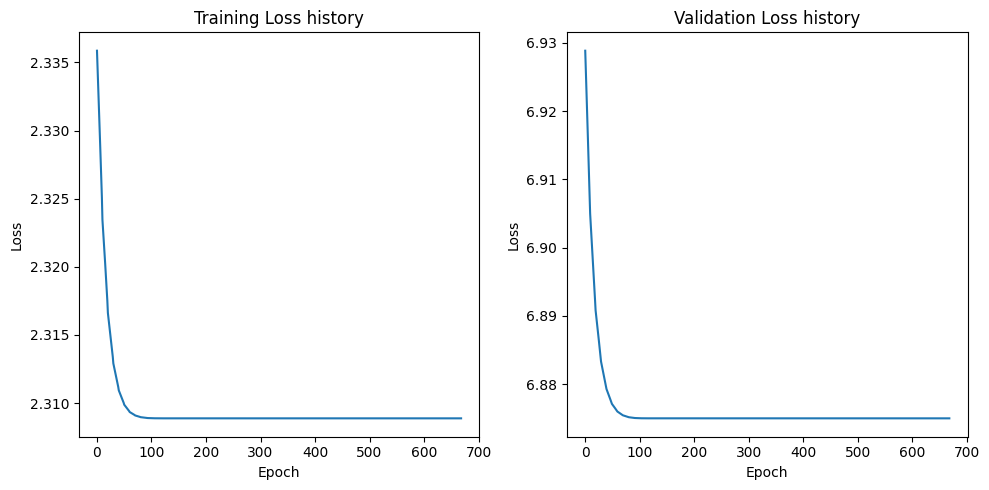

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3400, Train Loss: 985.1177270507812, Validation Loss: 862.7334594726562
Epoch 101/3400, Train Loss: 1.8111238384246826, Validation Loss: 4.090038520949228
Epoch 201/3400, Train Loss: 1.7766476774215698, Validation Loss: 4.027405210903713
Epoch 301/3400, Train Loss: 1.7766381549835204, Validation Loss: 4.027394328798566
Epoch 401/3400, Train Loss: 1.7766381549835204, Validation Loss: 4.027394328798566
Epoch 501/3400, Train Loss: 1.7766381549835204, Validation Loss: 4.027394328798566
Epoch 601/3400, Train Loss: 1.7766381549835204, Validation Loss: 4.027394328798566
Epoch 701/3400, Train Loss: 1.7766381549835204, Validation Loss: 4.027394328798566
Early stopping triggered.


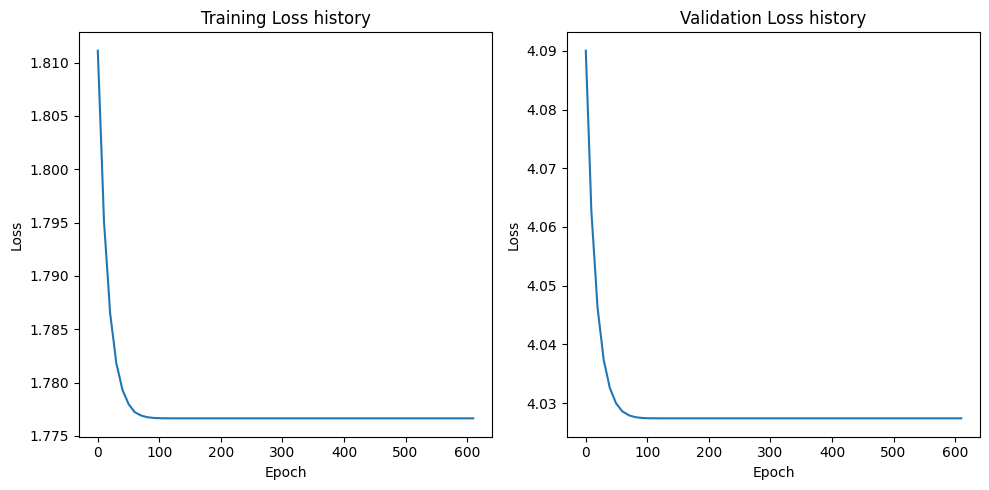

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3400, Train Loss: 112.44804397583007, Validation Loss: 86.67778996058873
Epoch 101/3400, Train Loss: 0.06734671533107757, Validation Loss: 0.31400164908596445
Epoch 201/3400, Train Loss: 0.06657282851636409, Validation Loss: 0.31149299229894367
Epoch 301/3400, Train Loss: 0.06657232731580734, Validation Loss: 0.31149158041392055
Epoch 401/3400, Train Loss: 0.06657232731580734, Validation Loss: 0.31149158041392055
Epoch 501/3400, Train Loss: 0.06657232731580734, Validation Loss: 0.31149158041392055
Epoch 601/3400, Train Loss: 0.06657232731580734, Validation Loss: 0.31149158041392055
Epoch 701/3400, Train Loss: 0.06657232731580734, Validation Loss: 0.31149158041392055
Early stopping triggered.


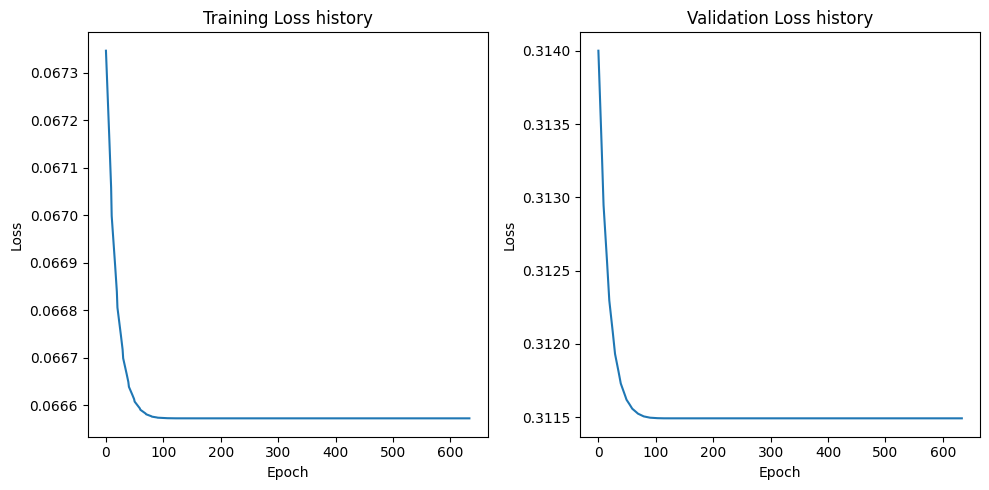

[I 2023-10-11 08:35:36,172] Trial 68 finished with value: 1.2641137838363647 and parameters: {'hidden_layers': 2, 'epochs': 3400, 'batch_size': 101, 'learning_rate': 0.026680732385367292}. Best is trial 62 with value: 0.9090738892555237.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3072, Train Loss: 855.3273658752441, Validation Loss: 757.3004760742188
Epoch 101/3072, Train Loss: 0.2696224953979254, Validation Loss: 3.360265066847205
Epoch 201/3072, Train Loss: 0.2636964723933488, Validation Loss: 3.3370877392590046
Epoch 301/3072, Train Loss: 0.2636945368722081, Validation Loss: 3.3370834328234196
Epoch 401/3072, Train Loss: 0.2636945368722081, Validation Loss: 3.3370834328234196
Epoch 501/3072, Train Loss: 0.2636945368722081, Validation Loss: 3.3370834328234196
Epoch 601/3072, Train Loss: 0.2636945368722081, Validation Loss: 3.3370834328234196
Epoch 701/3072, Train Loss: 0.2636945368722081, Validation Loss: 3.3370834328234196
Early stopping triggered.


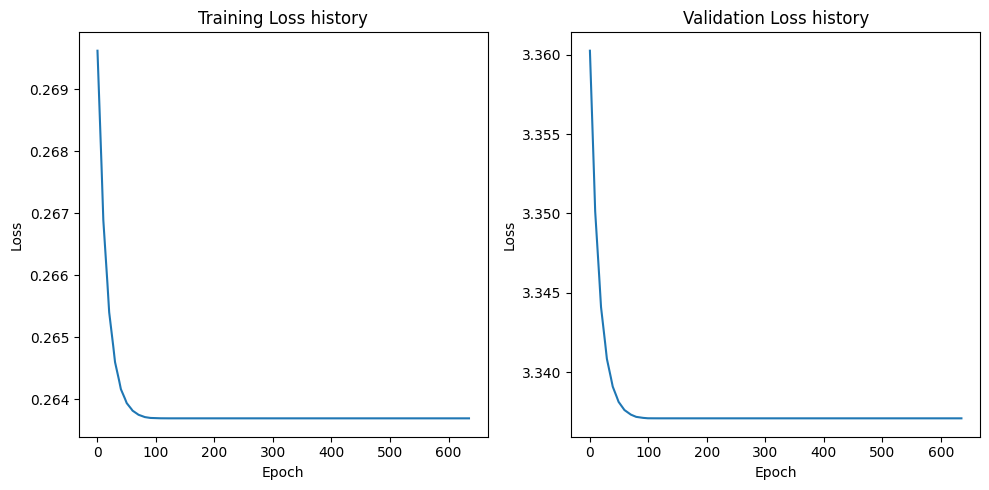

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3072, Train Loss: 808.7670555114746, Validation Loss: 618.3218994140625
Epoch 101/3072, Train Loss: 0.5565415117889643, Validation Loss: 2.5376677215099335
Epoch 201/3072, Train Loss: 0.5408556964248419, Validation Loss: 2.51311656832695
Epoch 301/3072, Train Loss: 0.5408504689112306, Validation Loss: 2.5131153017282486
Epoch 401/3072, Train Loss: 0.5408504689112306, Validation Loss: 2.5131153017282486
Epoch 501/3072, Train Loss: 0.5408504689112306, Validation Loss: 2.5131153017282486
Epoch 601/3072, Train Loss: 0.5408504689112306, Validation Loss: 2.5131153017282486
Epoch 701/3072, Train Loss: 0.5408504689112306, Validation Loss: 2.5131153017282486
Early stopping triggered.


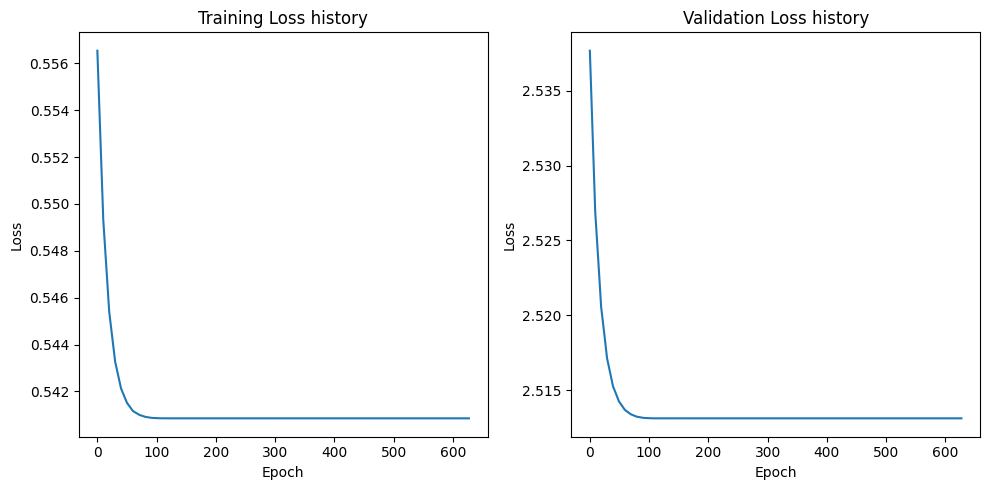

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3072, Train Loss: 84.98142528533936, Validation Loss: 260.72917461395264
Epoch 101/3072, Train Loss: 0.7733755856752396, Validation Loss: 1.5356007665395737
Epoch 201/3072, Train Loss: 0.7668938413262367, Validation Loss: 1.5211086720228195
Epoch 301/3072, Train Loss: 0.7668891176581383, Validation Loss: 1.5210959613323212
Epoch 401/3072, Train Loss: 0.7668891176581383, Validation Loss: 1.5210959613323212
Epoch 501/3072, Train Loss: 0.7668891176581383, Validation Loss: 1.5210959613323212
Epoch 601/3072, Train Loss: 0.7668891176581383, Validation Loss: 1.5210959613323212
Epoch 701/3072, Train Loss: 0.7668891176581383, Validation Loss: 1.5210959613323212
Early stopping triggered.


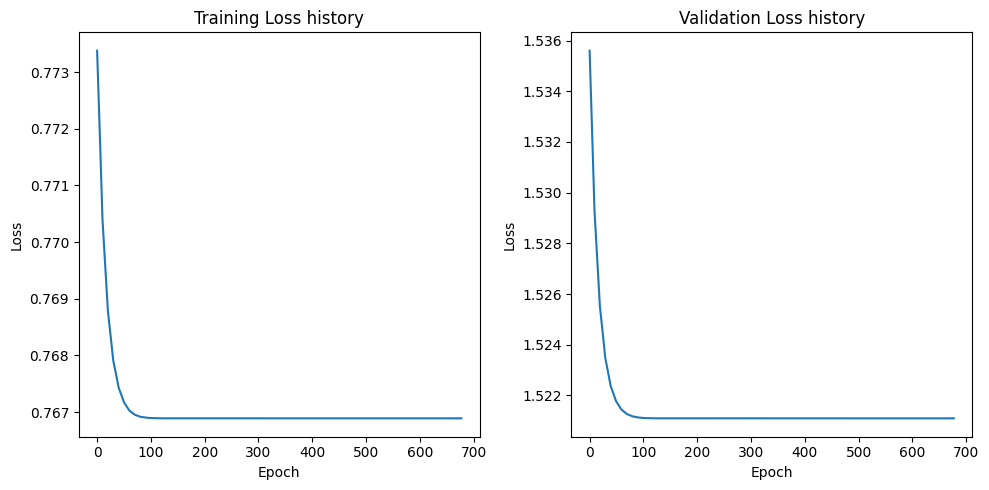

[I 2023-10-11 08:36:57,628] Trial 69 finished with value: 0.8195011019706726 and parameters: {'hidden_layers': 2, 'epochs': 3072, 'batch_size': 165, 'learning_rate': 0.07261394106303508}. Best is trial 69 with value: 0.8195011019706726.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3067, Train Loss: 981.1302054268973, Validation Loss: 814.0180358886719
Epoch 101/3067, Train Loss: 8.040711845670428, Validation Loss: 21.59717893600464
Epoch 201/3067, Train Loss: 7.957209518977574, Validation Loss: 21.45200490951538
Epoch 301/3067, Train Loss: 7.957181589944022, Validation Loss: 21.451961517333984
Epoch 401/3067, Train Loss: 7.957181589944022, Validation Loss: 21.451961517333984
Epoch 501/3067, Train Loss: 7.957181589944022, Validation Loss: 21.451961517333984
Epoch 601/3067, Train Loss: 7.957181589944022, Validation Loss: 21.451961517333984
Epoch 701/3067, Train Loss: 7.957181589944022, Validation Loss: 21.451961517333984
Early stopping triggered.


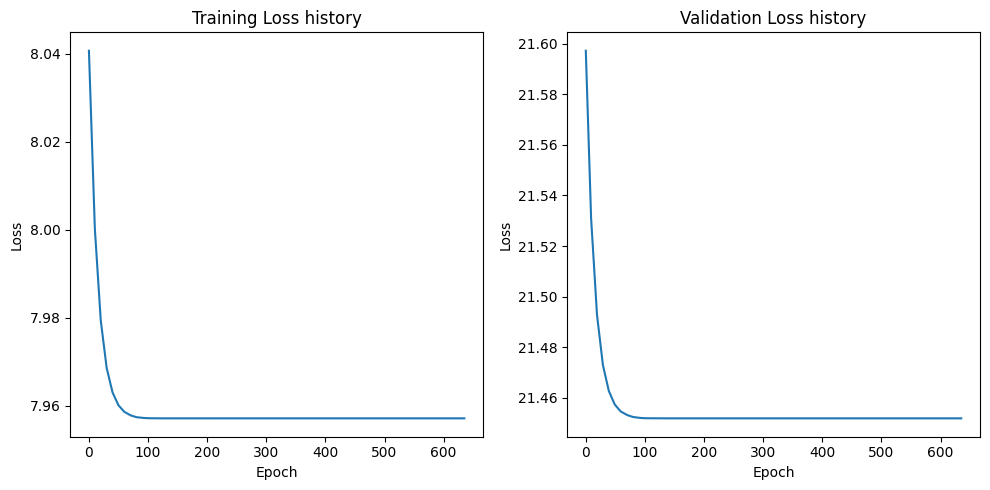

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3067, Train Loss: 926.0332554408482, Validation Loss: 810.7888488769531
Epoch 101/3067, Train Loss: 13.093388455254692, Validation Loss: 25.215548992156982
Epoch 201/3067, Train Loss: 12.919891493661064, Validation Loss: 24.931124687194824
Epoch 301/3067, Train Loss: 12.919831003461566, Validation Loss: 24.931018352508545
Epoch 401/3067, Train Loss: 12.919831003461566, Validation Loss: 24.931018352508545
Epoch 501/3067, Train Loss: 12.919831003461566, Validation Loss: 24.931018352508545
Epoch 601/3067, Train Loss: 12.919831003461566, Validation Loss: 24.931018352508545
Epoch 701/3067, Train Loss: 12.919831003461566, Validation Loss: 24.931018352508545
Early stopping triggered.


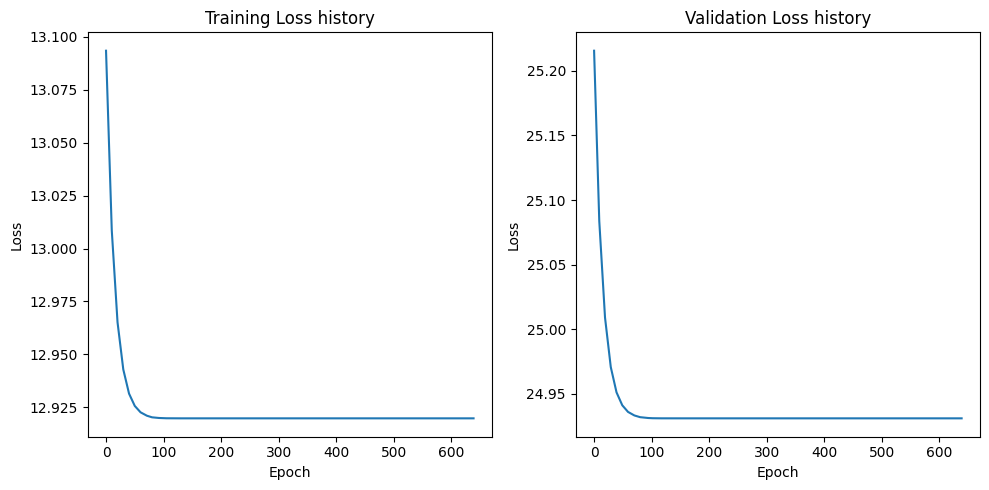

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3067, Train Loss: 112.01953778948102, Validation Loss: 108.04339218139648
Epoch 101/3067, Train Loss: 0.6388662116868156, Validation Loss: 1.3982775211334229
Epoch 201/3067, Train Loss: 0.6282064999852862, Validation Loss: 1.3790610134601593
Epoch 301/3067, Train Loss: 0.6282013484409877, Validation Loss: 1.3790468275547028
Epoch 401/3067, Train Loss: 0.6282013399260384, Validation Loss: 1.3790468275547028
Epoch 501/3067, Train Loss: 0.6282013399260384, Validation Loss: 1.3790468275547028
Epoch 601/3067, Train Loss: 0.6282013399260384, Validation Loss: 1.3790468275547028
Epoch 701/3067, Train Loss: 0.6282013399260384, Validation Loss: 1.3790468275547028
Early stopping triggered.


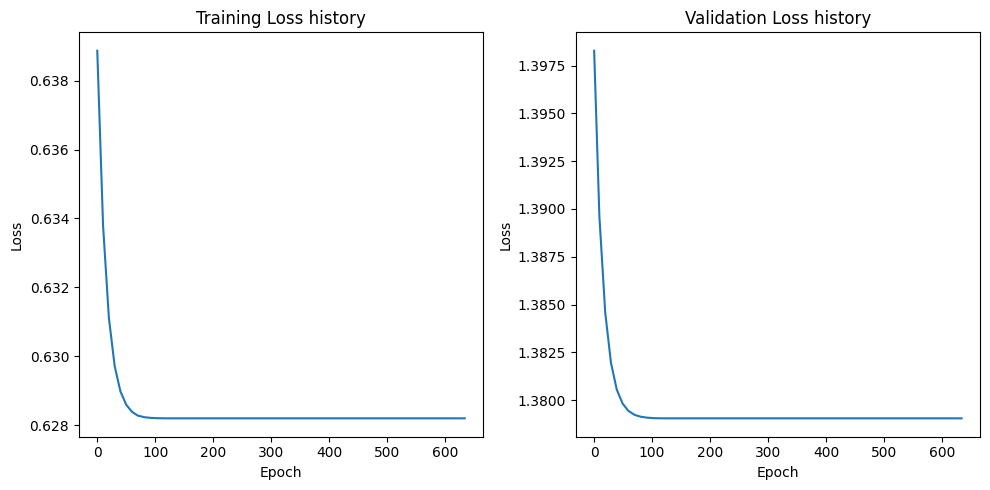

[I 2023-10-11 08:38:04,250] Trial 70 finished with value: 2.7733333110809326 and parameters: {'hidden_layers': 2, 'epochs': 3067, 'batch_size': 366, 'learning_rate': 0.07478382165359657}. Best is trial 69 with value: 0.8195011019706726.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3199, Train Loss: 828.7375755310059, Validation Loss: 703.5134124755859
Epoch 101/3199, Train Loss: 4.181748375296593, Validation Loss: 6.653498649597168
Epoch 201/3199, Train Loss: 4.126852095127106, Validation Loss: 6.576462626457214
Epoch 301/3199, Train Loss: 4.126836851239204, Validation Loss: 6.576449871063232
Epoch 401/3199, Train Loss: 4.126836851239204, Validation Loss: 6.576449871063232
Epoch 501/3199, Train Loss: 4.126836851239204, Validation Loss: 6.576449871063232
Epoch 601/3199, Train Loss: 4.126836851239204, Validation Loss: 6.576449871063232
Epoch 701/3199, Train Loss: 4.126836851239204, Validation Loss: 6.576449871063232
Early stopping triggered.


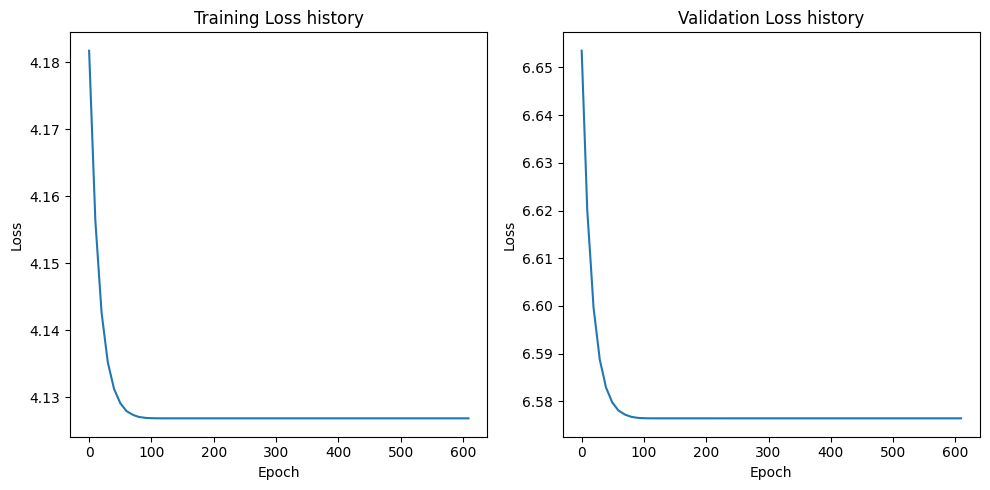

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3199, Train Loss: 1005.4460983276367, Validation Loss: 797.6293334960938
Epoch 101/3199, Train Loss: 1.745647817850113, Validation Loss: 5.354451030492783
Epoch 201/3199, Train Loss: 1.7179500497877598, Validation Loss: 5.30566868185997
Epoch 301/3199, Train Loss: 1.7179360873997211, Validation Loss: 5.305650383234024
Epoch 401/3199, Train Loss: 1.7179360873997211, Validation Loss: 5.305650383234024
Epoch 501/3199, Train Loss: 1.7179360873997211, Validation Loss: 5.305650383234024
Epoch 601/3199, Train Loss: 1.7179360873997211, Validation Loss: 5.305650383234024
Epoch 701/3199, Train Loss: 1.7179360873997211, Validation Loss: 5.305650383234024
Early stopping triggered.


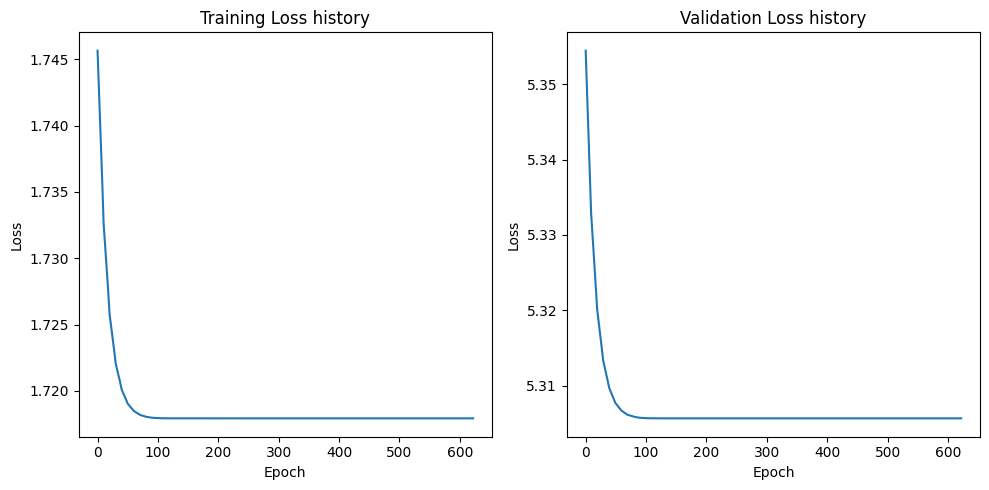

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3199, Train Loss: 81.81499218940735, Validation Loss: 261.5584239959717
Epoch 101/3199, Train Loss: 0.6685289349406958, Validation Loss: 1.6210764795541763
Epoch 201/3199, Train Loss: 0.6632354166358709, Validation Loss: 1.6071958243846893
Epoch 301/3199, Train Loss: 0.6632330045104027, Validation Loss: 1.607187032699585
Epoch 401/3199, Train Loss: 0.6632330045104027, Validation Loss: 1.607187032699585
Epoch 501/3199, Train Loss: 0.6632330045104027, Validation Loss: 1.607187032699585
Epoch 601/3199, Train Loss: 0.6632330045104027, Validation Loss: 1.607187032699585
Epoch 701/3199, Train Loss: 0.6632330045104027, Validation Loss: 1.607187032699585
Early stopping triggered.


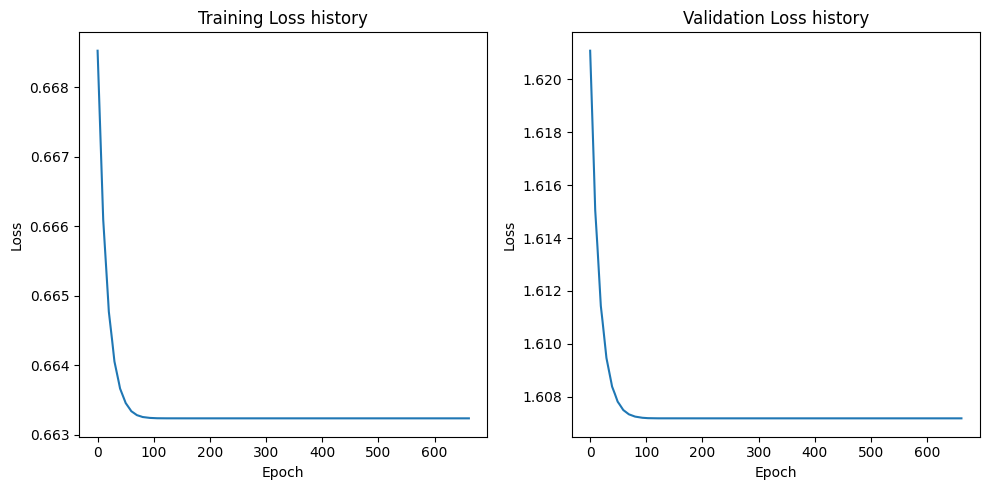

[I 2023-10-11 08:39:25,137] Trial 71 finished with value: 1.5985498428344727 and parameters: {'hidden_layers': 2, 'epochs': 3199, 'batch_size': 164, 'learning_rate': 0.07629336684196578}. Best is trial 69 with value: 0.8195011019706726.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2973, Train Loss: 945.9508361816406, Validation Loss: 673.7503601074219
Epoch 101/2973, Train Loss: 1.456411951035261, Validation Loss: 4.618638354539871
Epoch 201/2973, Train Loss: 1.4425309598445892, Validation Loss: 4.563880985975265
Epoch 301/2973, Train Loss: 1.4425270788371563, Validation Loss: 4.56387785077095
Epoch 401/2973, Train Loss: 1.4425270788371563, Validation Loss: 4.56387785077095
Epoch 501/2973, Train Loss: 1.4425270788371563, Validation Loss: 4.56387785077095
Epoch 601/2973, Train Loss: 1.4425270788371563, Validation Loss: 4.56387785077095
Epoch 701/2973, Train Loss: 1.4425270788371563, Validation Loss: 4.56387785077095
Early stopping triggered.


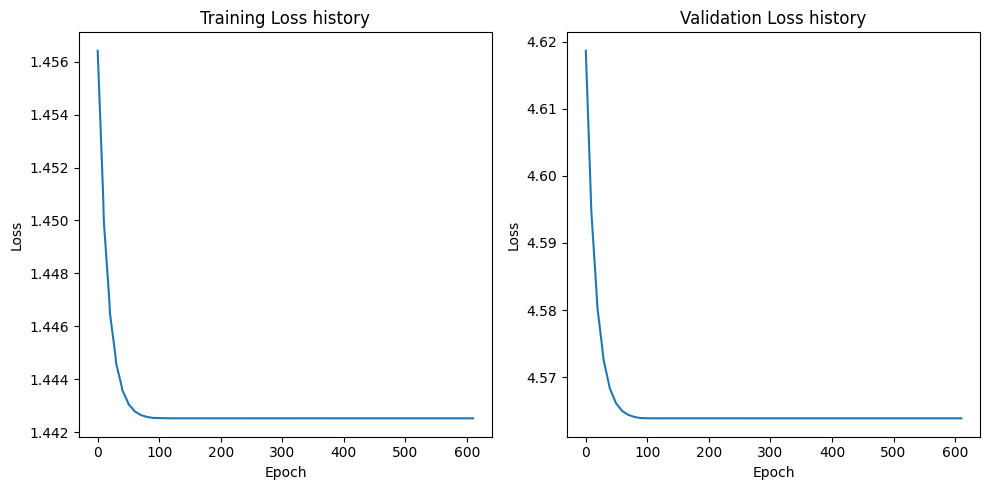

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2973, Train Loss: 833.4609619140625, Validation Loss: 629.7859558105469
Epoch 101/2973, Train Loss: 0.14548563389107586, Validation Loss: 1.7014383941888809
Epoch 201/2973, Train Loss: 0.14288876550272106, Validation Loss: 1.6914385810494423
Epoch 301/2973, Train Loss: 0.14288759650662541, Validation Loss: 1.6914368495345116
Epoch 401/2973, Train Loss: 0.14288759650662541, Validation Loss: 1.6914368495345116
Epoch 501/2973, Train Loss: 0.14288759650662541, Validation Loss: 1.6914368495345116
Epoch 601/2973, Train Loss: 0.14288759650662541, Validation Loss: 1.6914368495345116
Epoch 701/2973, Train Loss: 0.14288759650662541, Validation Loss: 1.6914368495345116
Early stopping triggered.


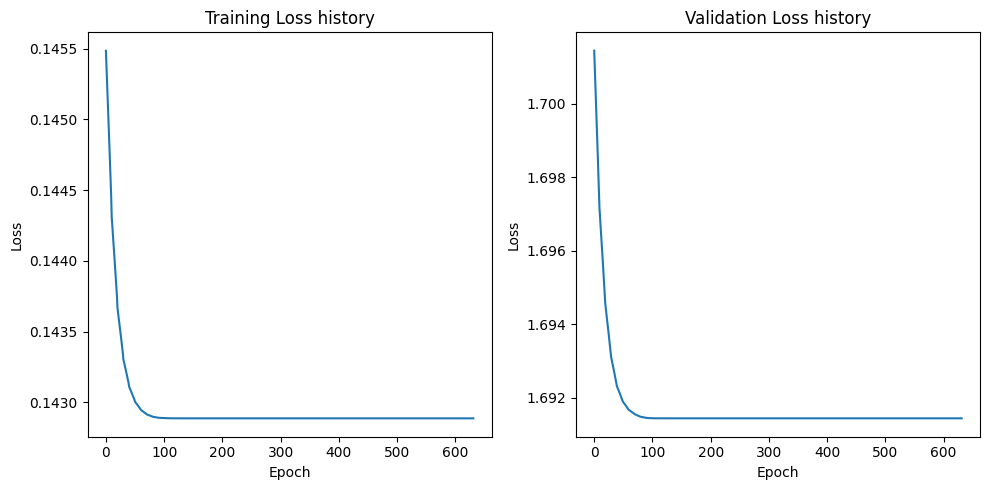

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2973, Train Loss: 125.60219879150391, Validation Loss: 110.02058258056641
Epoch 101/2973, Train Loss: 0.329862168058753, Validation Loss: 0.7191495165228844
Epoch 201/2973, Train Loss: 0.3272372532635927, Validation Loss: 0.7136356204748153
Epoch 301/2973, Train Loss: 0.3272363362833858, Validation Loss: 0.7136339366436004
Epoch 401/2973, Train Loss: 0.3272363362833858, Validation Loss: 0.7136339366436004
Epoch 501/2973, Train Loss: 0.3272363362833858, Validation Loss: 0.7136339366436004
Epoch 601/2973, Train Loss: 0.3272363362833858, Validation Loss: 0.7136339366436004
Epoch 701/2973, Train Loss: 0.3272363362833858, Validation Loss: 0.7136339366436004
Early stopping triggered.


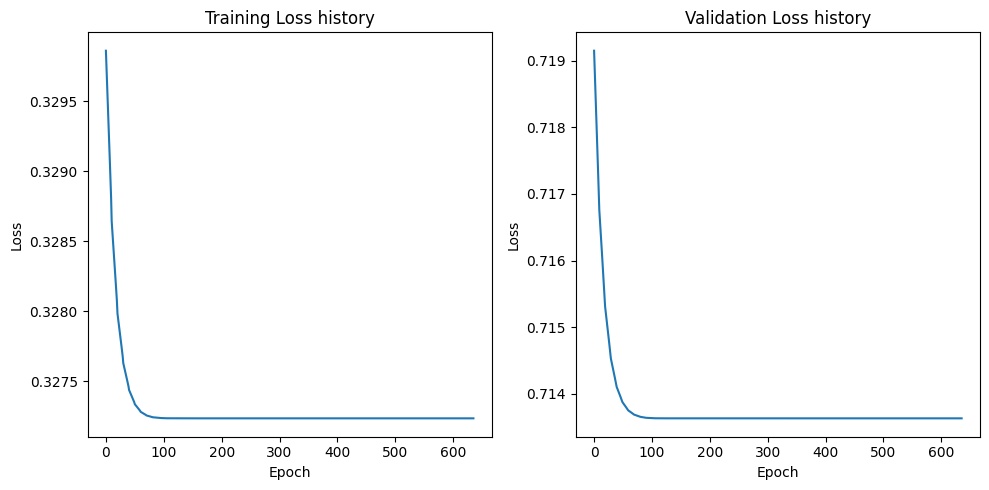

[I 2023-10-11 08:40:52,256] Trial 72 finished with value: 0.9778550267219543 and parameters: {'hidden_layers': 2, 'epochs': 2973, 'batch_size': 125, 'learning_rate': 0.04312770056287921}. Best is trial 69 with value: 0.8195011019706726.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2979, Train Loss: 937.1780029296875, Validation Loss: 747.8636881510416
Epoch 101/2979, Train Loss: 4.420724081993103, Validation Loss: 7.338627020517985
Epoch 201/2979, Train Loss: 4.384363174438477, Validation Loss: 7.2844557762146
Epoch 301/2979, Train Loss: 4.384351444244385, Validation Loss: 7.284435113271077
Epoch 401/2979, Train Loss: 4.384351444244385, Validation Loss: 7.284435113271077
Epoch 501/2979, Train Loss: 4.384351444244385, Validation Loss: 7.284435113271077
Epoch 601/2979, Train Loss: 4.384351444244385, Validation Loss: 7.284435113271077
Epoch 701/2979, Train Loss: 4.384351444244385, Validation Loss: 7.284435113271077
Early stopping triggered.


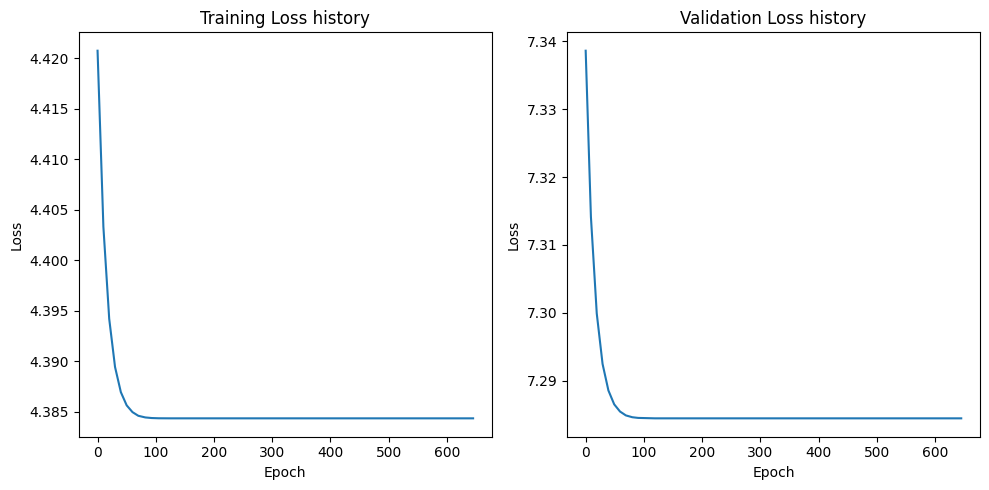

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2979, Train Loss: 914.8114135742187, Validation Loss: 733.6161702473959
Epoch 101/2979, Train Loss: 1.9529404640197754, Validation Loss: 4.949970483779907
Epoch 201/2979, Train Loss: 1.9139823913574219, Validation Loss: 4.888199170430501
Epoch 301/2979, Train Loss: 1.9139674663543702, Validation Loss: 4.88817818959554
Epoch 401/2979, Train Loss: 1.9139674663543702, Validation Loss: 4.88817818959554
Epoch 501/2979, Train Loss: 1.9139674663543702, Validation Loss: 4.88817818959554
Epoch 601/2979, Train Loss: 1.9139674663543702, Validation Loss: 4.88817818959554
Epoch 701/2979, Train Loss: 1.9139674663543702, Validation Loss: 4.88817818959554
Early stopping triggered.


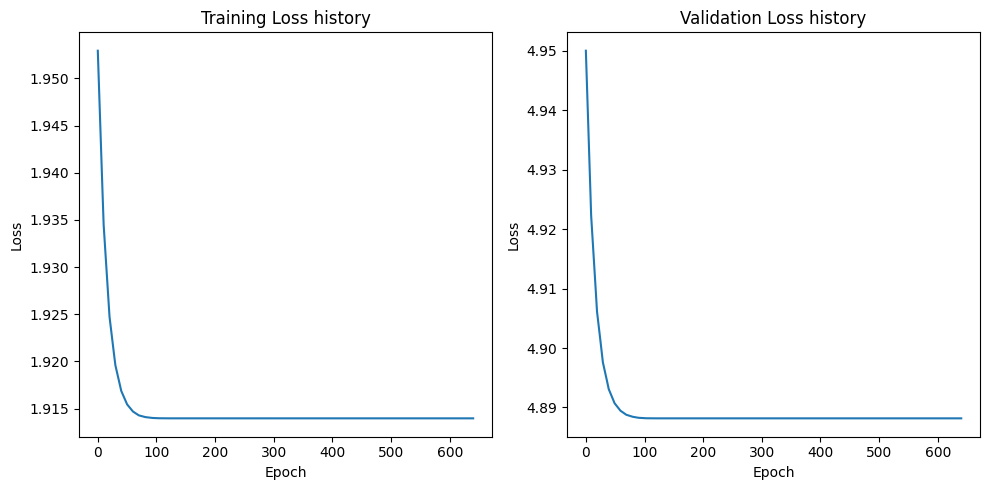

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/2979, Train Loss: 113.02884292602539, Validation Loss: 113.36702219645183
Epoch 101/2979, Train Loss: 0.45027039349079134, Validation Loss: 0.893179660042127
Epoch 201/2979, Train Loss: 0.44644288420677186, Validation Loss: 0.8869967261950175
Epoch 301/2979, Train Loss: 0.4464413121342659, Validation Loss: 0.886993924776713
Epoch 401/2979, Train Loss: 0.4464413121342659, Validation Loss: 0.886993924776713
Epoch 501/2979, Train Loss: 0.4464413121342659, Validation Loss: 0.886993924776713
Epoch 601/2979, Train Loss: 0.4464413121342659, Validation Loss: 0.886993924776713
Epoch 701/2979, Train Loss: 0.4464413121342659, Validation Loss: 0.886993924776713
Early stopping triggered.


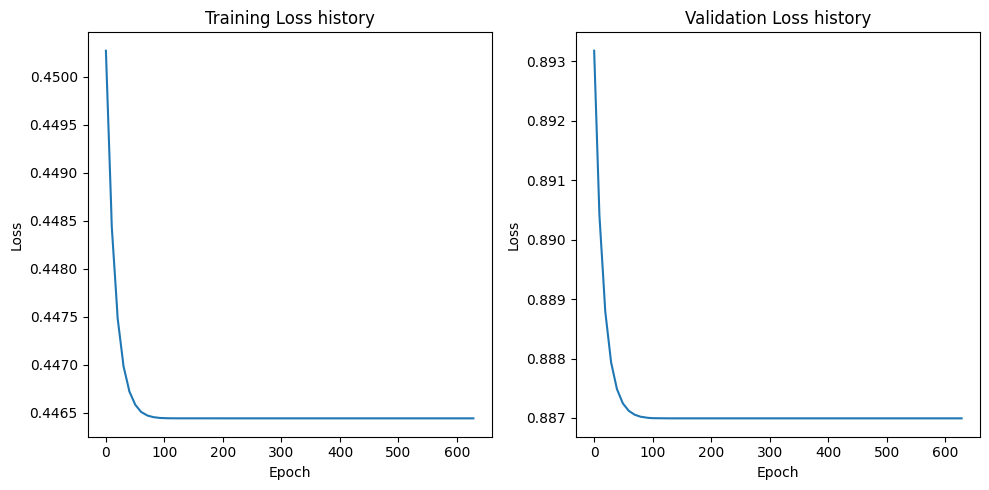

[I 2023-10-11 08:42:02,857] Trial 73 finished with value: 1.485937476158142 and parameters: {'hidden_layers': 2, 'epochs': 2979, 'batch_size': 255, 'learning_rate': 0.06869101380715811}. Best is trial 69 with value: 0.8195011019706726.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3675, Train Loss: 995.6993495396206, Validation Loss: 913.3396301269531
Epoch 101/3675, Train Loss: 0.10358204399900776, Validation Loss: 0.11989781819283962
Epoch 201/3675, Train Loss: 0.09894566424190998, Validation Loss: 0.11487833969295025
Epoch 301/3675, Train Loss: 0.09894026443362236, Validation Loss: 0.11487221159040928
Epoch 401/3675, Train Loss: 0.09894026230488505, Validation Loss: 0.11487220600247383
Epoch 501/3675, Train Loss: 0.09894026230488505, Validation Loss: 0.11487220600247383
Epoch 601/3675, Train Loss: 0.09894026230488505, Validation Loss: 0.11487220600247383
Epoch 701/3675, Train Loss: 0.09894026230488505, Validation Loss: 0.11487220600247383
Epoch 801/3675, Train Loss: 0.09894026230488505, Validation Loss: 0.11487220600247383
Early stopping triggered.


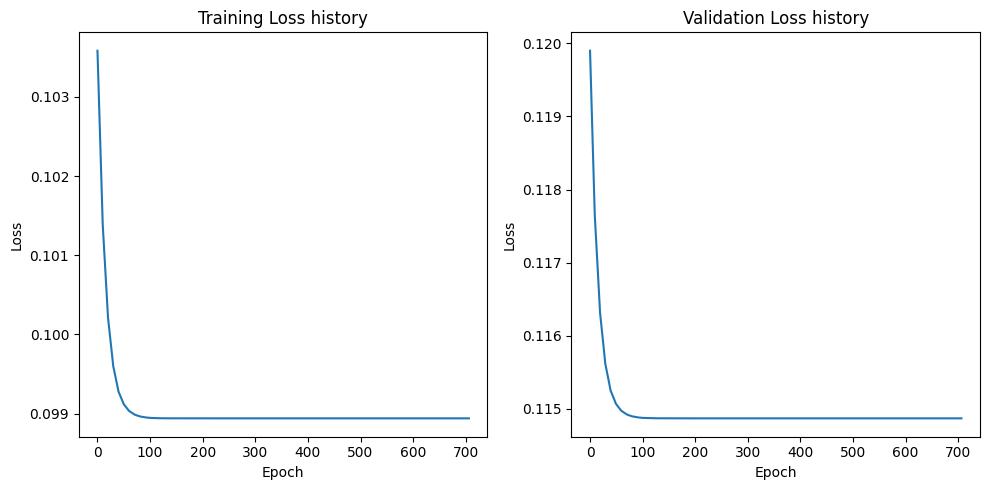

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3675, Train Loss: 1015.8422764369419, Validation Loss: 918.0484771728516
Epoch 101/3675, Train Loss: 0.026431614266974584, Validation Loss: 0.030850351322442293
Epoch 201/3675, Train Loss: 0.026307704725435803, Validation Loss: 0.030710031278431416
Epoch 301/3675, Train Loss: 0.02630769501307181, Validation Loss: 0.030710062012076378
Epoch 401/3675, Train Loss: 0.02630769501307181, Validation Loss: 0.030710062012076378
Epoch 501/3675, Train Loss: 0.02630769501307181, Validation Loss: 0.030710062012076378
Epoch 601/3675, Train Loss: 0.02630769501307181, Validation Loss: 0.030710062012076378
Early stopping triggered.


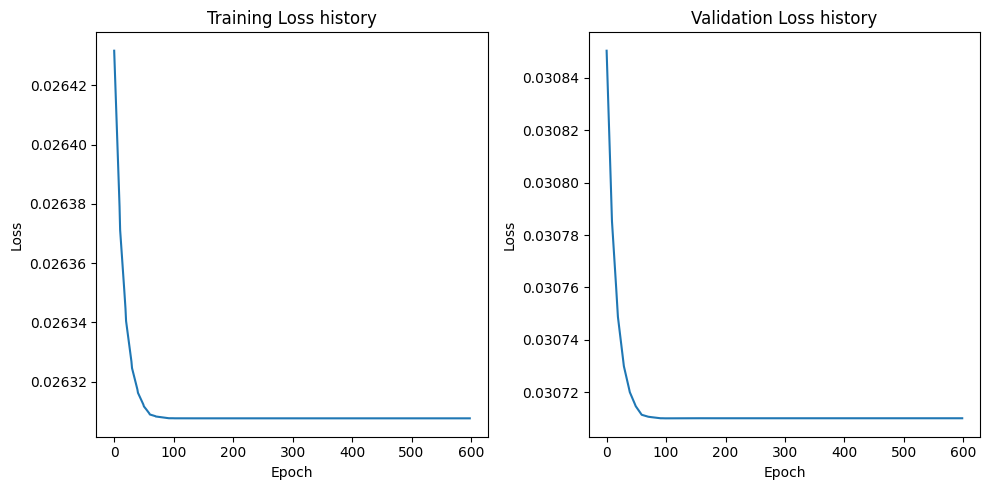

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3675, Train Loss: 117.2643323625837, Validation Loss: 109.78317451477051
Epoch 101/3675, Train Loss: 0.3047290433730398, Validation Loss: 0.2932939911261201
Epoch 201/3675, Train Loss: 0.30132460141820566, Validation Loss: 0.2892674319446087
Epoch 301/3675, Train Loss: 0.30132278241217136, Validation Loss: 0.2892649946734309
Epoch 401/3675, Train Loss: 0.30132278241217136, Validation Loss: 0.2892649946734309
Epoch 501/3675, Train Loss: 0.30132278241217136, Validation Loss: 0.2892649946734309
Epoch 601/3675, Train Loss: 0.30132278241217136, Validation Loss: 0.2892649946734309
Epoch 701/3675, Train Loss: 0.30132278241217136, Validation Loss: 0.2892649946734309
Early stopping triggered.


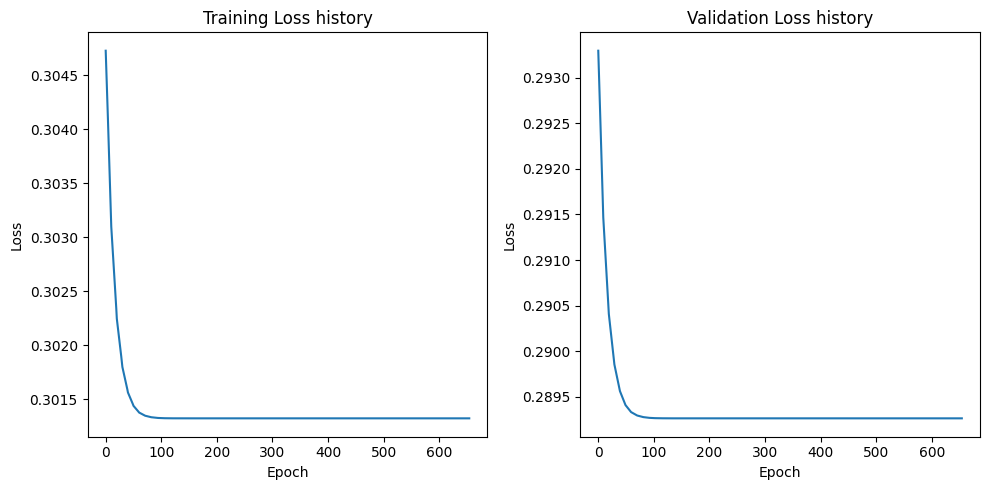

[I 2023-10-11 08:43:25,801] Trial 74 finished with value: 0.3539901673793793 and parameters: {'hidden_layers': 1, 'epochs': 3675, 'batch_size': 183, 'learning_rate': 0.04124138871327077}. Best is trial 74 with value: 0.3539901673793793.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3671, Train Loss: 957.643550327846, Validation Loss: 960.1661987304688
Epoch 101/3671, Train Loss: 207.00380761282784, Validation Loss: 252.75659942626953
Epoch 201/3671, Train Loss: 206.21408244541712, Validation Loss: 252.00684356689453
Epoch 301/3671, Train Loss: 206.2140165056501, Validation Loss: 252.00681686401367
Epoch 401/3671, Train Loss: 206.2140165056501, Validation Loss: 252.00681686401367
Epoch 501/3671, Train Loss: 206.2140165056501, Validation Loss: 252.00681686401367
Epoch 601/3671, Train Loss: 206.2140165056501, Validation Loss: 252.00681686401367
Epoch 701/3671, Train Loss: 206.2140165056501, Validation Loss: 252.00681686401367
Early stopping triggered.


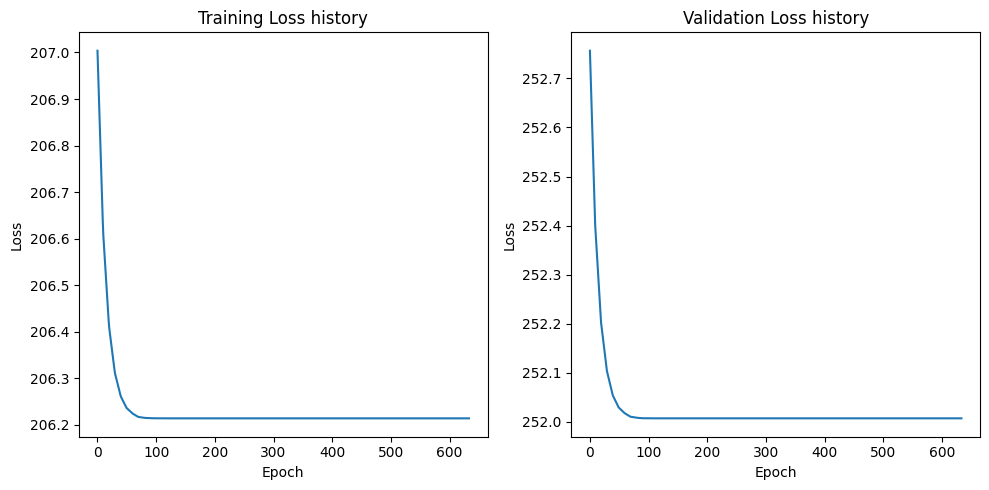

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3671, Train Loss: 932.6846836635044, Validation Loss: 882.5364837646484
Epoch 101/3671, Train Loss: 86.88354982648578, Validation Loss: 123.12870216369629
Epoch 201/3671, Train Loss: 86.2186519077846, Validation Loss: 122.44070339202881
Epoch 301/3671, Train Loss: 86.21857343401227, Validation Loss: 122.44066905975342
Epoch 401/3671, Train Loss: 86.21857343401227, Validation Loss: 122.44066905975342
Epoch 501/3671, Train Loss: 86.21857343401227, Validation Loss: 122.44066905975342
Epoch 601/3671, Train Loss: 86.21857343401227, Validation Loss: 122.44066905975342
Epoch 701/3671, Train Loss: 86.21857343401227, Validation Loss: 122.44066905975342
Early stopping triggered.


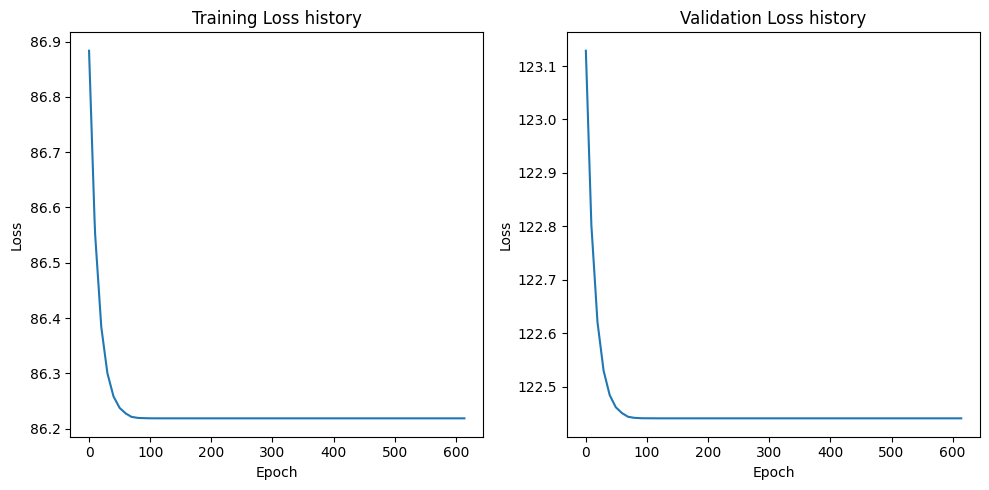

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3671, Train Loss: 149.2234104701451, Validation Loss: 135.36006355285645
Epoch 101/3671, Train Loss: 0.5389526246913842, Validation Loss: 0.5729531152173877
Epoch 201/3671, Train Loss: 0.5262088219502142, Validation Loss: 0.5646673357114196
Epoch 301/3671, Train Loss: 0.5262003357389143, Validation Loss: 0.5646627070382237
Epoch 401/3671, Train Loss: 0.5262003357389143, Validation Loss: 0.5646627070382237
Epoch 501/3671, Train Loss: 0.5262003357389143, Validation Loss: 0.5646627070382237
Epoch 601/3671, Train Loss: 0.5262003357389143, Validation Loss: 0.5646627070382237
Epoch 701/3671, Train Loss: 0.5262003357389143, Validation Loss: 0.5646627070382237
Early stopping triggered.


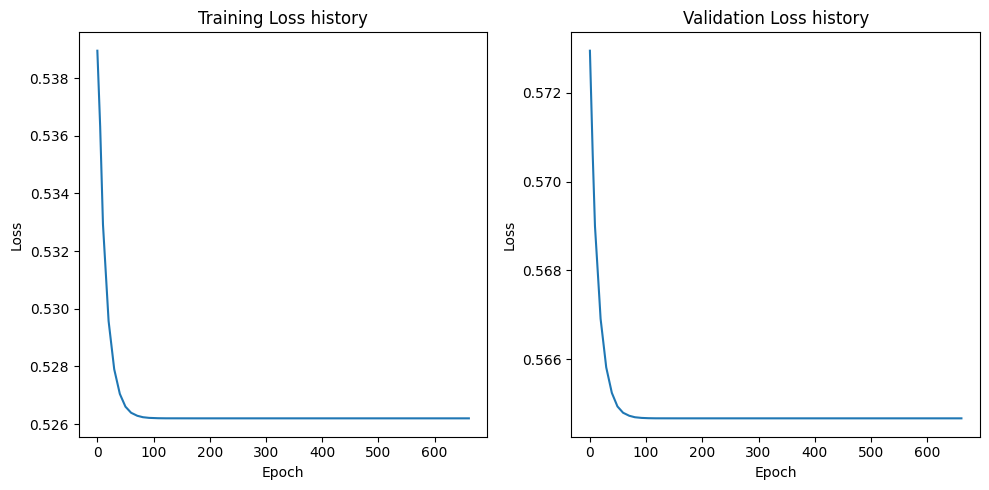

[I 2023-10-11 08:44:45,900] Trial 75 finished with value: 8.22101879119873 and parameters: {'hidden_layers': 1, 'epochs': 3671, 'batch_size': 181, 'learning_rate': 0.021408260279531275}. Best is trial 74 with value: 0.3539901673793793.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3951, Train Loss: 1000.0943218030428, Validation Loss: 976.6290161132813
Epoch 101/3951, Train Loss: 0.023521612790462217, Validation Loss: 0.028327178955078126
Epoch 201/3951, Train Loss: 0.02350101276840034, Validation Loss: 0.028291238471865654
Epoch 301/3951, Train Loss: 0.023500980711296984, Validation Loss: 0.028291192650794984
Epoch 401/3951, Train Loss: 0.023500980711296984, Validation Loss: 0.028291192650794984
Epoch 501/3951, Train Loss: 0.023500980711296984, Validation Loss: 0.028291192650794984
Epoch 601/3951, Train Loss: 0.023500980711296984, Validation Loss: 0.028291192650794984
Epoch 701/3951, Train Loss: 0.023500980711296984, Validation Loss: 0.028291192650794984
Early stopping triggered.


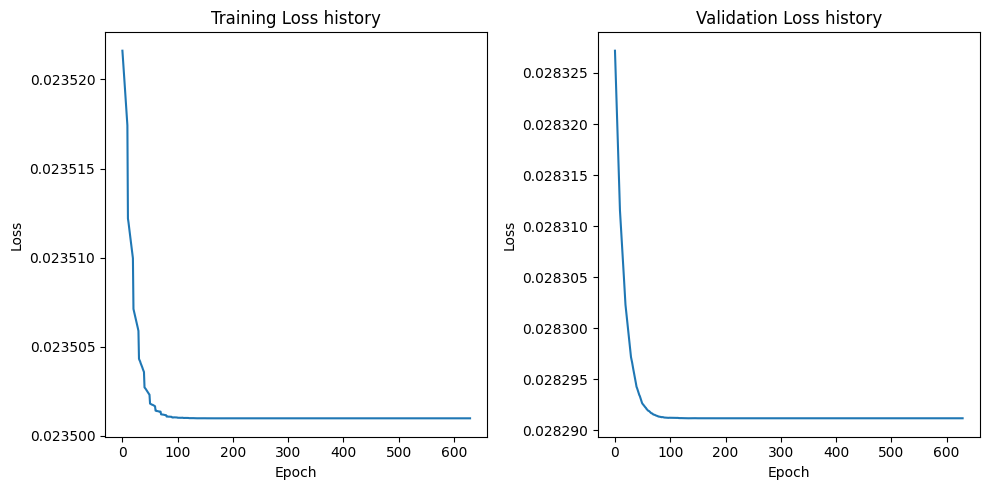

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3951, Train Loss: 1016.9875841642681, Validation Loss: 990.8823486328125
Epoch 101/3951, Train Loss: 0.03167419664953884, Validation Loss: 0.03714155629277229
Epoch 201/3951, Train Loss: 0.031112017355075006, Validation Loss: 0.036507691442966464
Epoch 301/3951, Train Loss: 0.031111980494307846, Validation Loss: 0.03650748990476131
Epoch 401/3951, Train Loss: 0.03111198010217202, Validation Loss: 0.03650748990476131
Epoch 501/3951, Train Loss: 0.03111198010217202, Validation Loss: 0.03650748990476131
Epoch 601/3951, Train Loss: 0.03111198010217202, Validation Loss: 0.03650748990476131
Epoch 701/3951, Train Loss: 0.03111198010217202, Validation Loss: 0.03650748990476131
Early stopping triggered.


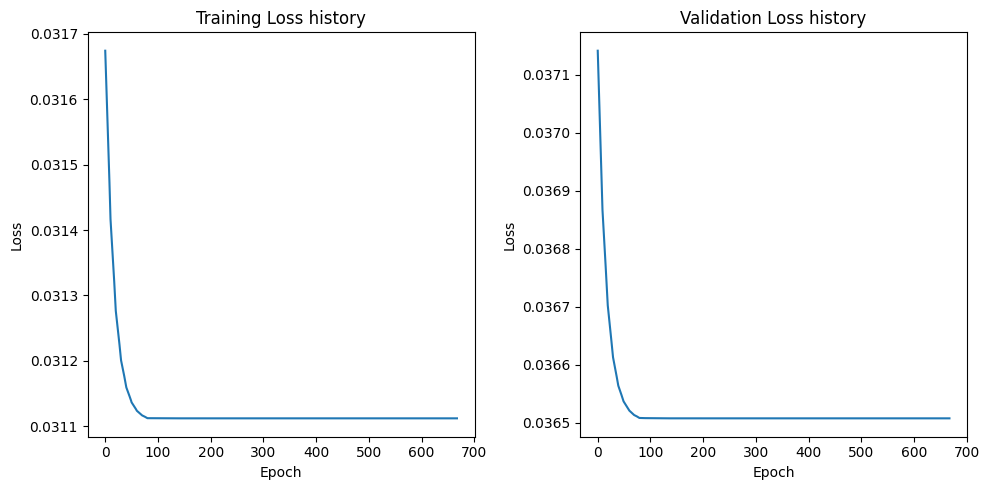

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3951, Train Loss: 122.62028202257659, Validation Loss: 93.05151596069337
Epoch 101/3951, Train Loss: 0.11040205998640311, Validation Loss: 0.14278316497802734
Epoch 201/3951, Train Loss: 0.1094721183180809, Validation Loss: 0.1423019401729107
Epoch 301/3951, Train Loss: 0.10947155599531375, Validation Loss: 0.14230201467871667
Epoch 401/3951, Train Loss: 0.10947155599531375, Validation Loss: 0.14230201467871667
Epoch 501/3951, Train Loss: 0.10947155599531375, Validation Loss: 0.14230201467871667
Epoch 601/3951, Train Loss: 0.10947155599531375, Validation Loss: 0.14230201467871667
Epoch 701/3951, Train Loss: 0.10947155599531375, Validation Loss: 0.14230201467871667
Early stopping triggered.


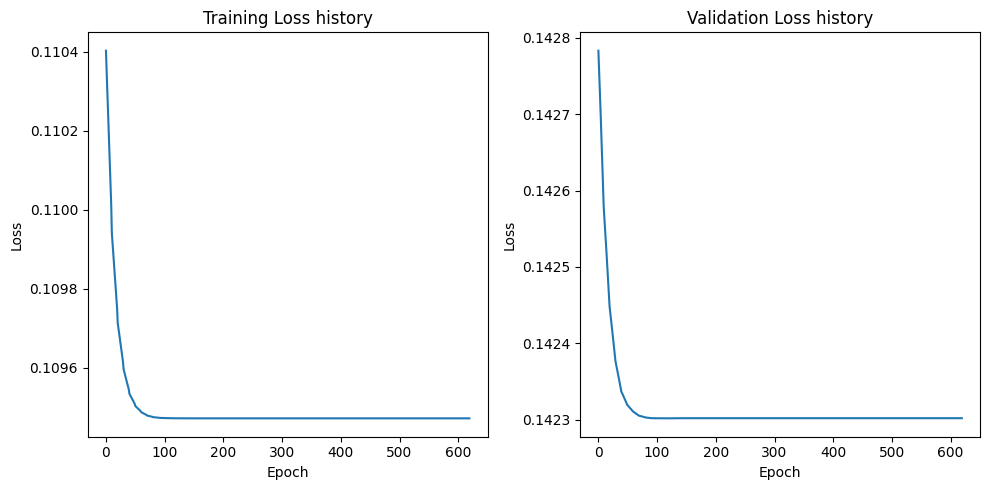

[I 2023-10-11 08:46:11,954] Trial 76 finished with value: 0.22643256187438965 and parameters: {'hidden_layers': 1, 'epochs': 3951, 'batch_size': 135, 'learning_rate': 0.041703383056820066}. Best is trial 76 with value: 0.22643256187438965.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4095, Train Loss: 1029.2329711914062, Validation Loss: 1013.27001953125
Epoch 101/4095, Train Loss: 443.87723541259766, Validation Loss: 468.466064453125
Epoch 201/4095, Train Loss: 443.66295623779297, Validation Loss: 468.28350830078125
Epoch 301/4095, Train Loss: 443.66294860839844, Validation Loss: 468.283447265625
Epoch 401/4095, Train Loss: 443.66294860839844, Validation Loss: 468.283447265625
Epoch 501/4095, Train Loss: 443.66294860839844, Validation Loss: 468.283447265625
Epoch 601/4095, Train Loss: 443.66294860839844, Validation Loss: 468.283447265625
Epoch 701/4095, Train Loss: 443.66294860839844, Validation Loss: 468.283447265625
Early stopping triggered.


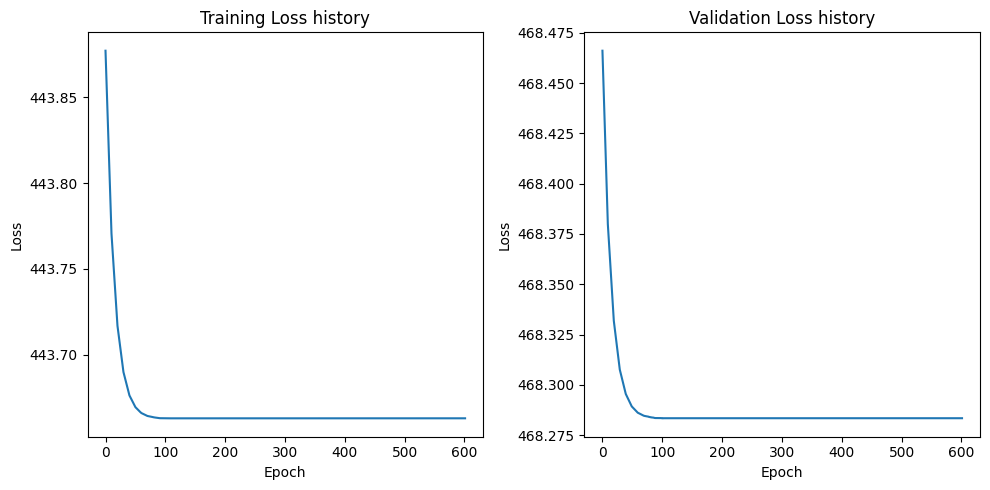

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4095, Train Loss: 1007.7762756347656, Validation Loss: 960.533203125
Epoch 101/4095, Train Loss: 420.4876174926758, Validation Loss: 443.5113525390625
Epoch 201/4095, Train Loss: 420.15869903564453, Validation Loss: 443.17034912109375
Epoch 301/4095, Train Loss: 420.1586685180664, Validation Loss: 443.1702880859375
Epoch 401/4095, Train Loss: 420.1586685180664, Validation Loss: 443.1702880859375
Epoch 501/4095, Train Loss: 420.1586685180664, Validation Loss: 443.1702880859375
Epoch 601/4095, Train Loss: 420.1586685180664, Validation Loss: 443.1702880859375
Epoch 701/4095, Train Loss: 420.1586685180664, Validation Loss: 443.1702880859375
Early stopping triggered.


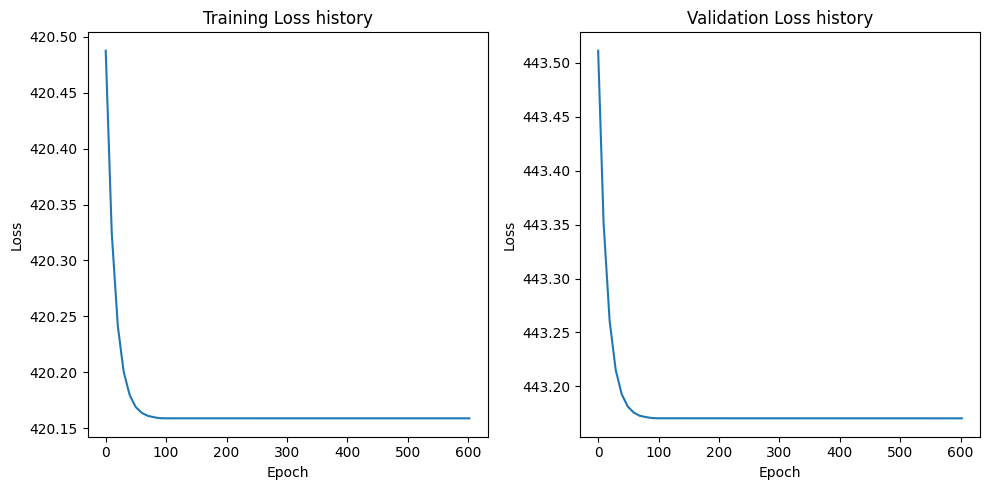

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4095, Train Loss: 162.20059776306152, Validation Loss: 156.32589721679688
Epoch 101/4095, Train Loss: 50.8403377532959, Validation Loss: 58.317935943603516
Epoch 201/4095, Train Loss: 50.78261375427246, Validation Loss: 58.27550506591797
Epoch 301/4095, Train Loss: 50.782599449157715, Validation Loss: 58.2755012512207
Epoch 401/4095, Train Loss: 50.782599449157715, Validation Loss: 58.2755012512207
Epoch 501/4095, Train Loss: 50.782599449157715, Validation Loss: 58.2755012512207
Epoch 601/4095, Train Loss: 50.782599449157715, Validation Loss: 58.2755012512207
Epoch 701/4095, Train Loss: 50.782599449157715, Validation Loss: 58.2755012512207
Early stopping triggered.


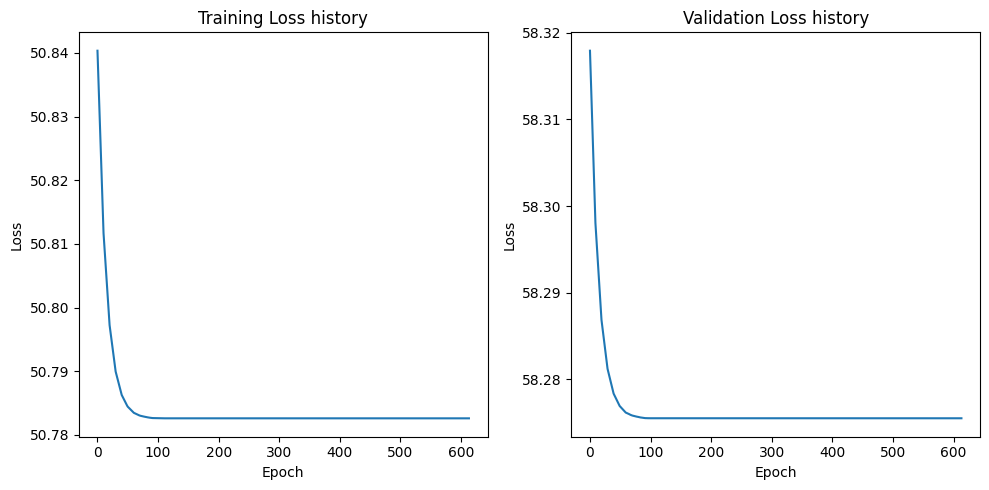

[I 2023-10-11 08:47:08,675] Trial 77 finished with value: 16.45341682434082 and parameters: {'hidden_layers': 1, 'epochs': 4095, 'batch_size': 696, 'learning_rate': 0.042289195873690275}. Best is trial 76 with value: 0.22643256187438965.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3869, Train Loss: 1054.4474758572048, Validation Loss: 1044.0071207682292
Epoch 101/3869, Train Loss: 89.72837660047743, Validation Loss: 128.45248413085938
Epoch 201/3869, Train Loss: 88.39810350206163, Validation Loss: 126.71775309244792
Epoch 301/3869, Train Loss: 88.39769490559895, Validation Loss: 126.71715291341145
Epoch 401/3869, Train Loss: 88.39769490559895, Validation Loss: 126.71715291341145
Epoch 501/3869, Train Loss: 88.39769490559895, Validation Loss: 126.71715291341145
Epoch 601/3869, Train Loss: 88.39769490559895, Validation Loss: 126.71715291341145
Epoch 701/3869, Train Loss: 88.39769490559895, Validation Loss: 126.71715291341145
Early stopping triggered.


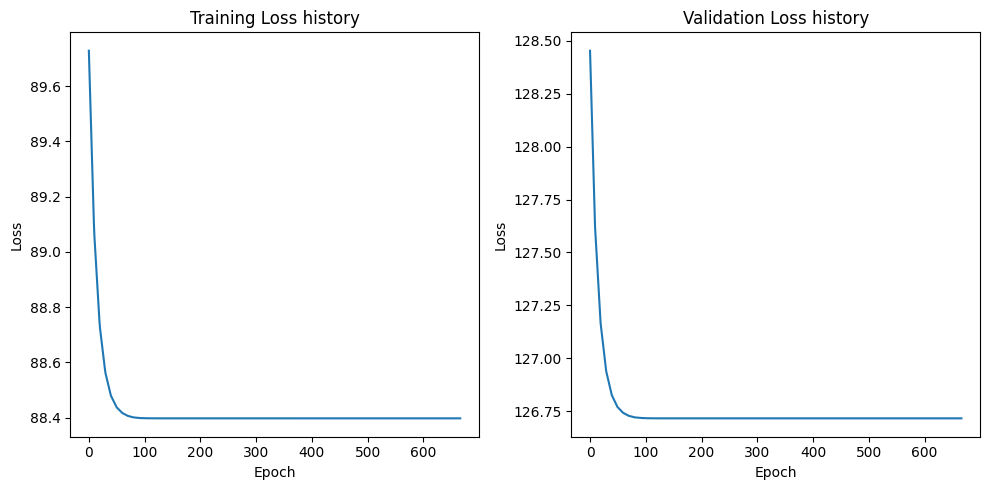

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3869, Train Loss: 932.7786187065972, Validation Loss: 866.2884724934896
Epoch 101/3869, Train Loss: 8.737737245029873, Validation Loss: 8.66351306438446
Epoch 201/3869, Train Loss: 8.47489521238539, Validation Loss: 8.456741372744242
Epoch 301/3869, Train Loss: 8.474743392732409, Validation Loss: 8.456622958183289
Epoch 401/3869, Train Loss: 8.474743392732409, Validation Loss: 8.456622958183289
Epoch 501/3869, Train Loss: 8.474743392732409, Validation Loss: 8.456622958183289
Epoch 601/3869, Train Loss: 8.474743392732409, Validation Loss: 8.456622958183289
Epoch 701/3869, Train Loss: 8.474743392732409, Validation Loss: 8.456622958183289
Early stopping triggered.


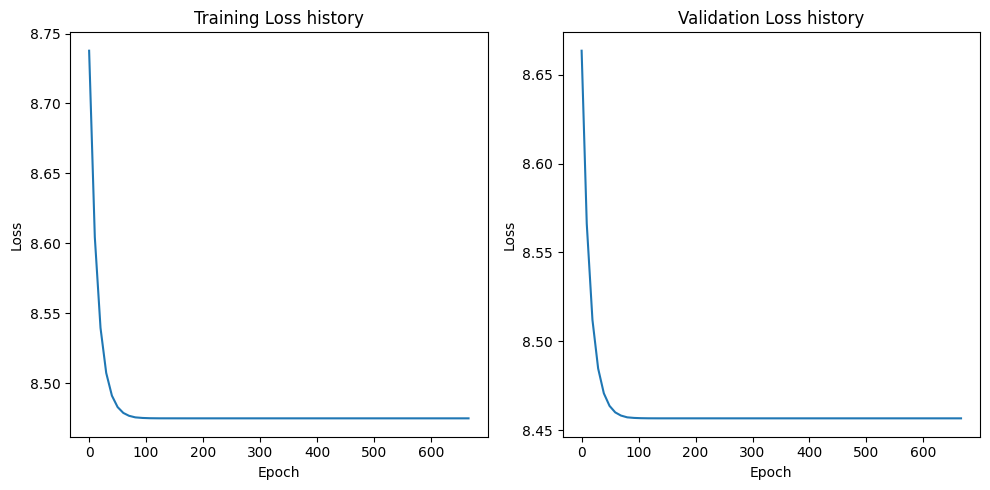

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3869, Train Loss: 142.9740710788303, Validation Loss: 134.38663228352866
Epoch 101/3869, Train Loss: 0.6539571521182855, Validation Loss: 0.5860018680493037
Epoch 201/3869, Train Loss: 0.6455355555646949, Validation Loss: 0.5745084372659525
Epoch 301/3869, Train Loss: 0.6455304407411151, Validation Loss: 0.5744985428949198
Epoch 401/3869, Train Loss: 0.6455304407411151, Validation Loss: 0.5744985428949198
Epoch 501/3869, Train Loss: 0.6455304407411151, Validation Loss: 0.5744985428949198
Epoch 601/3869, Train Loss: 0.6455304407411151, Validation Loss: 0.5744985428949198
Epoch 701/3869, Train Loss: 0.6455304407411151, Validation Loss: 0.5744985428949198
Early stopping triggered.


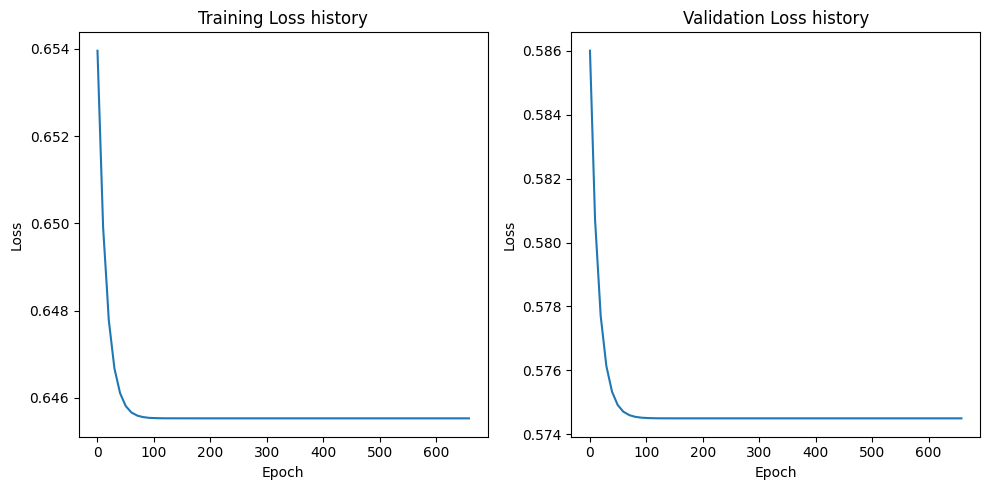

[I 2023-10-11 08:48:19,406] Trial 78 finished with value: 4.592325687408447 and parameters: {'hidden_layers': 1, 'epochs': 3869, 'batch_size': 289, 'learning_rate': 0.05092046255351177}. Best is trial 76 with value: 0.22643256187438965.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3983, Train Loss: 925.0029873318142, Validation Loss: 804.8456237792968
Epoch 101/3983, Train Loss: 0.023639236214674182, Validation Loss: 0.02846275791525841
Epoch 201/3983, Train Loss: 0.02361869103171759, Validation Loss: 0.028431450948119164
Epoch 301/3983, Train Loss: 0.023618677061878972, Validation Loss: 0.028431450948119164
Epoch 401/3983, Train Loss: 0.023618677061878972, Validation Loss: 0.028431452438235284
Epoch 501/3983, Train Loss: 0.023618677061878972, Validation Loss: 0.028431452438235284
Epoch 601/3983, Train Loss: 0.023618677061878972, Validation Loss: 0.028431452438235284
Epoch 701/3983, Train Loss: 0.023618677061878972, Validation Loss: 0.028431452438235284
Early stopping triggered.


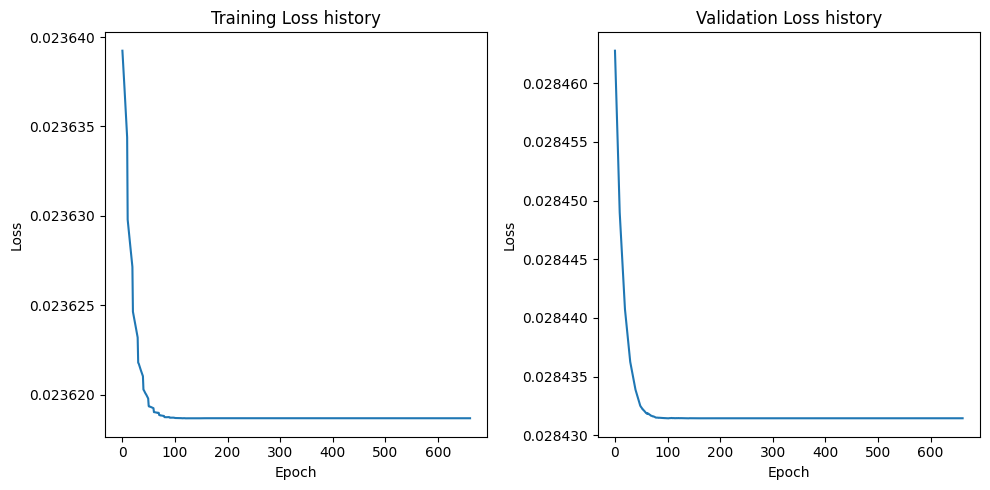

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3983, Train Loss: 968.8695000542534, Validation Loss: 831.9376342773437
Epoch 101/3983, Train Loss: 0.02467956580221653, Validation Loss: 0.02815576530992985
Epoch 201/3983, Train Loss: 0.024650387052032683, Validation Loss: 0.028123250976204873
Epoch 301/3983, Train Loss: 0.024650374841358926, Validation Loss: 0.028123258799314498
Epoch 401/3983, Train Loss: 0.024650374323957495, Validation Loss: 0.028123258799314498
Epoch 501/3983, Train Loss: 0.024650374323957495, Validation Loss: 0.028123258799314498
Epoch 601/3983, Train Loss: 0.024650374323957495, Validation Loss: 0.028123258799314498
Epoch 701/3983, Train Loss: 0.024650374323957495, Validation Loss: 0.028123258799314498
Early stopping triggered.


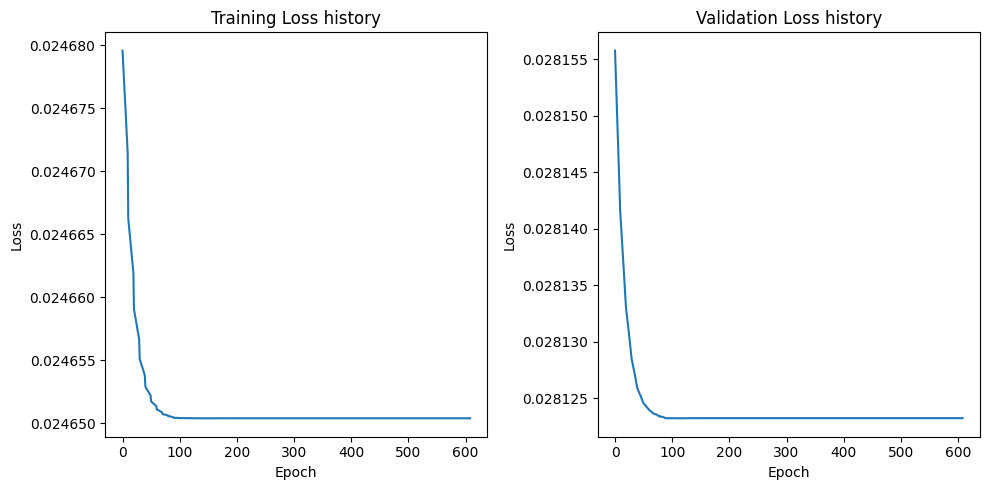

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3983, Train Loss: 124.63223626878526, Validation Loss: 104.62495269775391
Epoch 101/3983, Train Loss: 0.041470779209501214, Validation Loss: 0.043116582185029985
Epoch 201/3983, Train Loss: 0.04145424533635378, Validation Loss: 0.043113672733306886
Epoch 301/3983, Train Loss: 0.04145421160178052, Validation Loss: 0.04311365857720375
Epoch 401/3983, Train Loss: 0.041454211394819945, Validation Loss: 0.04311365857720375
Epoch 501/3983, Train Loss: 0.041454211394819945, Validation Loss: 0.04311365857720375
Epoch 601/3983, Train Loss: 0.041454211394819945, Validation Loss: 0.04311365857720375
Epoch 701/3983, Train Loss: 0.041454211394819945, Validation Loss: 0.04311365857720375
Early stopping triggered.


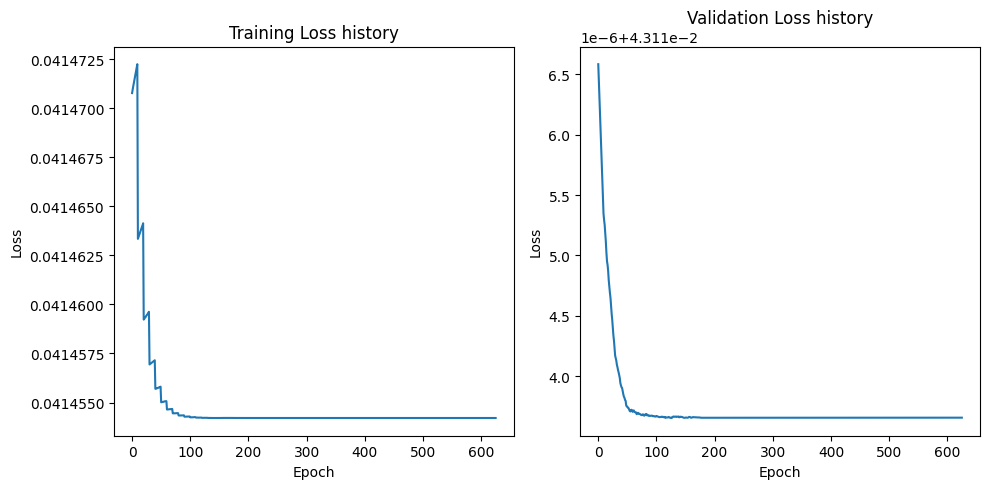

[I 2023-10-11 08:49:42,768] Trial 79 finished with value: 0.17022700607776642 and parameters: {'hidden_layers': 1, 'epochs': 3983, 'batch_size': 144, 'learning_rate': 0.04046518424118442}. Best is trial 79 with value: 0.17022700607776642.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3971, Train Loss: 1003.0771102905273, Validation Loss: 916.5715637207031
Epoch 101/3971, Train Loss: 0.9544446729123592, Validation Loss: 1.2990106344223022
Epoch 201/3971, Train Loss: 0.9101897664368153, Validation Loss: 1.236057534813881
Epoch 301/3971, Train Loss: 0.9101717658340931, Validation Loss: 1.2360088378190994
Epoch 401/3971, Train Loss: 0.9101717509329319, Validation Loss: 1.2360088378190994
Epoch 501/3971, Train Loss: 0.9101717509329319, Validation Loss: 1.2360088378190994
Epoch 601/3971, Train Loss: 0.9101717509329319, Validation Loss: 1.2360088378190994
Epoch 701/3971, Train Loss: 0.9101717509329319, Validation Loss: 1.2360088378190994
Early stopping triggered.


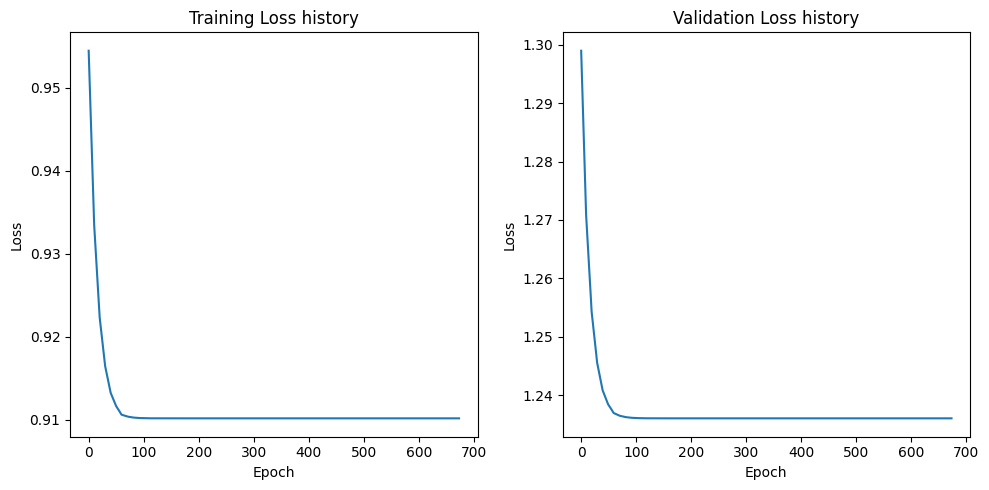

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3971, Train Loss: 1047.9773292541504, Validation Loss: 1034.7208099365234
Epoch 101/3971, Train Loss: 613.9603672027588, Validation Loss: 619.0273971557617
Epoch 201/3971, Train Loss: 613.5945243835449, Validation Loss: 618.6694183349609
Epoch 301/3971, Train Loss: 613.5945243835449, Validation Loss: 618.6694183349609
Epoch 401/3971, Train Loss: 613.5945243835449, Validation Loss: 618.6694183349609
Epoch 501/3971, Train Loss: 613.5945243835449, Validation Loss: 618.6694183349609
Epoch 601/3971, Train Loss: 613.5945243835449, Validation Loss: 618.6694183349609
Early stopping triggered.


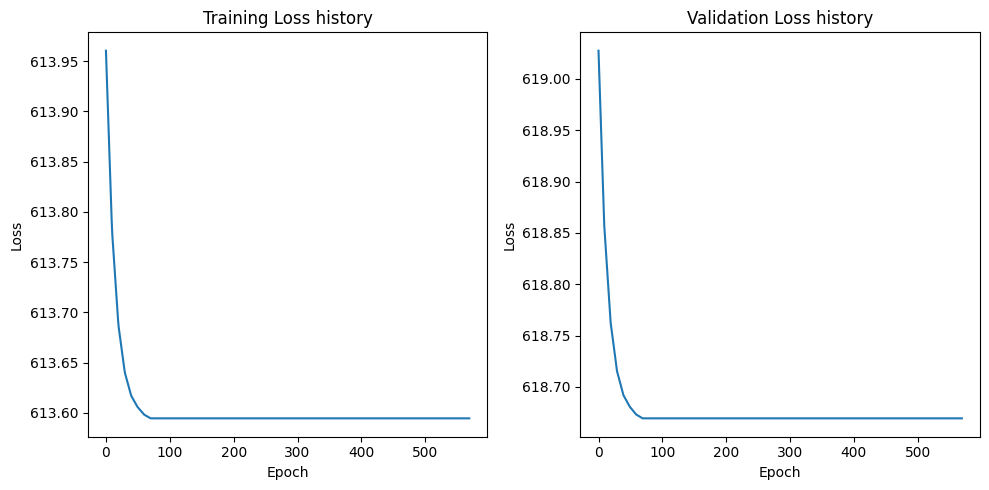

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3971, Train Loss: 144.17294025421143, Validation Loss: 124.90630340576172
Epoch 101/3971, Train Loss: 0.04157083749305457, Validation Loss: 0.044850452803075314
Epoch 201/3971, Train Loss: 0.041516239172779024, Validation Loss: 0.044703830033540726
Epoch 301/3971, Train Loss: 0.04151621018536389, Validation Loss: 0.04470372665673494
Epoch 401/3971, Train Loss: 0.04151621018536389, Validation Loss: 0.04470372945070267
Epoch 501/3971, Train Loss: 0.04151621018536389, Validation Loss: 0.04470372945070267
Epoch 601/3971, Train Loss: 0.04151621018536389, Validation Loss: 0.04470372945070267
Epoch 701/3971, Train Loss: 0.04151621018536389, Validation Loss: 0.04470372945070267
Early stopping triggered.


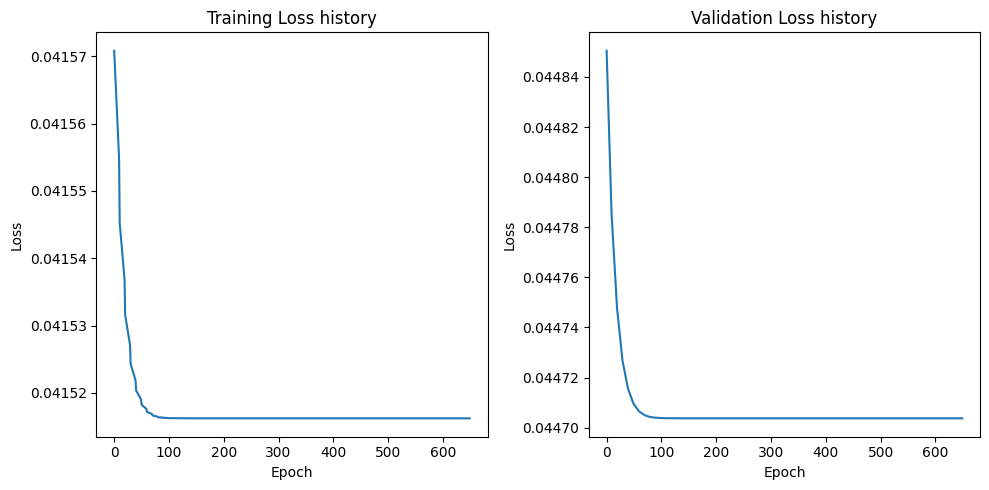

[I 2023-10-11 08:50:59,051] Trial 80 finished with value: 8.640308380126953 and parameters: {'hidden_layers': 1, 'epochs': 3971, 'batch_size': 160, 'learning_rate': 0.025108466297124453}. Best is trial 79 with value: 0.17022700607776642.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4641, Train Loss: 970.3191314697266, Validation Loss: 790.0865417480469
Epoch 101/4641, Train Loss: 0.023463929165154697, Validation Loss: 0.02768889404833317
Epoch 201/4641, Train Loss: 0.02345416652970016, Validation Loss: 0.02768537811934948
Epoch 301/4641, Train Loss: 0.023454145761206746, Validation Loss: 0.02768535874783993
Epoch 401/4641, Train Loss: 0.023454145388677718, Validation Loss: 0.02768535874783993
Epoch 501/4641, Train Loss: 0.023454145388677718, Validation Loss: 0.02768535874783993
Epoch 601/4641, Train Loss: 0.023454145388677718, Validation Loss: 0.02768535874783993
Epoch 701/4641, Train Loss: 0.023454145388677718, Validation Loss: 0.02768535874783993
Early stopping triggered.


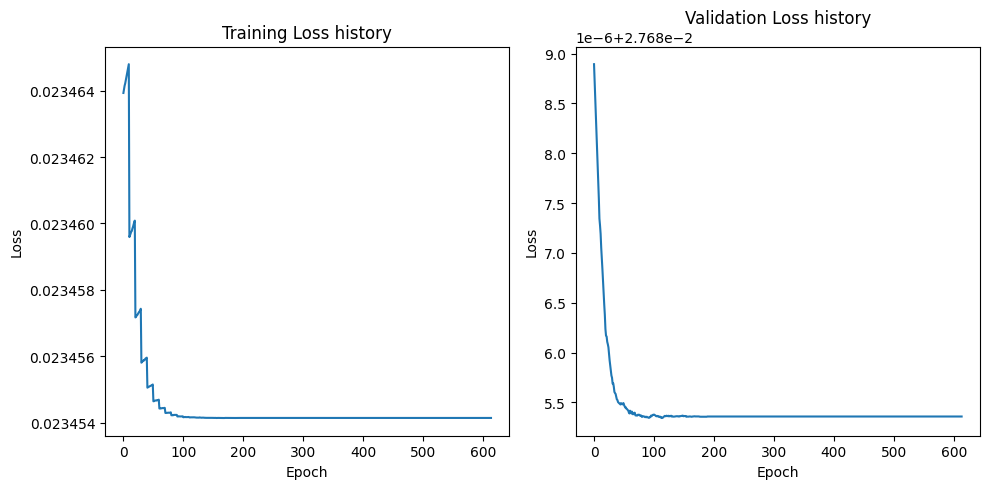

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4641, Train Loss: 918.2455841064453, Validation Loss: 775.3931762695313
Epoch 101/4641, Train Loss: 0.02451049257069826, Validation Loss: 0.028084531798958777
Epoch 201/4641, Train Loss: 0.024498824216425418, Validation Loss: 0.028080670908093453
Epoch 301/4641, Train Loss: 0.024498800886794923, Validation Loss: 0.028080689534544945
Epoch 401/4641, Train Loss: 0.024498801166191696, Validation Loss: 0.028080689534544945
Epoch 501/4641, Train Loss: 0.024498801166191696, Validation Loss: 0.028080689534544945
Epoch 601/4641, Train Loss: 0.024498801166191696, Validation Loss: 0.028080689534544945
Early stopping triggered.


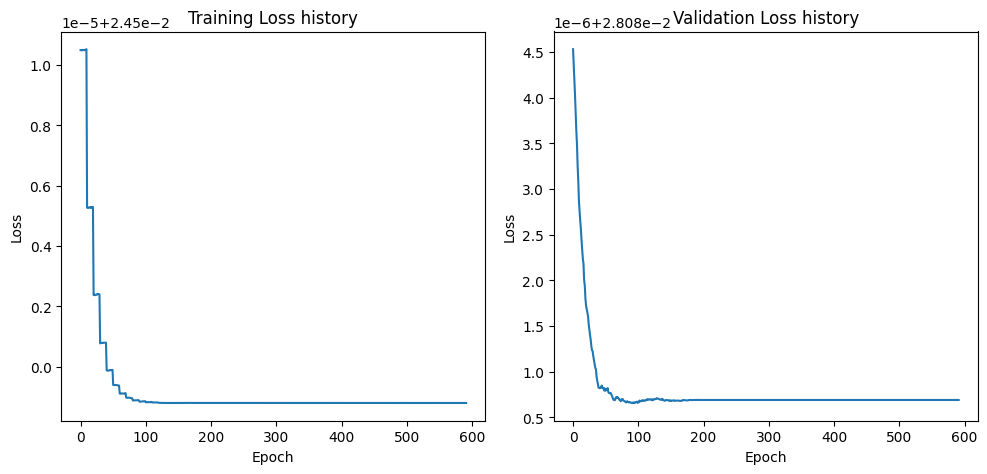

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4641, Train Loss: 131.8153896331787, Validation Loss: 119.82310791015625
Epoch 101/4641, Train Loss: 0.14241915177553893, Validation Loss: 0.14835918918251992
Epoch 201/4641, Train Loss: 0.14129576524719595, Validation Loss: 0.1468905307352543
Epoch 301/4641, Train Loss: 0.14129491308704017, Validation Loss: 0.1468897931277752
Epoch 401/4641, Train Loss: 0.14129491308704017, Validation Loss: 0.1468897931277752
Epoch 501/4641, Train Loss: 0.14129491308704017, Validation Loss: 0.1468897931277752
Epoch 601/4641, Train Loss: 0.14129491308704017, Validation Loss: 0.1468897931277752
Epoch 701/4641, Train Loss: 0.14129491308704017, Validation Loss: 0.1468897931277752
Early stopping triggered.


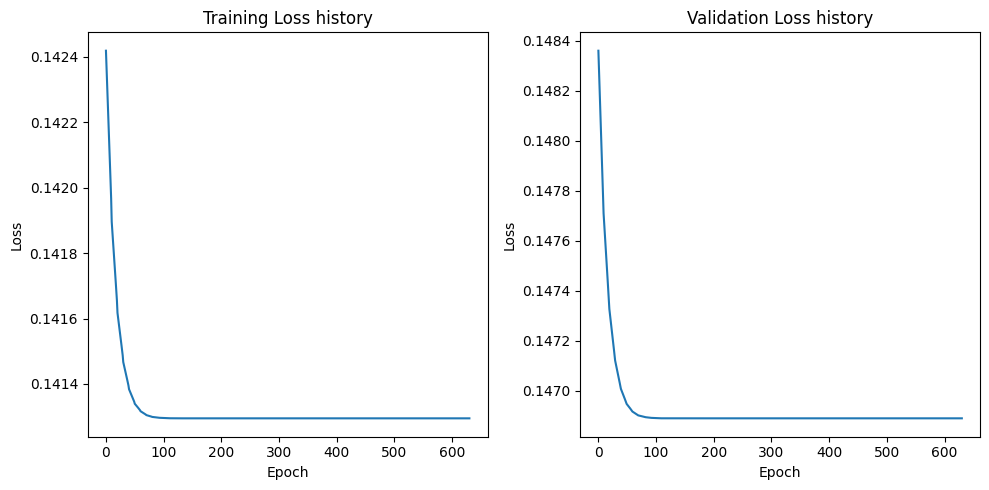

[I 2023-10-11 08:52:22,636] Trial 81 finished with value: 0.2292497605085373 and parameters: {'hidden_layers': 1, 'epochs': 4641, 'batch_size': 130, 'learning_rate': 0.046104296188997314}. Best is trial 79 with value: 0.17022700607776642.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4492, Train Loss: 1016.3298114977384, Validation Loss: 988.7075927734375
Epoch 101/4492, Train Loss: 0.028556446789910917, Validation Loss: 0.03375358358025551
Epoch 201/4492, Train Loss: 0.02813522635321868, Validation Loss: 0.033320352435112
Epoch 301/4492, Train Loss: 0.028135205913139016, Validation Loss: 0.03332023620605469
Epoch 401/4492, Train Loss: 0.028135205913139016, Validation Loss: 0.03332023620605469
Epoch 501/4492, Train Loss: 0.028135205913139016, Validation Loss: 0.03332023620605469
Epoch 601/4492, Train Loss: 0.028135205913139016, Validation Loss: 0.03332023620605469
Epoch 701/4492, Train Loss: 0.028135205913139016, Validation Loss: 0.03332023620605469
Early stopping triggered.


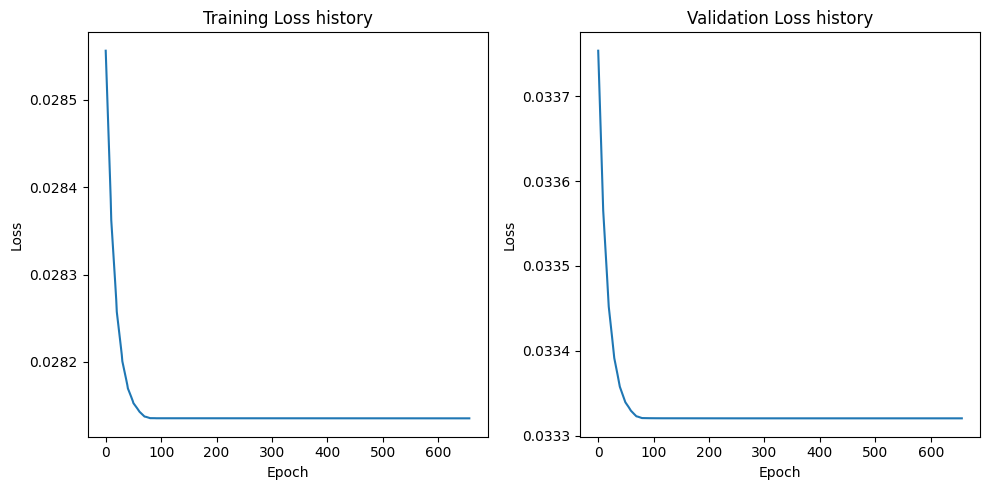

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4492, Train Loss: 1021.205322265625, Validation Loss: 998.965966796875
Epoch 101/4492, Train Loss: 0.02472635255636353, Validation Loss: 0.028605709597468377
Epoch 201/4492, Train Loss: 0.024691301250928326, Validation Loss: 0.028565848618745802
Epoch 301/4492, Train Loss: 0.024691279144271425, Validation Loss: 0.028565843775868415
Epoch 401/4492, Train Loss: 0.024691278752135604, Validation Loss: 0.028565843775868415
Epoch 501/4492, Train Loss: 0.024691278752135604, Validation Loss: 0.028565843775868415
Epoch 601/4492, Train Loss: 0.024691278752135604, Validation Loss: 0.028565843775868415
Early stopping triggered.


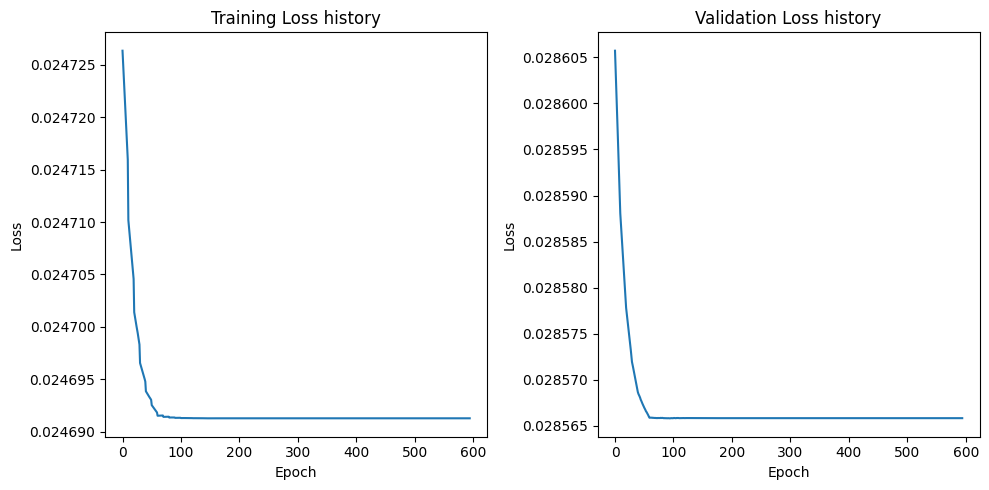

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4492, Train Loss: 127.8025709453382, Validation Loss: 99.05143737792969
Epoch 101/4492, Train Loss: 0.11866991966962814, Validation Loss: 0.14795276671648025
Epoch 201/4492, Train Loss: 0.11828679571810521, Validation Loss: 0.14733111560344697
Epoch 301/4492, Train Loss: 0.11828668552793954, Validation Loss: 0.14733101949095725
Epoch 401/4492, Train Loss: 0.11828668552793954, Validation Loss: 0.14733101949095725
Epoch 501/4492, Train Loss: 0.11828668552793954, Validation Loss: 0.14733101949095725
Epoch 601/4492, Train Loss: 0.11828668552793954, Validation Loss: 0.14733101949095725
Epoch 701/4492, Train Loss: 0.11828668552793954, Validation Loss: 0.14733101949095725
Early stopping triggered.


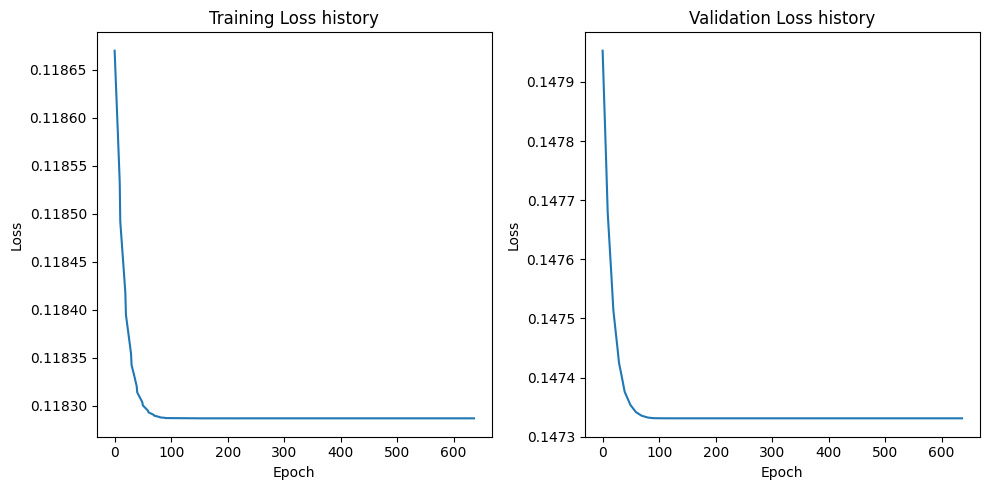

[I 2023-10-11 08:53:47,418] Trial 82 finished with value: 0.21501310169696808 and parameters: {'hidden_layers': 1, 'epochs': 4492, 'batch_size': 135, 'learning_rate': 0.040862678675450514}. Best is trial 79 with value: 0.17022700607776642.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4700, Train Loss: 973.7263826069079, Validation Loss: 945.7922485351562
Epoch 101/4700, Train Loss: 0.02515199354016467, Validation Loss: 0.030067351087927817
Epoch 201/4700, Train Loss: 0.02500640796987634, Validation Loss: 0.029876986145973207
Epoch 301/4700, Train Loss: 0.02500637968708026, Validation Loss: 0.02987687960267067
Epoch 401/4700, Train Loss: 0.02500637968708026, Validation Loss: 0.02987687960267067
Epoch 501/4700, Train Loss: 0.02500637968708026, Validation Loss: 0.02987687960267067
Epoch 601/4700, Train Loss: 0.02500637968708026, Validation Loss: 0.02987687960267067
Epoch 701/4700, Train Loss: 0.02500637968708026, Validation Loss: 0.02987687960267067
Early stopping triggered.


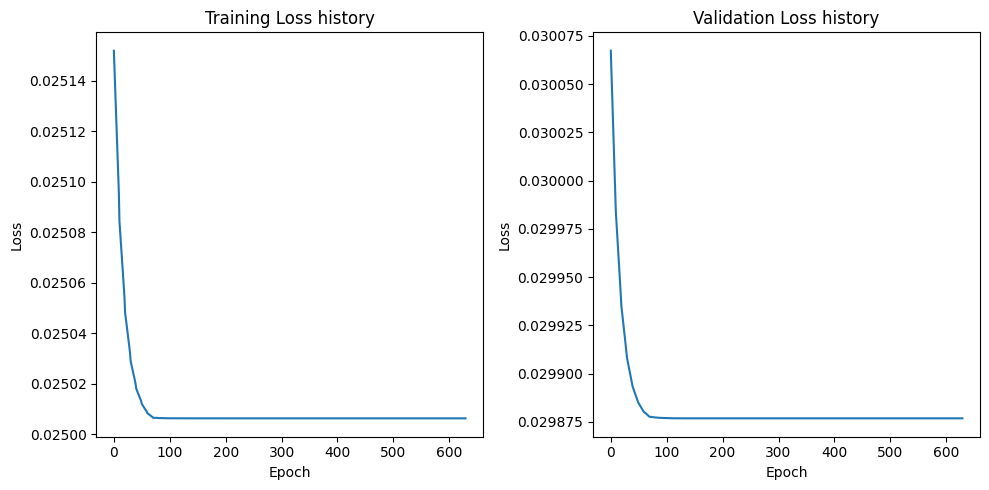

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4700, Train Loss: 1010.2683812191611, Validation Loss: 985.1481323242188
Epoch 101/4700, Train Loss: 1.5648770504876186, Validation Loss: 2.133940701186657
Epoch 201/4700, Train Loss: 1.4080785050203926, Validation Loss: 2.0221938103437425
Epoch 301/4700, Train Loss: 1.4079519569089538, Validation Loss: 2.0221056535840036
Epoch 401/4700, Train Loss: 1.4079519569089538, Validation Loss: 2.0221056297421454
Epoch 501/4700, Train Loss: 1.4079519569089538, Validation Loss: 2.0221056297421454
Epoch 601/4700, Train Loss: 1.4079519569089538, Validation Loss: 2.0221056297421454
Epoch 701/4700, Train Loss: 1.4079519569089538, Validation Loss: 2.0221056297421454
Early stopping triggered.


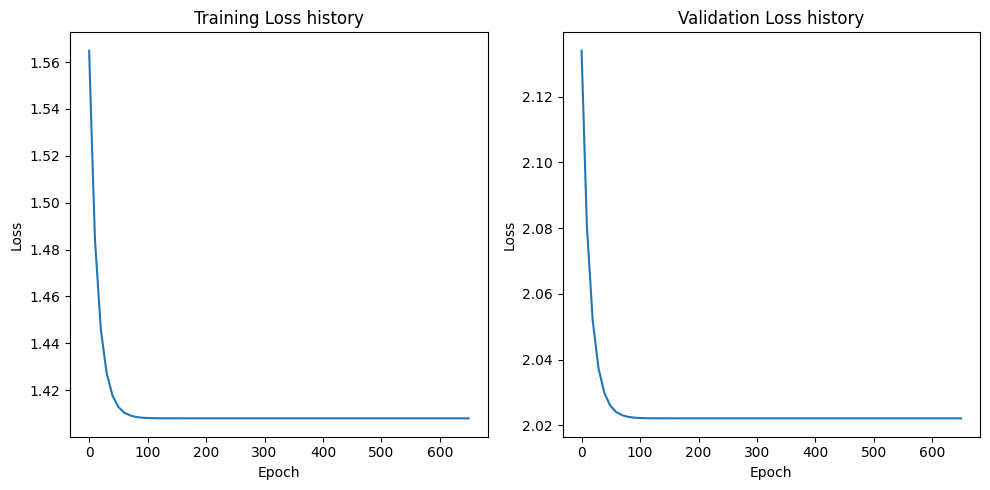

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4700, Train Loss: 117.23281278108296, Validation Loss: 101.84661254882812
Epoch 101/4700, Train Loss: 0.042108939764531034, Validation Loss: 0.04451920911669731
Epoch 201/4700, Train Loss: 0.04208751424754921, Validation Loss: 0.0445031613111496
Epoch 301/4700, Train Loss: 0.042087473857559655, Validation Loss: 0.044503170251846316
Epoch 401/4700, Train Loss: 0.042087473857559655, Validation Loss: 0.044503170251846316
Epoch 501/4700, Train Loss: 0.042087473857559655, Validation Loss: 0.044503170251846316
Epoch 601/4700, Train Loss: 0.042087473857559655, Validation Loss: 0.044503170251846316
Epoch 701/4700, Train Loss: 0.042087473857559655, Validation Loss: 0.044503170251846316
Early stopping triggered.


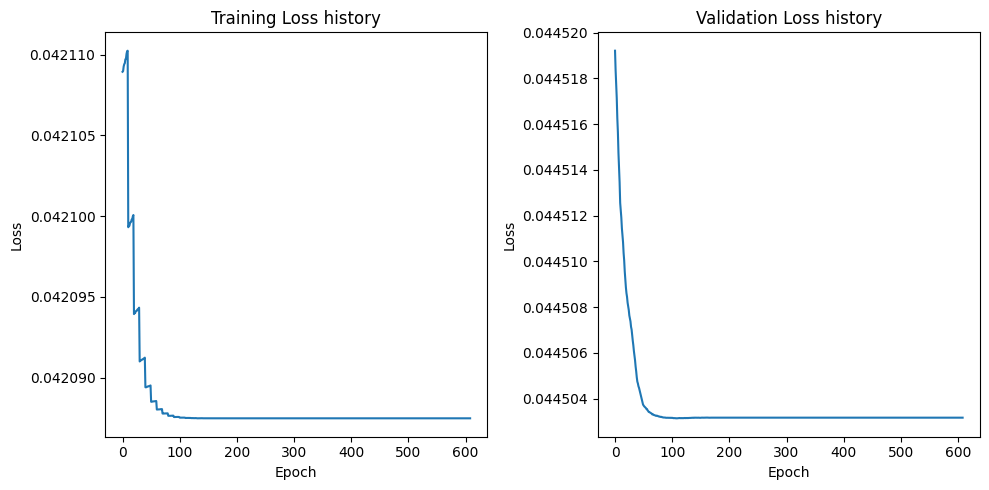

[I 2023-10-11 08:55:10,968] Trial 83 finished with value: 0.5589931607246399 and parameters: {'hidden_layers': 1, 'epochs': 4700, 'batch_size': 138, 'learning_rate': 0.03923620042862476}. Best is trial 79 with value: 0.17022700607776642.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4708, Train Loss: 941.3833574567523, Validation Loss: 848.3365783691406
Epoch 101/4708, Train Loss: 0.023614637088030577, Validation Loss: 0.02822718396782875
Epoch 201/4708, Train Loss: 0.023604400056813444, Validation Loss: 0.028227183502167463
Epoch 301/4708, Train Loss: 0.023604385488267456, Validation Loss: 0.028227202594280243
Epoch 401/4708, Train Loss: 0.023604385488267456, Validation Loss: 0.028227202594280243
Epoch 501/4708, Train Loss: 0.023604385488267456, Validation Loss: 0.028227202594280243
Epoch 601/4708, Train Loss: 0.023604385488267456, Validation Loss: 0.028227202594280243
Early stopping triggered.


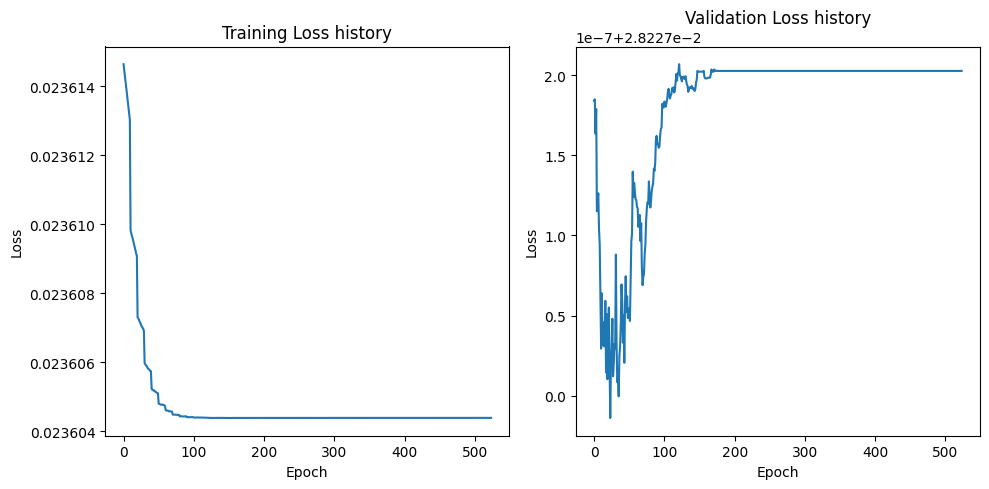

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4708, Train Loss: 900.7347281319754, Validation Loss: 798.9590148925781
Epoch 101/4708, Train Loss: 0.02950825429122363, Validation Loss: 0.03312578285112977
Epoch 201/4708, Train Loss: 0.029169797897338867, Validation Loss: 0.032804181799292564
Epoch 301/4708, Train Loss: 0.029169758715267693, Validation Loss: 0.03280407143756747
Epoch 401/4708, Train Loss: 0.029169758449175527, Validation Loss: 0.03280407143756747
Epoch 501/4708, Train Loss: 0.029169758449175527, Validation Loss: 0.03280407143756747
Epoch 601/4708, Train Loss: 0.029169758449175527, Validation Loss: 0.03280407143756747
Epoch 701/4708, Train Loss: 0.029169758449175527, Validation Loss: 0.03280407143756747
Early stopping triggered.


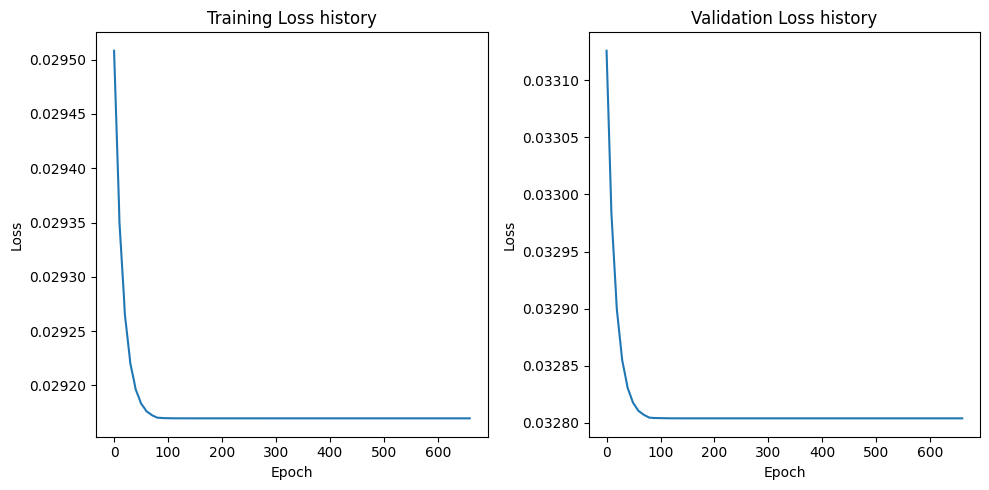

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4708, Train Loss: 142.202946799142, Validation Loss: 132.7736587524414
Epoch 101/4708, Train Loss: 0.19841580651700497, Validation Loss: 0.1922013694420457
Epoch 201/4708, Train Loss: 0.19571461821241037, Validation Loss: 0.18957610242068768
Epoch 301/4708, Train Loss: 0.19571277871727943, Validation Loss: 0.1895743915811181
Epoch 401/4708, Train Loss: 0.19571277871727943, Validation Loss: 0.1895743915811181
Epoch 501/4708, Train Loss: 0.19571277871727943, Validation Loss: 0.1895743915811181
Epoch 601/4708, Train Loss: 0.19571277871727943, Validation Loss: 0.1895743915811181
Epoch 701/4708, Train Loss: 0.19571277871727943, Validation Loss: 0.1895743915811181
Early stopping triggered.


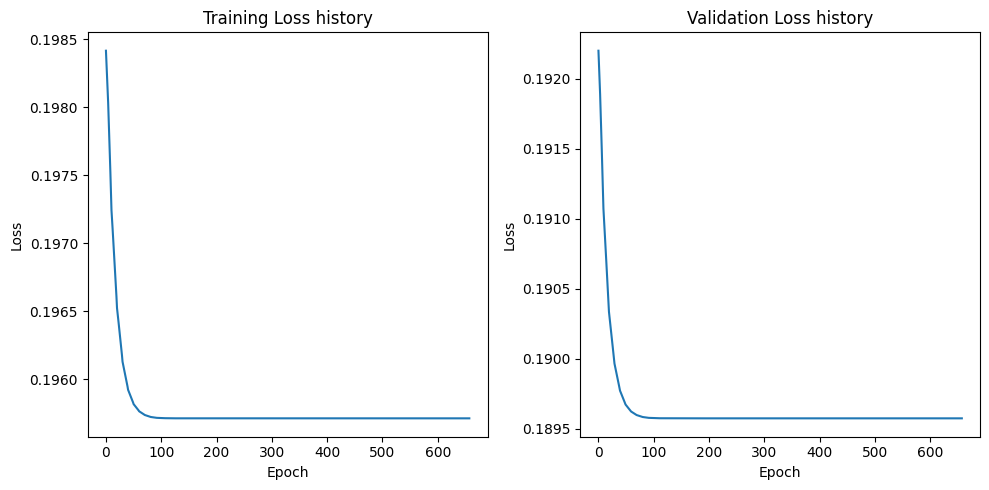

[I 2023-10-11 08:56:28,357] Trial 84 finished with value: 0.25438353419303894 and parameters: {'hidden_layers': 1, 'epochs': 4708, 'batch_size': 189, 'learning_rate': 0.0417855680855601}. Best is trial 79 with value: 0.17022700607776642.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4627, Train Loss: 986.4272664388021, Validation Loss: 1004.8081970214844
Epoch 101/4627, Train Loss: 456.5766194661458, Validation Loss: 501.7785949707031
Epoch 201/4627, Train Loss: 456.3535664876302, Validation Loss: 501.58294677734375
Epoch 301/4627, Train Loss: 456.35353597005206, Validation Loss: 501.5829315185547
Epoch 401/4627, Train Loss: 456.35353597005206, Validation Loss: 501.5829315185547
Epoch 501/4627, Train Loss: 456.35353597005206, Validation Loss: 501.5829315185547
Epoch 601/4627, Train Loss: 456.35353597005206, Validation Loss: 501.5829315185547
Early stopping triggered.


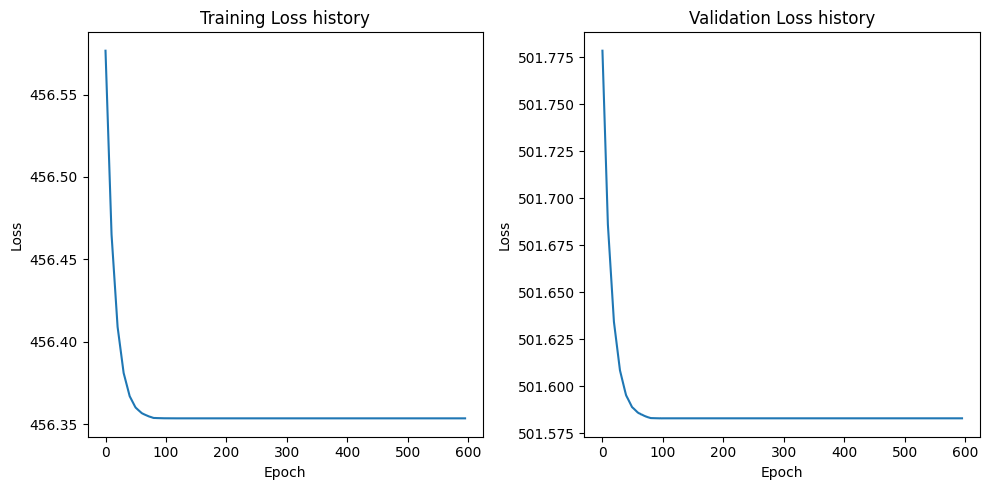

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4627, Train Loss: 1030.8611246744792, Validation Loss: 1052.317138671875
Epoch 101/4627, Train Loss: 499.9157206217448, Validation Loss: 543.3067626953125
Epoch 201/4627, Train Loss: 499.6824442545573, Validation Loss: 543.1363983154297
Epoch 301/4627, Train Loss: 499.6824493408203, Validation Loss: 543.1363830566406
Epoch 401/4627, Train Loss: 499.6824493408203, Validation Loss: 543.1363830566406
Epoch 501/4627, Train Loss: 499.6824493408203, Validation Loss: 543.1363830566406
Epoch 601/4627, Train Loss: 499.6824493408203, Validation Loss: 543.1363830566406
Early stopping triggered.


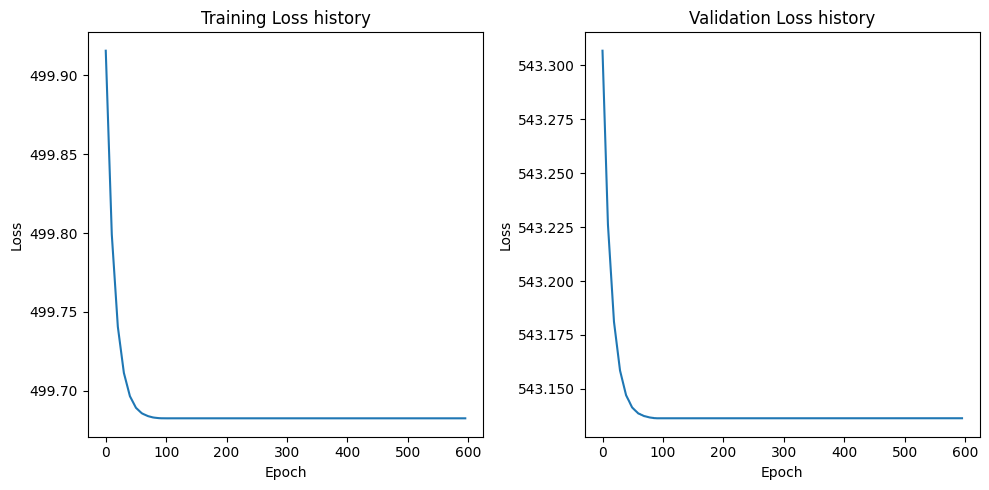

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4627, Train Loss: 137.5275847117106, Validation Loss: 136.12471771240234
Epoch 101/4627, Train Loss: 42.94846248626709, Validation Loss: 51.37148857116699
Epoch 201/4627, Train Loss: 42.89755916595459, Validation Loss: 51.32287788391113
Epoch 301/4627, Train Loss: 42.89755344390869, Validation Loss: 51.3228816986084
Epoch 401/4627, Train Loss: 42.89755344390869, Validation Loss: 51.3228816986084
Epoch 501/4627, Train Loss: 42.89755344390869, Validation Loss: 51.3228816986084
Epoch 601/4627, Train Loss: 42.89755344390869, Validation Loss: 51.3228816986084
Epoch 701/4627, Train Loss: 42.89755344390869, Validation Loss: 51.3228816986084
Early stopping triggered.


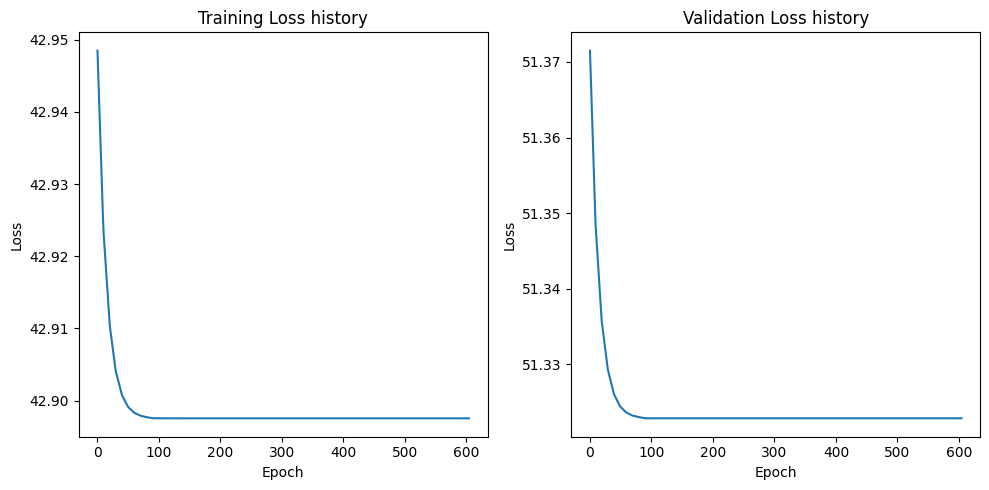

[I 2023-10-11 08:57:27,801] Trial 85 finished with value: 16.84562873840332 and parameters: {'hidden_layers': 1, 'epochs': 4627, 'batch_size': 441, 'learning_rate': 0.019031441065336826}. Best is trial 79 with value: 0.17022700607776642.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4798, Train Loss: 1031.2387084960938, Validation Loss: 1010.903076171875
Epoch 101/4798, Train Loss: 395.3854205791767, Validation Loss: 425.55018615722656
Epoch 201/4798, Train Loss: 395.14432232196515, Validation Loss: 425.34297943115234
Epoch 301/4798, Train Loss: 395.14431527944714, Validation Loss: 425.3429946899414
Epoch 401/4798, Train Loss: 395.14431527944714, Validation Loss: 425.3429946899414
Epoch 501/4798, Train Loss: 395.14431527944714, Validation Loss: 425.3429946899414
Epoch 601/4798, Train Loss: 395.14431527944714, Validation Loss: 425.3429946899414
Early stopping triggered.


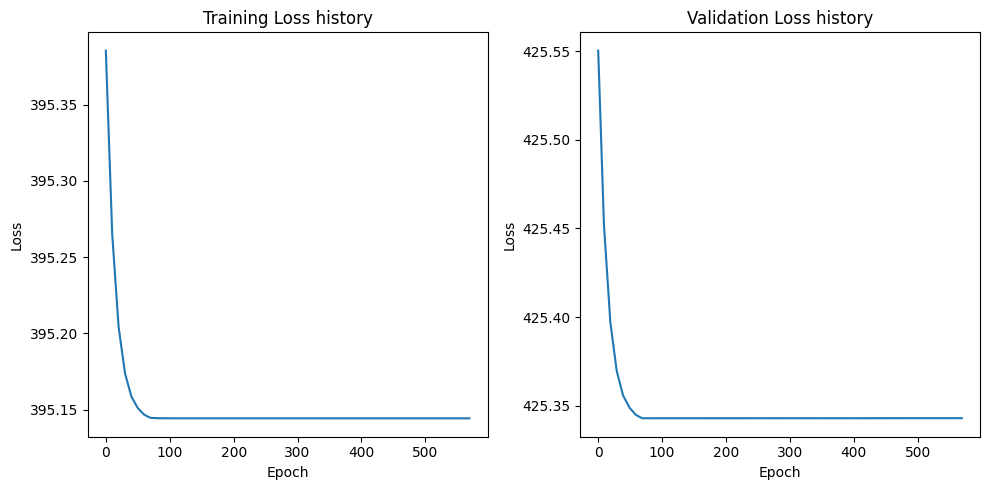

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4798, Train Loss: 1018.9677969125601, Validation Loss: 1016.0286102294922
Epoch 101/4798, Train Loss: 801.5816556490385, Validation Loss: 811.0172729492188
Epoch 201/4798, Train Loss: 801.3907189002404, Validation Loss: 810.8300628662109
Epoch 301/4798, Train Loss: 801.3907189002404, Validation Loss: 810.8300628662109
Epoch 401/4798, Train Loss: 801.3907189002404, Validation Loss: 810.8300628662109
Epoch 501/4798, Train Loss: 801.3907189002404, Validation Loss: 810.8300628662109
Epoch 601/4798, Train Loss: 801.3907189002404, Validation Loss: 810.8300628662109
Early stopping triggered.


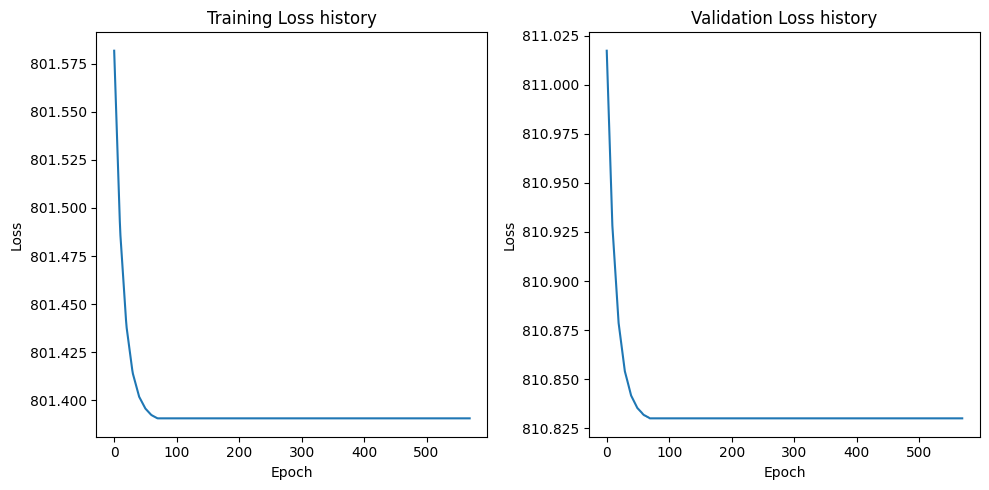

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4798, Train Loss: 122.05320563683144, Validation Loss: 118.82901763916016
Epoch 101/4798, Train Loss: 60.95068124624399, Validation Loss: 60.60177040100098
Epoch 201/4798, Train Loss: 60.902805695166954, Validation Loss: 60.55479431152344
Epoch 301/4798, Train Loss: 60.902805695166954, Validation Loss: 60.55479431152344
Epoch 401/4798, Train Loss: 60.902805695166954, Validation Loss: 60.55479431152344
Epoch 501/4798, Train Loss: 60.902805695166954, Validation Loss: 60.55479431152344
Epoch 601/4798, Train Loss: 60.902805695166954, Validation Loss: 60.55479431152344
Early stopping triggered.


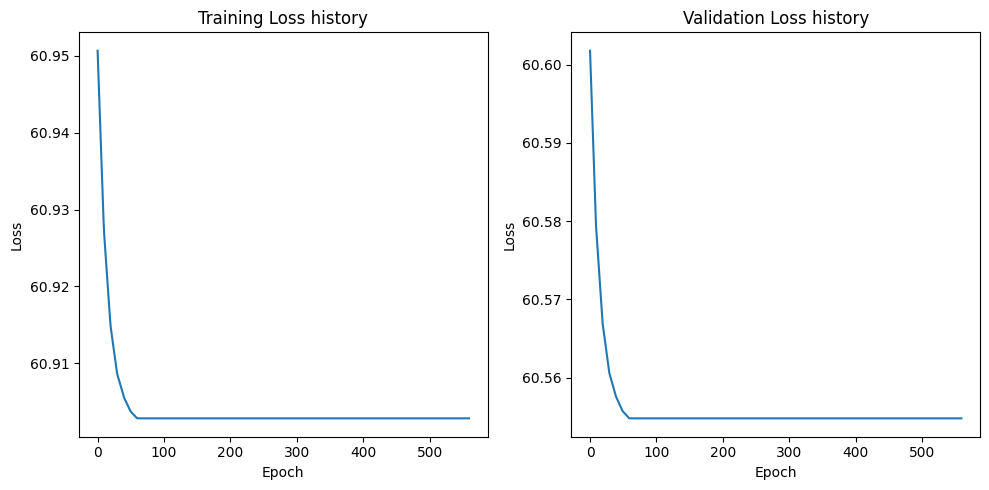

[I 2023-10-11 08:58:37,790] Trial 86 finished with value: 18.661325454711914 and parameters: {'hidden_layers': 1, 'epochs': 4798, 'batch_size': 193, 'learning_rate': 0.013913835807646347}. Best is trial 79 with value: 0.17022700607776642.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4296, Train Loss: 990.0310872395834, Validation Loss: 974.218994140625
Epoch 101/4296, Train Loss: 883.6618448893229, Validation Loss: 884.1868896484375
Epoch 201/4296, Train Loss: 883.5830688476562, Validation Loss: 884.1107177734375
Epoch 301/4296, Train Loss: 883.5830688476562, Validation Loss: 884.1107177734375
Epoch 401/4296, Train Loss: 883.5830688476562, Validation Loss: 884.1107177734375
Epoch 501/4296, Train Loss: 883.5830688476562, Validation Loss: 884.1107177734375
Epoch 601/4296, Train Loss: 883.5830688476562, Validation Loss: 884.1107177734375
Early stopping triggered.


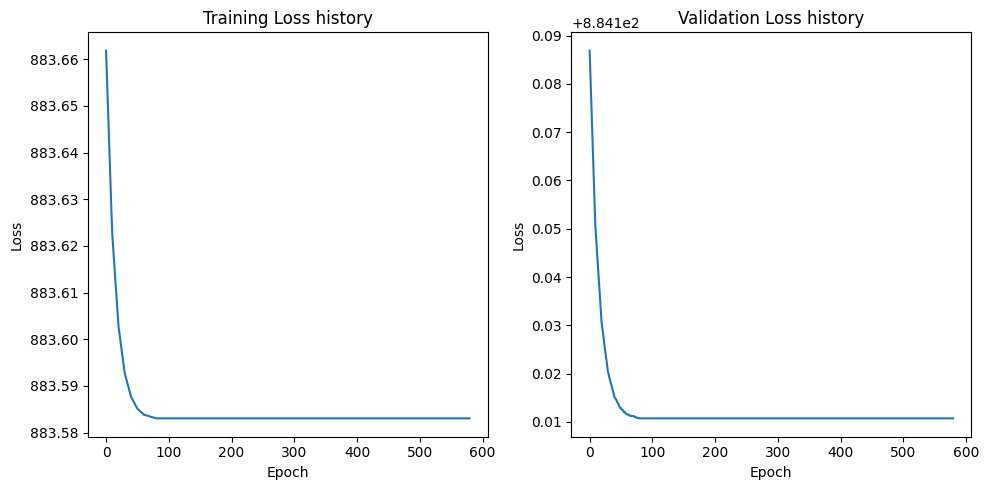

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4296, Train Loss: 1057.8543090820312, Validation Loss: 1046.730224609375
Epoch 101/4296, Train Loss: 957.6787109375, Validation Loss: 958.1005859375
Epoch 201/4296, Train Loss: 957.5964558919271, Validation Loss: 958.02099609375
Epoch 301/4296, Train Loss: 957.5964558919271, Validation Loss: 958.02099609375
Epoch 401/4296, Train Loss: 957.5964558919271, Validation Loss: 958.02099609375
Epoch 501/4296, Train Loss: 957.5964558919271, Validation Loss: 958.02099609375
Epoch 601/4296, Train Loss: 957.5964558919271, Validation Loss: 958.02099609375
Early stopping triggered.


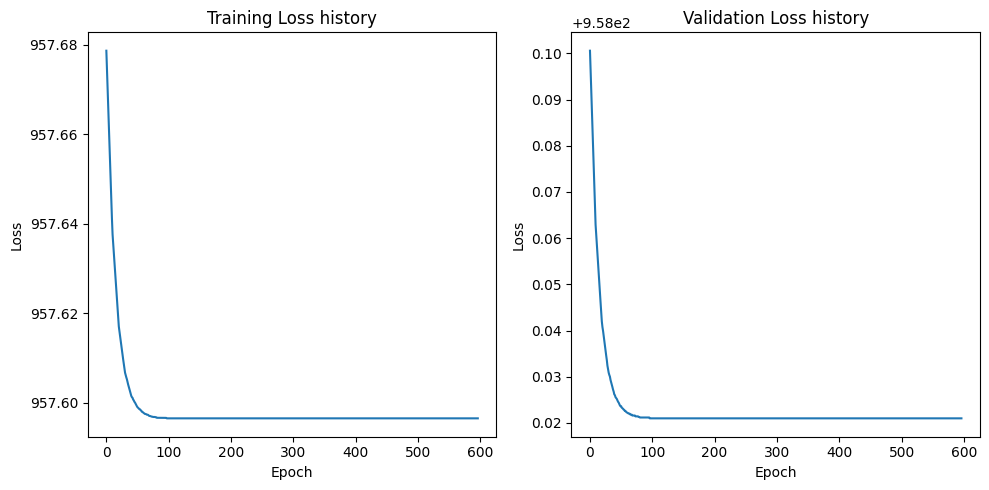

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4296, Train Loss: 152.7522201538086, Validation Loss: 147.20742797851562
Epoch 101/4296, Train Loss: 66.26008478800456, Validation Loss: 72.06696319580078
Epoch 201/4296, Train Loss: 66.22405751546223, Validation Loss: 72.03638458251953
Epoch 301/4296, Train Loss: 66.22405751546223, Validation Loss: 72.03638458251953
Epoch 401/4296, Train Loss: 66.22405751546223, Validation Loss: 72.03638458251953
Epoch 501/4296, Train Loss: 66.22405751546223, Validation Loss: 72.03638458251953
Epoch 601/4296, Train Loss: 66.22405751546223, Validation Loss: 72.03638458251953
Early stopping triggered.


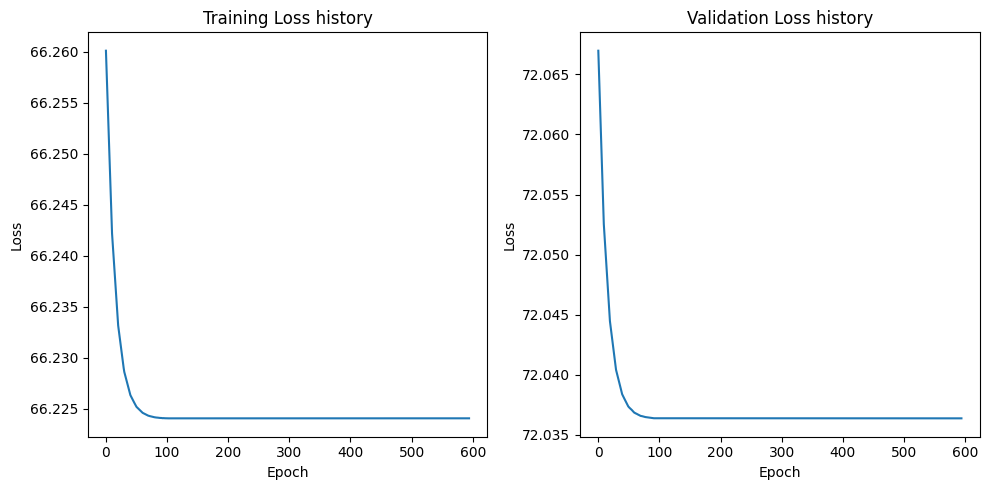

[I 2023-10-11 08:59:32,610] Trial 87 finished with value: 22.986770629882812 and parameters: {'hidden_layers': 1, 'epochs': 4296, 'batch_size': 868, 'learning_rate': 0.02338367785115201}. Best is trial 79 with value: 0.17022700607776642.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4518, Train Loss: 986.8055530894886, Validation Loss: 984.6525472005209
Epoch 101/4518, Train Loss: 36.31488128141923, Validation Loss: 46.882516860961914
Epoch 201/4518, Train Loss: 35.73614848743785, Validation Loss: 46.27166557312012
Epoch 301/4518, Train Loss: 35.735960873690516, Validation Loss: 46.27140363057455
Epoch 401/4518, Train Loss: 35.73596091703935, Validation Loss: 46.271402994791664
Epoch 501/4518, Train Loss: 35.73596091703935, Validation Loss: 46.271402994791664
Epoch 601/4518, Train Loss: 35.73596091703935, Validation Loss: 46.271402994791664
Epoch 701/4518, Train Loss: 35.73596091703935, Validation Loss: 46.271402994791664
Early stopping triggered.


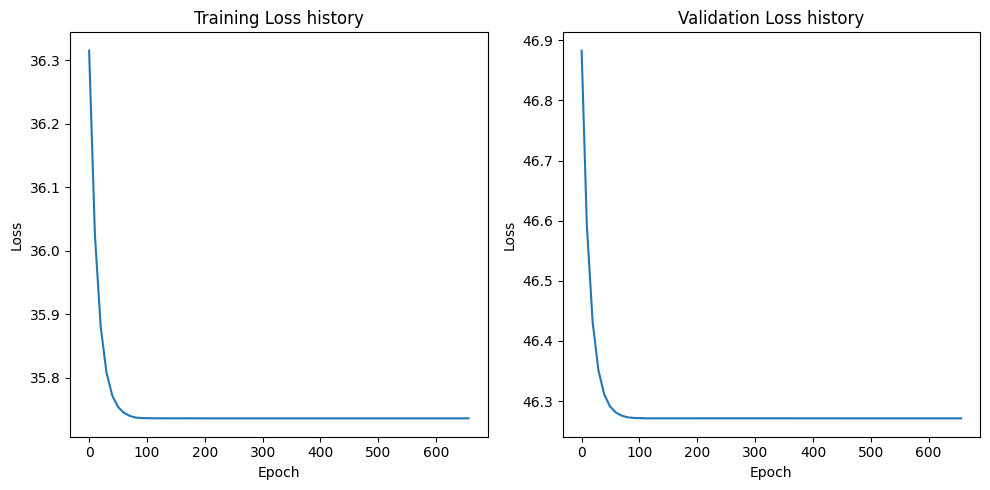

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4518, Train Loss: 965.7303189364346, Validation Loss: 964.58544921875
Epoch 101/4518, Train Loss: 43.44345701824535, Validation Loss: 64.27198441823323
Epoch 201/4518, Train Loss: 43.10085654258728, Validation Loss: 63.77172692616781
Epoch 301/4518, Train Loss: 43.10077181729403, Validation Loss: 63.7715212504069
Epoch 401/4518, Train Loss: 43.10077181729403, Validation Loss: 63.7715212504069
Epoch 501/4518, Train Loss: 43.10077181729403, Validation Loss: 63.7715212504069
Epoch 601/4518, Train Loss: 43.10077181729403, Validation Loss: 63.7715212504069
Epoch 701/4518, Train Loss: 43.10077181729403, Validation Loss: 63.7715212504069
Early stopping triggered.


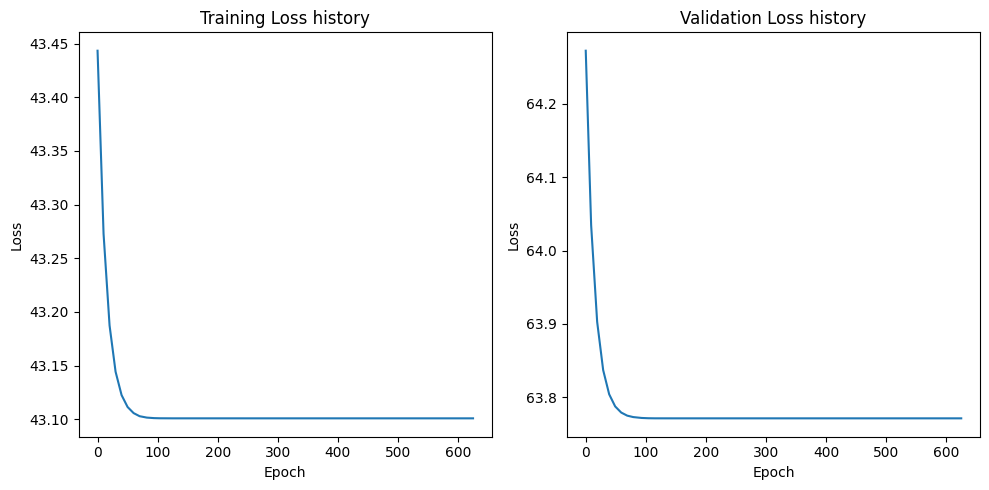

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4518, Train Loss: 137.49473849209872, Validation Loss: 134.85236612955728
Epoch 101/4518, Train Loss: 0.7429122846912254, Validation Loss: 0.8956101834774017
Epoch 201/4518, Train Loss: 0.7331421937454831, Validation Loss: 0.8792064736286799
Epoch 301/4518, Train Loss: 0.7331362752751871, Validation Loss: 0.8791927794615427
Epoch 401/4518, Train Loss: 0.733136276629838, Validation Loss: 0.8791927794615427
Epoch 501/4518, Train Loss: 0.733136276629838, Validation Loss: 0.8791927794615427
Epoch 601/4518, Train Loss: 0.733136276629838, Validation Loss: 0.8791927794615427
Epoch 701/4518, Train Loss: 0.733136276629838, Validation Loss: 0.8791927794615427
Early stopping triggered.


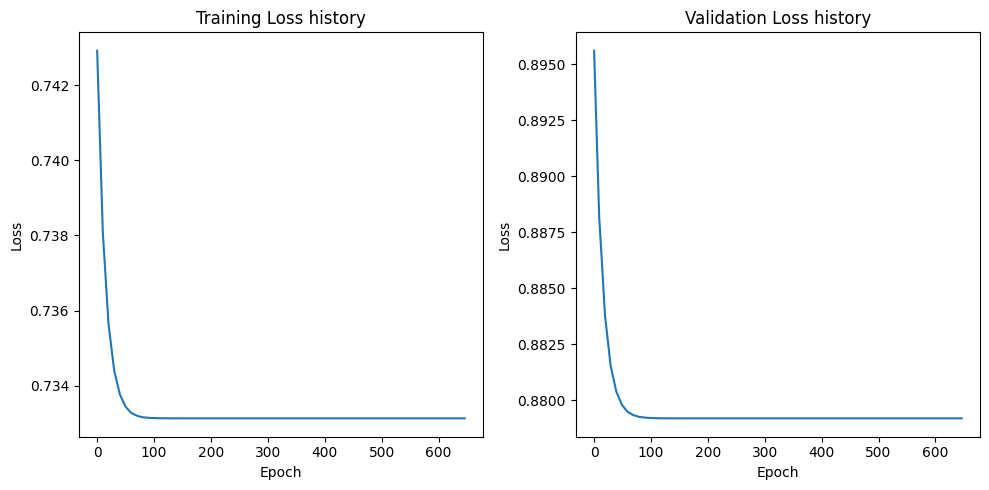

[I 2023-10-11 09:00:44,010] Trial 88 finished with value: 4.55167818069458 and parameters: {'hidden_layers': 1, 'epochs': 4518, 'batch_size': 237, 'learning_rate': 0.03896272601920985}. Best is trial 79 with value: 0.17022700607776642.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4736, Train Loss: 875.8238627115885, Validation Loss: 718.9289428710938
Epoch 101/4736, Train Loss: 0.02356043266546395, Validation Loss: 0.028326581791043283
Epoch 201/4736, Train Loss: 0.023546567652374506, Validation Loss: 0.0283106904476881
Epoch 301/4736, Train Loss: 0.023546543231026992, Validation Loss: 0.028310669213533403
Epoch 401/4736, Train Loss: 0.023546543437987566, Validation Loss: 0.028310669213533403
Epoch 501/4736, Train Loss: 0.023546543437987566, Validation Loss: 0.028310669213533403
Epoch 601/4736, Train Loss: 0.023546543437987566, Validation Loss: 0.028310669213533403
Epoch 701/4736, Train Loss: 0.023546543437987566, Validation Loss: 0.028310669213533403
Early stopping triggered.


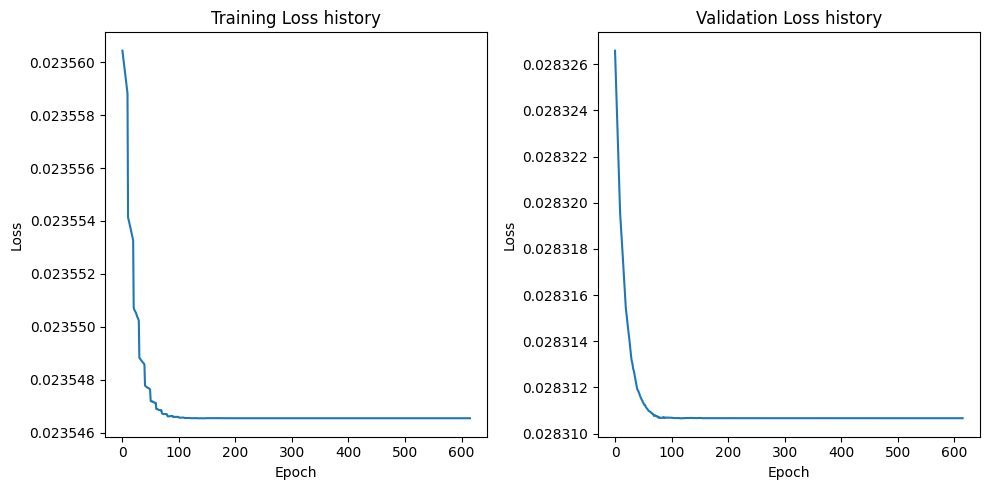

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4736, Train Loss: 899.1797756618923, Validation Loss: 778.7155517578125
Epoch 101/4736, Train Loss: 0.024555286185608968, Validation Loss: 0.027312996983528137
Epoch 201/4736, Train Loss: 0.024540826885236636, Validation Loss: 0.027303170785307883
Epoch 301/4736, Train Loss: 0.024540810690571863, Validation Loss: 0.027303196117281915
Epoch 401/4736, Train Loss: 0.024540810690571863, Validation Loss: 0.027303196117281915
Epoch 501/4736, Train Loss: 0.024540810690571863, Validation Loss: 0.027303196117281915
Epoch 601/4736, Train Loss: 0.024540810690571863, Validation Loss: 0.027303196117281915
Early stopping triggered.


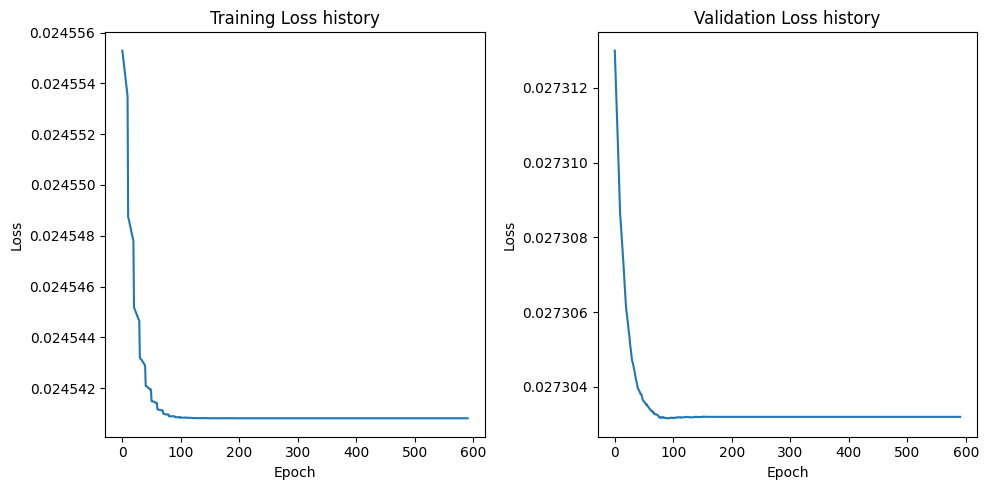

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4736, Train Loss: 88.13766394721137, Validation Loss: 119.2219482421875
Epoch 101/4736, Train Loss: 0.05469693202111456, Validation Loss: 0.05046282857656479
Epoch 201/4736, Train Loss: 0.05465610801345772, Validation Loss: 0.05043102204799652
Epoch 301/4736, Train Loss: 0.054656057722038694, Validation Loss: 0.05043099820613861
Epoch 401/4736, Train Loss: 0.054656057722038694, Validation Loss: 0.05043099820613861
Epoch 501/4736, Train Loss: 0.054656057722038694, Validation Loss: 0.05043099820613861
Epoch 601/4736, Train Loss: 0.054656057722038694, Validation Loss: 0.05043099820613861
Epoch 701/4736, Train Loss: 0.054656057722038694, Validation Loss: 0.05043099820613861
Early stopping triggered.


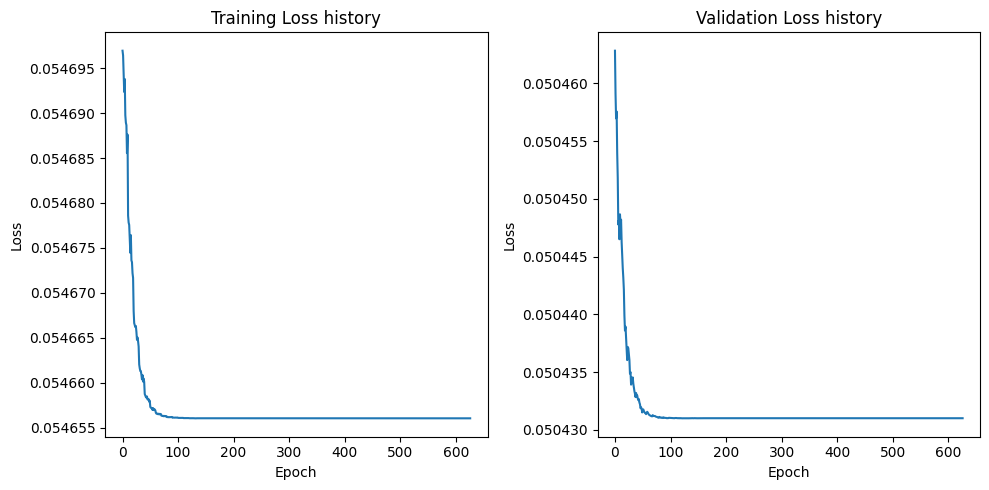

[I 2023-10-11 09:02:05,173] Trial 89 finished with value: 0.18682551383972168 and parameters: {'hidden_layers': 1, 'epochs': 4736, 'batch_size': 145, 'learning_rate': 0.05578362945725344}. Best is trial 79 with value: 0.17022700607776642.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4772, Train Loss: 951.7512925091912, Validation Loss: 886.3825439453125
Epoch 101/4772, Train Loss: 0.3934091434759252, Validation Loss: 0.4353135138750076
Epoch 201/4772, Train Loss: 0.3737932487445719, Validation Loss: 0.4138715982437134
Epoch 301/4772, Train Loss: 0.3737754269557841, Validation Loss: 0.4138498902320862
Epoch 401/4772, Train Loss: 0.3737754234496285, Validation Loss: 0.4138498902320862
Epoch 501/4772, Train Loss: 0.3737754234496285, Validation Loss: 0.4138498902320862
Epoch 601/4772, Train Loss: 0.3737754234496285, Validation Loss: 0.4138498902320862
Epoch 701/4772, Train Loss: 0.3737754234496285, Validation Loss: 0.4138498902320862
Early stopping triggered.


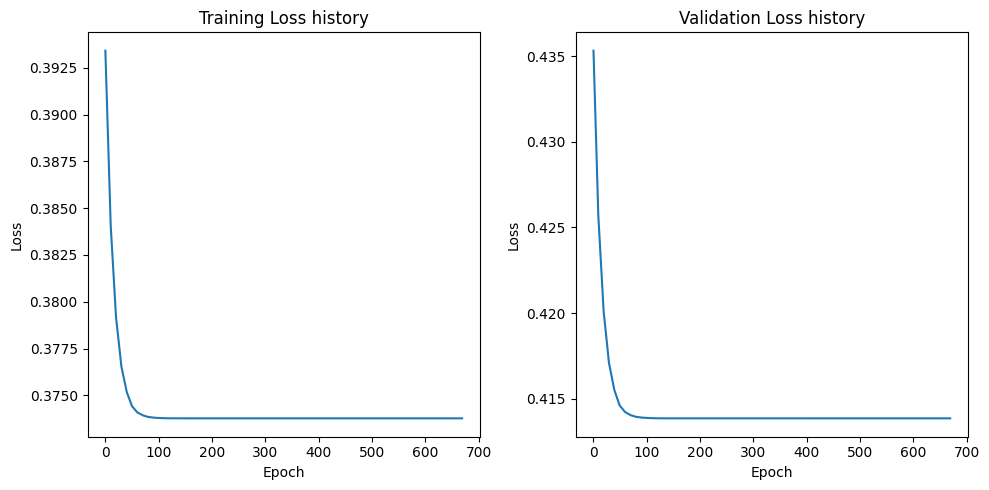

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4772, Train Loss: 962.800932042739, Validation Loss: 885.8695678710938
Epoch 101/4772, Train Loss: 0.8830364740946713, Validation Loss: 1.2875005424022674
Epoch 201/4772, Train Loss: 0.8325007224784178, Validation Loss: 1.208200842142105
Epoch 301/4772, Train Loss: 0.8324667040039512, Validation Loss: 1.208121556043625
Epoch 401/4772, Train Loss: 0.83246670488049, Validation Loss: 1.208121556043625
Epoch 501/4772, Train Loss: 0.83246670488049, Validation Loss: 1.208121556043625
Epoch 601/4772, Train Loss: 0.83246670488049, Validation Loss: 1.208121556043625
Epoch 701/4772, Train Loss: 0.83246670488049, Validation Loss: 1.208121556043625
Early stopping triggered.


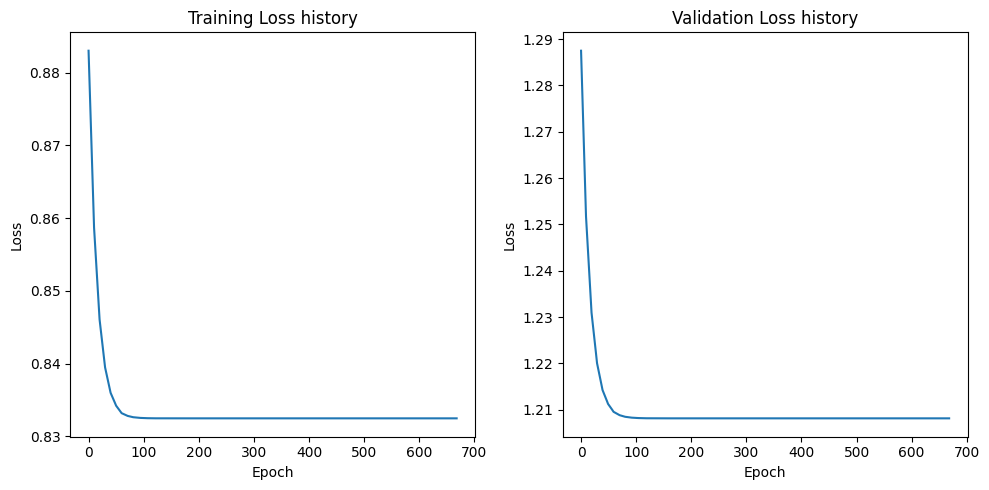

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4772, Train Loss: 104.11395465626435, Validation Loss: 89.08802795410156
Epoch 101/4772, Train Loss: 0.04088034075410927, Validation Loss: 0.0432044617831707
Epoch 201/4772, Train Loss: 0.04086270347675856, Validation Loss: 0.04319512546062469
Epoch 301/4772, Train Loss: 0.04086267235962784, Validation Loss: 0.043195129930973054
Epoch 401/4772, Train Loss: 0.04086267257876256, Validation Loss: 0.043195129930973054
Epoch 501/4772, Train Loss: 0.04086267257876256, Validation Loss: 0.043195129930973054
Epoch 601/4772, Train Loss: 0.04086267257876256, Validation Loss: 0.043195129930973054
Early stopping triggered.


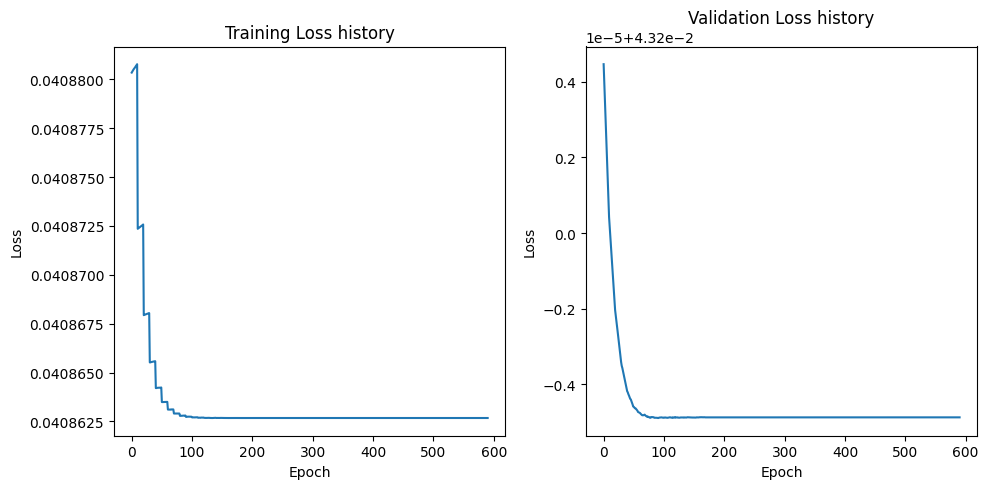

[I 2023-10-11 09:03:26,472] Trial 90 finished with value: 0.586864173412323 and parameters: {'hidden_layers': 1, 'epochs': 4772, 'batch_size': 148, 'learning_rate': 0.02753865215394526}. Best is trial 79 with value: 0.17022700607776642.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4720, Train Loss: 970.8269246419271, Validation Loss: 810.2674682617187
Epoch 101/4720, Train Loss: 0.02349190620912446, Validation Loss: 0.028020041808485985
Epoch 201/4720, Train Loss: 0.023482257914212015, Validation Loss: 0.028012314438819887
Epoch 301/4720, Train Loss: 0.023482225214441616, Validation Loss: 0.028012309968471528
Epoch 401/4720, Train Loss: 0.023482225214441616, Validation Loss: 0.028012309968471528
Epoch 501/4720, Train Loss: 0.023482225214441616, Validation Loss: 0.028012309968471528
Epoch 601/4720, Train Loss: 0.023482225214441616, Validation Loss: 0.028012309968471528
Epoch 701/4720, Train Loss: 0.023482225214441616, Validation Loss: 0.028012309968471528
Early stopping triggered.


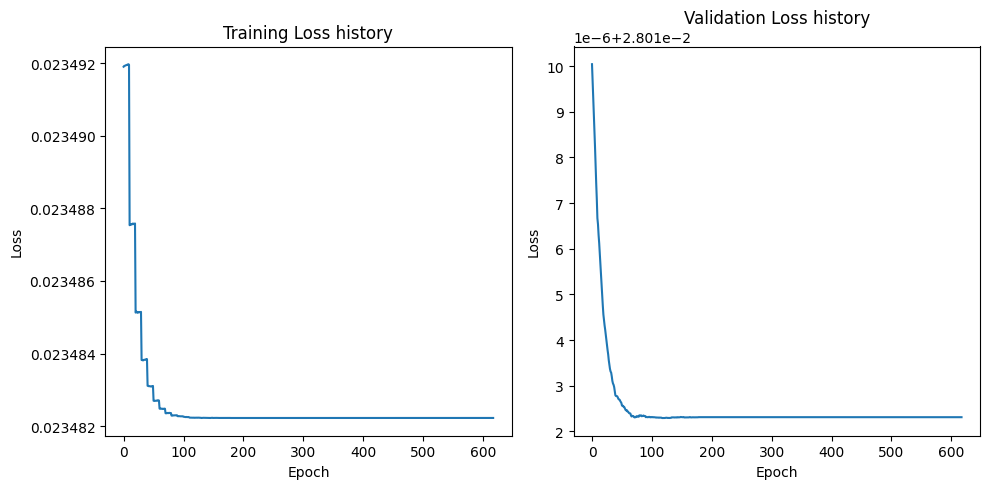

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4720, Train Loss: 984.9082573784722, Validation Loss: 941.6181640625
Epoch 101/4720, Train Loss: 0.02443679401444064, Validation Loss: 0.027682975679636002
Epoch 201/4720, Train Loss: 0.024427357233232923, Validation Loss: 0.02768036685883999
Epoch 301/4720, Train Loss: 0.024427332656664982, Validation Loss: 0.027680398523807527
Epoch 401/4720, Train Loss: 0.024427332656664982, Validation Loss: 0.027680398523807527
Epoch 501/4720, Train Loss: 0.024427332656664982, Validation Loss: 0.027680398523807527
Epoch 601/4720, Train Loss: 0.024427332656664982, Validation Loss: 0.027680398523807527
Early stopping triggered.


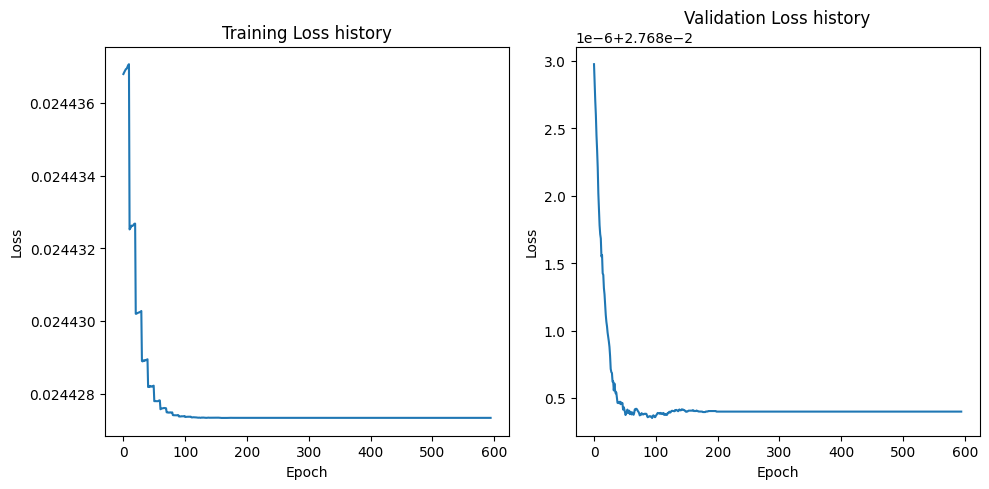

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4720, Train Loss: 99.93569967481825, Validation Loss: 144.5832077026367
Epoch 101/4720, Train Loss: 0.06267055320656961, Validation Loss: 0.05873023122549057
Epoch 201/4720, Train Loss: 0.06249699234548542, Validation Loss: 0.058490071445703506
Epoch 301/4720, Train Loss: 0.06249695395429929, Validation Loss: 0.05848997384309769
Epoch 401/4720, Train Loss: 0.06249695374733872, Validation Loss: 0.058489973098039626
Epoch 501/4720, Train Loss: 0.06249695374733872, Validation Loss: 0.058489973098039626
Epoch 601/4720, Train Loss: 0.06249695374733872, Validation Loss: 0.058489973098039626
Epoch 701/4720, Train Loss: 0.06249695374733872, Validation Loss: 0.058489973098039626
Early stopping triggered.


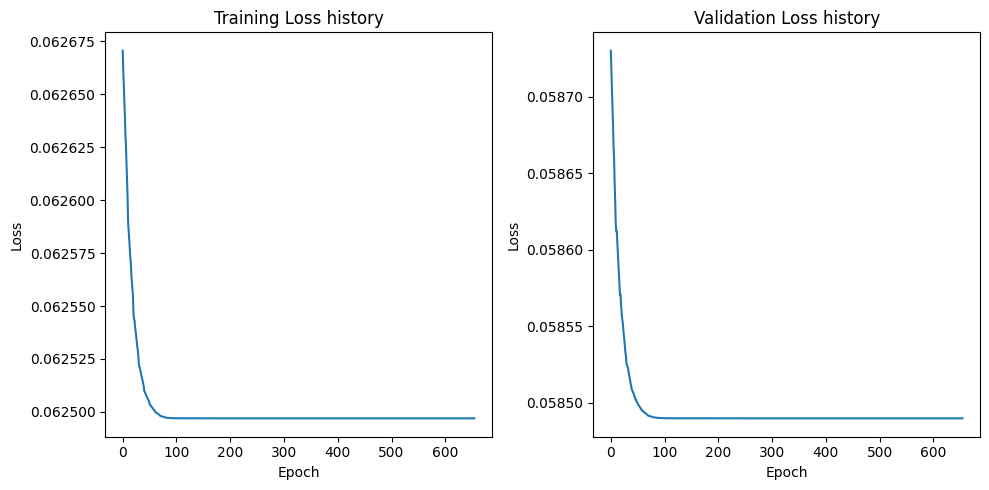

[I 2023-10-11 09:04:47,654] Trial 91 finished with value: 0.18581326305866241 and parameters: {'hidden_layers': 1, 'epochs': 4720, 'batch_size': 144, 'learning_rate': 0.05269026976907803}. Best is trial 79 with value: 0.17022700607776642.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4786, Train Loss: 1008.3919135199653, Validation Loss: 957.6671142578125
Epoch 101/4786, Train Loss: 4.2453726430734, Validation Loss: 5.520576167106628
Epoch 201/4786, Train Loss: 4.108383122417662, Validation Loss: 5.3594542145729065
Epoch 301/4786, Train Loss: 4.1083107060856285, Validation Loss: 5.359348487854004
Epoch 401/4786, Train Loss: 4.1083107060856285, Validation Loss: 5.35934853553772
Epoch 501/4786, Train Loss: 4.1083107060856285, Validation Loss: 5.35934853553772
Epoch 601/4786, Train Loss: 4.1083107060856285, Validation Loss: 5.35934853553772
Epoch 701/4786, Train Loss: 4.1083107060856285, Validation Loss: 5.35934853553772
Early stopping triggered.


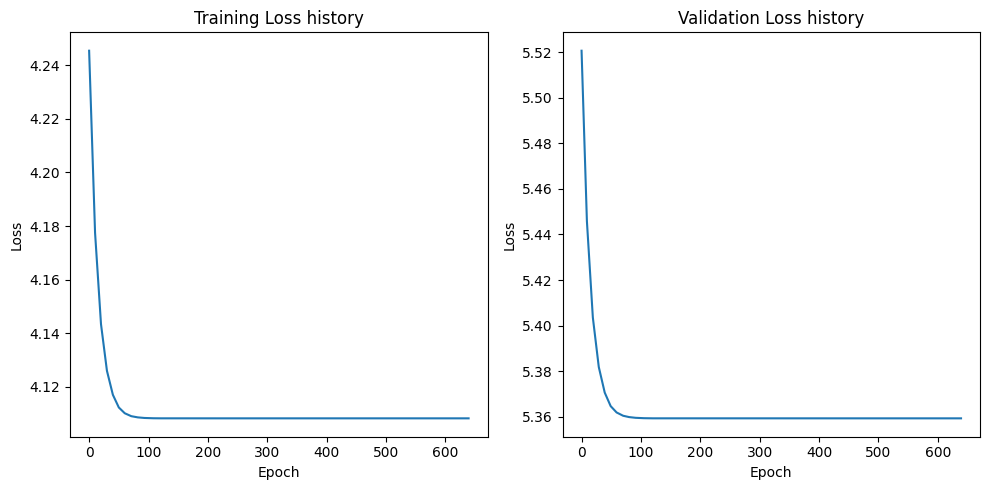

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4786, Train Loss: 1002.0771653917101, Validation Loss: 991.2444091796875
Epoch 101/4786, Train Loss: 1.5545796751976013, Validation Loss: 2.18316445350647
Epoch 201/4786, Train Loss: 1.5018841955396864, Validation Loss: 2.101242733001709
Epoch 301/4786, Train Loss: 1.501865287621816, Validation Loss: 2.1011889696121218
Epoch 401/4786, Train Loss: 1.5018653008672926, Validation Loss: 2.1011889696121218
Epoch 501/4786, Train Loss: 1.5018653008672926, Validation Loss: 2.1011889696121218
Epoch 601/4786, Train Loss: 1.5018653008672926, Validation Loss: 2.1011889696121218
Epoch 701/4786, Train Loss: 1.5018653008672926, Validation Loss: 2.1011889696121218
Early stopping triggered.


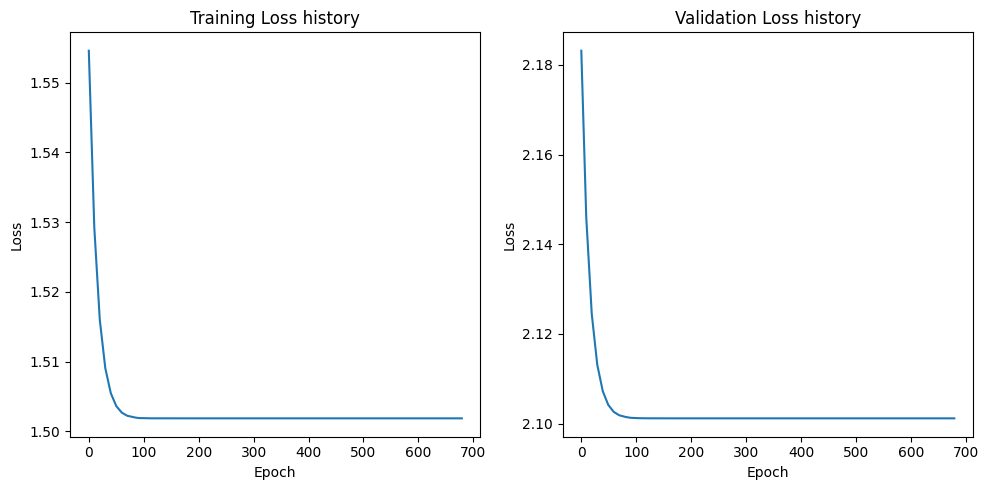

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4786, Train Loss: 140.24009280734592, Validation Loss: 133.89987487792968
Epoch 101/4786, Train Loss: 0.0755481312258376, Validation Loss: 0.1040655754506588
Epoch 201/4786, Train Loss: 0.07447821874585417, Validation Loss: 0.10219515115022659
Epoch 301/4786, Train Loss: 0.07447683128217857, Validation Loss: 0.1021928384900093
Epoch 401/4786, Train Loss: 0.07447683128217857, Validation Loss: 0.1021928384900093
Epoch 501/4786, Train Loss: 0.07447683128217857, Validation Loss: 0.1021928384900093
Epoch 601/4786, Train Loss: 0.07447683128217857, Validation Loss: 0.1021928384900093
Epoch 701/4786, Train Loss: 0.07447683128217857, Validation Loss: 0.1021928384900093
Early stopping triggered.


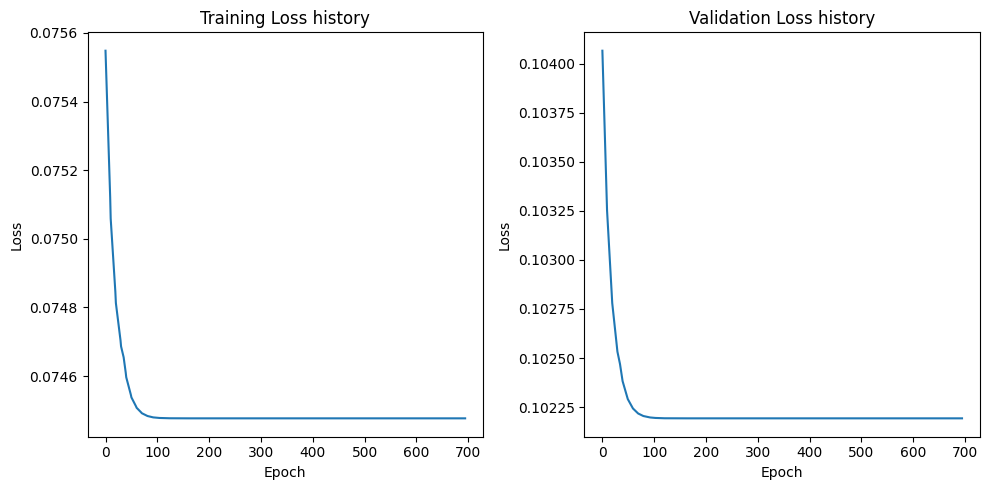

[I 2023-10-11 09:06:16,593] Trial 92 finished with value: 1.2233765125274658 and parameters: {'hidden_layers': 1, 'epochs': 4786, 'batch_size': 144, 'learning_rate': 0.025738166474533516}. Best is trial 79 with value: 0.17022700607776642.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4631, Train Loss: 961.9939221833881, Validation Loss: 782.9199829101562
Epoch 101/4631, Train Loss: 0.02335773207443325, Validation Loss: 0.028015682846307753
Epoch 201/4631, Train Loss: 0.02334678986747014, Validation Loss: 0.02800772078335285
Epoch 301/4631, Train Loss: 0.023346762025826855, Validation Loss: 0.028007736802101134
Epoch 401/4631, Train Loss: 0.023346762025826855, Validation Loss: 0.028007736802101134
Epoch 501/4631, Train Loss: 0.023346762025826855, Validation Loss: 0.028007736802101134
Epoch 601/4631, Train Loss: 0.023346762025826855, Validation Loss: 0.028007736802101134
Early stopping triggered.


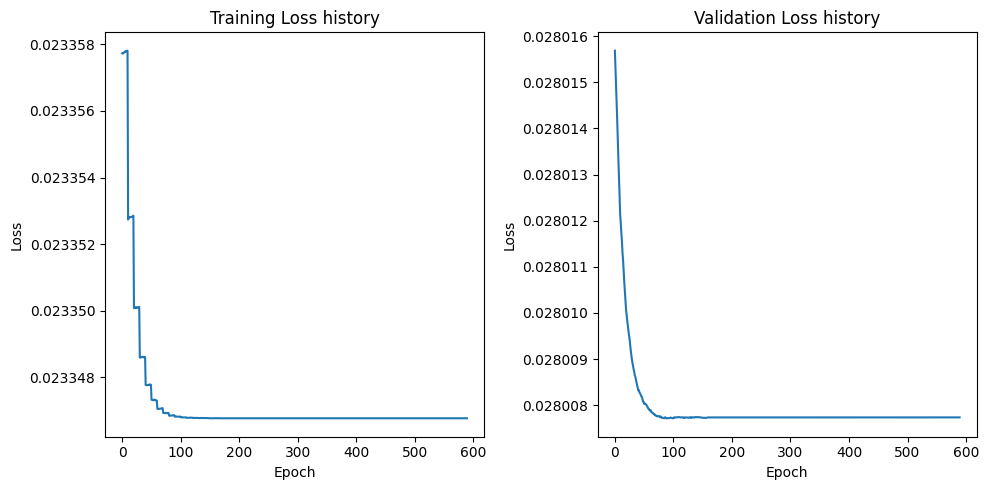

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4631, Train Loss: 1006.5039415861431, Validation Loss: 966.783935546875
Epoch 101/4631, Train Loss: 0.024472917234034913, Validation Loss: 0.02832692563533783
Epoch 201/4631, Train Loss: 0.02444603803910707, Validation Loss: 0.028300786018371583
Epoch 301/4631, Train Loss: 0.02444602044201211, Validation Loss: 0.028300773352384567
Epoch 401/4631, Train Loss: 0.02444602083414793, Validation Loss: 0.028300773352384567
Epoch 501/4631, Train Loss: 0.02444602083414793, Validation Loss: 0.028300773352384567
Epoch 601/4631, Train Loss: 0.02444602083414793, Validation Loss: 0.028300773352384567
Epoch 701/4631, Train Loss: 0.02444602083414793, Validation Loss: 0.028300773352384567
Early stopping triggered.


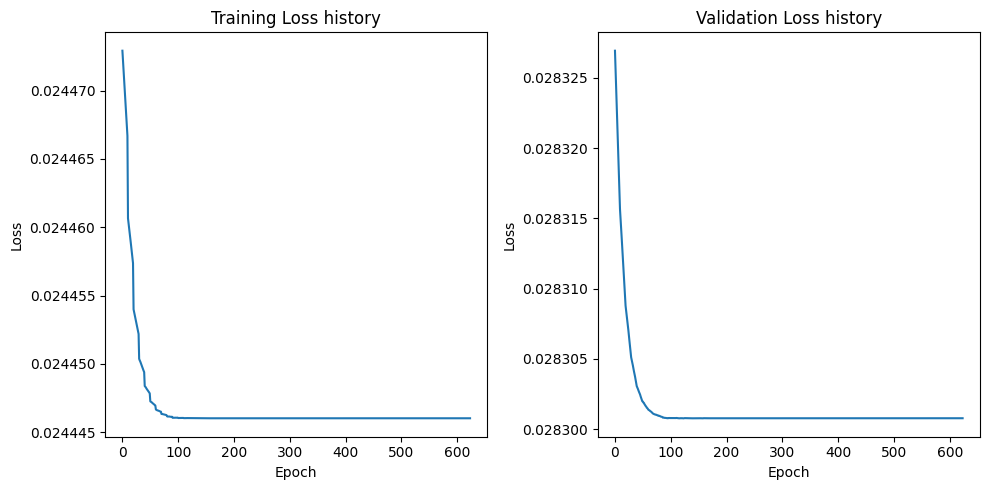

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4631, Train Loss: 124.88270729466488, Validation Loss: 140.0356475830078
Epoch 101/4631, Train Loss: 0.0499753516755606, Validation Loss: 0.04723131060600281
Epoch 201/4631, Train Loss: 0.049950875243858286, Validation Loss: 0.047221746295690536
Epoch 301/4631, Train Loss: 0.04995084191231351, Validation Loss: 0.04722173810005188
Epoch 401/4631, Train Loss: 0.04995084191231351, Validation Loss: 0.04722173810005188
Epoch 501/4631, Train Loss: 0.04995084191231351, Validation Loss: 0.04722173810005188
Epoch 601/4631, Train Loss: 0.04995084191231351, Validation Loss: 0.04722173810005188
Epoch 701/4631, Train Loss: 0.04995084191231351, Validation Loss: 0.04722173810005188
Early stopping triggered.


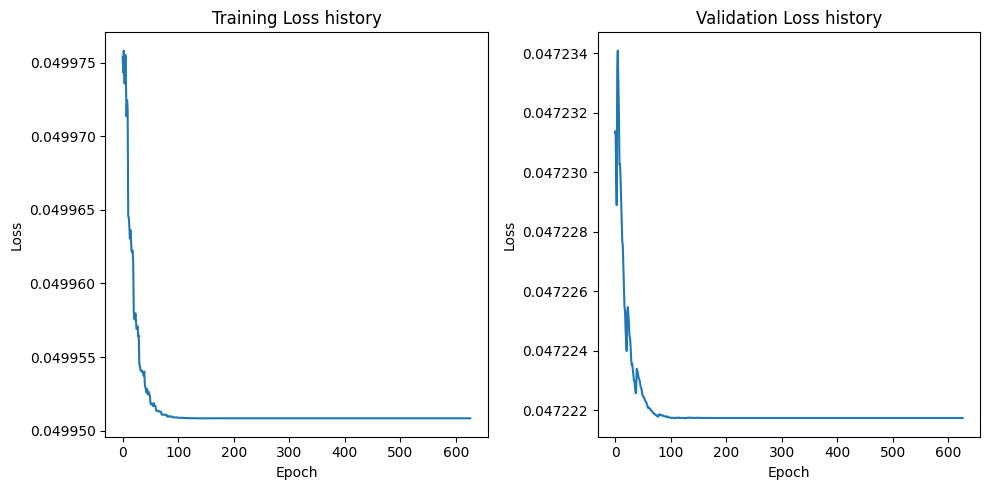

[I 2023-10-11 09:07:38,062] Trial 93 finished with value: 0.18400125205516815 and parameters: {'hidden_layers': 1, 'epochs': 4631, 'batch_size': 133, 'learning_rate': 0.05535034078435333}. Best is trial 79 with value: 0.17022700607776642.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4648, Train Loss: 955.6057564871652, Validation Loss: 827.6870880126953
Epoch 101/4648, Train Loss: 0.023388377656894072, Validation Loss: 0.028085983358323574
Epoch 201/4648, Train Loss: 0.023380860220640898, Validation Loss: 0.028080651070922613
Epoch 301/4648, Train Loss: 0.02338084625080228, Validation Loss: 0.028080635238438845
Epoch 401/4648, Train Loss: 0.02338084638384836, Validation Loss: 0.028080635238438845
Epoch 501/4648, Train Loss: 0.02338084638384836, Validation Loss: 0.028080635238438845
Epoch 601/4648, Train Loss: 0.02338084638384836, Validation Loss: 0.028080635238438845
Epoch 701/4648, Train Loss: 0.02338084638384836, Validation Loss: 0.028080635238438845
Early stopping triggered.


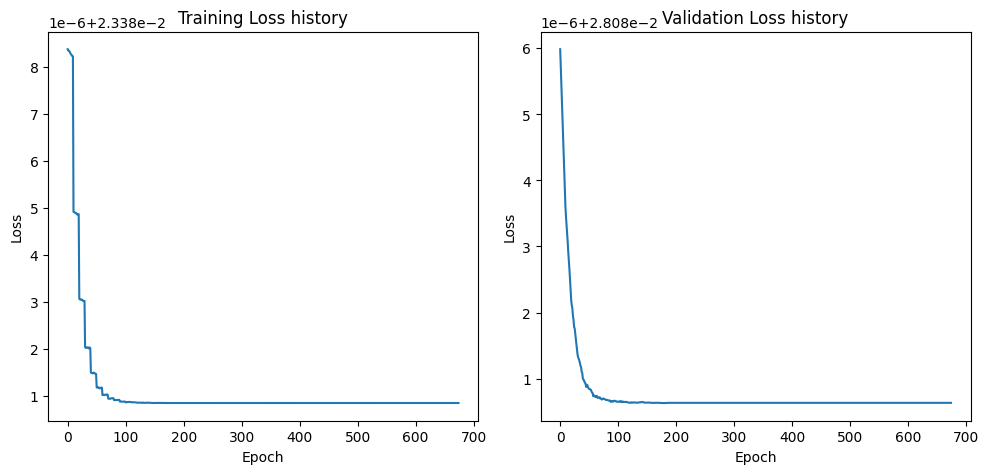

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4648, Train Loss: 951.3898315429688, Validation Loss: 898.8426818847656
Epoch 101/4648, Train Loss: 0.025220121057438, Validation Loss: 0.029187729582190514
Epoch 201/4648, Train Loss: 0.025163804247443165, Validation Loss: 0.029121953062713146
Epoch 301/4648, Train Loss: 0.025163803582212756, Validation Loss: 0.02912193490192294
Epoch 401/4648, Train Loss: 0.02516380331612059, Validation Loss: 0.02912193490192294
Epoch 501/4648, Train Loss: 0.02516380331612059, Validation Loss: 0.02912193490192294
Epoch 601/4648, Train Loss: 0.02516380331612059, Validation Loss: 0.02912193490192294
Epoch 701/4648, Train Loss: 0.02516380331612059, Validation Loss: 0.02912193490192294
Early stopping triggered.


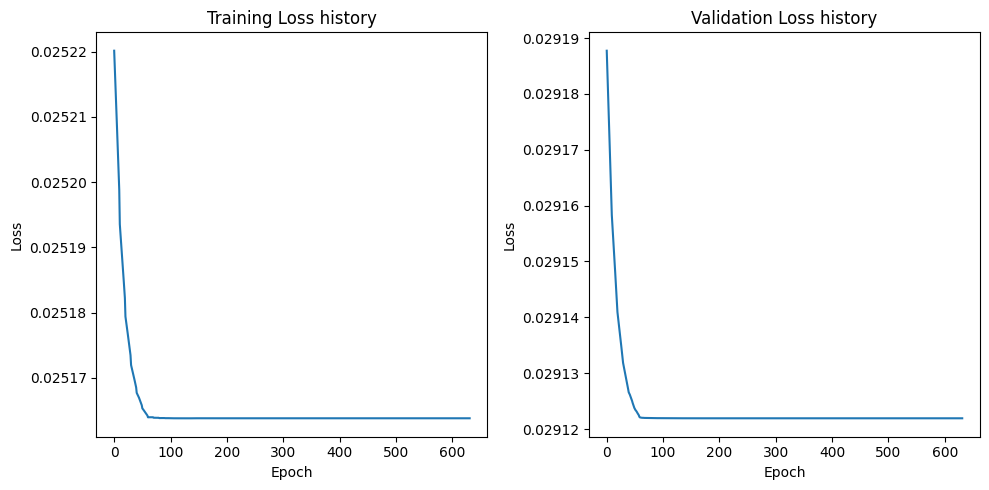

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4648, Train Loss: 154.4331763131278, Validation Loss: 142.24457550048828
Epoch 101/4648, Train Loss: 0.2895852192970259, Validation Loss: 0.29274598602205515
Epoch 201/4648, Train Loss: 0.28678229970059227, Validation Loss: 0.2894920790567994
Epoch 301/4648, Train Loss: 0.28678130970469545, Validation Loss: 0.2894908394664526
Epoch 401/4648, Train Loss: 0.28678130970469545, Validation Loss: 0.2894908394664526
Epoch 501/4648, Train Loss: 0.28678130970469545, Validation Loss: 0.2894908394664526
Epoch 601/4648, Train Loss: 0.28678130970469545, Validation Loss: 0.2894908394664526
Epoch 701/4648, Train Loss: 0.28678130970469545, Validation Loss: 0.2894908394664526
Early stopping triggered.


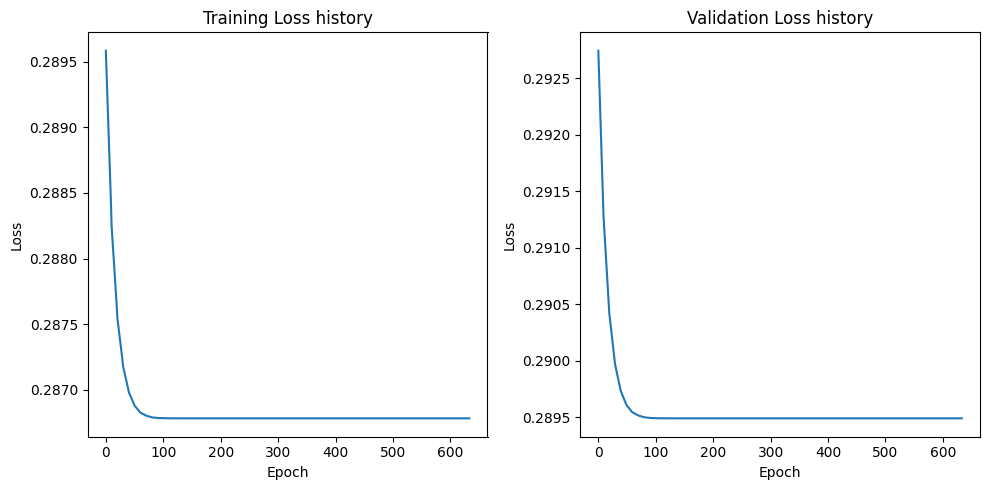

[I 2023-10-11 09:08:59,691] Trial 94 finished with value: 0.29699257016181946 and parameters: {'hidden_layers': 1, 'epochs': 4648, 'batch_size': 185, 'learning_rate': 0.054883267210161735}. Best is trial 79 with value: 0.17022700607776642.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4915, Train Loss: 1033.3756321498327, Validation Loss: 1014.0984802246094
Epoch 101/4915, Train Loss: 0.0568665795560394, Validation Loss: 0.12216008175164461
Epoch 201/4915, Train Loss: 0.05407881550490856, Validation Loss: 0.11428279429674149
Epoch 301/4915, Train Loss: 0.05407792063696044, Validation Loss: 0.11427344754338264
Epoch 401/4915, Train Loss: 0.05407792276569775, Validation Loss: 0.11427344754338264
Epoch 501/4915, Train Loss: 0.05407792276569775, Validation Loss: 0.11427344754338264
Epoch 601/4915, Train Loss: 0.05407792276569775, Validation Loss: 0.11427344754338264
Epoch 701/4915, Train Loss: 0.05407792276569775, Validation Loss: 0.11427344754338264
Early stopping triggered.


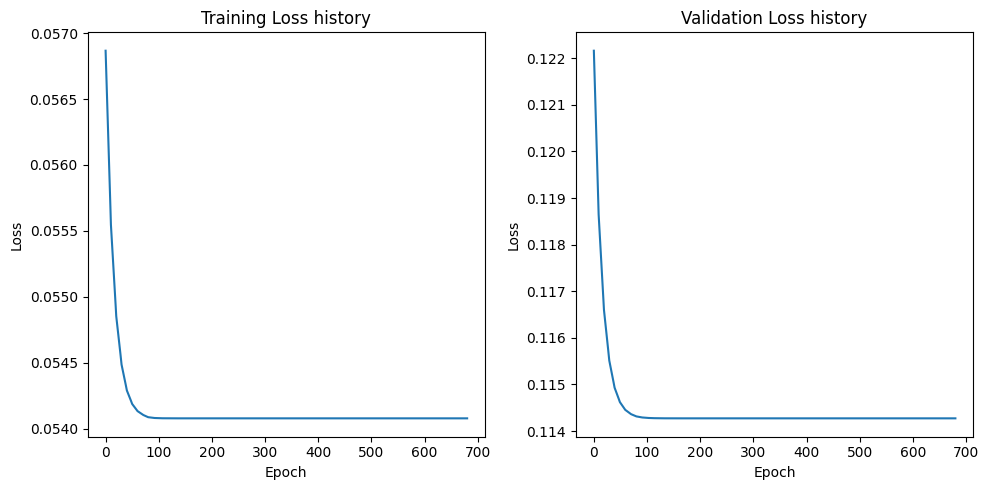

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4915, Train Loss: 965.9813886369977, Validation Loss: 943.4561614990234
Epoch 101/4915, Train Loss: 0.0257072146050632, Validation Loss: 0.030191851779818535
Epoch 201/4915, Train Loss: 0.02560506641332592, Validation Loss: 0.030042475555092096
Epoch 301/4915, Train Loss: 0.025605044726814543, Validation Loss: 0.030042422469705343
Epoch 401/4915, Train Loss: 0.025605044726814543, Validation Loss: 0.030042422469705343
Epoch 501/4915, Train Loss: 0.025605044726814543, Validation Loss: 0.030042422469705343
Epoch 601/4915, Train Loss: 0.025605044726814543, Validation Loss: 0.030042422469705343
Epoch 701/4915, Train Loss: 0.025605044726814543, Validation Loss: 0.030042422469705343
Early stopping triggered.


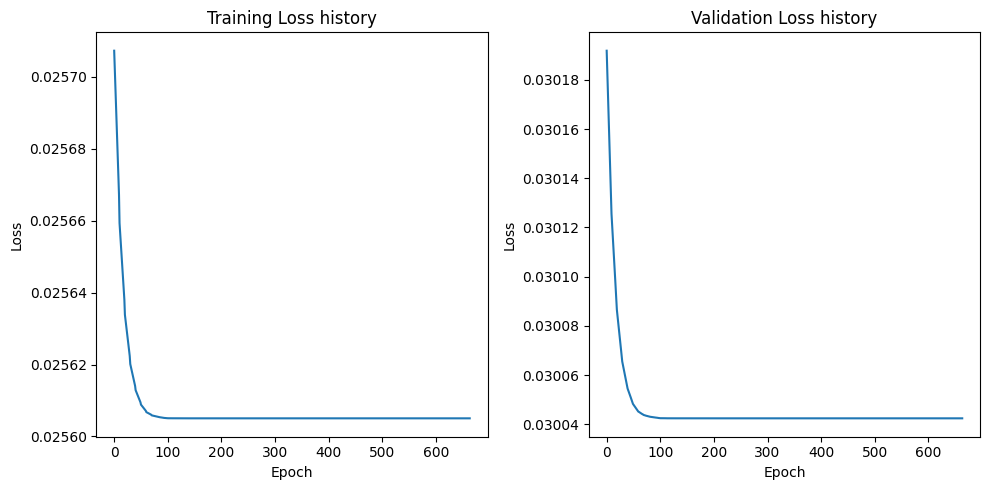

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4915, Train Loss: 110.09872055053711, Validation Loss: 107.42284774780273
Epoch 101/4915, Train Loss: 0.04201104558472123, Validation Loss: 0.04332096502184868
Epoch 201/4915, Train Loss: 0.04196742137095758, Validation Loss: 0.043283721432089806
Epoch 301/4915, Train Loss: 0.041967393564326425, Validation Loss: 0.043283721432089806
Epoch 401/4915, Train Loss: 0.041967393564326425, Validation Loss: 0.043283721432089806
Epoch 501/4915, Train Loss: 0.041967393564326425, Validation Loss: 0.043283721432089806
Epoch 601/4915, Train Loss: 0.041967393564326425, Validation Loss: 0.043283721432089806
Epoch 701/4915, Train Loss: 0.041967393564326425, Validation Loss: 0.043283721432089806
Early stopping triggered.


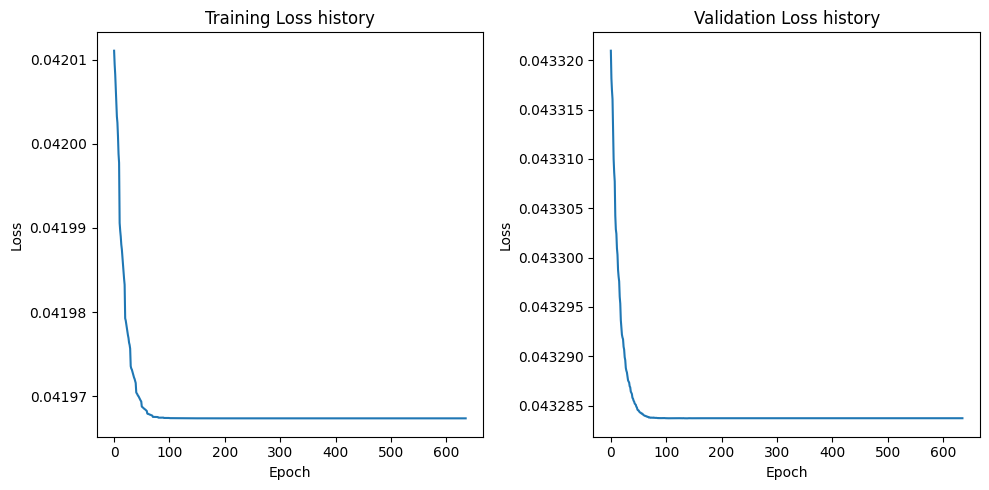

[I 2023-10-11 09:10:23,605] Trial 95 finished with value: 0.20389755070209503 and parameters: {'hidden_layers': 1, 'epochs': 4915, 'batch_size': 185, 'learning_rate': 0.05135701027519732}. Best is trial 79 with value: 0.17022700607776642.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4987, Train Loss: 981.2103576660156, Validation Loss: 959.0201822916666
Epoch 101/4987, Train Loss: 0.04387855607395371, Validation Loss: 0.07166381552815437
Epoch 201/4987, Train Loss: 0.04234203385810057, Validation Loss: 0.06827728698650996
Epoch 301/4987, Train Loss: 0.04234173505877455, Validation Loss: 0.06827425708373387
Epoch 401/4987, Train Loss: 0.04234173505877455, Validation Loss: 0.06827425708373387
Epoch 501/4987, Train Loss: 0.04234173505877455, Validation Loss: 0.06827425708373387
Epoch 601/4987, Train Loss: 0.04234173505877455, Validation Loss: 0.06827425708373387
Epoch 701/4987, Train Loss: 0.04234173505877455, Validation Loss: 0.06827425708373387
Early stopping triggered.


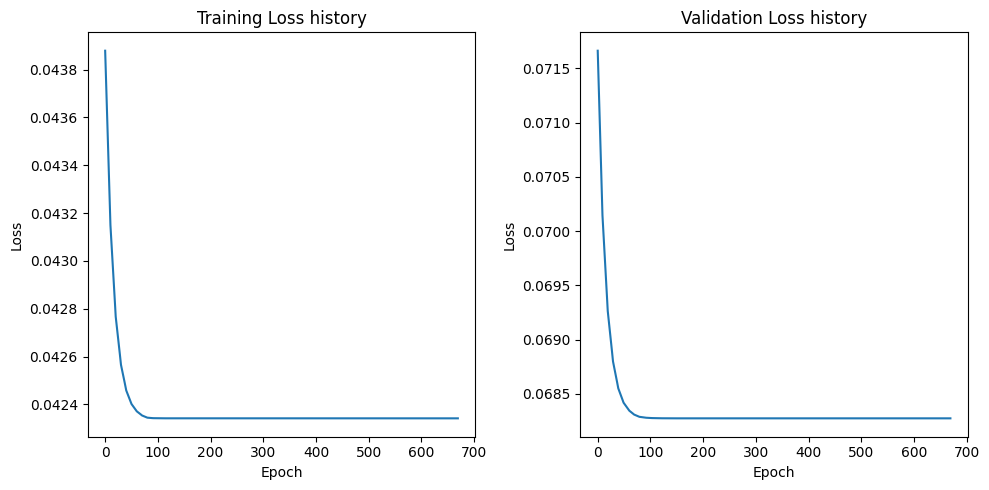

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4987, Train Loss: 979.7578837076823, Validation Loss: 958.4835408528646
Epoch 101/4987, Train Loss: 0.027406504843384027, Validation Loss: 0.029588997984925907
Epoch 201/4987, Train Loss: 0.027297468079874914, Validation Loss: 0.0294621754437685
Epoch 301/4987, Train Loss: 0.027297358959913254, Validation Loss: 0.029462055613597233
Epoch 401/4987, Train Loss: 0.027297358959913254, Validation Loss: 0.029462055613597233
Epoch 501/4987, Train Loss: 0.027297358959913254, Validation Loss: 0.029462055613597233
Epoch 601/4987, Train Loss: 0.027297358959913254, Validation Loss: 0.029462055613597233
Epoch 701/4987, Train Loss: 0.027297358959913254, Validation Loss: 0.029462055613597233
Early stopping triggered.


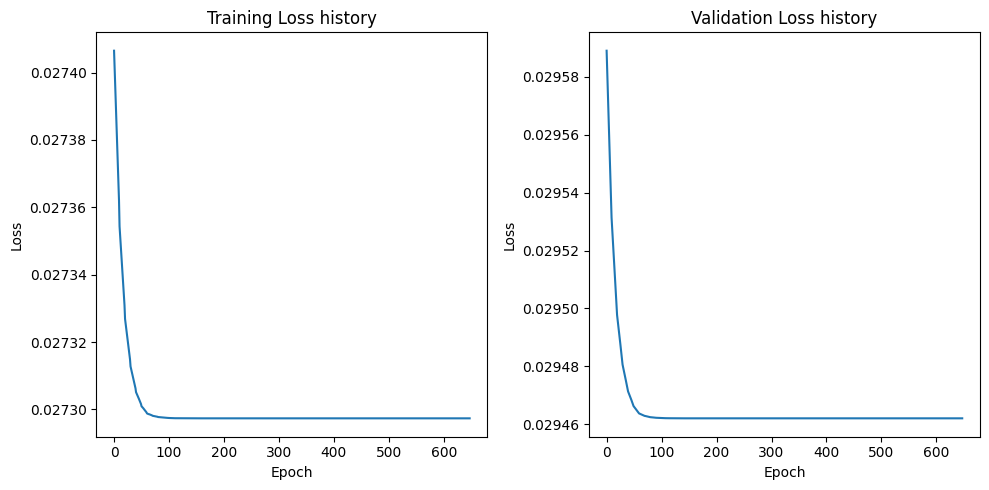

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4987, Train Loss: 112.16881211598714, Validation Loss: 107.7661641438802
Epoch 101/4987, Train Loss: 0.054525780181090035, Validation Loss: 0.07394725332657497
Epoch 201/4987, Train Loss: 0.05445157612363497, Validation Loss: 0.07382323344548543
Epoch 301/4987, Train Loss: 0.054451546942194305, Validation Loss: 0.07382323468724887
Epoch 401/4987, Train Loss: 0.054451546942194305, Validation Loss: 0.07382323468724887
Epoch 501/4987, Train Loss: 0.054451546942194305, Validation Loss: 0.07382323468724887
Epoch 601/4987, Train Loss: 0.054451546942194305, Validation Loss: 0.07382323468724887
Epoch 701/4987, Train Loss: 0.054451546942194305, Validation Loss: 0.07382323468724887
Early stopping triggered.


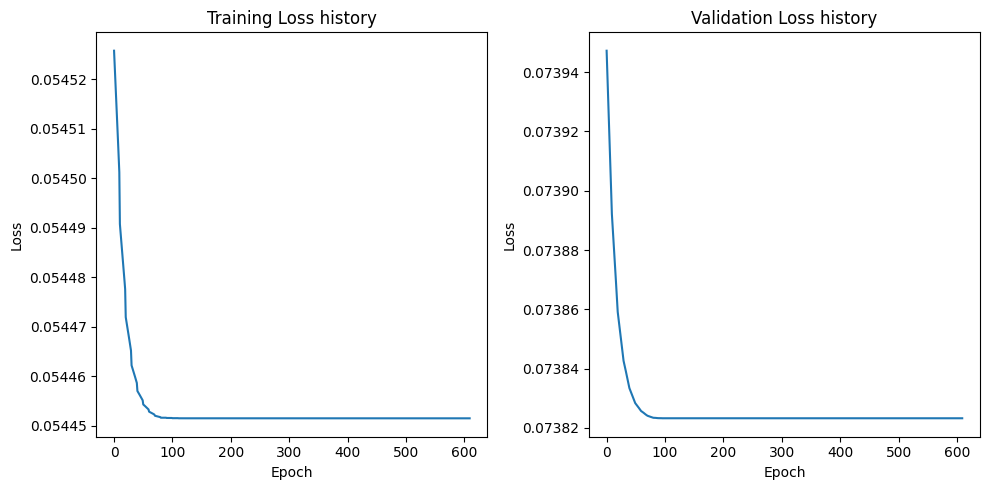

[I 2023-10-11 09:11:39,967] Trial 96 finished with value: 0.20373417437076569 and parameters: {'hidden_layers': 1, 'epochs': 4987, 'batch_size': 226, 'learning_rate': 0.05343417340460346}. Best is trial 79 with value: 0.17022700607776642.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4983, Train Loss: 992.1633744673295, Validation Loss: 869.8313598632812
Epoch 101/4983, Train Loss: 0.032498430968685585, Validation Loss: 0.049054173131783806
Epoch 201/4983, Train Loss: 0.03185701454904946, Validation Loss: 0.04767502347628275
Epoch 301/4983, Train Loss: 0.03185657987540418, Validation Loss: 0.04767356440424919
Epoch 401/4983, Train Loss: 0.03185657987540418, Validation Loss: 0.04767356440424919
Epoch 501/4983, Train Loss: 0.03185657987540418, Validation Loss: 0.04767356440424919
Epoch 601/4983, Train Loss: 0.03185657987540418, Validation Loss: 0.04767356440424919
Epoch 701/4983, Train Loss: 0.03185657987540418, Validation Loss: 0.04767356440424919
Early stopping triggered.


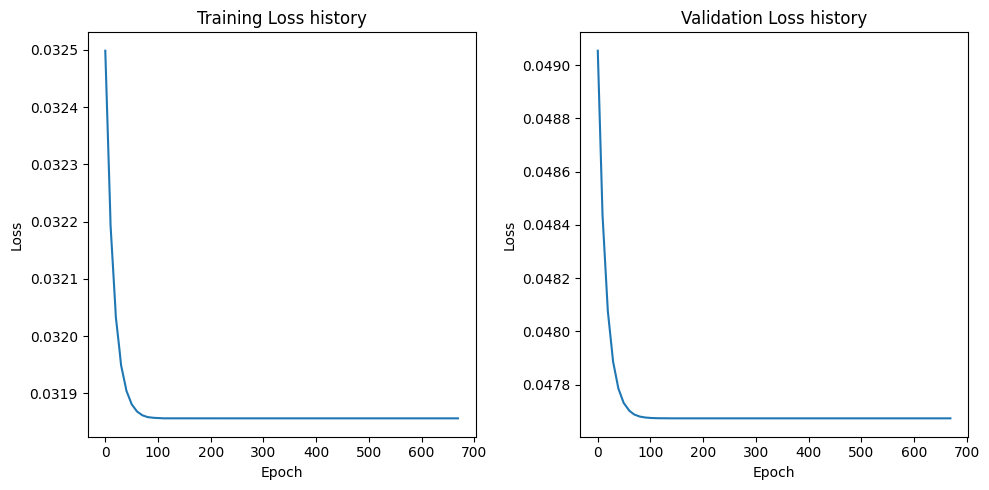

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4983, Train Loss: 1035.3125665838068, Validation Loss: 1024.3872477213542
Epoch 101/4983, Train Loss: 16.702770655805413, Validation Loss: 17.37220040957133
Epoch 201/4983, Train Loss: 16.377307653427124, Validation Loss: 17.088809410731
Epoch 301/4983, Train Loss: 16.377115639773283, Validation Loss: 17.088629881540935
Epoch 401/4983, Train Loss: 16.377115639773283, Validation Loss: 17.088629881540935
Epoch 501/4983, Train Loss: 16.377115639773283, Validation Loss: 17.088629881540935
Epoch 601/4983, Train Loss: 16.377115639773283, Validation Loss: 17.088629881540935
Epoch 701/4983, Train Loss: 16.377115639773283, Validation Loss: 17.088629881540935
Early stopping triggered.


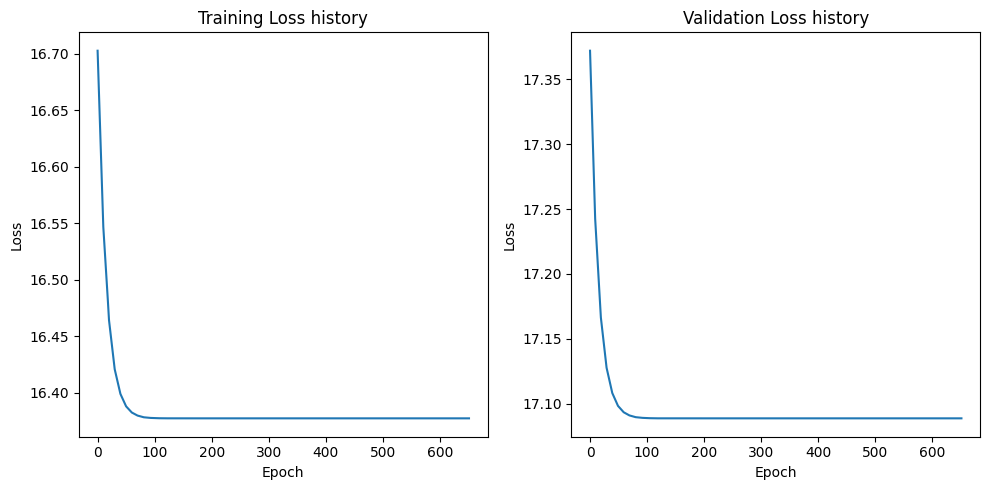

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4983, Train Loss: 97.88848114013672, Validation Loss: 101.8050537109375
Epoch 101/4983, Train Loss: 0.04239341142502698, Validation Loss: 0.04423649857441584
Epoch 201/4983, Train Loss: 0.04235794564539736, Validation Loss: 0.044181980192661285
Epoch 301/4983, Train Loss: 0.04235793599350886, Validation Loss: 0.04418195659915606
Epoch 401/4983, Train Loss: 0.04235793599350886, Validation Loss: 0.04418195659915606
Epoch 501/4983, Train Loss: 0.04235793599350886, Validation Loss: 0.04418195659915606
Epoch 601/4983, Train Loss: 0.04235793599350886, Validation Loss: 0.04418195659915606
Epoch 701/4983, Train Loss: 0.04235793599350886, Validation Loss: 0.04418195659915606
Early stopping triggered.


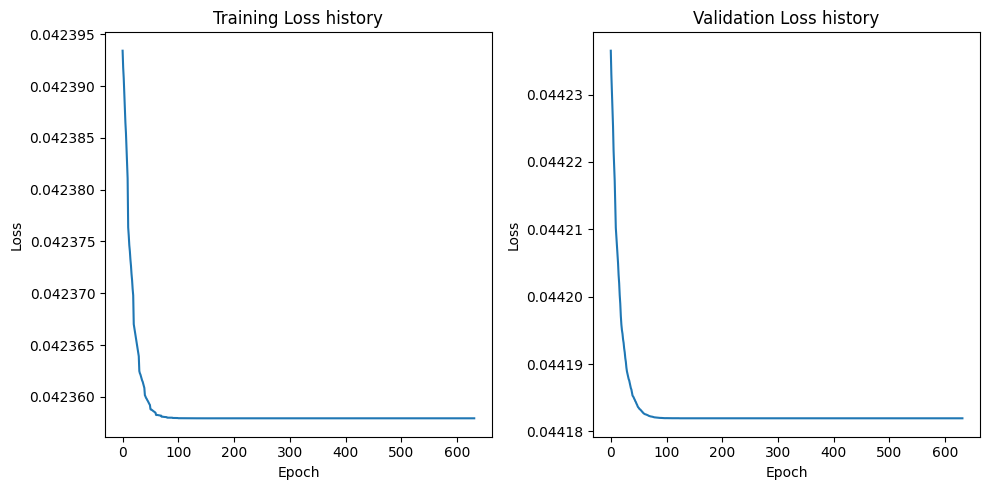

[I 2023-10-11 09:12:55,833] Trial 97 finished with value: 1.5238094329833984 and parameters: {'hidden_layers': 1, 'epochs': 4983, 'batch_size': 232, 'learning_rate': 0.05539465171566396}. Best is trial 79 with value: 0.17022700607776642.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4548, Train Loss: 1048.72490234375, Validation Loss: 1067.3093566894531
Epoch 101/4548, Train Loss: 340.0222595214844, Validation Loss: 391.10105895996094
Epoch 201/4548, Train Loss: 339.6536163330078, Validation Loss: 390.7842102050781
Epoch 301/4548, Train Loss: 339.65357360839846, Validation Loss: 390.7842254638672
Epoch 401/4548, Train Loss: 339.65357360839846, Validation Loss: 390.7842254638672
Epoch 501/4548, Train Loss: 339.65357360839846, Validation Loss: 390.7842254638672
Epoch 601/4548, Train Loss: 339.65357360839846, Validation Loss: 390.7842254638672
Epoch 701/4548, Train Loss: 339.65357360839846, Validation Loss: 390.7842254638672
Early stopping triggered.


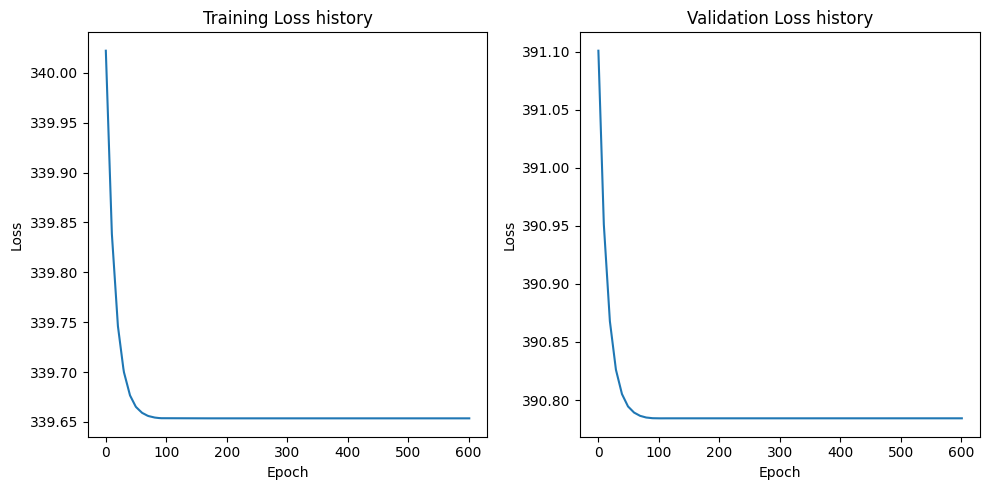

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4548, Train Loss: 1072.493212890625, Validation Loss: 1080.0157470703125
Epoch 101/4548, Train Loss: 289.4171630859375, Validation Loss: 229.0506706237793
Epoch 201/4548, Train Loss: 289.022021484375, Validation Loss: 228.6584014892578
Epoch 301/4548, Train Loss: 289.0219696044922, Validation Loss: 228.6583709716797
Epoch 401/4548, Train Loss: 289.0219696044922, Validation Loss: 228.6583709716797
Epoch 501/4548, Train Loss: 289.0219696044922, Validation Loss: 228.6583709716797
Epoch 601/4548, Train Loss: 289.0219696044922, Validation Loss: 228.6583709716797
Epoch 701/4548, Train Loss: 289.0219696044922, Validation Loss: 228.6583709716797
Early stopping triggered.


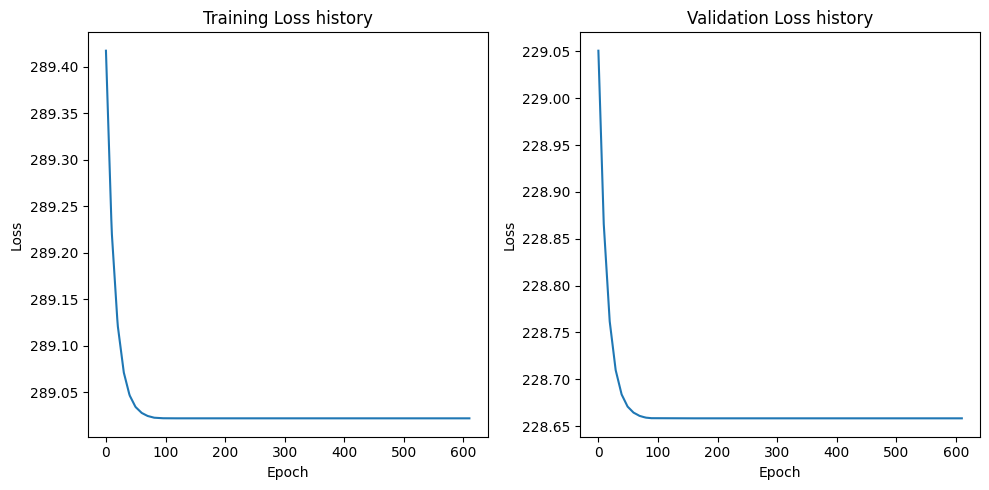

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4548, Train Loss: 139.3581344604492, Validation Loss: 136.37871551513672
Epoch 101/4548, Train Loss: 23.959518051147462, Validation Loss: 26.910639762878418
Epoch 201/4548, Train Loss: 23.883719062805177, Validation Loss: 26.827754974365234
Epoch 301/4548, Train Loss: 23.883702278137207, Validation Loss: 26.827730178833008
Epoch 401/4548, Train Loss: 23.883702278137207, Validation Loss: 26.827730178833008
Epoch 501/4548, Train Loss: 23.883702278137207, Validation Loss: 26.827730178833008
Epoch 601/4548, Train Loss: 23.883702278137207, Validation Loss: 26.827730178833008
Epoch 701/4548, Train Loss: 23.883702278137207, Validation Loss: 26.827730178833008
Early stopping triggered.


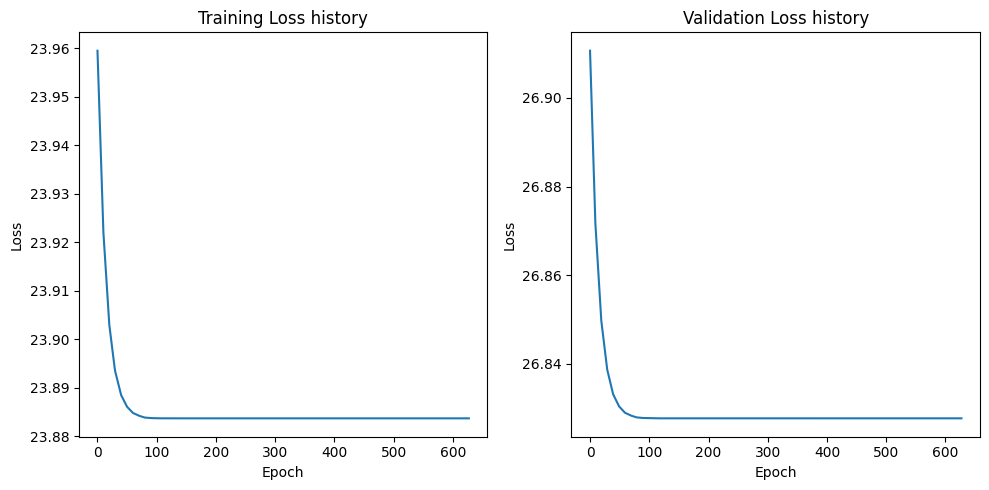

[I 2023-10-11 09:13:57,484] Trial 98 finished with value: 13.462960243225098 and parameters: {'hidden_layers': 1, 'epochs': 4548, 'batch_size': 542, 'learning_rate': 0.05292380553818641}. Best is trial 79 with value: 0.17022700607776642.
<ipython-input-8-5351176c3f1e>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)


Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4896, Train Loss: 930.7179992675781, Validation Loss: 893.1223347981771
Epoch 101/4896, Train Loss: 127.24303359985352, Validation Loss: 151.35313161214194
Epoch 201/4896, Train Loss: 126.20874786376953, Validation Loss: 150.25707244873047
Epoch 301/4896, Train Loss: 126.20853652954102, Validation Loss: 150.25689442952475
Epoch 401/4896, Train Loss: 126.20853652954102, Validation Loss: 150.25689442952475
Epoch 501/4896, Train Loss: 126.20853652954102, Validation Loss: 150.25689442952475
Epoch 601/4896, Train Loss: 126.20853652954102, Validation Loss: 150.25689442952475
Epoch 701/4896, Train Loss: 126.20853652954102, Validation Loss: 150.25689442952475
Early stopping triggered.


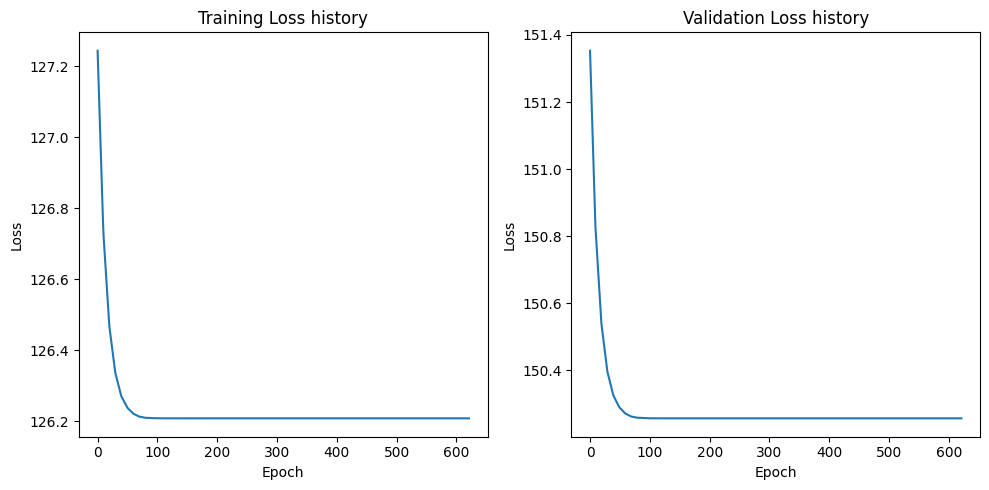

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4896, Train Loss: 981.673779296875, Validation Loss: 964.5999552408854
Epoch 101/4896, Train Loss: 218.92139434814453, Validation Loss: 253.12238057454428
Epoch 201/4896, Train Loss: 218.16009140014648, Validation Loss: 252.4622548421224
Epoch 301/4896, Train Loss: 218.15998916625978, Validation Loss: 252.46222432454428
Epoch 401/4896, Train Loss: 218.15998916625978, Validation Loss: 252.46222432454428
Epoch 501/4896, Train Loss: 218.15998916625978, Validation Loss: 252.46222432454428
Epoch 601/4896, Train Loss: 218.15998916625978, Validation Loss: 252.46222432454428
Epoch 701/4896, Train Loss: 218.15998916625978, Validation Loss: 252.46222432454428
Early stopping triggered.


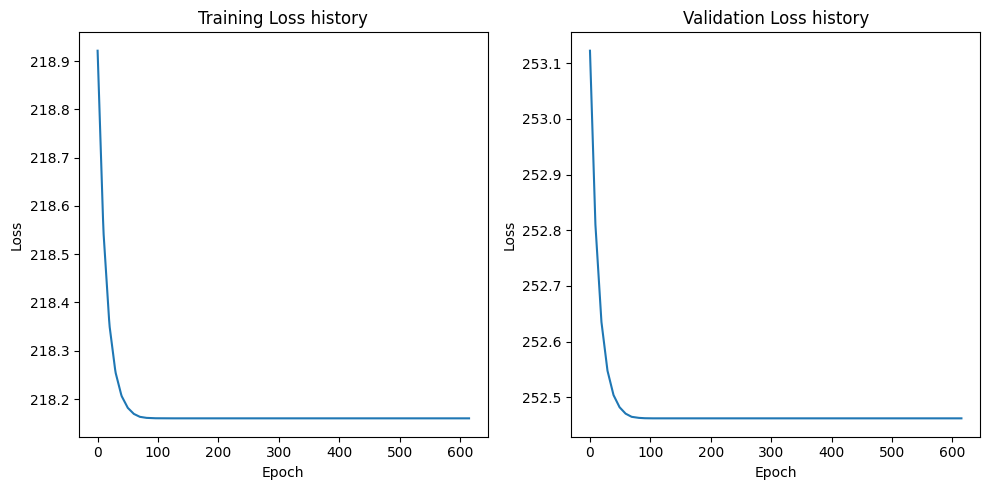

Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/4896, Train Loss: 161.18652572631837, Validation Loss: 160.91280110677084
Epoch 101/4896, Train Loss: 4.623462954163552, Validation Loss: 5.458172619342804
Epoch 201/4896, Train Loss: 4.565837480127811, Validation Loss: 5.3979582985242205
Epoch 301/4896, Train Loss: 4.565816222131252, Validation Loss: 5.397930880387624
Epoch 401/4896, Train Loss: 4.565816222131252, Validation Loss: 5.397930880387624
Epoch 501/4896, Train Loss: 4.565816222131252, Validation Loss: 5.397930880387624
Epoch 601/4896, Train Loss: 4.565816222131252, Validation Loss: 5.397930880387624
Epoch 701/4896, Train Loss: 4.565816222131252, Validation Loss: 5.397930880387624
Early stopping triggered.


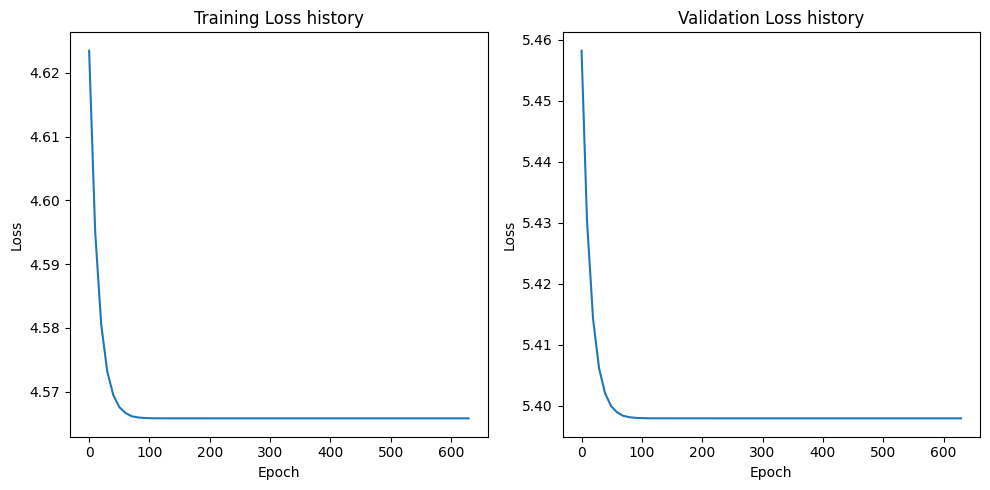

[I 2023-10-11 09:15:09,558] Trial 99 finished with value: 9.74667739868164 and parameters: {'hidden_layers': 1, 'epochs': 4896, 'batch_size': 268, 'learning_rate': 0.029678670360143326}. Best is trial 79 with value: 0.17022700607776642.


Best parameters: {'hidden_layers': 1, 'epochs': 3983, 'batch_size': 144, 'learning_rate': 0.04046518424118442}
Best objective value (MSE): 0.17022700607776642
Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3983, Train Loss: 844.5518663194445, Validation Loss: 721.6609375
Epoch 101/3983, Train Loss: 0.023545343842771318, Validation Loss: 0.028182712197303773
Epoch 201/3983, Train Loss: 0.0235311358442737, Validation Loss: 0.02816668786108494
Epoch 301/3983, Train Loss: 0.023531107594155602, Validation Loss: 0.02816668339073658
Epoch 401/3983, Train Loss: 0.023531107594155602, Validation Loss: 0.02816668339073658
Epoch 501/3983, Train Loss: 0.023531107594155602, Validation Loss: 0.02816668339073658
Epoch 601/3983, Train Loss: 0.023531107594155602, Validation Loss: 0.02816668339073658
Early stopping triggered.


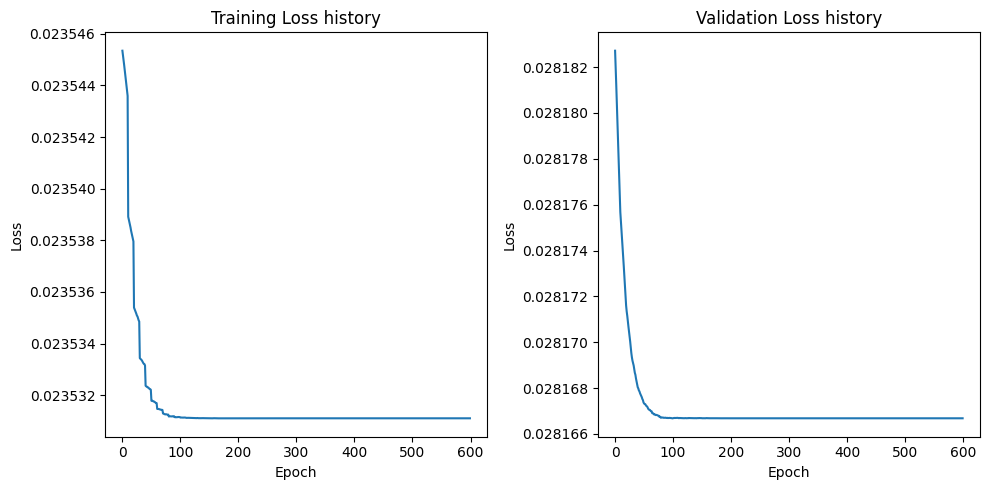

Metrics for y1: MSE=0.15082165598869324, MAPE=0.11922282725572586, PE=0.37863579418804927, R2=0.997367788712335
Training time for y1: 26.393903493881226 seconds
Average CPU usage during training for y1: -0.0057996485061511446 % per epoch
GPU memory used for training y1: 0.0 MB
Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3983, Train Loss: 873.9026828342014, Validation Loss: 730.1652099609375
Epoch 101/3983, Train Loss: 0.024585288690610066, Validation Loss: 0.027981312200427055
Epoch 201/3983, Train Loss: 0.024563330018685922, Validation Loss: 0.027959690988063814
Epoch 301/3983, Train Loss: 0.024563305856039126, Validation Loss: 0.02795969508588314
Epoch 401/3983, Train Loss: 0.024563305856039126, Validation Loss: 0.02795969508588314
Epoch 501/3983, Train Loss: 0.024563305856039126, Validation Loss: 0.02795969508588314
Epoch 601/3983, Train Loss: 0.024563305856039126, 

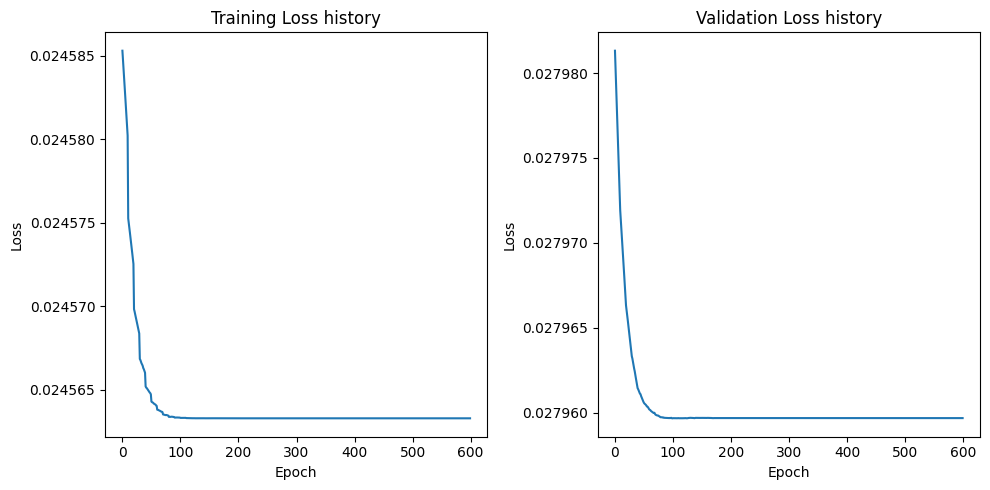

Metrics for y2: MSE=0.1639363318681717, MAPE=0.12905752658843994, PE=0.40614308766120755, R2=0.9968941118204537
Training time for y2: 26.510685443878174 seconds
Average CPU usage during training for y2: -0.005322621139844339 % per epoch
GPU memory used for training y2: 0.0 MB
Starting training for Fold 1/5
Starting training for Fold 2/5
Starting training for Fold 3/5
Starting training for Fold 4/5
Starting training for Fold 5/5
Epoch 1/3983, Train Loss: 156.56750276353625, Validation Loss: 145.39373474121095
Epoch 101/3983, Train Loss: 0.13678746608396372, Validation Loss: 0.15733728036284447
Epoch 201/3983, Train Loss: 0.13512652119000754, Validation Loss: 0.15585124492645264
Epoch 301/3983, Train Loss: 0.1351246296738585, Validation Loss: 0.15585081055760383
Epoch 401/3983, Train Loss: 0.13512462905297676, Validation Loss: 0.15585081055760383
Epoch 501/3983, Train Loss: 0.13512462905297676, Validation Loss: 0.15585081055760383
Epoch 601/3983, Train Loss: 0.13512462905297676, Validati

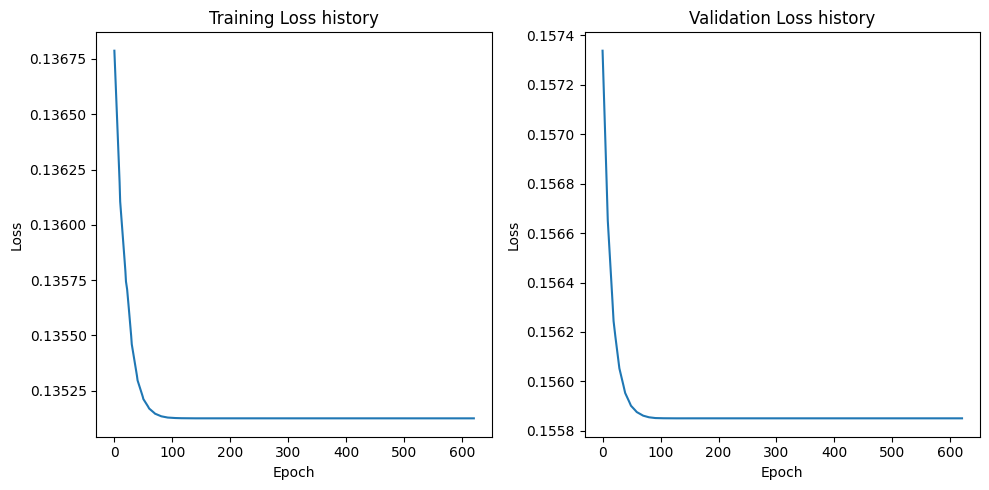

Metrics for y3: MSE=0.38992345333099365, MAPE=0.2547081708908081, PE=2.153647201844254, R2=0.9717319246044532
Training time for y3: 26.76546025276184 seconds
Average CPU usage during training for y3: -0.005874968616620635 % per epoch
GPU memory used for training y3: 0.0 MB


In [ ]:
outputs = {
    "y1": pd.DataFrame(k11, columns=['y1']),
    "y2": pd.DataFrame(k22, columns=['y2']),
    "y3": pd.DataFrame(k33, columns=['y3'])
}

def objective(trial, X, outputs):
    # Define hyperparameters to optimize
    hidden_layers = trial.suggest_int("hidden_layers", 1, 5)
    epochs = trial.suggest_int("epochs", 1000, 5000)
    batch_size = trial.suggest_int("batch_size", 100, 1000)
    learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)

    mse_values = []
    for key in outputs:
        y = outputs[key]
        model = RegressionANN(X, y, hidden_layers=[hidden_layers], epochs=epochs, batch_size=batch_size, learning_rate=learning_rate)
        model.fit_model()
        metrics = model.evaluate()
        mse_values.append(metrics['test']['RMSE'])  # Assuming that the first metric is MSE

    return np.mean(mse_values)  # Return the average MSE across all outputs

# Setup optuna
study = optuna.create_study(direction="minimize")

# Start the hyperparameter tuning process
study.optimize(lambda trial: objective(trial, X, outputs), n_trials=100)

# Print the result
best_params = study.best_params
best_value = study.best_value
print(f"Best parameters: {best_params}")
print(f"Best objective value (MSE): {best_value}")

# Train and evaluate the model with the best hyperparameters for each output
models = {key: None for key in outputs}  # Initialize models dict
metrics = {key: None for key in outputs}  # Initialize metrics dict
for key in outputs:
    y = outputs[key]
    models[key] = RegressionANN(X, y, hidden_layers=[best_params["hidden_layers"]], epochs=best_params["epochs"], batch_size=best_params["batch_size"], learning_rate=best_params["learning_rate"])
    models[key].fit_model()
    metrics[key] = models[key].evaluate()
    MSE, MAPE, PE, R2 = metrics[key]['test']['RMSE'], metrics[key]['test']['MAE'], metrics[key]['test']['PE'], metrics[key]['test']['R2']
    print(f"Metrics for {key}: MSE={MSE}, MAPE={MAPE}, PE={PE}, R2={R2}")
    print(f"Training time for {key}: {models[key].training_time} seconds")
    print(f"Average CPU usage during training for {key}: {models[key].average_cpu_usage} % per epoch")
    if models[key].cuda:
        print(f"GPU memory used for training {key}: {(torch.cuda.memory_allocated() - models[key].initial_gpu) / (1024 ** 2)} MB")


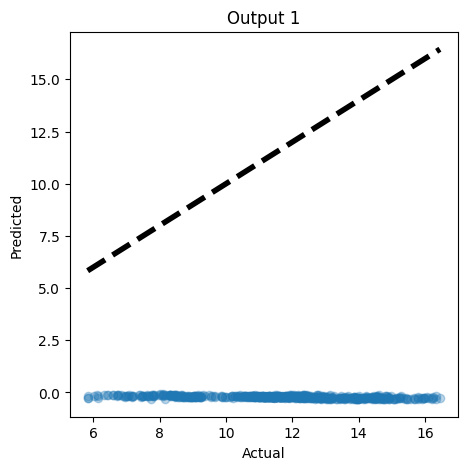

In [ ]:
import matplotlib.pyplot as plt

def plot_parity(y_true, y_preds):
    y_true = y_true.to_numpy()  # convert DataFrame to numpy array

    for i, y_pred in enumerate(y_preds.T):  # iterate over columns (predictions for each output)
        plt.figure(figsize=(5,5))
        plt.scatter(y_true[:, i], y_pred, alpha=0.3)
        plt.plot([y_true[:, i].min(), y_true[:, i].max()], [y_true[:, i].min(), y_true[:, i].max()], 'k--', lw=4)
        plt.xlabel('Actual')
        plt.ylabel('Predicted')
        plt.title(f'Output {i+1}')
        plt.show()

# Call the updated function
plot_parity(y_test, predictions)


In [ ]:
!pip install onnx_tf

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.1/226.1 kB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 612.1/612.1 kB 9.8 MB/s eta 0:00:00


In [ ]:
#export to Tensorflow using ONNX
import torch.onnx
import onnx
from onnx_tf.backend import prepare

# Initialize model
model = RegressionANN(X, y)

# Specify a batch size for the dummy input based on your model's input size
batch_size = 1

# Dummy input for exporting the model to ONNX
dummy_input = torch.randn(batch_size, X.shape[1])

# Export model to ONNX
torch.onnx.export(model, dummy_input, "regression_ann.onnx")

# # Load the ONNX file
# onnx_model = onnx.load('regression_ann.onnx')

# # Convert ONNX model to TensorFlow format
# tf_rep = prepare(onnx_model)

# # Export model as .pb file
# tf_rep.export_graph('regression_ann.pb')

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


============= Diagnostic Run torch.onnx.export version 2.0.1+cu118 =============
verbose: False, log level: Level.ERROR
======================= 0 NONE 0 NOTE 0 WARNING 0 ERROR ========================



In [ ]:
model = model.to(device)
X_test_tensor = X_test_tensor.to(device)



In [ ]:
from sklearn.model_selection import train_test_split

# Assuming X and y are already defined
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Convert to tensors
X_test_tensor = torch.tensor(X_test.values, dtype=torch.float32).to(device)


# Convert to tensors
X_test_tensor = torch.tensor(X_test.values, dtype=torch.float32).to(device)


# Convert X_test to a PyTorch tensor
X_test_tensor = torch.tensor(X_test.values, dtype=torch.float32).to(device)

# Make predictions
with torch.no_grad():
    predictions = model(X_test_tensor).cpu().numpy()

In [ ]:
print("Shape of predictions:", predictions.shape)
print("Shape of y_test:", y_test.shape)  # Assuming y_test is the name of your test labels.


Shape of predictions: (625, 1)
Shape of y_test: (625, 1)


In [ ]:
print(X_test.shape)


(625, 128)


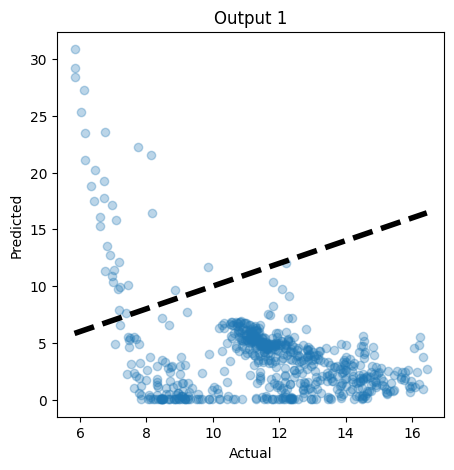

In [ ]:
# Define the path where you want to save the model
model_path = "model.pt"

# Save the model
model.save_model(model_path)

# initialize a new instance with the same architecture
new_model = RegressionANN(X, y, hidden_layers=[3,3], dropout=None, split_ratio=0.2,
                          batch_size=2000, learning_rate=0.05, epochs=2000)

# Ensure the new model is on the same device
new_model = new_model.to(device)

# load the trained weights
new_model.load_model(model_path)

# Convert X_test to a torch tensor and move to the correct device
X_test_tensor = torch.tensor(X_test.values, dtype=torch.float32).to(device)

# Use the tensor for predictions
new_predictions = new_model.predict(X_test_tensor)

# Plot parity for the new predictions
plot_parity(y_test, new_predictions)
